In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.axes as ax
import seaborn as sns
from sklearn.impute import SimpleImputer
import missingno as msno
from sklearn.preprocessing import StandardScaler
import statistics as st
!pip install prophet
from prophet.plot import plot_plotly, plot_components_plotly
from prophet import Prophet

In [2]:
## Reading Dataset 1

In [3]:
df=pd.read_csv('aisdk-2023-10-02.csv')


In [4]:
df['# Timestamp'] = pd.to_datetime(df['# Timestamp'])

In [5]:
## Dataset 2

In [6]:
df1 =pd.read_csv('aisdk-2023-10-03.csv')

In [7]:
df1['# Timestamp'] = pd.to_datetime(df1['# Timestamp'])

In [8]:
## Dataset 3

In [9]:
df2 =pd.read_csv('aisdk-2023-10-04.csv')

In [10]:
df2['# Timestamp'] = pd.to_datetime(df2['# Timestamp'])

In [11]:
## Dataset 4

In [12]:
df3=pd.read_csv('aisdk-2023-10-05.csv')


In [13]:
df3['# Timestamp'] = pd.to_datetime(df3['# Timestamp'])

In [14]:
## Dataset 5

In [15]:
df4 = pd.read_csv('aisdk-2023-10-06.csv')

In [16]:
df4['# Timestamp'] = pd.to_datetime(df4['# Timestamp'])

In [17]:
## Dataset 6

In [18]:
df5 = pd.read_csv('aisdk-2023-10-07.csv')


In [19]:
df5['# Timestamp'] = pd.to_datetime(df5['# Timestamp'])

In [20]:
## Dataset 7

In [21]:
df6 = pd.read_csv('aisdk-2023-10-08.csv')

In [22]:
df6['# Timestamp'] = pd.to_datetime(df6['# Timestamp'])

In [23]:
## Dataset 8

In [24]:
df7 = pd.read_csv('aisdk-2023-10-08.csv')

In [25]:
df7['# Timestamp'] = pd.to_datetime(df7['# Timestamp'])

In [26]:
## Dataset 9

In [27]:
df8 = pd.read_csv('aisdk-2023-10-09.csv')

In [28]:
df8['# Timestamp'] = pd.to_datetime(df8['# Timestamp'])

In [29]:
## Dataset 10

In [30]:
df9 = pd.read_csv('aisdk-2023-10-10.csv')

In [31]:
df9['# Timestamp'] = pd.to_datetime(df9['# Timestamp'])

In [32]:
## Dataset 11

In [33]:
df10 = pd.read_csv('aisdk-2023-10-11.csv')

In [34]:
df10['# Timestamp'] = pd.to_datetime(df10['# Timestamp'])

In [35]:
## Dataset 12

In [36]:
df11 = pd.read_csv('aisdk-2023-10-12.csv')

In [37]:
df11['# Timestamp'] = pd.to_datetime(df11['# Timestamp'])

In [38]:
## Dataset 13

In [39]:
df12 = pd.read_csv('aisdk-2023-10-13.csv')

In [40]:
df12['# Timestamp'] = pd.to_datetime(df12['# Timestamp'])

/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/3097444023.py:1: UserWarning: Parsing dates in %d/%m/%Y %H:%M:%S format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df12['# Timestamp'] = pd.to_datetime(df12['# Timestamp'])


In [41]:
## Dataset 14

In [42]:
df13 = pd.read_csv('aisdk-2023-10-14.csv')

In [43]:
df13['# Timestamp'] = pd.to_datetime(df13['# Timestamp'])

/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2184705975.py:1: UserWarning: Parsing dates in %d/%m/%Y %H:%M:%S format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df13['# Timestamp'] = pd.to_datetime(df13['# Timestamp'])


In [44]:
## Dataset 15

In [45]:
df14 = pd.read_csv('aisdk-2023-10-15.csv')

In [46]:
df14['# Timestamp'] = pd.to_datetime(df14['# Timestamp'])

/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/3724687063.py:1: UserWarning: Parsing dates in %d/%m/%Y %H:%M:%S format when dayfirst=False (the default) was specified. Pass `dayfirst=True` or specify a format to silence this warning.
  df14['# Timestamp'] = pd.to_datetime(df14['# Timestamp'])


## Filter out Missing and Null Values

In [47]:
def preprocess_dataframe(df):
    # Impute missing values for columns 6 to 8 using mean
    imputer_mean = SimpleImputer(missing_values=np.nan, strategy='mean')
    df.iloc[:, 7:9] = imputer_mean.fit_transform(df.iloc[:, 7:9])

    # Impute missing values for column 'Destination' using most frequent
    imputer_most_frequent = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
    df.iloc[:, 12:13] = imputer_most_frequent.fit_transform(df.iloc[:, 12:13])

    # Impute missing values for columns 21 to 24 using mean
    imputer_mean = SimpleImputer(missing_values=np.nan, strategy='mean')
    df.iloc[:, 22:26] = imputer_mean.fit_transform(df.iloc[:, 22:26])

    # Impute missing values for columns 14 to 15 using most frequent
    imputer_most_frequent = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
    df.iloc[:, 15:17] = imputer_most_frequent.fit_transform(df.iloc[:, 15:17])
    
    imputer =SimpleImputer(missing_values =np.nan , strategy ='most_frequent')
    imputer.fit(df.iloc[:,18:19].values)
    df.iloc[:,19:20] = imputer.transform(df.iloc[:,19:20].values)
    
    # Drop specified columns
    columns_to_drop = ['ROT', 'Heading', 'Cargo type', 'Draught', 'ETA']
    df = df.drop(columns=columns_to_drop)

    return df

In [48]:
## Calling out the preprocess dataframe function to fill null values using Categorical and Numerical Values and 
## Dropping columns which has more than 40% null values.

In [49]:
## Calling Df
preprocess_dataframe(df)
df=preprocess_dataframe(df)

In [50]:
preprocess_dataframe(df1)
df1=preprocess_dataframe(df1)

In [51]:
preprocess_dataframe(df2)
df2=preprocess_dataframe(df2)

In [52]:
preprocess_dataframe(df3)
df3=preprocess_dataframe(df3)

In [53]:
preprocess_dataframe(df4)
df4=preprocess_dataframe(df4)

In [54]:
preprocess_dataframe(df5)
df5=preprocess_dataframe(df5)

In [55]:
preprocess_dataframe(df6)
df6=preprocess_dataframe(df6)

In [56]:
preprocess_dataframe(df7)
df7=preprocess_dataframe(df7)

In [57]:
preprocess_dataframe(df8)
df8=preprocess_dataframe(df8)

In [58]:
preprocess_dataframe(df9)
df9=preprocess_dataframe(df9)

In [59]:
preprocess_dataframe(df10)
df10=preprocess_dataframe(df10)

In [60]:
preprocess_dataframe(df11)
df11=preprocess_dataframe(df11)

In [61]:
preprocess_dataframe(df12)
df12=preprocess_dataframe(df12)

In [62]:
preprocess_dataframe(df13)
df13=preprocess_dataframe(df13)

In [63]:
preprocess_dataframe(df14)
df14=preprocess_dataframe(df14)

## Moving Ships

In [64]:
def filter_and_save(df, filename):
    moving_ships = []
    for mmsi, group in df.groupby('MMSI'):
        if len(group['Latitude'].unique()) > 1 or len(group['Longitude'].unique()) > 1:
            moving_ships.append(mmsi)
    
    # Filter out the ships that do not move with time
    filtered_df = df[df['MMSI'].isin(moving_ships)]
    
    # Save the filtered dataset back to the original DataFrame (df)
    df = filtered_df
    
    # Save the filtered dataset to a new CSV file
    df.to_csv(filename, index=True)


In [65]:
filter_and_save(df, 'filtered_dataset.csv')

In [66]:
filter_and_save(df1, 'filtered_dataset1.csv')

In [67]:
filter_and_save(df2, 'filtered_dataset2.csv')

In [68]:
filter_and_save(df3, 'filtered_dataset3.csv')

In [69]:
filter_and_save(df4, 'filtered_dataset4.csv')

In [70]:
filter_and_save(df5, 'filtered_dataset5.csv')

In [71]:
filter_and_save(df6, 'filtered_dataset6.csv')

In [72]:
filter_and_save(df7, 'filtered_dataset7.csv')

In [73]:
filter_and_save(df8, 'filtered_dataset8.csv')

In [74]:
filter_and_save(df9, 'filtered_dataset9.csv')

In [75]:
filter_and_save(df10, 'filtered_dataset10.csv')

In [76]:
filter_and_save(df11, 'filtered_dataset11.csv')

In [77]:
filter_and_save(df12, 'filtered_dataset12.csv')

In [78]:
filter_and_save(df13, 'filtered_dataset13.csv')

In [79]:
filter_and_save(df14, 'filtered_dataset14.csv')

In [80]:
df['Ship type'].unique()

array(['Undefined', 'Cargo', 'Fishing', 'Tug', 'Sailing', 'Passenger',
       'Dredging', 'Pleasure', 'Other', 'Military', 'Port tender',
       'Diving', 'Anti-pollution', 'Pilot', 'Tanker', 'Towing long/wide',
       'SAR', 'Towing', 'HSC', 'Law enforcement', 'Reserved', 'Spare 1',
       'WIG', 'Not party to conflict', 'Medical', 'Spare 2'], dtype=object)

In [81]:
df[df['Ship type']=='Military'].head(70)

,# Timestamp,Type of mobile,MMSI,Latitude,Longitude,Navigational status,SOG,COG,IMO,Callsign,...,Ship type,Width,Length,Type of position fixing device,Destination,Data source type,A,B,C,D
321,2023-02-10 00:00:02,Class A,219000179,91.000000,0.000000,Unknown value,5.182304,177.777507,Unknown,OVLI,...,Military,6.0,25.0,Combined GPS/GLONASS,Unknown,AIS,7.0,18.0,2.0,4.0
741,2023-02-10 00:00:06,Class A,219000553,91.000000,0.000000,Unknown value,5.182304,177.777507,Unknown,OVNS,...,Military,6.0,23.0,GPS,UNKNOWN,AIS,11.0,12.0,2.0,4.0
1068,2023-02-10 00:00:09,Class A,219000186,91.000000,0.000000,Unknown value,5.182304,177.777507,Unknown,OVMP,...,Military,6.0,22.0,GPS,RINGKOEBING,AIS,6.0,16.0,2.0,4.0
1346,2023-02-10 00:00:11,Class A,219000179,91.000000,0.000000,Unknown value,5.182304,177.777507,Unknown,OVLI,...,Military,6.0,25.0,Combined GPS/GLONASS,Unknown,AIS,7.0,18.0,2.0,4.0
1690,2023-02-10 00:00:14,Class A,219000553,55.270162,9.888770,Moored,0.000000,331.300000,Unknown,OVNS,...,Military,6.0,23.0,GPS,UNKNOWN,AIS,11.0,12.0,2.0,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25003,2023-02-10 00:03:38,Class A,219002066,57.432005,10.535792,Moored,0.000000,82.800000,Unknown,OUEF,...,Military,7.0,16.0,GPS,FREDERIKSHAVN,AIS,5.0,11.0,4.0,3.0
25124,2023-02-10 00:03:39,Class A,219000177,55.686360,12.605545,Moored,0.000000,125.000000,Unknown,OVLG,...,Military,6.0,25.0,GPS,Unknown,AIS,7.0,18.0,2.0,4.0
25331,2023-02-10 00:03:41,Class A,219000121,55.824582,11.737432,Under way using engine,0.000000,233.500000,Unknown,OUGI,...,Military,6.0,20.0,GPS,3.0,AIS,6.0,14.0,2.0,4.0
25542,2023-02-10 00:03:42,Class A,219158000,56.441607,10.977582,Under way using engine,7.100000,180.600000,Unknown,OUDH,...,Military,8.0,37.0,GPS,Unknown,AIS,30.0,7.0,4.0,4.0


In [82]:
military_df = df[df['Ship type'] == 'Military']

# Display the first 60 rows of the filtered DataFrame
tanker_head_60 = military_df.head(60)

# Find the unique MMSI values for tankers
unique_mmsi_tankers = military_df['MMSI'].unique()
unique_mmsi_tankers

array([219000179, 219000553, 219000186, 219000549, 219002066, 220435000,
       219002067, 220436000, 219000417, 219000121, 220432000, 219000167,
       219000183, 219262000, 219000177, 219000159, 220434000, 220431000,
       219000182, 219000178, 219158000, 211210280, 219000189, 219000217,
       219000174, 211212720, 220429000, 265500770, 219000554, 219000187,
       219000126, 219000125, 219263000, 219000175, 219005567, 219024604,
       219000416, 219517000, 219000191, 219000166, 219000185, 219000474,
       219000193, 219000181, 219000184, 211211500, 219012553, 219000188,
       219000161, 211211850, 219000155, 219000551, 211210160, 219000471,
       265582600, 211211160])

In [83]:
#MIlitary
219000179
219000553
219000186
219000549 
219002066
220435000
219002067
220436000
219000417
219000121
220432000
219000167
219000183
219262000
219000177
219000159
220434000
220431000
219000182 
219000178
219158000

219158000

## Create TIme Series

resampled_df = df.resample(f'{interval_minutes}T').first().reset_index()

resampled_df = df.groupby([pd.Grouper(freq=f'{interval_minutes}T'), 'MMSI']).mean().reset_index()

In [84]:
def create_time_series(start_date, end_date, df, interval_minutes, columns, noise_levels=None):

    # Set the 'Timestamp' column as the index
    df.set_index('# Timestamp', inplace=True)

    # Resample the DataFrame to get one data point per minute
    resampled_df = df.resample(f'{interval_minutes}min').first().reset_index()
    
    resampled_df = df.groupby([pd.Grouper(freq=f'{interval_minutes}1min'), 'MMSI']).min().reset_index()
    
    # Generate datetime range with even intervals
    date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')

    # Create a DataFrame with datetime values
    new_df = pd.DataFrame(date_rng, columns=['ds'])

    # Merge resampled data with the new DataFrame on the 'ds' column
    new_df = pd.merge(new_df, resampled_df, how='left', left_on='ds', right_on='# Timestamp')

    # Drop the redundant '# Timestamp' column
    new_df.drop('# Timestamp', axis=1, inplace=True)

    # Generate time series values for each specified column
    for col, noise_level in zip(columns, noise_levels):
        if col.lower() == 'Latitude':
            new_df[col] = df[col]
        elif col.lower() == 'Longitude':
            new_df[col] = df[col]
        elif col.lower() =='SOG':
            new_df[col] =df[col]
        elif col.lower() =='COG':
            new_df[col] =df[col]    
        else:
            new_df[col] = np.random.normal(0, noise_level, len(new_df)) + np.sin(np.linspace(0, 4 * np.pi, len(new_df)))

    return new_df



def plot_time_series(df, columns):
    for col in columns:
        plt.figure(figsize=(10, 6))
        plt.plot(df['ds'], df[col], label=col)
        plt.title(f'Time Series Plot for Dataset df  - {col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()


In [85]:
def plot_time_series(df, columns, window=7):
    for col in columns:
        # Calculate moving average
        df['Moving Average'] = df[col].rolling(window=window).mean()
        
        plt.figure(figsize=(10, 6))
        plt.plot(df['ds'], df[col], label=col)
        plt.plot(df['ds'], df['Moving Average'], label=f'{col} - Moving Average', linestyle='--', color='red')
        plt.title(f'Time Series Plot for Dataset df - {col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()

## Menu-driven code
mmsi = input("Enter MMSI: ")  # Get the MMSI from the user
while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG ")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-5): ")
    
    if choice in ['1', '2', '3', '4']:
        #mmsi = input("Enter MMSI: ")  # Get the MMSI from the user
        df_subset = df[df['MMSI'] == int(mmsi)]  # Subset the dataset based on the given MMSI
        columns = ['SOG'] if choice == '1' else ['COG'] if choice == '2' else ['Latitude'] if choice == '3' else ['Longitude']
        noise_levels = [0.5] if choice == '1' else [0.3]  # Adjust noise levels as needed

        time_series_data = create_time_series(start_date='2022-10-02',end_date='2022-10-03',df=df_subset, interval_minutes=1, columns=columns, noise_levels=noise_levels)
        plot_time_series(time_series_data, columns)
    elif choice == '5':
        print("Exiting the program. Goodbye!")
        break
    else:
        print("Invalid choice. Please enter a number from 1 to 5.")


In [86]:
## Training and Testing

In [87]:
from prophet.plot import plot_plotly, plot_components_plotly
from prophet import Prophet
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error


In [88]:
def plot_prophet_forecast(train_data, test_data, forecast, columns, window=7):
    for col in columns:
        # Compute moving average
        test_data['Moving Average'] = test_data['y'].rolling(window=window).mean()
        
        plt.figure(figsize=(10, 6))
        plt.plot(train_data['ds'], train_data['y'], label=f'{col} - Training Data')
        plt.plot(test_data['ds'], test_data['y'], label=f'{col} - Actual Test Data')
        plt.plot(test_data['ds'], forecast[-len(test_data):]['yhat'], label=f'{col} - Forecast')
        plt.plot(test_data['ds'], test_data['Moving Average'], label=f'{col} - Moving Average', linestyle='--', color='red')
        plt.title(f'Time Series Forecast for DF - {col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()


In [89]:
# https://www.tutorialspoint.com/python-program-to-calculate-standard-deviation#:~:text=The%20statistics%20module%20in%20python,calculates%20the%20population%20standard%20deviation.


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 1
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/3996296022.py:12: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:45:22 - cmdstanpy - INFO - Chain [1] start processing
19:45:22 - cmdstanpy - INFO - Chain [1] done processing


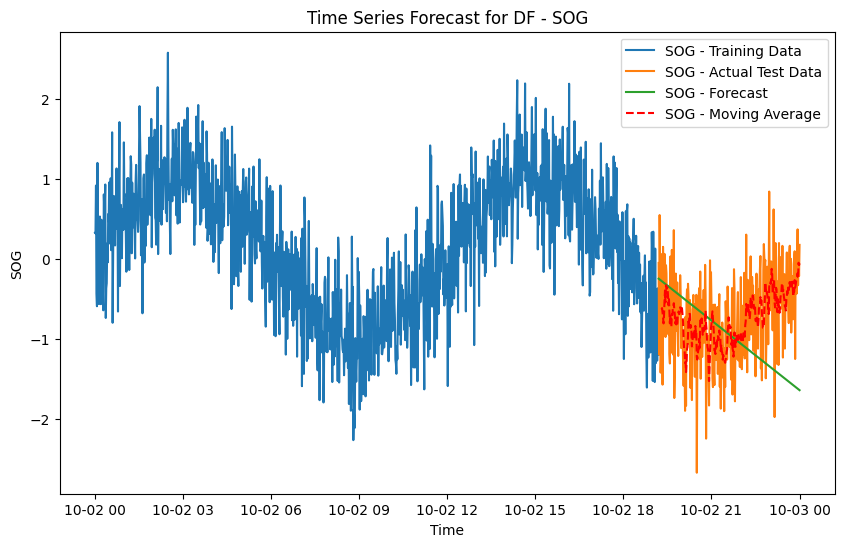

Mean Squared Error: 0.6374067499254608
Standard Deviation :  0.7715169700810319


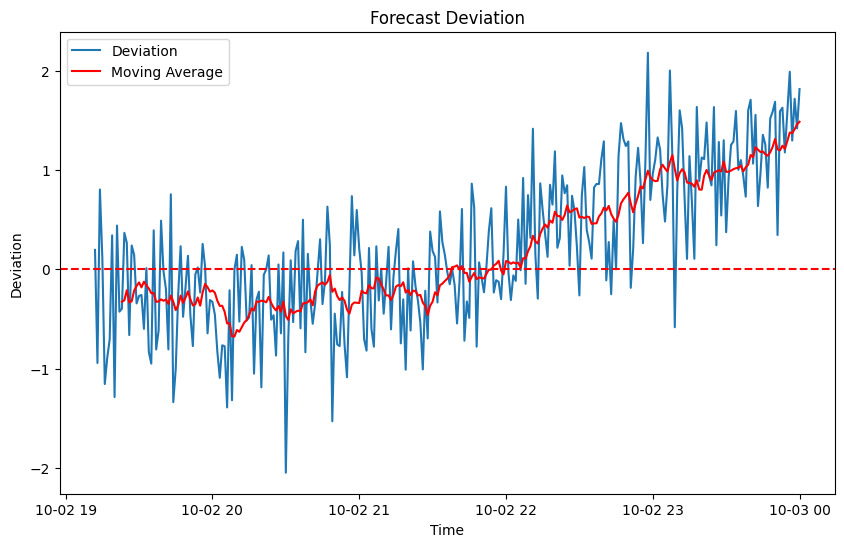


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 2
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/3996296022.py:12: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:45:27 - cmdstanpy - INFO - Chain [1] start processing
19:45:27 - cmdstanpy - INFO - Chain [1] done processing


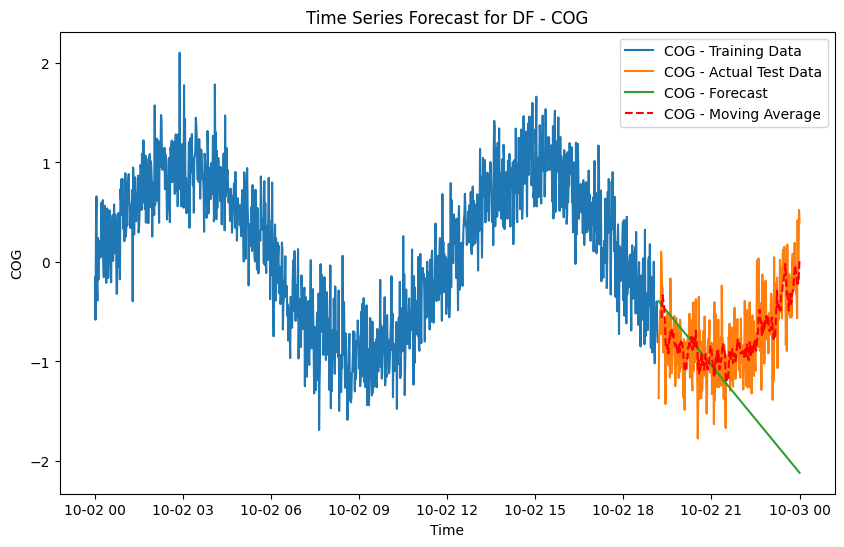

Mean Squared Error: 0.8478440221838806
Standard Deviation :  0.7677072082505024


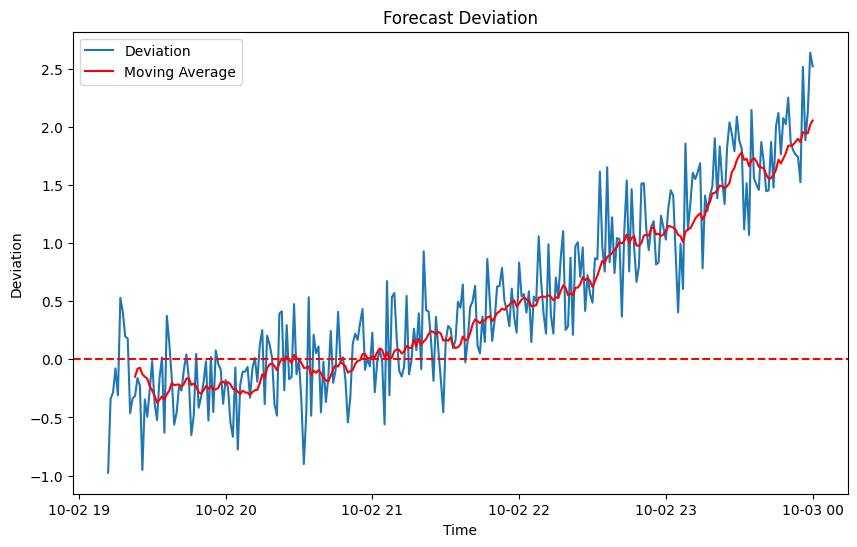


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 3
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/3996296022.py:12: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:45:29 - cmdstanpy - INFO - Chain [1] start processing
19:45:29 - cmdstanpy - INFO - Chain [1] done processing


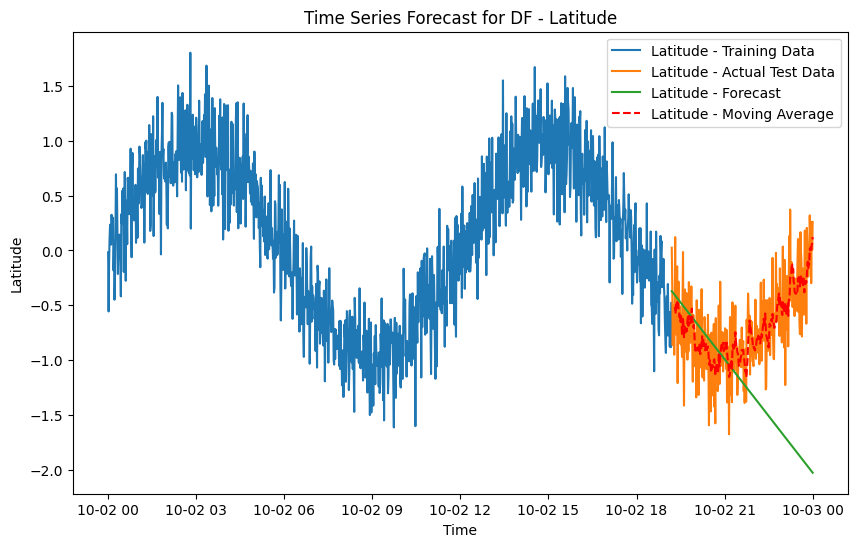

Mean Squared Error: 0.8046271363188183
Standard Deviation :  0.7400553926392622


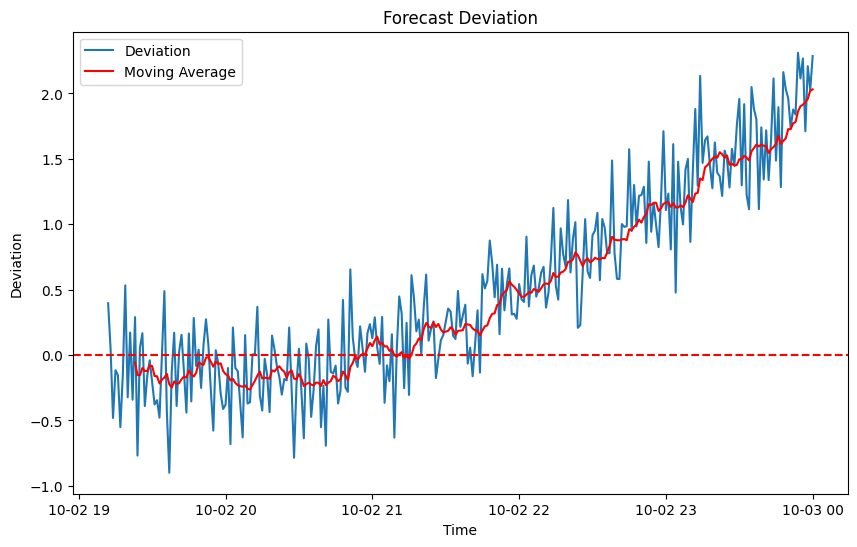


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 4
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/3996296022.py:12: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:45:30 - cmdstanpy - INFO - Chain [1] start processing
19:45:30 - cmdstanpy - INFO - Chain [1] done processing


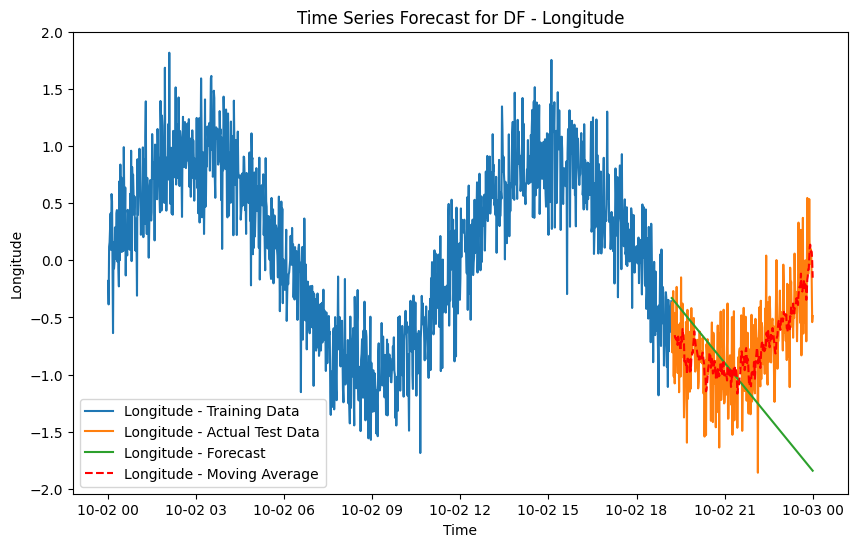

Mean Squared Error: 0.6309947368594655
Standard Deviation :  0.7117105487931608


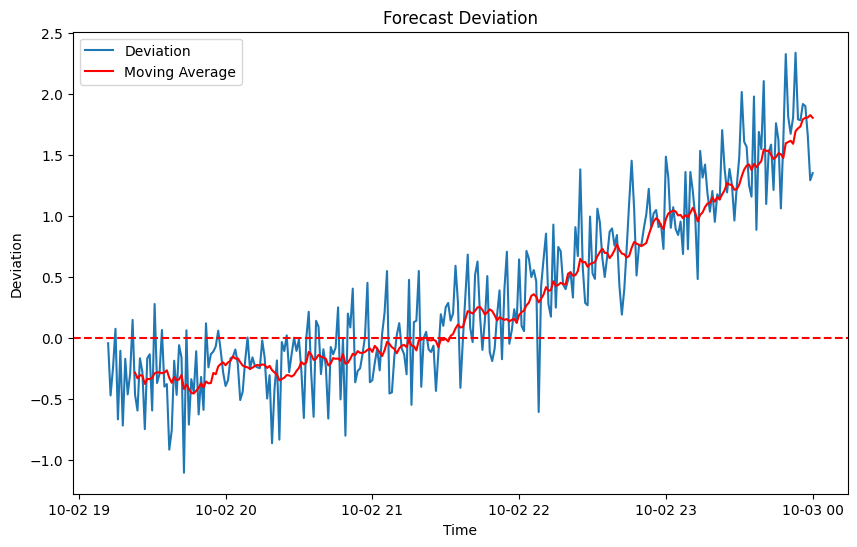


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 5
Exiting the program. Goodbye!


In [91]:
combined_data = pd.DataFrame()

while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-4): ")

    if choice == '5':
        print("Exiting the program. Goodbye!")
        break
    elif choice in ['1', '2', '3','4']:
        try:
            mmsi = input("Enter MMSI: ")  # Get the MMSI from the user
            df_subset = df[df['MMSI'] == int(mmsi)]  # Subset the dataset based on the given MMSI
        except ValueError:
            print("Invalid input. Please enter a valid integer for the interval.")
            continue

        if choice == '1':
            columns = ['SOG']
            noise_levels = [0.5]
        elif choice =='2':
            columns=['COG']
            noise_levels=[0.3]
        elif choice == '3':
            columns = ['Latitude']
            noise_levels = [0.3]
        elif choice == '4':
            columns = ['Longitude']
            noise_levels = [0.3]
    else:
        print("Invalid choice. Please enter a number from 1 to 4.")
        continue
    
    time_series_data = create_time_series(start_date='2023-10-02', end_date='2023-10-03',df=df_subset, interval_minutes=1, columns=columns, noise_levels=noise_levels)
    
    # Append to the DataFrame
    #df_all_time_series_data = pd.concat([df_all_time_series_data,time_series_data])
    combined_data = pd.concat([combined_data, time_series_data[columns]], axis=1)

    
    # Split data into training and testing sets (80% training, 20% testing)
    train_data, test_data = train_test_split(time_series_data, test_size=0.2, shuffle=False)

    # Rename columns to 'ds' and 'y' for Prophet
    train_data.rename(columns={columns[0]: 'y'}, inplace=True)
    test_data.rename(columns={columns[0]: 'y'}, inplace=True)

    # Convert 'ds' column to datetime format
    train_data['ds'] = pd.to_datetime(train_data['ds'])
    test_data['ds'] = pd.to_datetime(test_data['ds'])

    # Train Prophet model
    prophet_model = Prophet()
    prophet_model.fit(train_data)
    
    #plot_prophet_loss(prophet_model)

    # Create a dataframe with future dates for prediction
    future = prophet_model.make_future_dataframe(periods=len(test_data), freq='1min')

    # Make predictions
    forecast = prophet_model.predict(future)

    # Plot the forecast and actual test data
    plot_prophet_forecast(train_data, test_data, forecast, columns)

    # Evaluate performance using mean squared error
    mse = mean_squared_error(test_data['y'], forecast[-len(test_data):]['yhat'])
    print(f'Mean Squared Error: {mse}')
    
    # Calculate deviation
    #test_data['deviation'] = ((test_data['y'] - forecast[-len(test_data):]['yhat'])/test_data['y']) * 100
    
    test_data['deviation'] = (test_data['y'] - forecast[-len(test_data):]['yhat'])
    
    # Calculate deviation percentage using stdev function
    sd = st.stdev(test_data['deviation']) 
    print("Standard Deviation : ", sd)
    
    # Calculate moving average
    window_size = 12  # You can adjust the window size as needed
    test_data['moving_average'] = test_data['deviation'].rolling(window=window_size).mean()
    
    # Visualize deviation
    plt.figure(figsize=(10, 6))
    plt.plot(test_data['ds'], test_data['deviation'], label='Deviation')
    plt.plot(test_data['ds'], test_data['moving_average'], color='red', label='Moving Average')
    plt.axhline(y=0, color='r', linestyle='--')
    plt.title('Forecast Deviation')
    plt.xlabel('Time')
    plt.ylabel('Deviation')
    plt.legend()
    plt.show()
    
    
    
    
    
    

In [92]:
combined_data

,SOG,COG,Latitude,Longitude
0,0.323357,-0.155061,-0.016830,-0.179949
1,0.315885,-0.581238,-0.556230,-0.385583
2,0.914108,0.344985,-0.103316,0.119060
3,-0.434664,0.658695,0.116240,0.157335
4,-0.594001,-0.245701,0.234424,0.282610
...,...,...,...,...
1436,0.366509,0.419241,0.263509,0.099711
1437,-0.331106,-0.217885,-0.298689,0.077588
1438,0.084829,0.018787,0.193640,-0.170509
1439,-0.217395,0.523024,0.004236,-0.540529


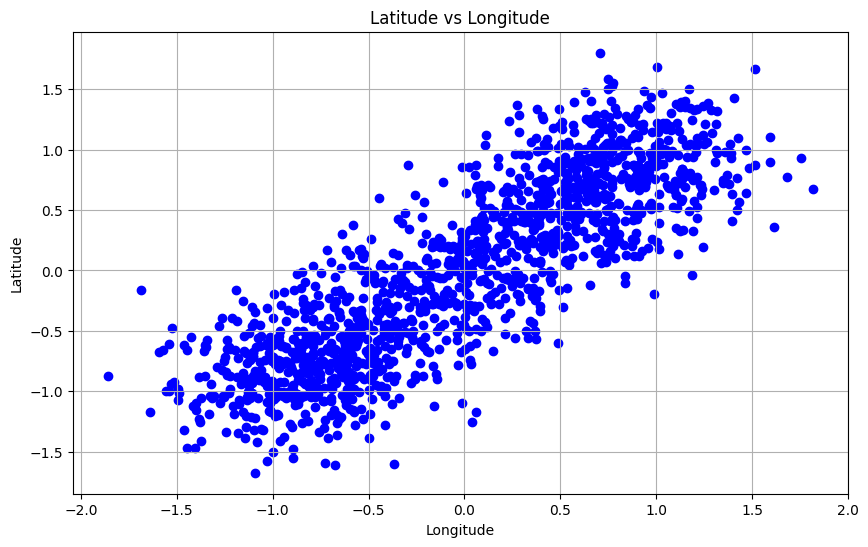

In [93]:
# Extract Latitude and Longitude
latitude = combined_data['Latitude']
longitude = combined_data['Longitude']

# Create the scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(longitude, latitude, color='blue', marker='o')

# Set plot labels and title
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Latitude vs Longitude')

# Show the plot
plt.grid(True)
plt.show()


## 2nd Dataset

In [94]:
def create_time_series1(start_date,end_date,df1, interval_minutes, columns, noise_levels=None):
    
    # Set the 'Timestamp' column as the index
    df1.set_index('# Timestamp', inplace=True)
    
   # df1_subset['# Timestamp'] = pd.to_datetime(df1_subset['# Timestamp'])
   # df1_subset.set_index('# Timestamp', inplace=True)
    # Resample the DataFrame to get one data point per minute
    resampled_df1 = df1.resample(f'{interval_minutes}1min').first().reset_index()
    
    resampled_df1 = df1.groupby([pd.Grouper(freq=f'{interval_minutes}1min'), 'MMSI']).min().reset_index()
    
    
    # Generate datetime range with even intervals
    date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')

    # Create a DataFrame with datetime values
    new_df = pd.DataFrame(date_rng, columns=['ds'])
    
    new_df = pd.merge(new_df, resampled_df1, how='left', left_on='ds', right_on='# Timestamp')

    # Drop the redundant '# Timestamp' column
    new_df.drop('# Timestamp', axis=1, inplace=True)

    # Generate time series values for each specified column
    for col, noise_level in zip(columns, noise_levels):
        #np.random.seed(42)
        if col.lower() == 'Latitude':
            new_df[col] = df[col]
        elif col.lower() == 'Longitude':
            new_df[col] = df[col]
        elif col.lower() == 'SOG':
            new_df[col] = df[col] 
        elif col.lower() == 'COG':
            new_df[col] = df[col]    
        else:
            new_df[col] = np.sin(np.linspace(0, 4 * np.pi, len(new_df))) + np.random.normal(0, noise_level, len(new_df))

    return new_df


def plot_time_series1(df1, columns,window=7):
    for col in columns:
        # Calculate moving average
        df1['Moving Average'] = df1[col].rolling(window=window).mean()
        
        
        plt.figure(figsize=(10, 6))
        plt.plot(df1['ds'], df1[col], label=col)
        plt.plot(df1['ds'], df['Moving Average'], label=f'{col} - Moving Average', linestyle='--', color='red')
        plt.title(f'Time Series Plot - {col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()

In [95]:
def plot_time_series1(df1, columns, window=7):
    for col in columns:
        # Calculate moving average
        df1['Moving Average'] = df1[col].rolling(window=window).mean()
        
        plt.figure(figsize=(10, 6))
        plt.plot(df1['ds'], df1[col], label=col)
        plt.plot(df1['ds'], df1['Moving Average'], label=f'{col} - Moving Average', linestyle='--', color='red')
        plt.title(f'Time Series Plot for Dataset df1 - {col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()

# Menu-driven code
while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG ")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-5): ")

    if choice in ['1', '2', '3', '4']:
        mmsi = input("Enter MMSI: ")  # Get the MMSI from the user
        df1_subset = df1[df1['MMSI'] == int(mmsi)]  # Subset the dataset based on the given MMSI
        columns = ['SOG'] if choice == '1' else ['COG'] if choice == '2' else ['Latitude'] if choice == '3' else ['Longitude']
        noise_levels = [0.5] if choice == '1' else [0.3]  # Adjust noise levels as needed

       
        time_series_data1 = create_time_series1(start_date='2022-10-03', end_date='2022-10-04', df1=df1_subset, interval_minutes=1, columns=columns, noise_levels=noise_levels)

        plot_time_series1(time_series_data1, columns)
    elif choice == '5':
        print("Exiting the program. Goodbye!")
        break
    else:
        print("Invalid choice. Please enter a number from 1 to 5.")


In [96]:
def plot_prophet_forecast1(train_data, test_data, forecast, columns, window=7):
    for col in columns:
        
        test_data['Moving Average'] = test_data['y'].rolling(window=window).mean()
        
        plt.figure(figsize=(10, 6))
        plt.plot(train_data['ds'], train_data['y'], label=f'{col} - Training Data')
        plt.plot(test_data['ds'], test_data['y'], label=f'{col} - Actual Test Data')
        plt.plot(test_data['ds'], forecast[-len(test_data):]['yhat'], label=f'{col} - Forecast')
        plt.plot(test_data['ds'], test_data['Moving Average'], label=f'{col} - Moving Average', linestyle='--', color='red')
        
        plt.title(f'Time Series Forecast for Dataset1 - {col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 1
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/1523853393.py:15: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:45:36 - cmdstanpy - INFO - Chain [1] start processing
19:45:36 - cmdstanpy - INFO - Chain [1] done processing


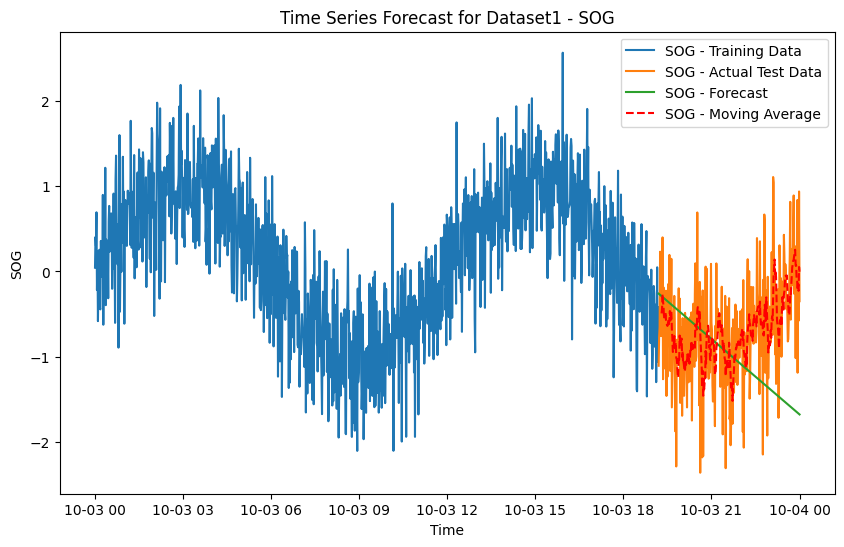

Mean Squared Error: 0.7920679519816446
Standard Deviation :  0.8473405242451467


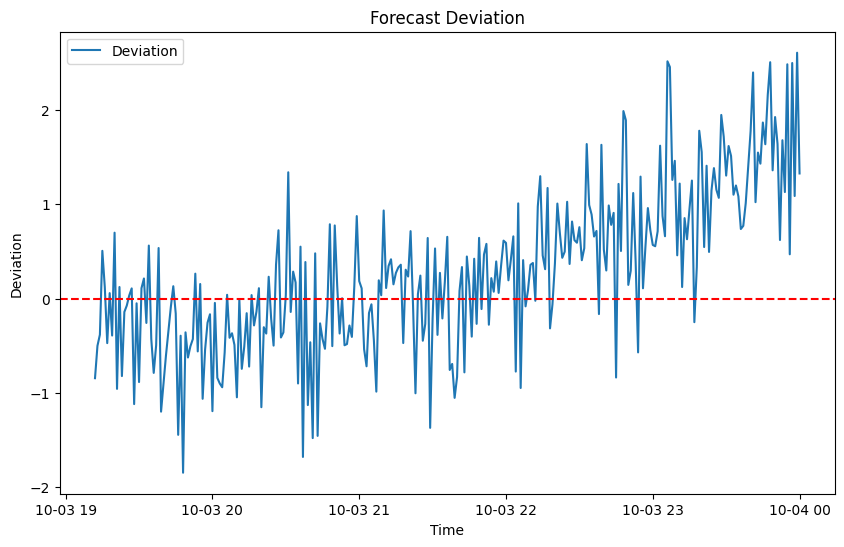


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 2
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/1523853393.py:15: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:45:37 - cmdstanpy - INFO - Chain [1] start processing
19:45:38 - cmdstanpy - INFO - Chain [1] done processing


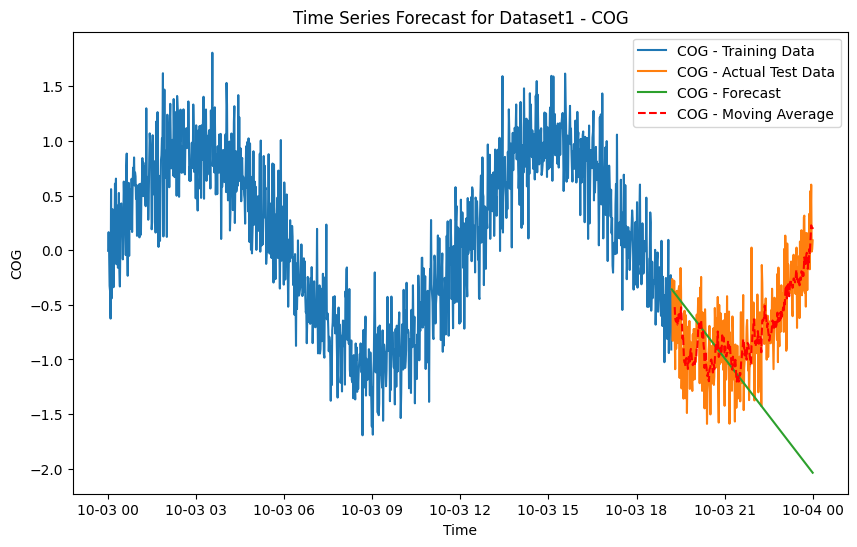

Mean Squared Error: 0.8733978020663969
Standard Deviation :  0.7997155063546266


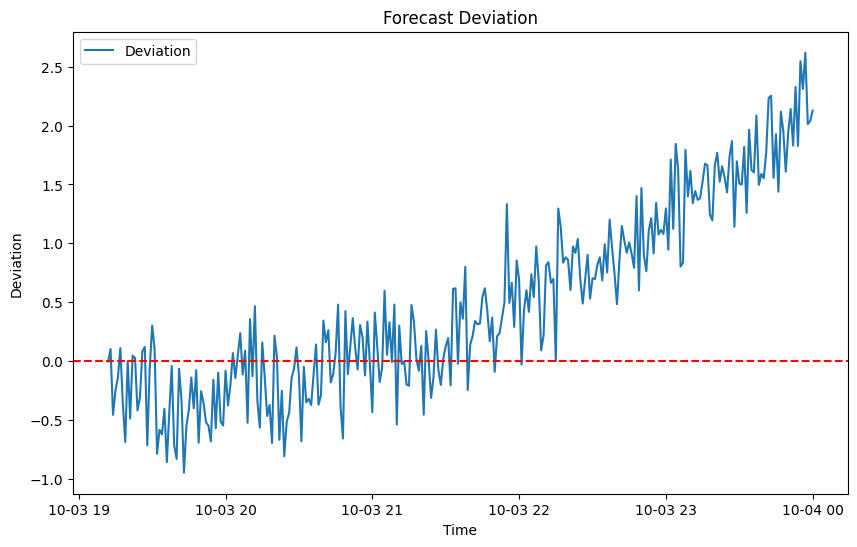


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 3
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/1523853393.py:15: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:45:39 - cmdstanpy - INFO - Chain [1] start processing
19:45:39 - cmdstanpy - INFO - Chain [1] done processing


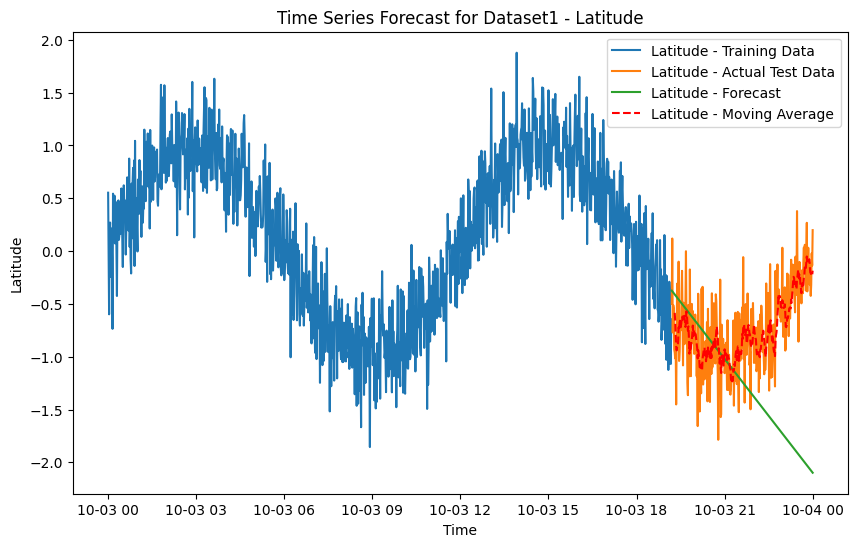

Mean Squared Error: 0.8221973081191927
Standard Deviation :  0.7601662717951063


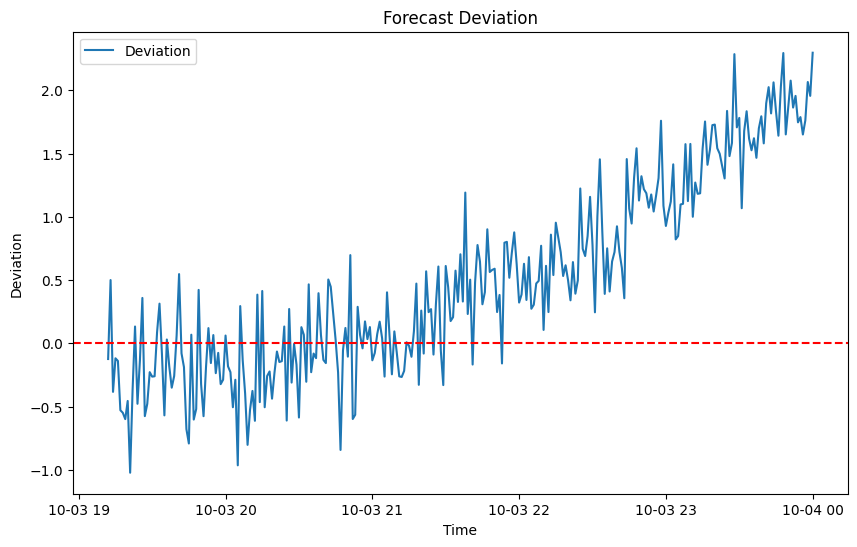


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 4
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/1523853393.py:15: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:45:40 - cmdstanpy - INFO - Chain [1] start processing
19:45:40 - cmdstanpy - INFO - Chain [1] done processing


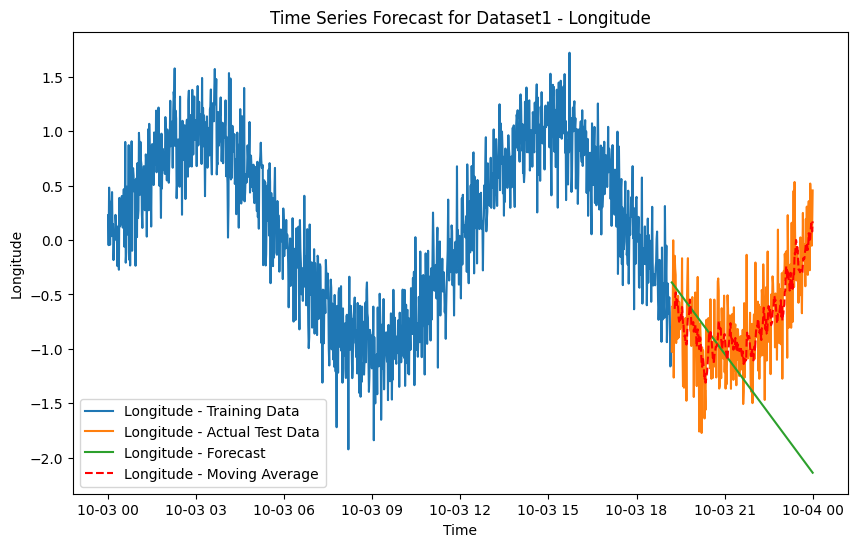

Mean Squared Error: 0.9710055814860106
Standard Deviation :  0.8214999154795736


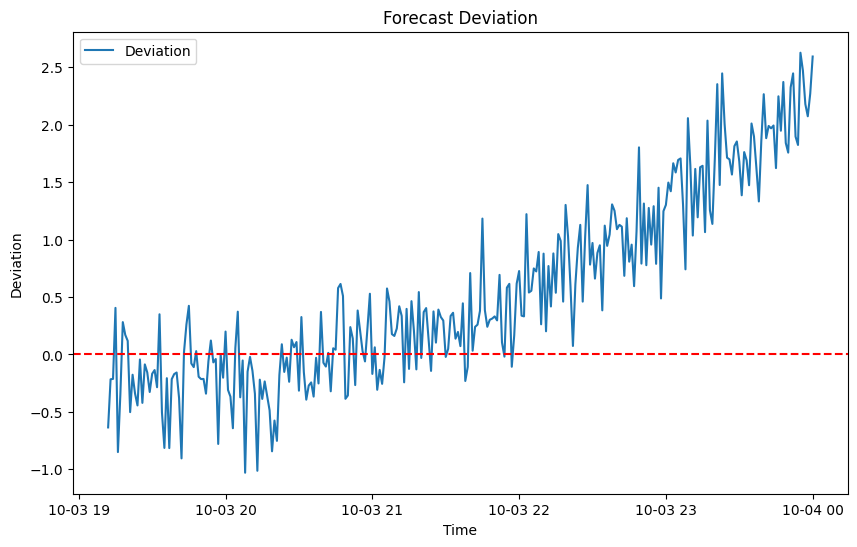


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 5
Exiting the program. Goodbye!


In [97]:
#df_all_time_series_data1 = pd.DataFrame()
combined_data1 = pd.DataFrame()
while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-4): ")

    if choice == '5':
        print("Exiting the program. Goodbye!")
        break
    elif choice in ['1', '2', '3', '4']:
        try:
            mmsi = input("Enter MMSI: ")  # Get the MMSI from the user
            df1_subset = df1[df1['MMSI'] == int(mmsi)]  # Subset the dataset based on the given MMSI
            
        except ValueError:
            print("Invalid input. Please enter a valid integer for the interval.")
            continue

        if choice == '1':
            columns = ['SOG']
            noise_levels = [0.5]
        elif choice == '2':
            columns = ['COG']
            noise_levels = [0.3]
        elif choice == '3':
            columns = ['Latitude']
            noise_levels = [0.3]
        elif choice == '4':
            columns = ['Longitude']
            noise_levels = [0.3]
        else:
            print("Invalid choice. Please enter a number from 1 to 4.")
            continue
        
        # Generate time series data
        time_series_data1 = create_time_series1(start_date='2023-10-03', end_date='2023-10-04', df1=df1_subset, interval_minutes=1, columns=columns, noise_levels=noise_levels)
        
        # Append to the DataFrame
        #df_all_time_series_data1 = pd.concat([df_all_time_series_data1, time_series_data1])
        combined_data1 = pd.concat([combined_data1, time_series_data1[columns]], axis=1)

        # Split data into training and testing sets (80% training, 20% testing)
        train_data, test_data = train_test_split(time_series_data1, test_size=0.2, shuffle=False)

        # Rename columns to 'ds' and 'y' for Prophet
        train_data.rename(columns={columns[0]: 'y'}, inplace=True)
        test_data.rename(columns={columns[0]: 'y'}, inplace=True)

        # Convert 'ds' column to datetime format
        train_data['ds'] = pd.to_datetime(train_data['ds'])
        test_data['ds'] = pd.to_datetime(test_data['ds'])

        # Train Prophet model
        prophet_model = Prophet()
        prophet_model.fit(train_data)

        # Create a dataframe with future dates for prediction
        future = prophet_model.make_future_dataframe(periods=len(test_data), freq='1min')

        # Make predictions
        forecast = prophet_model.predict(future)

        # Plot the forecast and actual test data
        plot_prophet_forecast1(train_data, test_data, forecast, columns)

        # Evaluate performance using mean squared error
        mse = mean_squared_error(test_data['y'], forecast[-len(test_data):]['yhat'])
        print(f'Mean Squared Error: {mse}')

        # Calculate deviation
        test_data['deviation'] = test_data['y'] - forecast[-len(test_data):]['yhat']
        
        # Calculate deviation percentage using stdev function
        sd = st.stdev(test_data['deviation']) 
        print("Standard Deviation : ", sd)
        
        
        # Visualize deviation
        plt.figure(figsize=(10, 6))
        plt.plot(test_data['ds'], test_data['deviation'], label='Deviation')
        plt.axhline(y=0, color='r', linestyle='--')
        plt.title('Forecast Deviation')
        plt.xlabel('Time')
        plt.ylabel('Deviation')
        plt.legend()
        plt.show()
        #220068000

In [98]:
combined_data1

,SOG,COG,Latitude,Longitude
0,0.044684,-0.005562,0.552578,0.227757
1,0.405150,0.164830,-0.084931,-0.047577
2,0.300686,-0.005471,-0.598738,0.481073
3,0.693966,-0.326833,0.177065,0.325187
4,-0.217718,-0.376872,0.269955,-0.043624
...,...,...,...,...
1436,-1.187201,0.298477,-0.424193,0.358153
1437,0.838567,0.600018,-0.318405,0.059314
1438,-0.578336,-0.013175,-0.021419,-0.052733
1439,0.938077,0.008774,-0.136835,0.138524


In [99]:
## Concatenate Two Dataframes df and df1 

In [100]:
df1_2 = pd.concat([combined_data, combined_data1], axis=0)


In [101]:
df1_2.to_csv('df1_2.csv')

In [102]:
df1_2

,SOG,COG,Latitude,Longitude
0,0.323357,-0.155061,-0.016830,-0.179949
1,0.315885,-0.581238,-0.556230,-0.385583
2,0.914108,0.344985,-0.103316,0.119060
3,-0.434664,0.658695,0.116240,0.157335
4,-0.594001,-0.245701,0.234424,0.282610
...,...,...,...,...
1436,-1.187201,0.298477,-0.424193,0.358153
1437,0.838567,0.600018,-0.318405,0.059314
1438,-0.578336,-0.013175,-0.021419,-0.052733
1439,0.938077,0.008774,-0.136835,0.138524


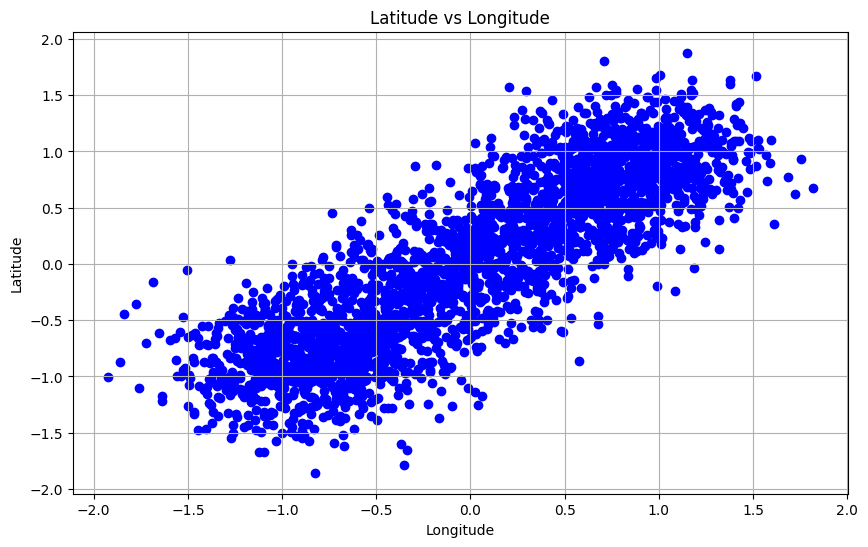

In [103]:
# Extract Latitude and Longitude
latitude = df1_2['Latitude']
longitude = df1_2['Longitude']

# Create the scatter plot
plt.figure(figsize=(10, 6))
plt.scatter(longitude, latitude, color='blue', marker='o')

# Set plot labels and title
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Latitude vs Longitude')

# Show the plot
plt.grid(True)
plt.show()


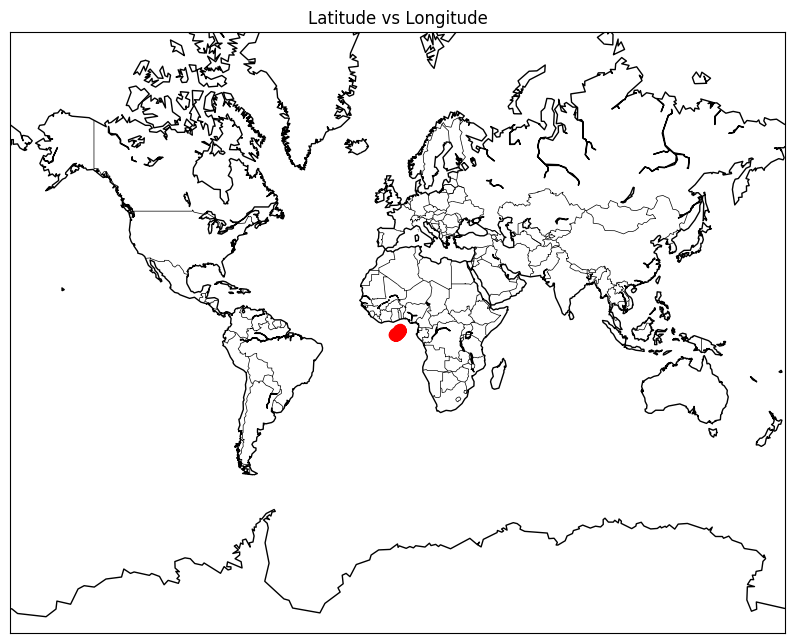

In [104]:
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

# Create a Basemap instance
plt.figure(figsize=(10, 8))
m = Basemap(projection='merc',llcrnrlat=-80,urcrnrlat=80,\
            llcrnrlon=-180,urcrnrlon=180,lat_ts=20,resolution='c')

# Convert latitude and longitude to map coordinates
x, y = m(df1_2['Longitude'].values, df1_2['Latitude'].values)

# Plot points on the map
m.scatter(x, y, marker='o', color='r', alpha=0.7)

# Draw coastlines and countries
m.drawcoastlines()
m.drawcountries()

# Add title and show the plot
plt.title('Latitude vs Longitude')
plt.show()


## DF1 and DF2 Prediction


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 1


19:45:43 - cmdstanpy - INFO - Chain [1] start processing
19:45:43 - cmdstanpy - INFO - Chain [1] done processing


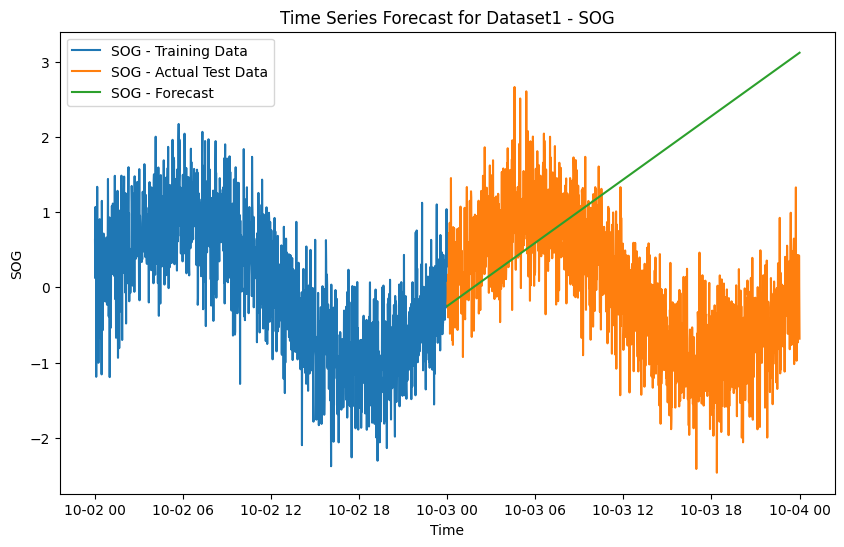

Mean Squared Error: 4.766237035052265
Standard Deviation :  1.6363823545108391


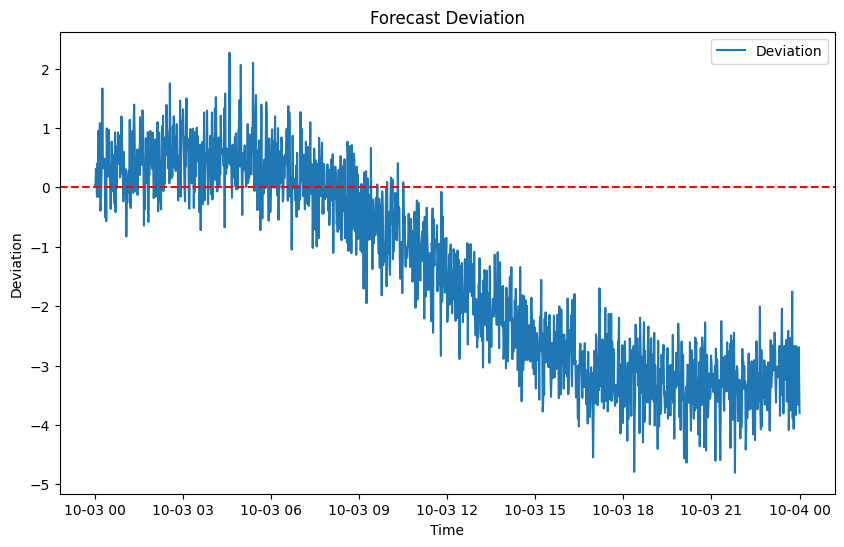


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 2


19:45:44 - cmdstanpy - INFO - Chain [1] start processing
19:45:44 - cmdstanpy - INFO - Chain [1] done processing


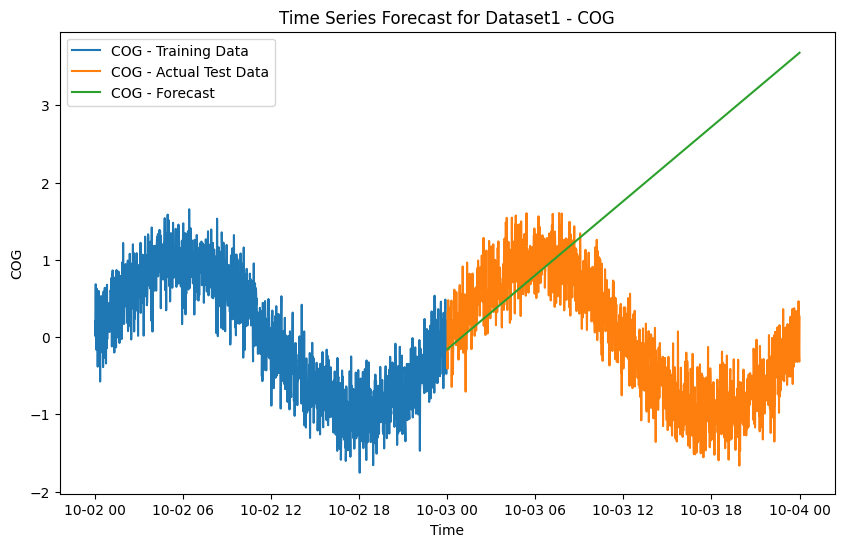

Mean Squared Error: 6.135322792966267
Standard Deviation :  1.7489510759641644


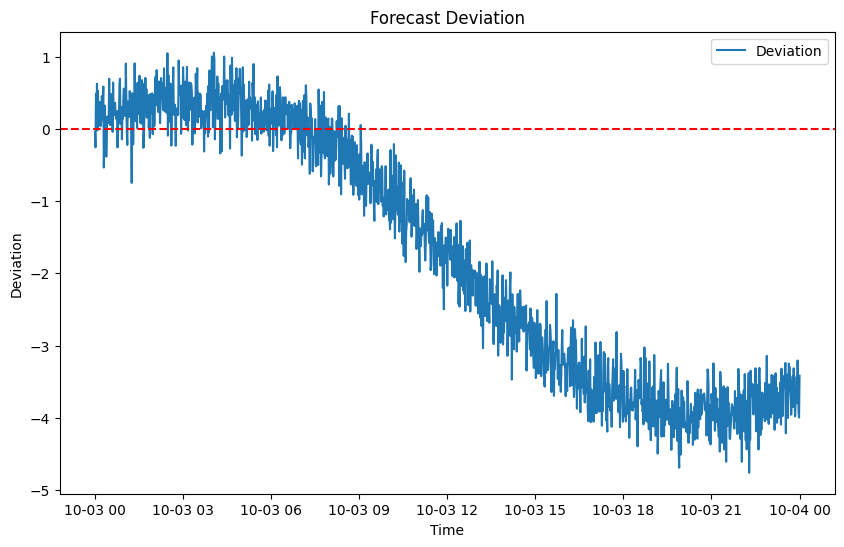


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 3


19:45:45 - cmdstanpy - INFO - Chain [1] start processing
19:45:45 - cmdstanpy - INFO - Chain [1] done processing


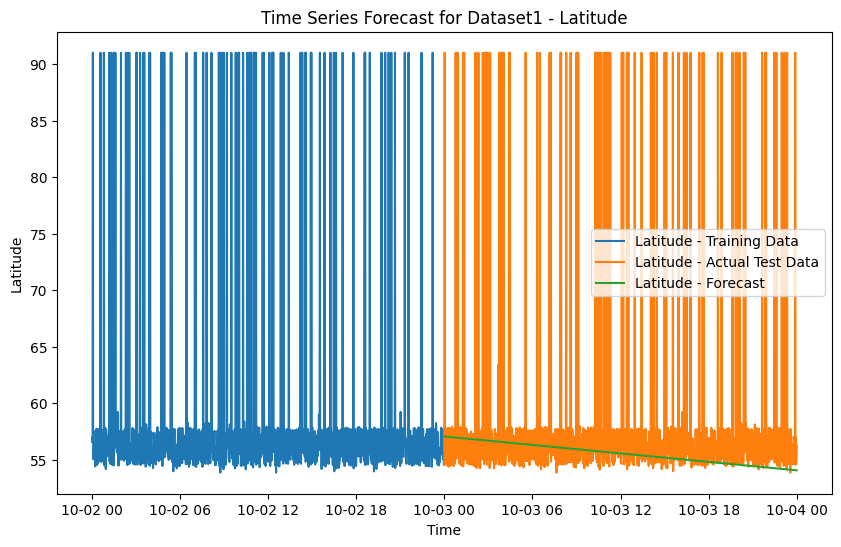

Mean Squared Error: 71.8229985338943
Standard Deviation :  8.111281074684683


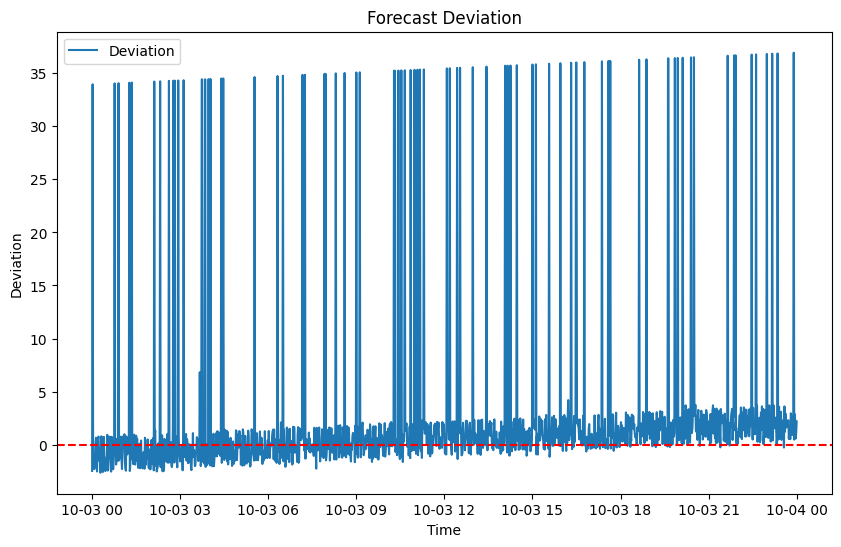


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 4


19:45:46 - cmdstanpy - INFO - Chain [1] start processing
19:45:46 - cmdstanpy - INFO - Chain [1] done processing


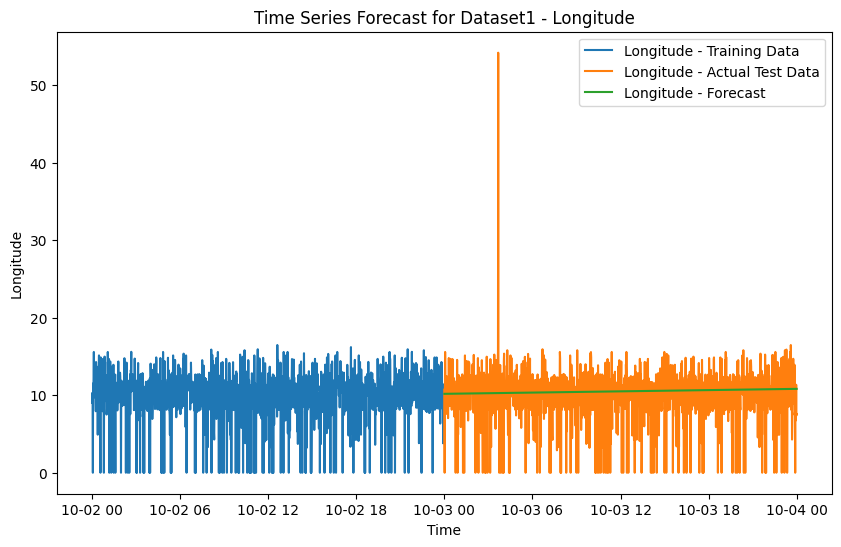

Mean Squared Error: 12.57382377507987
Standard Deviation :  3.508789250201828


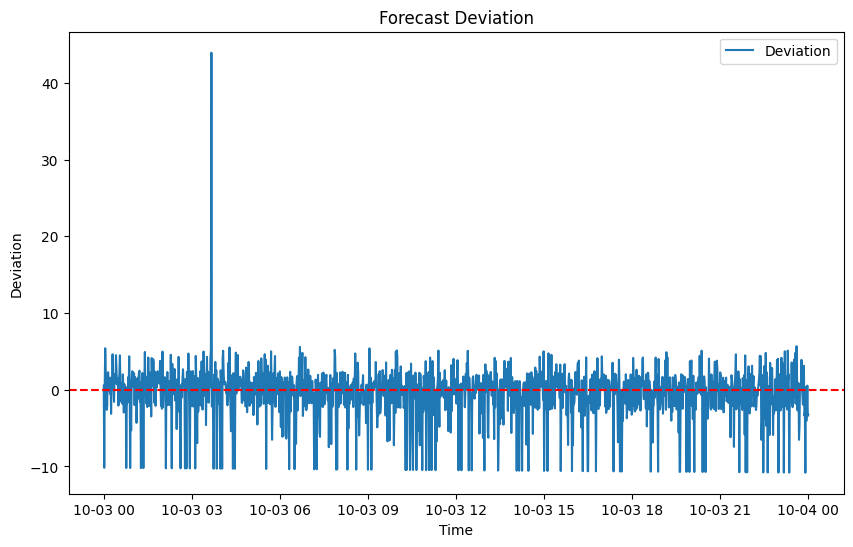


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 5
Exiting the program. Goodbye!


In [105]:
def create_time_series12(start_date,end_date,df1_2, interval_minutes, columns, noise_levels=None):
    # Generate datetime range with even intervals
    date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}min')

    # Create a DataFrame with datetime values
    new_df = pd.DataFrame(date_rng, columns=['ds'])

    # Generate time series values for each specified column
    for col, noise_level in zip(columns, noise_levels):
        #np.random.seed(42)
        if col.lower() == 'latitude':
            new_df[col] = df[col]
        elif col.lower() == 'longitude':
            new_df[col] = df[col]
        elif col.lower() == 'SOG':
            new_df[col] = df[col]
        elif col.lower() == 'COG':
            new_df[col] = df[col]
        else:
            new_df[col] = np.sin(np.linspace(0, 4 * np.pi, len(new_df))) + np.random.normal(0, noise_level, len(new_df))

    return new_df

def plot_prophet_forecast12(train_data, test_data, forecast, columns):
    for col in columns:
        plt.figure(figsize=(10, 6))
        plt.plot(train_data['ds'], train_data['y'], label=f'{col} - Training Data')
        plt.plot(test_data['ds'], test_data['y'], label=f'{col} - Actual Test Data')
        plt.plot(test_data['ds'], forecast[-len(test_data):]['yhat'], label=f'{col} - Forecast')
        plt.title(f'Time Series Forecast for Dataset1 - {col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()
        
## PRACTCIE


while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-4): ")

    if choice == '5':
        print("Exiting the program. Goodbye!")
        break
    elif choice in ['1', '2', '3','4']:
        if choice == '1':
            columns = ['SOG']
            noise_levels = [0.5]
        elif choice =='2':
            columns=['COG']
            noise_levels=[0.3]
        elif choice == '3':
            columns = ['Latitude']
            noise_levels = [0.3]
        elif choice == '4':
            columns = ['Longitude']
            noise_levels = [0.3]
    else:
        print("Invalid choice. Please enter a number from 1 to 4.")
        continue
        
     # First, you need to create the training and testing datasets separately
    # Let's assume your first dataset is stored in df and the second dataset is stored in df1
    time_series_data12 = create_time_series12(start_date='2023-10-02', end_date='2023-10-04', df1_2=df1_2, interval_minutes=1, columns=columns, noise_levels=noise_levels)
        
    
    train_data, test_data = train_test_split(time_series_data12, test_size=0.5, shuffle=False)

    
    # Rename columns to 'ds' and 'y' for Prophet

    train_data.rename(columns={columns[0]: 'y'}, inplace=True)
    test_data.rename(columns={columns[0]: 'y'}, inplace=True)
    
    # Convert 'ds' column to datetime format
    train_data['ds'] = pd.to_datetime(train_data['ds'])
    test_data['ds'] = pd.to_datetime(test_data['ds'])

    # Train Prophet model
    prophet_model = Prophet()
    prophet_model.fit(train_data)

    # Create a dataframe with future dates for prediction
    future = prophet_model.make_future_dataframe(periods=len(test_data), freq='min')

    # Make predictions
    forecast = prophet_model.predict(future)

    # Plot the forecast and actual test data
    plot_prophet_forecast12(train_data, test_data, forecast, columns)

    # Evaluate performance using mean squared error
    mse = mean_squared_error(test_data['y'], forecast[-len(test_data):]['yhat'])
    print(f'Mean Squared Error: {mse}')

    # Calculate deviation
    test_data['deviation'] = test_data['y'] - forecast[-len(test_data):]['yhat']
    
    # Calculate deviation percentage using stdev function
    sd = np.std(test_data['deviation']) 
    print("Standard Deviation : ", sd)
    
    # Calculate standard deviation percentage
    
    # Visualize deviation
    plt.figure(figsize=(10, 6))
    plt.plot(test_data['ds'], test_data['deviation'], label='Deviation')
    plt.axhline(y=0, color='r', linestyle='--')
    plt.title('Forecast Deviation')
    plt.xlabel('Time')
    plt.ylabel('Deviation')
    plt.legend()
    plt.show()
   
    

## 3rd Dataset

In [106]:
def create_time_series2(start_date,end_date,df2, interval_minutes, columns, noise_levels=None):
    df2_subset['# Timestamp'] = pd.to_datetime(df2_subset['# Timestamp'])
    df2_subset.set_index('# Timestamp', inplace=True)
    # Resample the DataFrame to get one data point per minute
    resampled_df2 = df2.resample(f'{interval_minutes}1min').first().reset_index()
    
    resampled_df2 = df2.groupby([pd.Grouper(freq=f'{interval_minutes}1min'), 'MMSI']).min().reset_index()
    
    
    # Generate datetime range with even intervals
    date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')

    # Create a DataFrame with datetime values
    new_df = pd.DataFrame(date_rng, columns=['ds'])
        
    # Merge resampled data with the new DataFrame on the 'ds' column
    new_df = pd.merge(new_df, resampled_df2, how='left', left_on='ds', right_on='# Timestamp')

    # Drop the redundant '# Timestamp' column
    new_df.drop('# Timestamp', axis=1, inplace=True)

    
    # Generate time series values for each specified column
    for col, noise_level in zip(columns, noise_levels):
        #np.random.seed(42)
        if col.lower() == 'Latitude':
            new_df[col] = df[col]
        elif col.lower() == 'Longitude':
            new_df[col] = df[col]
        elif col.lower() == 'SOG':
            new_df[col] = df[col] 
        elif col.lower() == 'COG':
            new_df[col] = df[col]    
        else:
            new_df[col] = np.sin(np.linspace(0, 4 * np.pi, len(new_df))) + np.random.normal(0, noise_level, len(new_df))

    return new_df

In [107]:
def plot_time_series2(df2,columns,window=7):
    for col in columns:
        # Calculate moving average
        df2['Moving Average'] = df2[col].rolling(window=window).mean()
        
        plt.figure(figsize=(10,6))
        plt.plot(df2['ds'],df2[col],label=col)
        plt.plot(df2['ds'], df2['Moving Average'], label=f'{col} - Moving Average', linestyle='--', color='red')
        plt.title(f'Time Series Plot for Dataset df2 -{col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()


# Menu-driven code
while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG ")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-5): ")

    if choice in ['1', '2', '3', '4']:
        mmsi = input("Enter MMSI: ")  # Get the MMSI from the user
        df2_subset = df2[df2['MMSI'] == int(mmsi)]  # Subset the dataset based on the given MMSI
        columns = ['SOG'] if choice == '1' else ['COG'] if choice == '2' else ['Latitude'] if choice == '3' else ['Longitude']
        noise_levels = [0.5] if choice == '1' else [0.3]  # Adjust noise levels as needed

        #time_series_data = create_time_series(start_date='2022-10-03',end_date='2022-10-04',df1=df_subset, interval_minutes=5, columns=columns, noise_levels=noise_levels)
        time_series_data2 = create_time_series2(start_date='2022-10-04', end_date='2022-10-05', df2=df2_subset, interval_minutes=1, columns=columns, noise_levels=noise_levels)

        plot_time_series2(time_series_data2, columns)
    elif choice == '5':
        print("Exiting the program. Goodbye!")
        break
    else:
        print("Invalid choice. Please enter a number from 1 to 5.")


## Training and Testing of 3rd Dataset

In [108]:
def plot_prophet_forecast2(train_data, test_data, forecast, columns,window=7):
    for col in columns:
        test_data['Moving Average'] = test_data['y'].rolling(window=window).mean()
        
        plt.figure(figsize=(10, 6))
        plt.plot(train_data['ds'], train_data['y'], label=f'{col} - Training Data')
        plt.plot(test_data['ds'], test_data['y'], label=f'{col} - Actual Test Data')
        plt.plot(test_data['ds'], test_data['Moving Average'], label=f'{col} - Moving Average', linestyle='--', color='red')
        plt.plot(test_data['ds'], forecast[-len(test_data):]['yhat'], label=f'{col} - Forecast')
        plt.title(f'Time Series Forecast for Dataset1 - {col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 1
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2156624162.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2_subset['# Timestamp'] = pd.to_datetime(df2_subset['# Timestamp'])
/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2156624162.py:11: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:45:51 - cmdstanpy - INFO - Chain [1] start processing
19:45:51 - cmdstanpy - INFO - Chain [1] done processing
/Users/amitsingh/anaconda3/envs/test/lib/python3.11/site-packages/prophet/forecaster.py:1854: FutureWarning: 'T' is deprecated and will be removed in a future version, please u

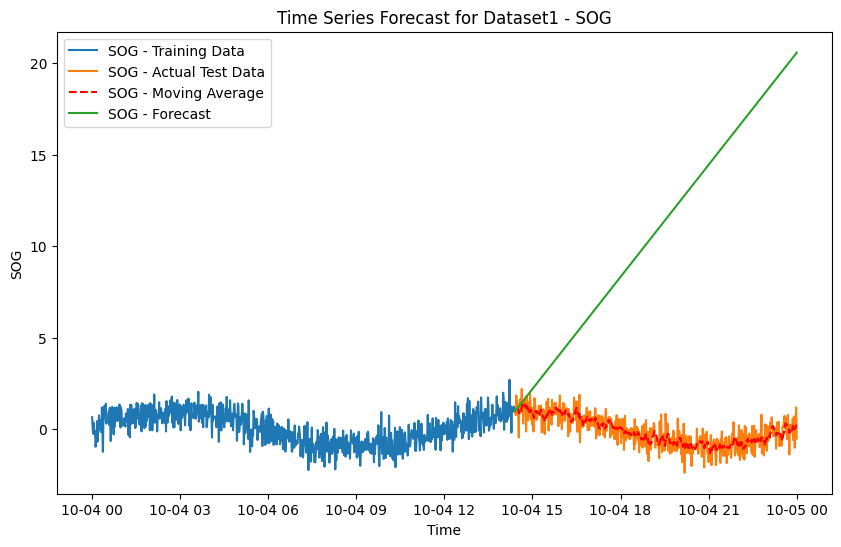

Mean Squared Error: 157.2941477303322
Standard Deviation :  6.236400078849838


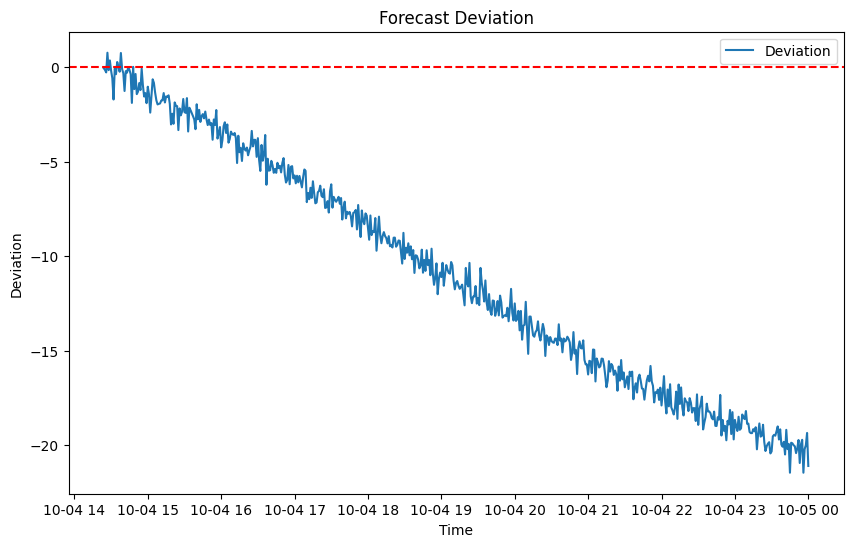


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 2
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2156624162.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2_subset['# Timestamp'] = pd.to_datetime(df2_subset['# Timestamp'])
/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2156624162.py:11: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:45:53 - cmdstanpy - INFO - Chain [1] start processing
19:45:53 - cmdstanpy - INFO - Chain [1] done processing
/Users/amitsingh/anaconda3/envs/test/lib/python3.11/site-packages/prophet/forecaster.py:1854: FutureWarning: 'T' is deprecated and will be removed in a future version, please u

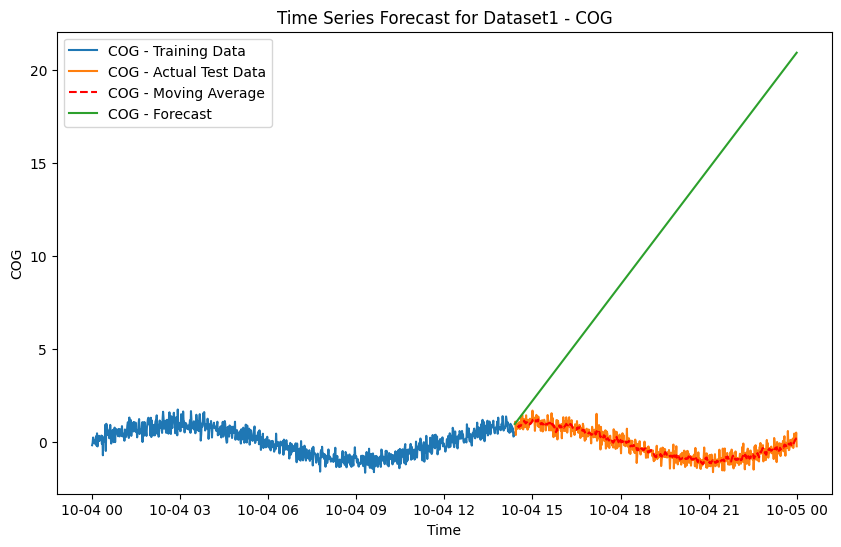

Mean Squared Error: 163.550308624489
Standard Deviation :  6.373044318487234


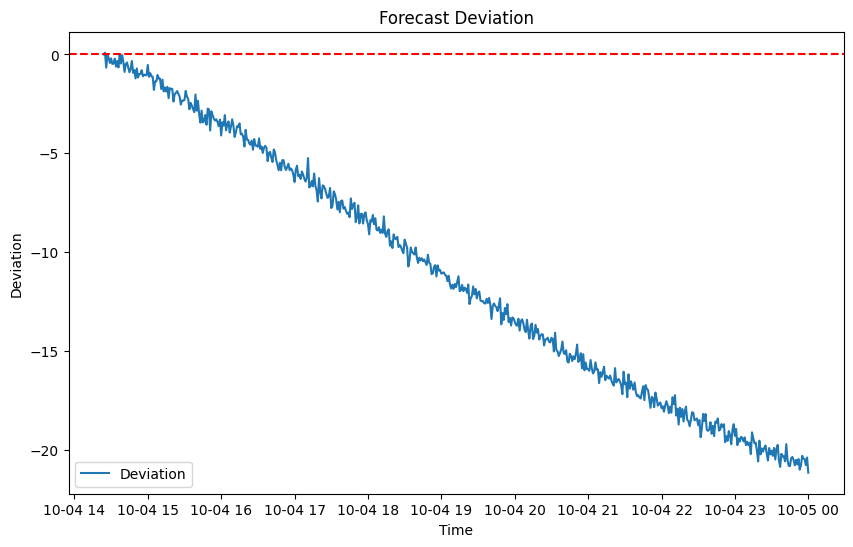


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 3
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2156624162.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2_subset['# Timestamp'] = pd.to_datetime(df2_subset['# Timestamp'])
/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2156624162.py:11: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:45:55 - cmdstanpy - INFO - Chain [1] start processing
19:45:55 - cmdstanpy - INFO - Chain [1] done processing
/Users/amitsingh/anaconda3/envs/test/lib/python3.11/site-packages/prophet/forecaster.py:1854: FutureWarning: 'T' is deprecated and will be removed in a future version, please u

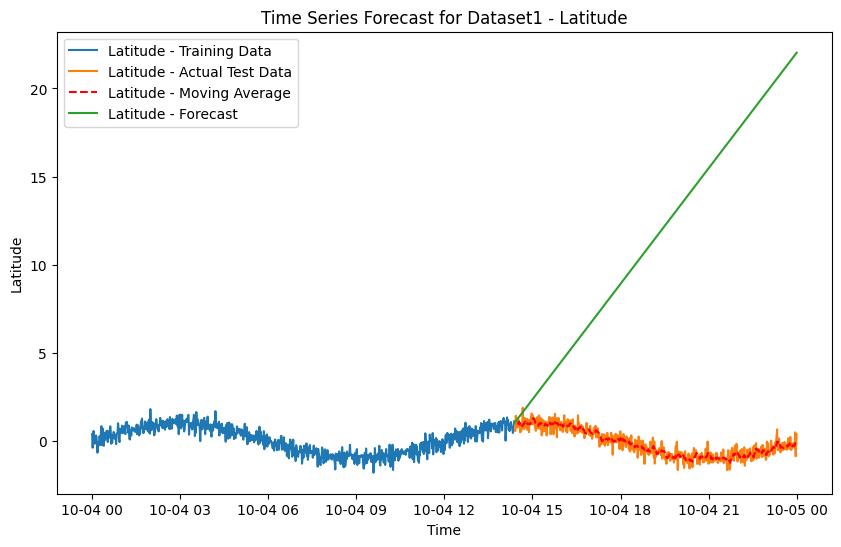

Mean Squared Error: 180.7914482550672
Standard Deviation :  6.6740515169296435


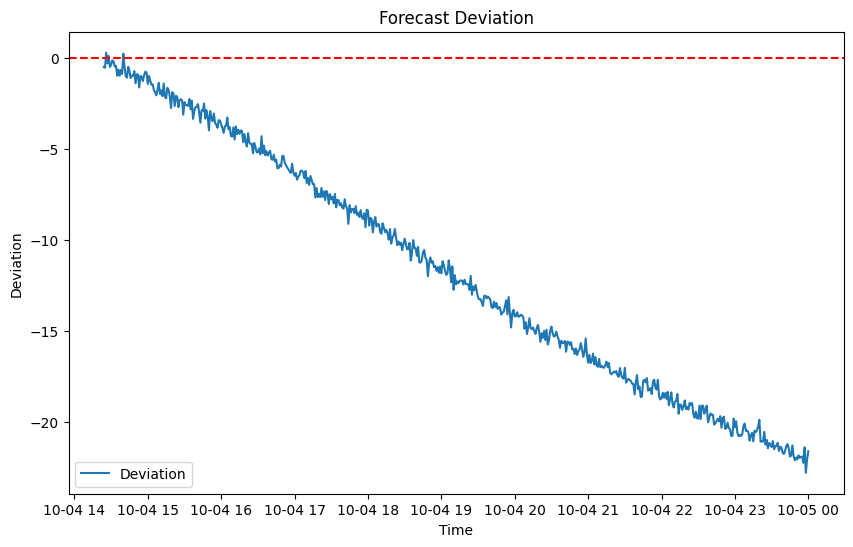


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 4
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2156624162.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df2_subset['# Timestamp'] = pd.to_datetime(df2_subset['# Timestamp'])
/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2156624162.py:11: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:45:56 - cmdstanpy - INFO - Chain [1] start processing
19:45:56 - cmdstanpy - INFO - Chain [1] done processing
/Users/amitsingh/anaconda3/envs/test/lib/python3.11/site-packages/prophet/forecaster.py:1854: FutureWarning: 'T' is deprecated and will be removed in a future version, please u

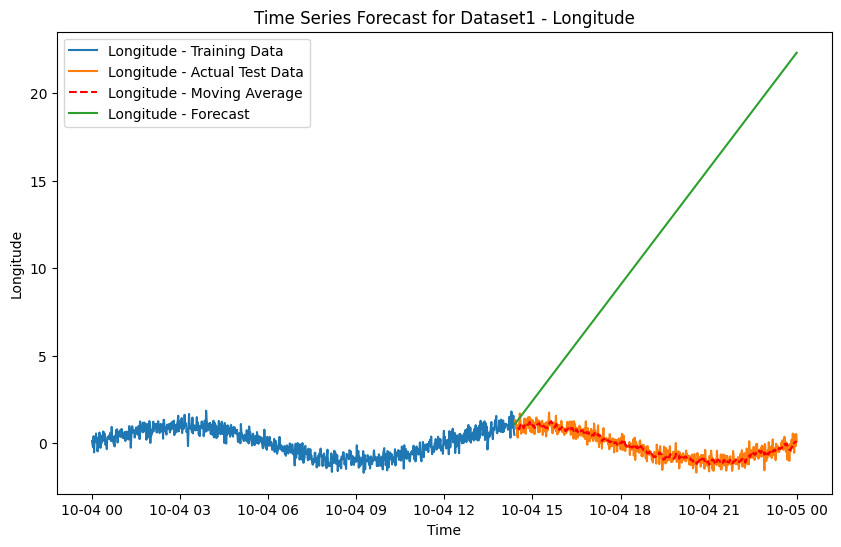

Mean Squared Error: 186.12449505615692
Standard Deviation :  6.7568174264489915


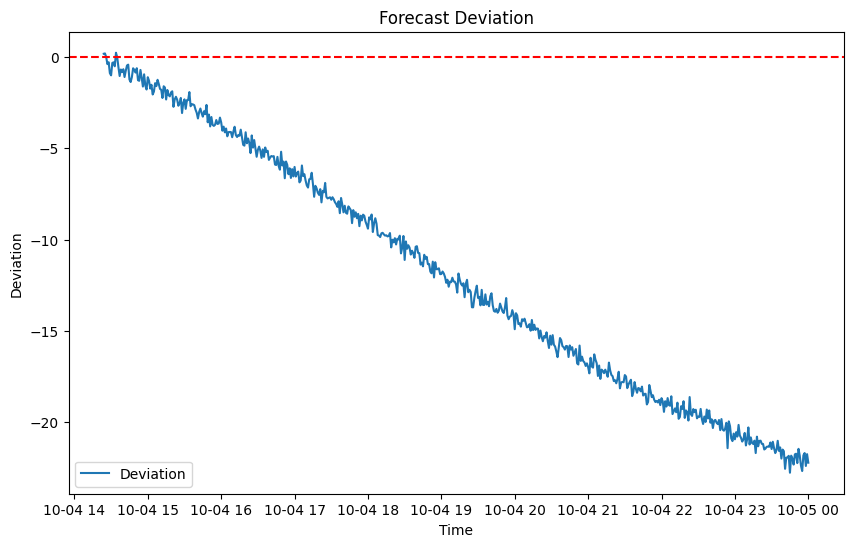


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 5
Exiting the program. Goodbye!


In [109]:
combined_data2 = pd.DataFrame()
while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-4): ")

    if choice == '5':
        print("Exiting the program. Goodbye!")
        break
    elif choice in ['1', '2', '3', '4']:
        try:
            mmsi = input("Enter MMSI: ")  # Get the MMSI from the user
            df2_subset = df2[df2['MMSI'] == int(mmsi)]  # Subset the dataset based on the given MMSI
            
        except ValueError:
            print("Invalid input. Please enter a valid integer for the interval.")
            continue

        if choice == '1':
            columns = ['SOG']
            noise_levels = [0.5]
        elif choice == '2':
            columns = ['COG']
            noise_levels = [0.3]
        elif choice == '3':
            columns = ['Latitude']
            noise_levels = [0.3]
        elif choice == '4':
            columns = ['Longitude']
            noise_levels = [0.3]
        else:
            print("Invalid choice. Please enter a number from 1 to 4.")
            continue
        
        # Generate time series data
        time_series_data2 = create_time_series2(start_date='2023-10-04', end_date='2023-10-05', df2=df2_subset, interval_minutes=1, columns=columns, noise_levels=noise_levels)
        
        # Append to the DataFrame
        combined_data2 = pd.concat([combined_data2, time_series_data2[columns]], axis=1)

        # Split data into training and testing sets (80% training, 20% testing)
        train_data, test_data = train_test_split(time_series_data2, test_size=0.4, shuffle=False)

        # Rename columns to 'ds' and 'y' for Prophet
        train_data.rename(columns={columns[0]: 'y'}, inplace=True)
        test_data.rename(columns={columns[0]: 'y'}, inplace=True)

        # Convert 'ds' column to datetime format
        train_data['ds'] = pd.to_datetime(train_data['ds'])
        test_data['ds'] = pd.to_datetime(test_data['ds'])

        # Train Prophet model
        prophet_model = Prophet()
        prophet_model.fit(train_data)

        # Create a dataframe with future dates for prediction
        future = prophet_model.make_future_dataframe(periods=len(test_data), freq='5T')

        # Make predictions
        forecast = prophet_model.predict(future)

        # Plot the forecast and actual test data
        plot_prophet_forecast2(train_data, test_data, forecast, columns)

        # Evaluate performance using mean squared error
        mse = mean_squared_error(test_data['y'], forecast[-len(test_data):]['yhat'])
        print(f'Mean Squared Error: {mse}')

        # Calculate deviation
        test_data['deviation'] = test_data['y'] - forecast[-len(test_data):]['yhat']
        
        sd = st.stdev(test_data['deviation']) 
        print("Standard Deviation : ", sd)
    

        # Visualize deviation
        plt.figure(figsize=(10, 6))
        plt.plot(test_data['ds'], test_data['deviation'], label='Deviation')
        plt.axhline(y=0, color='r', linestyle='--')
        plt.title('Forecast Deviation')
        plt.xlabel('Time')
        plt.ylabel('Deviation')
        plt.legend()
        plt.show()

# After the loop ends, you'll have all time series data stored in df_all_time_series_data1


In [110]:
combined_data2

,SOG,COG,Latitude,Longitude
0,0.658094,-0.167345,0.398267,0.126632
1,0.127240,-0.046652,-0.370091,-0.132062
2,-0.243212,0.247099,0.028889,-0.232972
3,0.353636,-0.017983,0.578210,0.396226
4,-0.260591,0.082565,-0.054204,-0.531962
...,...,...,...,...
1436,-1.010528,0.350911,-0.381603,0.339345
1437,0.270033,0.357868,0.505006,0.502097
1438,0.513989,0.089050,-0.856010,-0.168436
1439,1.195521,0.510538,-0.082242,0.514890


In [111]:
df123 = pd.concat([df1_2, combined_data2], axis=0)

In [112]:
df123

,SOG,COG,Latitude,Longitude
0,0.323357,-0.155061,-0.016830,-0.179949
1,0.315885,-0.581238,-0.556230,-0.385583
2,0.914108,0.344985,-0.103316,0.119060
3,-0.434664,0.658695,0.116240,0.157335
4,-0.594001,-0.245701,0.234424,0.282610
...,...,...,...,...
1436,-1.010528,0.350911,-0.381603,0.339345
1437,0.270033,0.357868,0.505006,0.502097
1438,0.513989,0.089050,-0.856010,-0.168436
1439,1.195521,0.510538,-0.082242,0.514890


## Prediction of Dataset 1 ,2 and 3


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 1


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2388565816.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:45:58 - cmdstanpy - INFO - Chain [1] start processing
19:45:58 - cmdstanpy - INFO - Chain [1] done processing


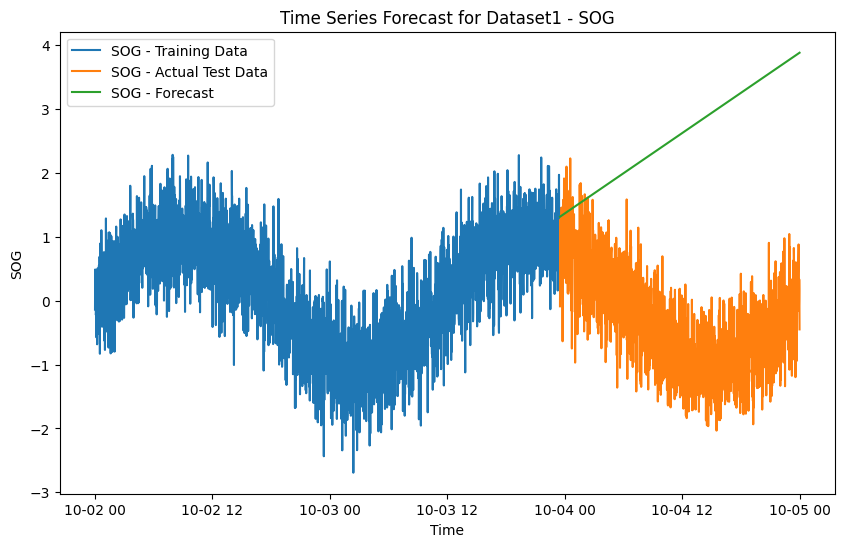

Mean Squared Error: 10.320945042193882
Standard Deviation :  1.3059345984922732


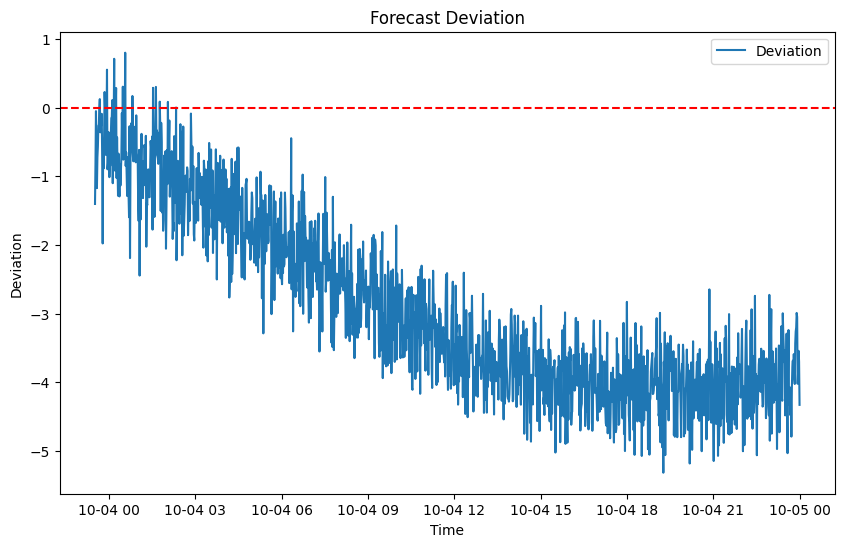


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 2


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2388565816.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:46:02 - cmdstanpy - INFO - Chain [1] start processing
19:46:02 - cmdstanpy - INFO - Chain [1] done processing


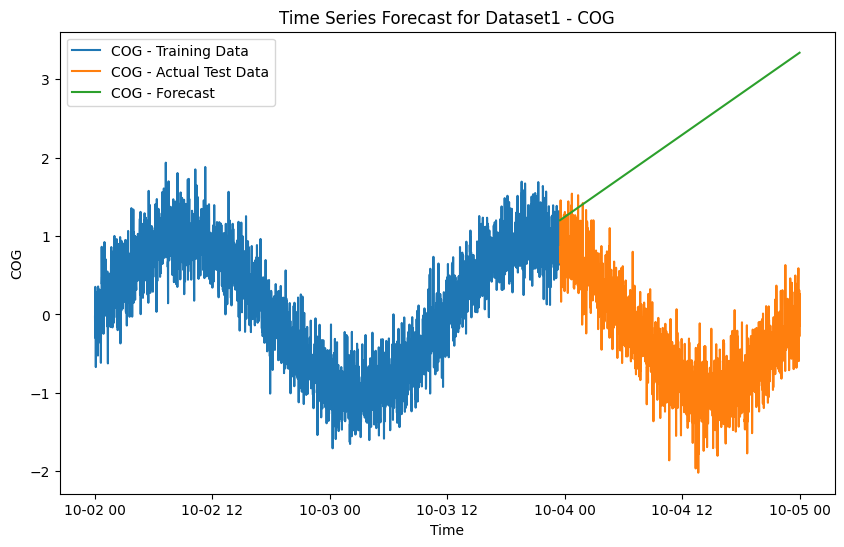

Mean Squared Error: 8.085081225901668
Standard Deviation :  1.1461426479621666


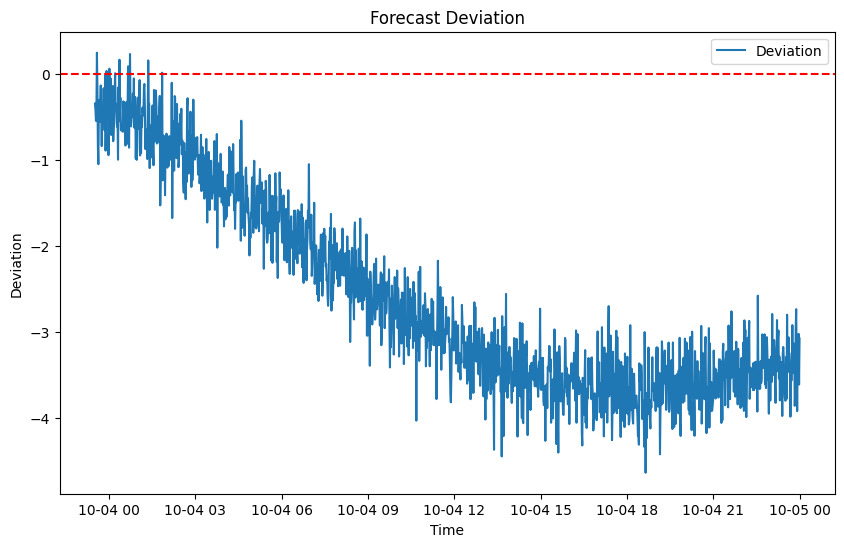


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 3


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2388565816.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:46:03 - cmdstanpy - INFO - Chain [1] start processing
19:46:03 - cmdstanpy - INFO - Chain [1] done processing


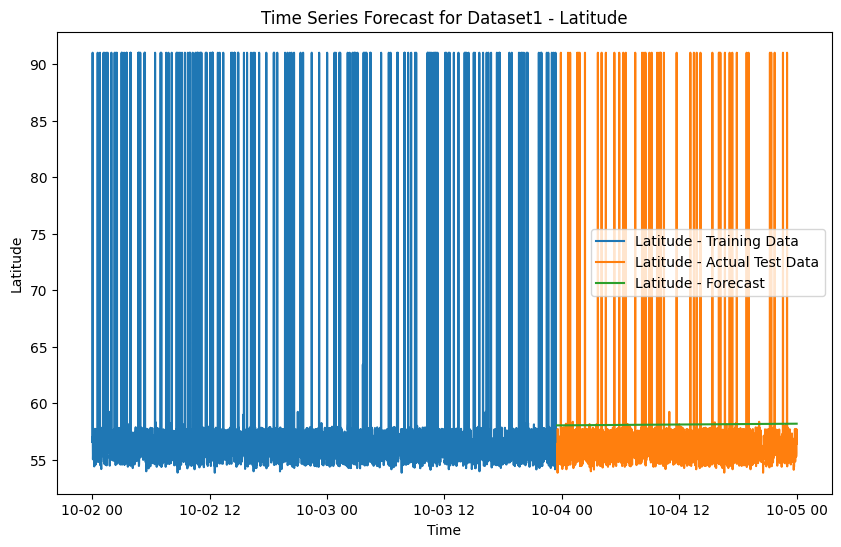

Mean Squared Error: 39.006338808632236
Standard Deviation :  6.173369202576517


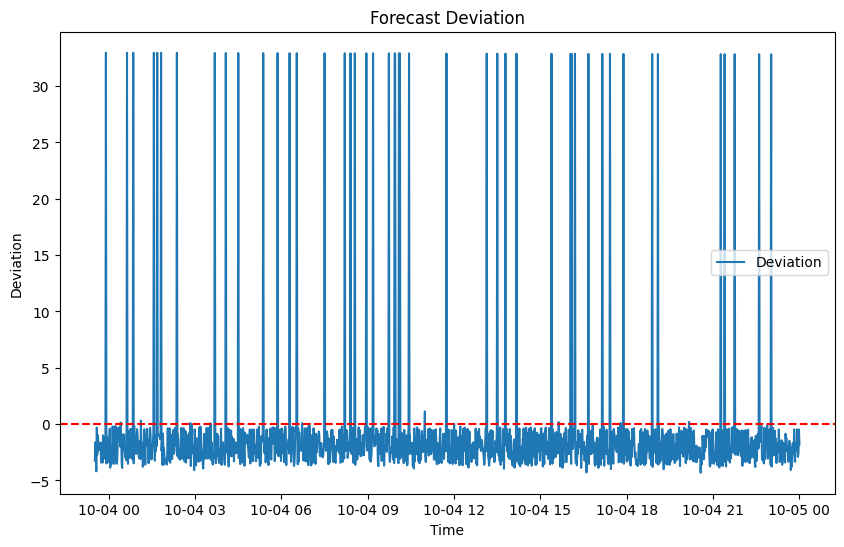


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 4


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2388565816.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:46:05 - cmdstanpy - INFO - Chain [1] start processing
19:46:05 - cmdstanpy - INFO - Chain [1] done processing


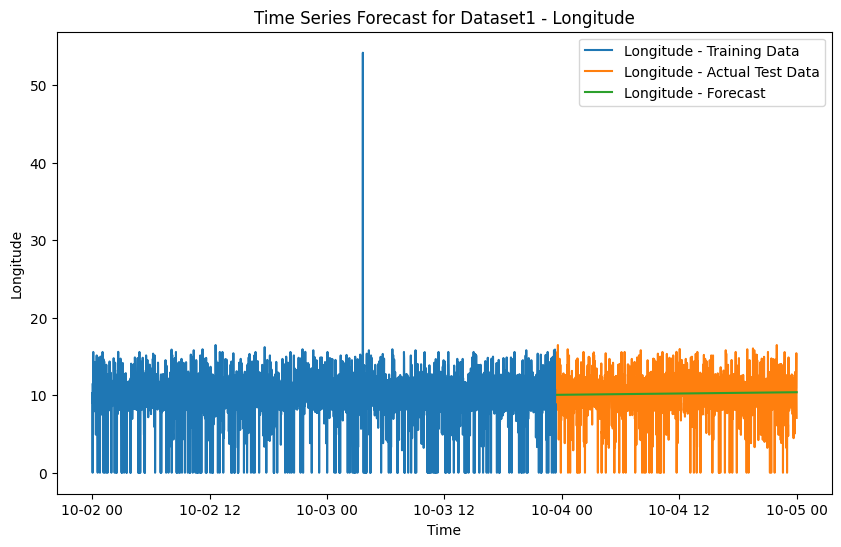

Mean Squared Error: 8.657975161391482
Standard Deviation :  2.941803312076841


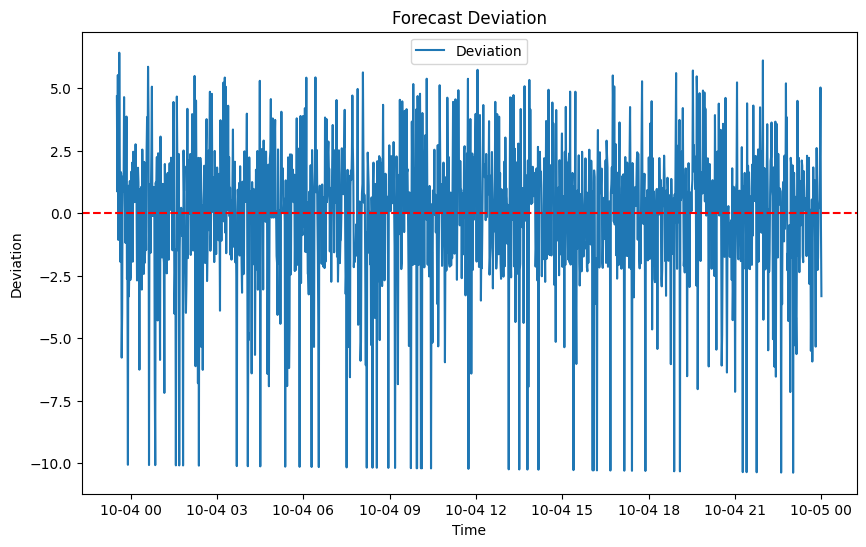


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 5
Exiting the program. Goodbye!


In [113]:
 def create_time_series123(start_date,end_date,df123, interval_minutes, columns, noise_levels=None):
    # Generate datetime range with even intervals
    date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')

    # Create a DataFrame with datetime values
    new_df = pd.DataFrame(date_rng, columns=['ds'])

    # Generate time series values for each specified column
    for col, noise_level in zip(columns, noise_levels):
        #np.random.seed(42)
        if col.lower() == 'latitude':
            new_df[col] = df[col]
        elif col.lower() == 'longitude':
            new_df[col] = df[col]
        elif col.lower() == 'SOG':
            new_df[col] = df[col]
        elif col.lower() == 'COG':
            new_df[col] = df[col]
        else:
            new_df[col] = np.sin(np.linspace(0, 4 * np.pi, len(new_df))) + np.random.normal(0, noise_level, len(new_df))

    return new_df

def plot_prophet_forecast123(train_data, test_data, forecast, columns):
    for col in columns:
        plt.figure(figsize=(10, 6))
        plt.plot(train_data['ds'], train_data['y'], label=f'{col} - Training Data')
        plt.plot(test_data['ds'], test_data['y'], label=f'{col} - Actual Test Data')
        plt.plot(test_data['ds'], forecast[-len(test_data):]['yhat'], label=f'{col} - Forecast')
        plt.title(f'Time Series Forecast for Dataset1 - {col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()
        
## PRACTCIE


while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-4): ")

    if choice == '5':
        print("Exiting the program. Goodbye!")
        break
    elif choice in ['1', '2', '3','4']:
        if choice == '1':
            columns = ['SOG']
            noise_levels = [0.5]
        elif choice =='2':
            columns=['COG']
            noise_levels=[0.3]
        elif choice == '3':
            columns = ['Latitude']
            noise_levels = [0.3]
        elif choice == '4':
            columns = ['Longitude']
            noise_levels = [0.3]
    else:
        print("Invalid choice. Please enter a number from 1 to 4.")
        continue
        
     # First, you need to create the training and testing datasets separately
    # Let's assume your first dataset is stored in df and the second dataset is stored in df1
    time_series_data123 = create_time_series123(start_date='2023-10-02', end_date='2023-10-05', df123=df123, interval_minutes=1, columns=columns, noise_levels=noise_levels)
        
    
    train_data, test_data = train_test_split(time_series_data123, test_size=0.34, shuffle=False)

    
    # Rename columns to 'ds' and 'y' for Prophet

    train_data.rename(columns={columns[0]: 'y'}, inplace=True)
    test_data.rename(columns={columns[0]: 'y'}, inplace=True)
    
    # Convert 'ds' column to datetime format
    train_data['ds'] = pd.to_datetime(train_data['ds'])
    test_data['ds'] = pd.to_datetime(test_data['ds'])

    # Train Prophet model
    prophet_model = Prophet()
    prophet_model.fit(train_data)

    # Create a dataframe with future dates for prediction
    future = prophet_model.make_future_dataframe(periods=len(test_data), freq='1min')

    # Make predictions
    forecast = prophet_model.predict(future)

    # Plot the forecast and actual test data
    plot_prophet_forecast12(train_data, test_data, forecast, columns)

    # Evaluate performance using mean squared error
    mse = mean_squared_error(test_data['y'], forecast[-len(test_data):]['yhat'])
    print(f'Mean Squared Error: {mse}')

    # Calculate deviation
    test_data['deviation'] = test_data['y'] - forecast[-len(test_data):]['yhat']
    
    # Calculate deviation percentage using stdev function
    sd = np.std(test_data['deviation']) 
    print("Standard Deviation : ", sd)
    
    # Calculate standard deviation percentage
    
    # Visualize deviation
    plt.figure(figsize=(10, 6))
    plt.plot(test_data['ds'], test_data['deviation'], label='Deviation')
    plt.axhline(y=0, color='r', linestyle='--')
    plt.title('Forecast Deviation')
    plt.xlabel('Time')
    plt.ylabel('Deviation')
    plt.legend()
    plt.show()
   
    

## 4th  dataset 

In [114]:
def create_time_series3(start_date,end_date,df3, interval_minutes, columns, noise_levels=None):
    # Set the 'Timestamp' column as the index
    #df.set_index('# Timestamp', inplace=True)
    df3_subset['# Timestamp'] = pd.to_datetime(df3_subset['# Timestamp'])
    df3_subset.set_index('# Timestamp', inplace=True)
    # Resample the DataFrame to get one data point per minute
    resampled_df3 = df3.resample(f'{interval_minutes}1min').first().reset_index()
    
    resampled_df3 = df3.groupby([pd.Grouper(freq=f'{interval_minutes}1min'), 'MMSI']).min().reset_index()
    
    
    # Generate datetime range with even intervals
    date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')

    # Create a DataFrame with datetime values
    new_df = pd.DataFrame(date_rng, columns=['ds'])
        
    # Merge resampled data with the new DataFrame on the 'ds' column
    new_df = pd.merge(new_df, resampled_df3, how='left', left_on='ds', right_on='# Timestamp')

    # Drop the redundant '# Timestamp' column
    new_df.drop('# Timestamp', axis=1, inplace=True)

    
    # Generate time series values for each specified column
    for col, noise_level in zip(columns, noise_levels):
        if col.lower() == 'Latitude':
            new_df[col] = df[col]
        elif col.lower() == 'Longitude':
            new_df[col] = df[col]
        elif col.lower() =='SOG':
            new_df[col] =df[col]
        elif col.lower() =='COG':
            new_df[col] =df[col]    
        else:
            new_df[col] = np.sin(np.linspace(0, 4 * np.pi, len(new_df))) + np.random.normal(0, noise_level, len(new_df))

    return new_df

In [115]:
def plot_time_series3(df3,columns):
    for col in columns:
        plt.figure(figsize=(10,6))
        plt.plot(df3['ds'],df3[col],label=col)
        plt.title(f'Time Series Plot for Dataset df 3 -{col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()


# Menu-driven code
while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG ")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-5): ")

    if choice in ['1', '2', '3', '4']:
        mmsi = input("Enter MMSI: ")  # Get the MMSI from the user
        df3_subset = df3[df3['MMSI'] == int(mmsi)]  # Subset the dataset based on the given MMSI
        columns = ['SOG'] if choice == '1' else ['COG'] if choice == '2' else ['Latitude'] if choice == '3' else ['Longitude']
        noise_levels = [0.5] if choice == '1' else [0.3]  # Adjust noise levels as needed

        #time_series_data = create_time_series(start_date='2022-10-03',end_date='2022-10-04',df1=df_subset, interval_minutes=5, columns=columns, noise_levels=noise_levels)
        time_series_data3 = create_time_series3(start_date='2022-10-05', end_date='2022-10-06', df3=df3_subset, interval_minutes=1, columns=columns, noise_levels=noise_levels)

        plot_time_series3(time_series_data3, columns)
    elif choice == '5':
        print("Exiting the program. Goodbye!")
        break
    else:
        print("Invalid choice. Please enter a number from 1 to 5.")


In [116]:
220068000

220068000

In [117]:
def plot_prophet_forecast3(train_data, test_data, forecast, columns):
    for col in columns:
        plt.figure(figsize=(10, 6))
        plt.plot(train_data['ds'], train_data['y'], label=f'{col} - Training Data')
        plt.plot(test_data['ds'], test_data['y'], label=f'{col} - Actual Test Data')
        plt.plot(test_data['ds'], forecast[-len(test_data):]['yhat'], label=f'{col} - Forecast')
        plt.title(f'Time Series Forecast for Dataset1 - {col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 1
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/4032425627.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3_subset['# Timestamp'] = pd.to_datetime(df3_subset['# Timestamp'])
/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/4032425627.py:13: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:46:14 - cmdstanpy - INFO - Chain [1] start processing
19:46:14 - cmdstanpy - INFO - Chain [1] done processing
/Users/amitsingh/anaconda3/envs/test/lib/python3.11/site-packages/prophet/forecaster.py:1854: FutureWarning: 'T' is deprecated and will be removed in a future version, please u

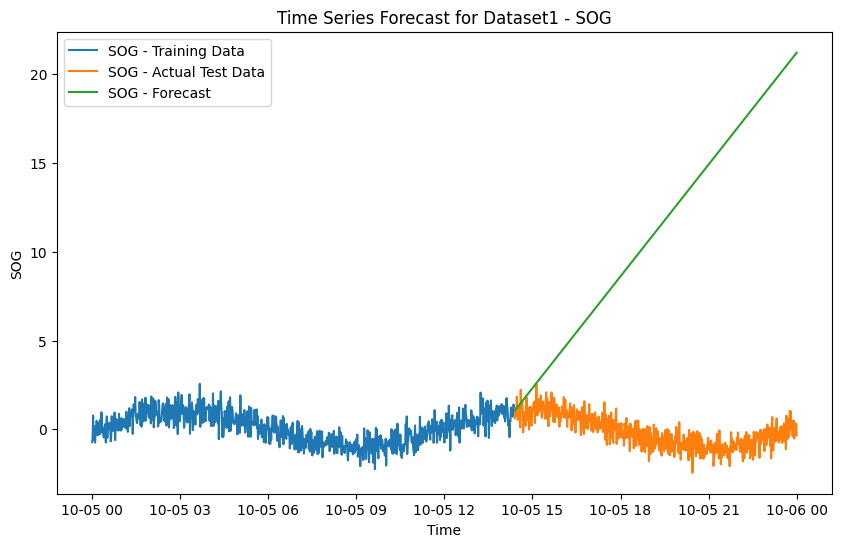

Mean Squared Error: 168.8668420337063


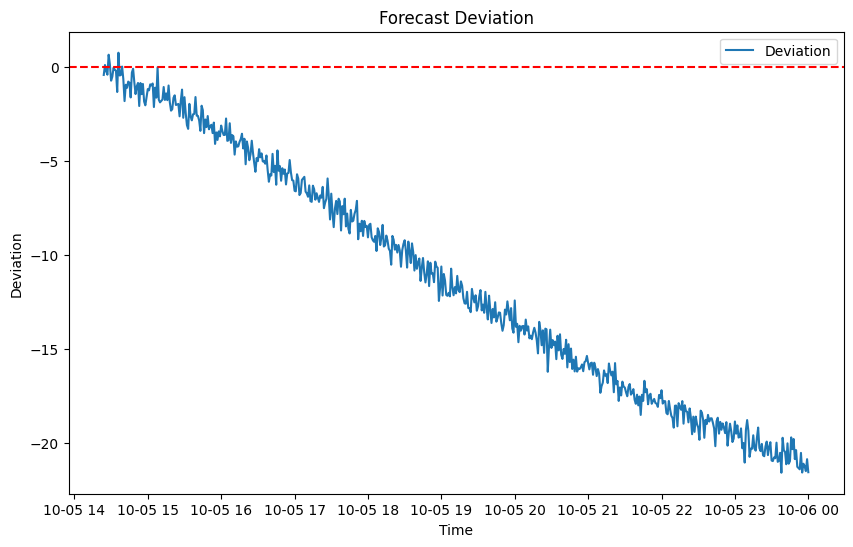


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 2
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/4032425627.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3_subset['# Timestamp'] = pd.to_datetime(df3_subset['# Timestamp'])
/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/4032425627.py:13: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:46:17 - cmdstanpy - INFO - Chain [1] start processing
19:46:17 - cmdstanpy - INFO - Chain [1] done processing
/Users/amitsingh/anaconda3/envs/test/lib/python3.11/site-packages/prophet/forecaster.py:1854: FutureWarning: 'T' is deprecated and will be removed in a future version, please u

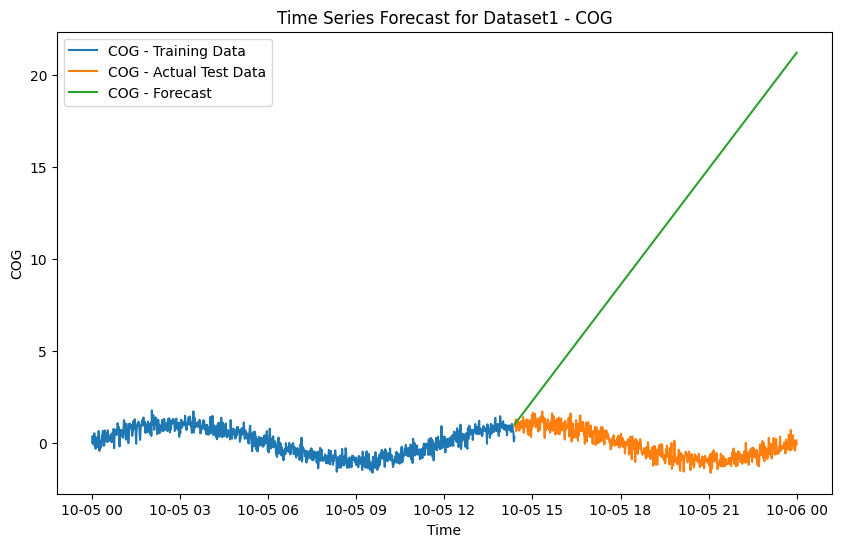

Mean Squared Error: 167.9333194338635


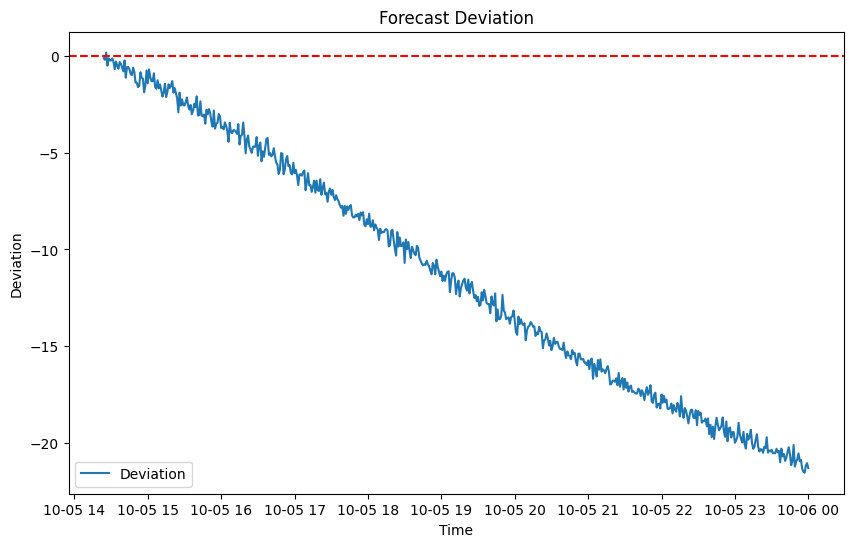


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 3
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/4032425627.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3_subset['# Timestamp'] = pd.to_datetime(df3_subset['# Timestamp'])
/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/4032425627.py:13: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:46:19 - cmdstanpy - INFO - Chain [1] start processing
19:46:20 - cmdstanpy - INFO - Chain [1] done processing
/Users/amitsingh/anaconda3/envs/test/lib/python3.11/site-packages/prophet/forecaster.py:1854: FutureWarning: 'T' is deprecated and will be removed in a future version, please u

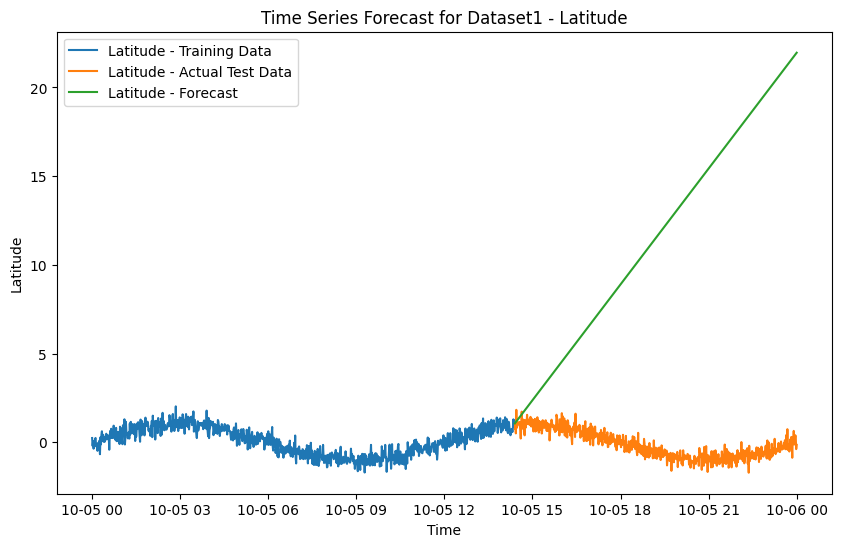

Mean Squared Error: 179.60882724309425


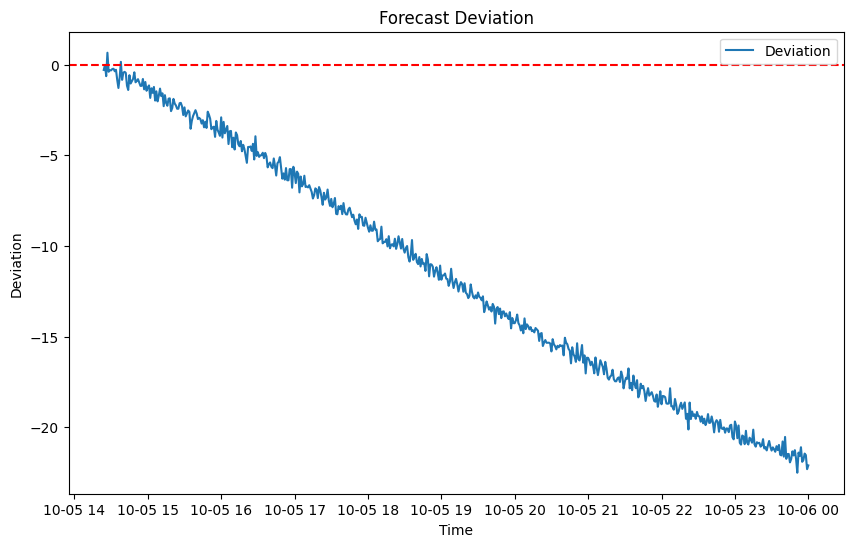


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 4
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/4032425627.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df3_subset['# Timestamp'] = pd.to_datetime(df3_subset['# Timestamp'])
/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/4032425627.py:13: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:46:21 - cmdstanpy - INFO - Chain [1] start processing
19:46:21 - cmdstanpy - INFO - Chain [1] done processing
/Users/amitsingh/anaconda3/envs/test/lib/python3.11/site-packages/prophet/forecaster.py:1854: FutureWarning: 'T' is deprecated and will be removed in a future version, please u

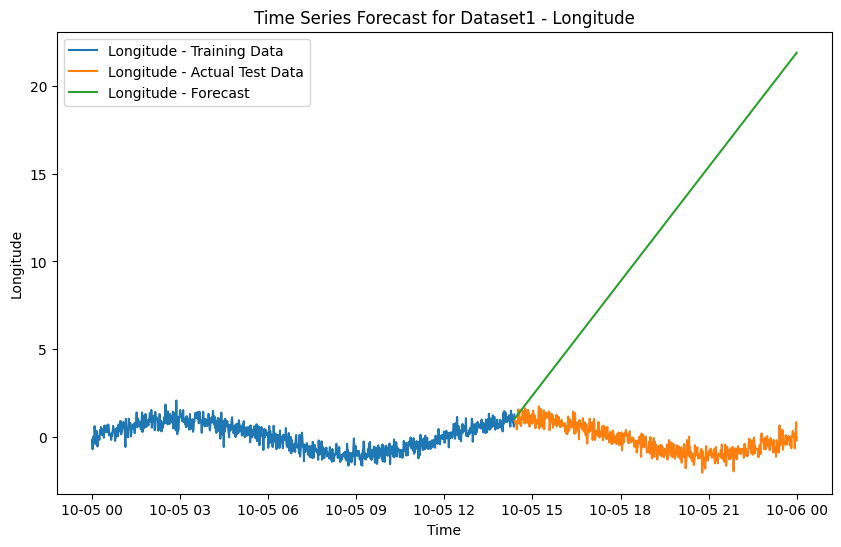

Mean Squared Error: 178.64844365492903


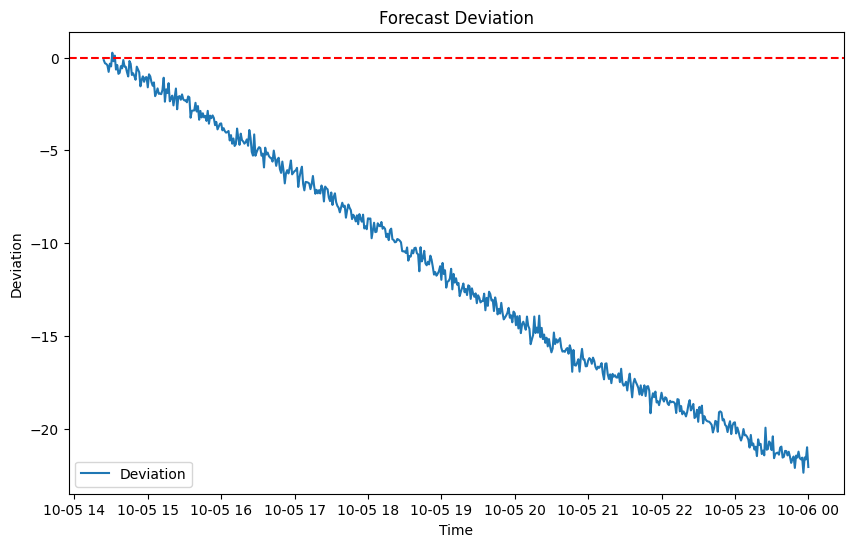


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 5
Exiting the program. Goodbye!


In [118]:
combined_data3 = pd.DataFrame()
while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-4): ")

    if choice == '5':
        print("Exiting the program. Goodbye!")
        break
    elif choice in ['1', '2', '3', '4']:
        try:
            mmsi = input("Enter MMSI: ")  # Get the MMSI from the user
            df3_subset = df3[df3['MMSI'] == int(mmsi)]  # Subset the dataset based on the given MMSI
            
        except ValueError:
            print("Invalid input. Please enter a valid integer for the interval.")
            continue

        if choice == '1':
            columns = ['SOG']
            noise_levels = [0.5]
        elif choice == '2':
            columns = ['COG']
            noise_levels = [0.3]
        elif choice == '3':
            columns = ['Latitude']
            noise_levels = [0.3]
        elif choice == '4':
            columns = ['Longitude']
            noise_levels = [0.3]
        else:
            print("Invalid choice. Please enter a number from 1 to 4.")
            continue
        
        # Generate time series data
        time_series_data3 = create_time_series3(start_date='2023-10-05', end_date='2023-10-06', df3=df3_subset, interval_minutes=1, columns=columns, noise_levels=noise_levels)
        
        # Append to the DataFrame
        combined_data3 = pd.concat([combined_data3, time_series_data3[columns]], axis=1)

        # Split data into training and testing sets (80% training, 20% testing)
        train_data, test_data = train_test_split(time_series_data3, test_size=0.4, shuffle=False)

        # Rename columns to 'ds' and 'y' for Prophet
        train_data.rename(columns={columns[0]: 'y'}, inplace=True)
        test_data.rename(columns={columns[0]: 'y'}, inplace=True)

        # Convert 'ds' column to datetime format
        train_data['ds'] = pd.to_datetime(train_data['ds'])
        test_data['ds'] = pd.to_datetime(test_data['ds'])

        # Train Prophet model
        prophet_model = Prophet()
        prophet_model.fit(train_data)

        # Create a dataframe with future dates for prediction
        future = prophet_model.make_future_dataframe(periods=len(test_data), freq='5T')

        # Make predictions
        forecast = prophet_model.predict(future)

        # Plot the forecast and actual test data
        plot_prophet_forecast3(train_data, test_data, forecast, columns)

        # Evaluate performance using mean squared error
        mse = mean_squared_error(test_data['y'], forecast[-len(test_data):]['yhat'])
        print(f'Mean Squared Error: {mse}')

        # Calculate deviation
        test_data['deviation'] = test_data['y'] - forecast[-len(test_data):]['yhat']

        # Visualize deviation
        plt.figure(figsize=(10, 6))
        plt.plot(test_data['ds'], test_data['deviation'], label='Deviation')
        plt.axhline(y=0, color='r', linestyle='--')
        plt.title('Forecast Deviation')
        plt.xlabel('Time')
        plt.ylabel('Deviation')
        plt.legend()
        plt.show()

# After the loop ends, you'll have all time series data stored in df_all_time_series_data1


In [119]:
combined_data3

,SOG,COG,Latitude,Longitude
0,-0.722357,0.012644,0.244165,-0.148186
1,-0.508497,0.355552,-0.199635,-0.687696
2,0.779500,0.091110,0.067697,0.023821
3,-0.576190,-0.116260,-0.356908,-0.048619
4,0.006991,0.496099,0.082129,-0.352590
...,...,...,...,...
1436,-0.017244,-0.422174,0.014861,-0.632104
1437,-0.117727,-0.431544,0.403254,0.227428
1438,-0.342460,-0.019545,0.356847,0.154426
1439,0.328786,0.132360,-0.382935,0.847194


In [120]:
df1234 = pd.concat([df123,combined_data3], axis =0)

In [121]:
df1234

,SOG,COG,Latitude,Longitude
0,0.323357,-0.155061,-0.016830,-0.179949
1,0.315885,-0.581238,-0.556230,-0.385583
2,0.914108,0.344985,-0.103316,0.119060
3,-0.434664,0.658695,0.116240,0.157335
4,-0.594001,-0.245701,0.234424,0.282610
...,...,...,...,...
1436,-0.017244,-0.422174,0.014861,-0.632104
1437,-0.117727,-0.431544,0.403254,0.227428
1438,-0.342460,-0.019545,0.356847,0.154426
1439,0.328786,0.132360,-0.382935,0.847194


In [122]:
## Training data 1,2,3 and Testing Data 4


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 1


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2682843590.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:46:23 - cmdstanpy - INFO - Chain [1] start processing
19:46:23 - cmdstanpy - INFO - Chain [1] done processing


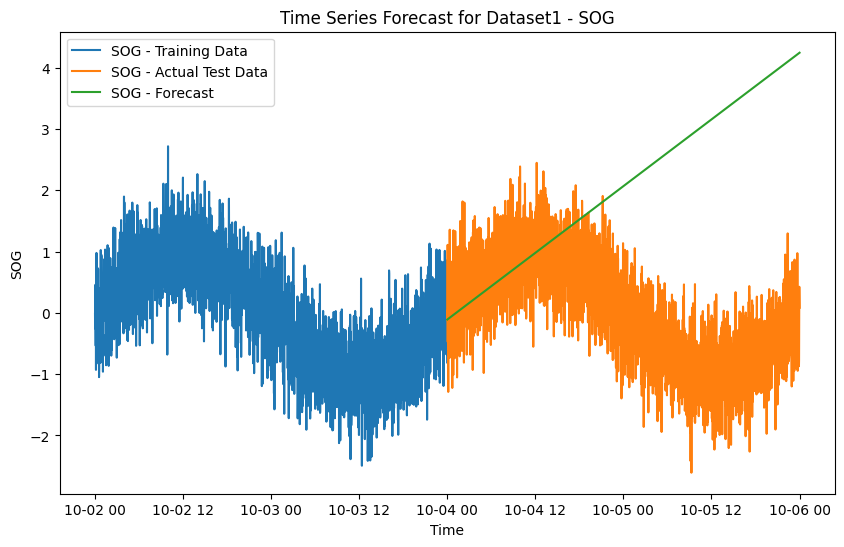

Mean Squared Error: 8.066469500810744
Standard Deviation :  1.927464357511688


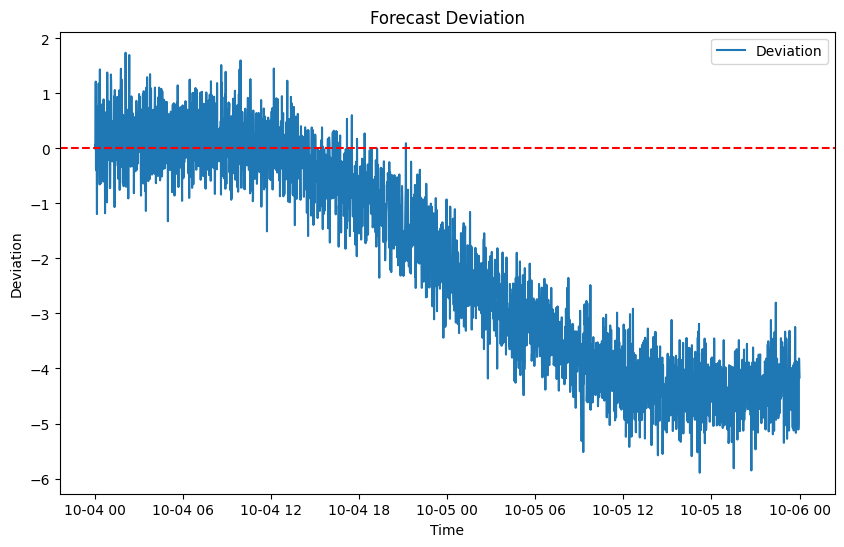


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 2


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2682843590.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:46:24 - cmdstanpy - INFO - Chain [1] start processing
19:46:24 - cmdstanpy - INFO - Chain [1] done processing


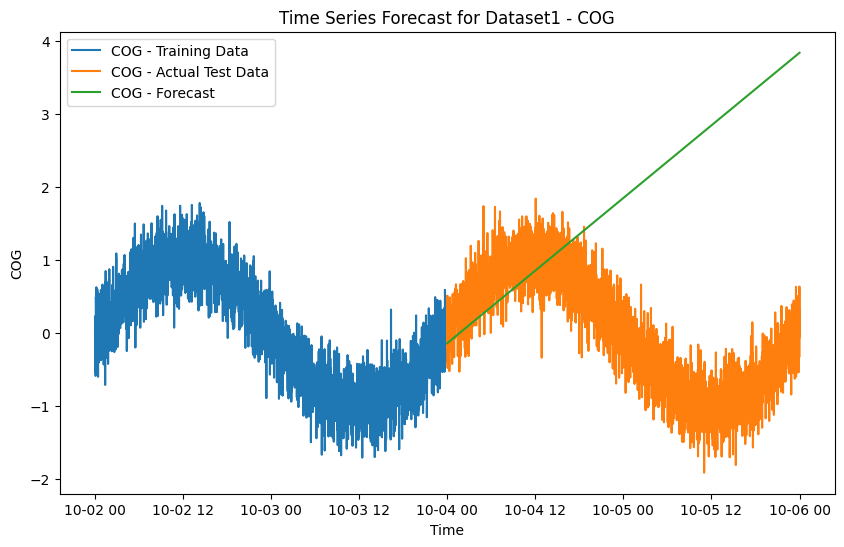

Mean Squared Error: 6.605404172641709
Standard Deviation :  1.7850546619342589


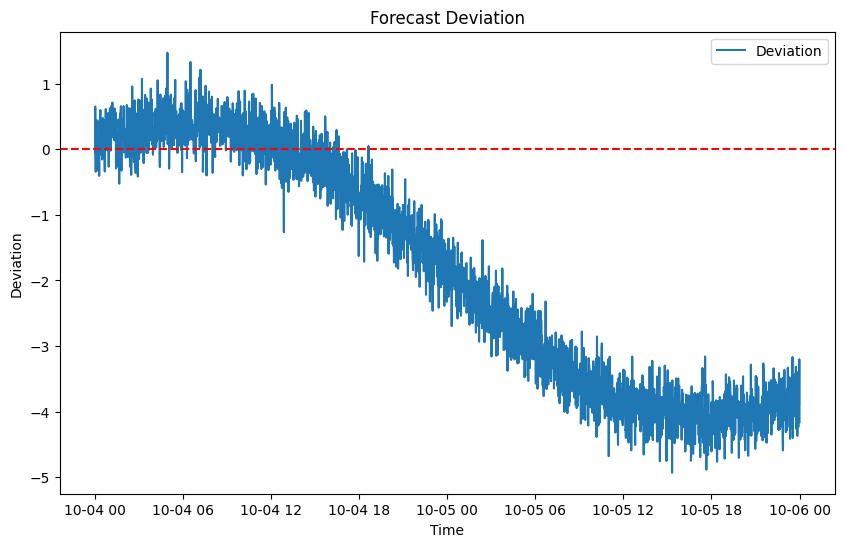


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 3


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2682843590.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:46:26 - cmdstanpy - INFO - Chain [1] start processing
19:46:26 - cmdstanpy - INFO - Chain [1] done processing


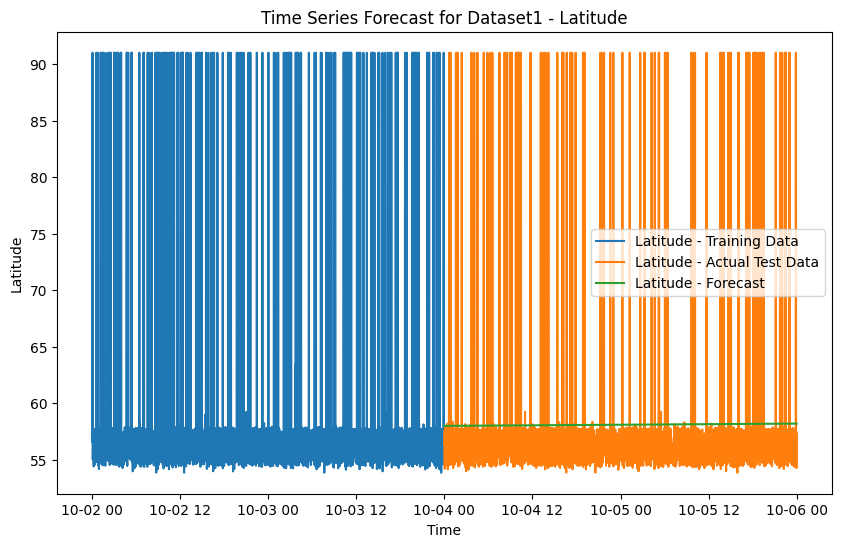

Mean Squared Error: 39.189719512040405
Standard Deviation :  6.195516875916218


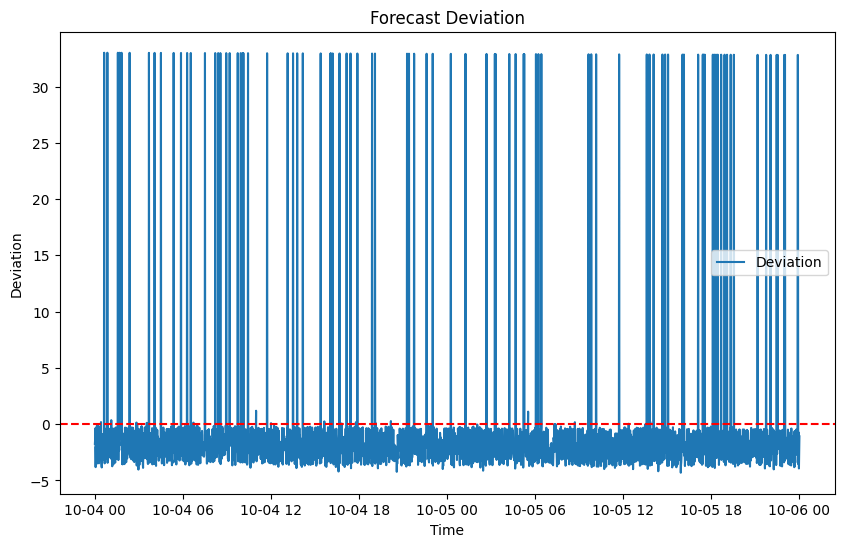


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 4


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2682843590.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:46:27 - cmdstanpy - INFO - Chain [1] start processing
19:46:27 - cmdstanpy - INFO - Chain [1] done processing


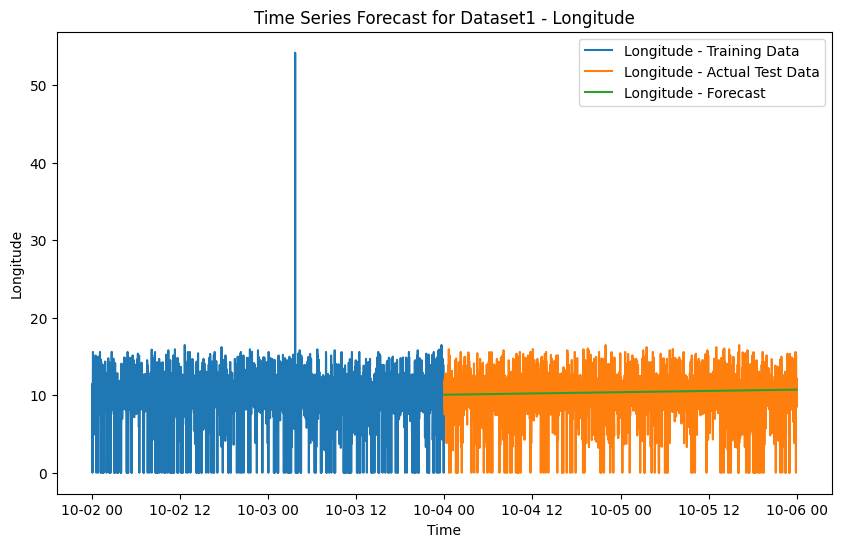

Mean Squared Error: 8.797982375188433
Standard Deviation :  2.9579786339106953


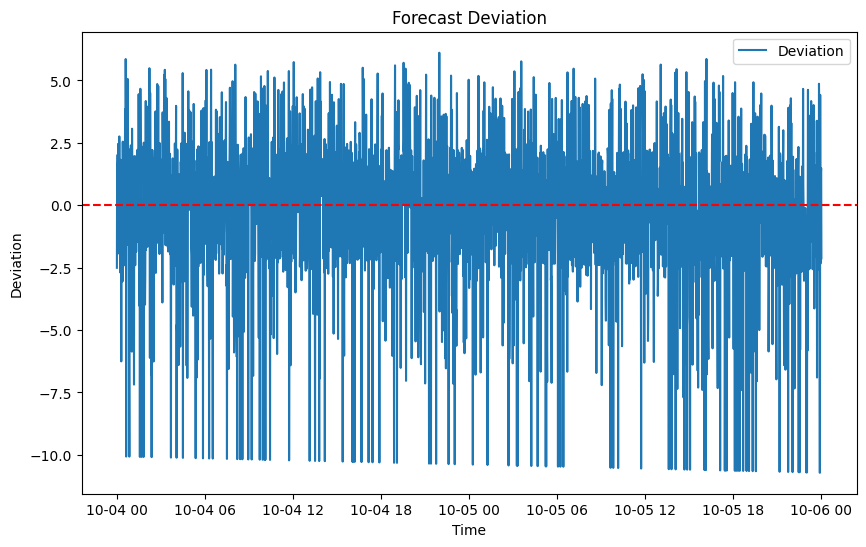


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 5
Exiting the program. Goodbye!


In [123]:
 def create_time_series1234(start_date,end_date,df1234, interval_minutes, columns, noise_levels=None):
    # Generate datetime range with even intervals
    date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')

    # Create a DataFrame with datetime values
    new_df = pd.DataFrame(date_rng, columns=['ds'])

    # Generate time series values for each specified column
    for col, noise_level in zip(columns, noise_levels):
        #np.random.seed(42)
        if col.lower() == 'latitude':
            new_df[col] = df[col]
        elif col.lower() == 'longitude':
            new_df[col] = df[col]
        elif col.lower() == 'SOG':
            new_df[col] = df[col]
        elif col.lower() == 'COG':
            new_df[col] = df[col]
        else:
            new_df[col] = np.sin(np.linspace(0, 4 * np.pi, len(new_df))) + np.random.normal(0, noise_level, len(new_df))

    return new_df

def plot_prophet_forecast1234(train_data, test_data, forecast, columns):
    for col in columns:
        plt.figure(figsize=(10, 6))
        plt.plot(train_data['ds'], train_data['y'], label=f'{col} - Training Data')
        plt.plot(test_data['ds'], test_data['y'], label=f'{col} - Actual Test Data')
        plt.plot(test_data['ds'], forecast[-len(test_data):]['yhat'], label=f'{col} - Forecast')
        plt.title(f'Time Series Forecast for Dataset1 - {col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()
        
## PRACTCIE


while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-4): ")

    if choice == '5':
        print("Exiting the program. Goodbye!")
        break
    elif choice in ['1', '2', '3','4']:
        if choice == '1':
            columns = ['SOG']
            noise_levels = [0.5]
        elif choice =='2':
            columns=['COG']
            noise_levels=[0.3]
        elif choice == '3':
            columns = ['Latitude']
            noise_levels = [0.3]
        elif choice == '4':
            columns = ['Longitude']
            noise_levels = [0.3]
    else:
        print("Invalid choice. Please enter a number from 1 to 4.")
        continue
        
     # First, you need to create the training and testing datasets separately
    # Let's assume your first dataset is stored in df and the second dataset is stored in df1
    time_series_data1234 = create_time_series1234(start_date='2023-10-02', end_date='2023-10-06', df1234=df1234, interval_minutes=1, columns=columns, noise_levels=noise_levels)
        
    
    train_data, test_data = train_test_split(time_series_data1234, test_size=0.5, shuffle=False)

    
    # Rename columns to 'ds' and 'y' for Prophet

    train_data.rename(columns={columns[0]: 'y'}, inplace=True)
    test_data.rename(columns={columns[0]: 'y'}, inplace=True)
    
    # Convert 'ds' column to datetime format
    train_data['ds'] = pd.to_datetime(train_data['ds'])
    test_data['ds'] = pd.to_datetime(test_data['ds'])

    # Train Prophet model
    prophet_model = Prophet()
    prophet_model.fit(train_data)

    # Create a dataframe with future dates for prediction
    future = prophet_model.make_future_dataframe(periods=len(test_data), freq='1min')

    # Make predictions
    forecast = prophet_model.predict(future)

    # Plot the forecast and actual test data
    plot_prophet_forecast12(train_data, test_data, forecast, columns)

    # Evaluate performance using mean squared error
    mse = mean_squared_error(test_data['y'], forecast[-len(test_data):]['yhat'])
    print(f'Mean Squared Error: {mse}')

    # Calculate deviation
    test_data['deviation'] = test_data['y'] - forecast[-len(test_data):]['yhat']
    
    # Calculate deviation percentage using stdev function
    sd = np.std(test_data['deviation']) 
    print("Standard Deviation : ", sd)
    
    # Calculate standard deviation percentage
    
    # Visualize deviation
    plt.figure(figsize=(10, 6))
    plt.plot(test_data['ds'], test_data['deviation'], label='Deviation')
    plt.axhline(y=0, color='r', linestyle='--')
    plt.title('Forecast Deviation')
    plt.xlabel('Time')
    plt.ylabel('Deviation')
    plt.legend()
    plt.show()
   
    

## 5th Dataset 

## Even Intervals

In [124]:
def create_time_series4(start_date,end_date,df4, interval_minutes, columns, noise_levels=None):
    # Set the 'Timestamp' column as the index
    #df.set_index('# Timestamp', inplace=True)
    df4_subset['# Timestamp'] = pd.to_datetime(df4_subset['# Timestamp'])
    df4_subset.set_index('# Timestamp', inplace=True)
    # Resample the DataFrame to get one data point per minute
    resampled_df4 = df4.resample(f'{interval_minutes}1min').first().reset_index()
    
    resampled_df4 = df4.groupby([pd.Grouper(freq=f'{interval_minutes}1min'), 'MMSI']).min().reset_index()
    
    
    # Generate datetime range with even intervals
    date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')

    # Create a DataFrame with datetime values
    new_df = pd.DataFrame(date_rng, columns=['ds'])
        
    # Merge resampled data with the new DataFrame on the 'ds' column
    new_df = pd.merge(new_df, resampled_df4, how='left', left_on='ds', right_on='# Timestamp')

    # Drop the redundant '# Timestamp' column
    new_df.drop('# Timestamp', axis=1, inplace=True)

    
    # Generate time series values for each specified column
    for col, noise_level in zip(columns, noise_levels):
        #np.random.seed(42)
        if col.lower() == 'latitude':
            new_df[col] = df[col]
        elif col.lower() == 'longitude':
            new_df[col] = df[col]
        elif col.lower() == 'SOG':
            new_df[col] = df[col]
        elif col.lower() == 'COG':
            new_df[col] = df[col]
        else:
            new_df[col] = np.sin(np.linspace(0, 4 * np.pi, len(new_df))) + np.random.normal(0, noise_level, len(new_df))

    return new_df

In [125]:
def plot_time_series4(df4,columns):
    for col in columns:
        plt.figure(figsize=(10,6))
        plt.plot(df4['ds'],df4[col],label=col)
        plt.title(f'Time Series Plot for Dataset df 4 -{col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()

# Menu-driven code
while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG ")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-5): ")

    if choice in ['1', '2', '3', '4']:
        mmsi = input("Enter MMSI: ")  # Get the MMSI from the user
        df4_subset = df4[df4['MMSI'] == int(mmsi)]  # Subset the dataset based on the given MMSI
        columns = ['SOG'] if choice == '1' else ['COG'] if choice == '2' else ['Latitude'] if choice == '3' else ['Longitude']
        noise_levels = [0.5] if choice == '1' else [0.3]  # Adjust noise levels as needed

        #time_series_data = create_time_series(start_date='2022-10-03',end_date='2022-10-04',df1=df_subset, interval_minutes=5, columns=columns, noise_levels=noise_levels)
        time_series_data4 = create_time_series4(start_date='2022-10-06', end_date='2022-10-07', df4=df4_subset, interval_minutes=1, columns=columns, noise_levels=noise_levels)

        plot_time_series4(time_series_data4, columns)
    elif choice == '5':
        print("Exiting the program. Goodbye!")
        break
    else:
        print("Invalid choice. Please enter a number from 1 to 5.")
#220068000

In [126]:
def plot_prophet_forecast4(train_data, test_data, forecast, columns):
    for col in columns:
        plt.figure(figsize=(10, 6))
        plt.plot(train_data['ds'], train_data['y'], label=f'{col} - Training Data')
        plt.plot(test_data['ds'], test_data['y'], label=f'{col} - Actual Test Data')
        plt.plot(test_data['ds'], forecast[-len(test_data):]['yhat'], label=f'{col} - Forecast')
        plt.title(f'Time Series Forecast for Dataset1 - {col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 1
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/28655621.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4_subset['# Timestamp'] = pd.to_datetime(df4_subset['# Timestamp'])
/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/28655621.py:13: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:46:35 - cmdstanpy - INFO - Chain [1] start processing
19:46:35 - cmdstanpy - INFO - Chain [1] done processing


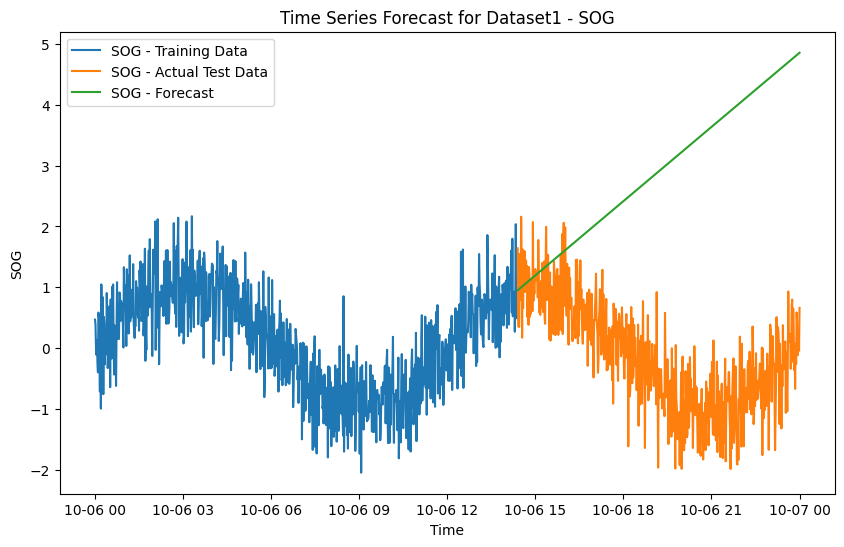

Mean Squared Error: 12.596960320748611


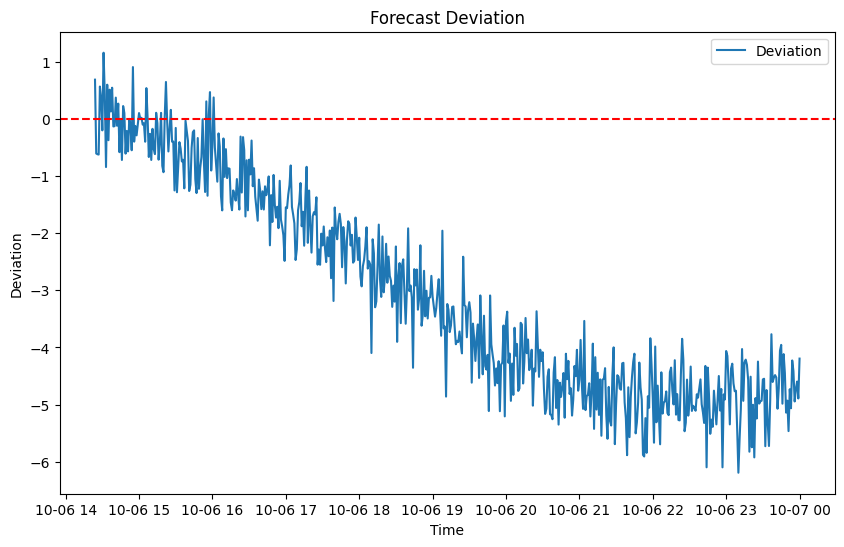


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 2
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/28655621.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4_subset['# Timestamp'] = pd.to_datetime(df4_subset['# Timestamp'])
/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/28655621.py:13: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:46:38 - cmdstanpy - INFO - Chain [1] start processing
19:46:38 - cmdstanpy - INFO - Chain [1] done processing


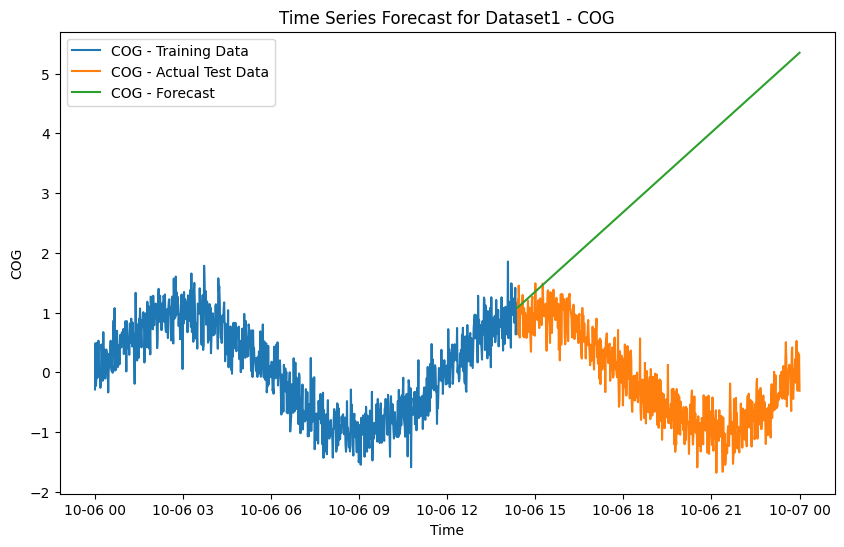

Mean Squared Error: 14.674164379888147


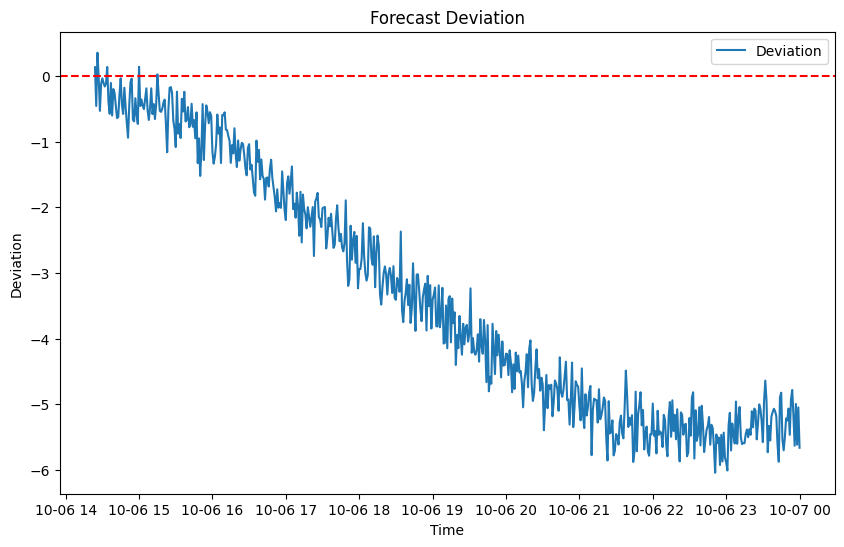


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 3
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/28655621.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4_subset['# Timestamp'] = pd.to_datetime(df4_subset['# Timestamp'])
/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/28655621.py:13: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:46:41 - cmdstanpy - INFO - Chain [1] start processing
19:46:41 - cmdstanpy - INFO - Chain [1] done processing


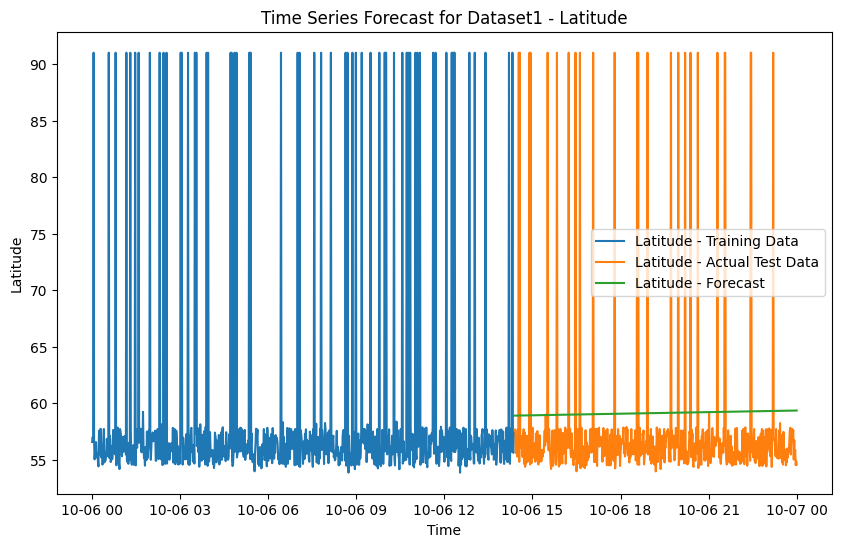

Mean Squared Error: 54.21198444167714


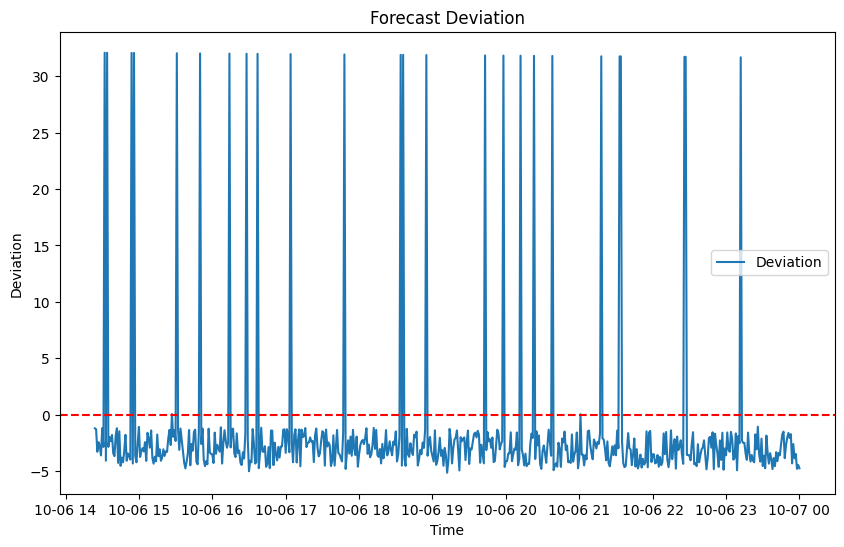


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 4
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/28655621.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df4_subset['# Timestamp'] = pd.to_datetime(df4_subset['# Timestamp'])
/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/28655621.py:13: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:46:43 - cmdstanpy - INFO - Chain [1] start processing
19:46:43 - cmdstanpy - INFO - Chain [1] done processing


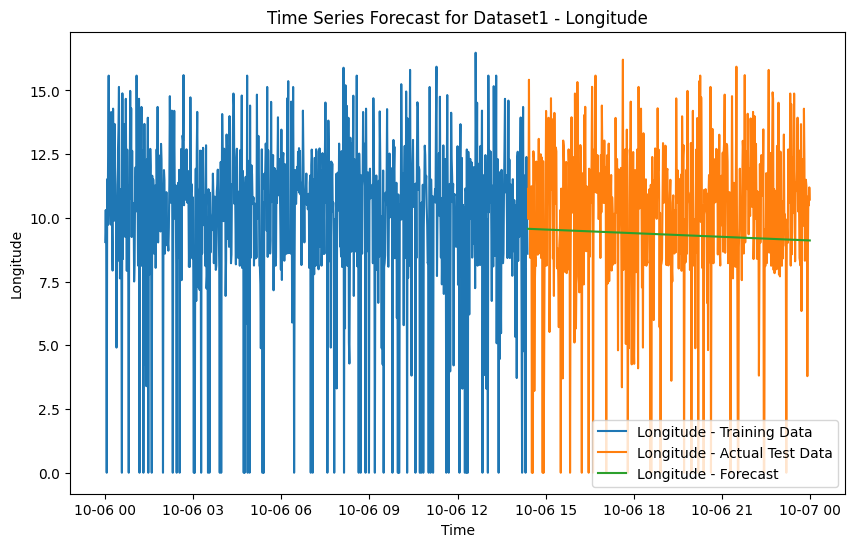

Mean Squared Error: 10.22905208283739


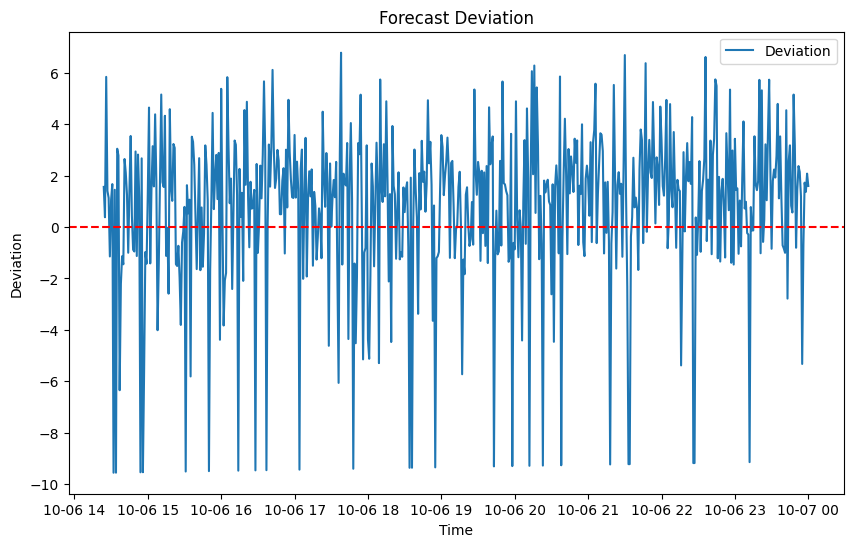


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 5
Exiting the program. Goodbye!


In [127]:
combined_data4 = pd.DataFrame()
while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-4): ")

    if choice == '5':
        print("Exiting the program. Goodbye!")
        break
    elif choice in ['1', '2', '3', '4']:
        try:
            mmsi = input("Enter MMSI: ")  # Get the MMSI from the user
            df4_subset = df4[df4['MMSI'] == int(mmsi)]  # Subset the dataset based on the given MMSI
            
        except ValueError:
            print("Invalid input. Please enter a valid integer for the interval.")
            continue

        if choice == '1':
            columns = ['SOG']
            noise_levels = [0.5]
        elif choice == '2':
            columns = ['COG']
            noise_levels = [0.3]
        elif choice == '3':
            columns = ['Latitude']
            noise_levels = [0.3]
        elif choice == '4':
            columns = ['Longitude']
            noise_levels = [0.3]
        else:
            print("Invalid choice. Please enter a number from 1 to 4.")
            continue
        
        # Generate time series data
        time_series_data4 = create_time_series4(start_date='2023-10-06', end_date='2023-10-07', df4=df4_subset, interval_minutes=1, columns=columns, noise_levels=noise_levels)
        
        # Append to the DataFrame
        combined_data4 = pd.concat([combined_data4, time_series_data4[columns]], axis=1)


        # Split data into training and testing sets (80% training, 20% testing)
        train_data, test_data = train_test_split(time_series_data4, test_size=0.4, shuffle=False)

        # Rename columns to 'ds' and 'y' for Prophet
        train_data.rename(columns={columns[0]: 'y'}, inplace=True)
        test_data.rename(columns={columns[0]: 'y'}, inplace=True)

        # Convert 'ds' column to datetime format
        train_data['ds'] = pd.to_datetime(train_data['ds'])
        test_data['ds'] = pd.to_datetime(test_data['ds'])

        # Train Prophet model
        prophet_model = Prophet()
        prophet_model.fit(train_data)

        # Create a dataframe with future dates for prediction
        future = prophet_model.make_future_dataframe(periods=len(test_data), freq='1min')

        # Make predictions
        forecast = prophet_model.predict(future)

        # Plot the forecast and actual test data
        plot_prophet_forecast4(train_data, test_data, forecast, columns)

        # Evaluate performance using mean squared error
        mse = mean_squared_error(test_data['y'], forecast[-len(test_data):]['yhat'])
        print(f'Mean Squared Error: {mse}')

        # Calculate deviation
        test_data['deviation'] = test_data['y'] - forecast[-len(test_data):]['yhat']

        # Visualize deviation
        plt.figure(figsize=(10, 6))
        plt.plot(test_data['ds'], test_data['deviation'], label='Deviation')
        plt.axhline(y=0, color='r', linestyle='--')
        plt.title('Forecast Deviation')
        plt.xlabel('Time')
        plt.ylabel('Deviation')
        plt.legend()
        plt.show()

# After the loop ends, you'll have all time series data stored in df_all_time_series_data1


In [128]:
# 220068000

In [129]:
combined_data4

,SOG,COG,Latitude,Longitude
0,0.469362,-0.287591,56.569527,9.052375
1,0.394011,0.486415,56.990907,10.308267
2,0.012466,-0.226232,56.794833,8.863783
3,-0.113050,-0.057618,91.000000,0.000000
4,0.128550,0.492779,56.716570,11.519048
...,...,...,...,...
1436,-0.116529,-0.308772,55.471755,8.424163
1437,0.111587,0.334619,55.856440,10.847287
1438,0.245485,-0.277440,54.531793,10.489143
1439,-0.043410,0.297222,54.872385,11.196940


In [130]:
df12345 =pd.concat([df1234,combined_data4], axis =0)

In [131]:
df12345

,SOG,COG,Latitude,Longitude
0,0.323357,-0.155061,-0.016830,-0.179949
1,0.315885,-0.581238,-0.556230,-0.385583
2,0.914108,0.344985,-0.103316,0.119060
3,-0.434664,0.658695,0.116240,0.157335
4,-0.594001,-0.245701,0.234424,0.282610
...,...,...,...,...
1436,-0.116529,-0.308772,55.471755,8.424163
1437,0.111587,0.334619,55.856440,10.847287
1438,0.245485,-0.277440,54.531793,10.489143
1439,-0.043410,0.297222,54.872385,11.196940


In [132]:
## Training Dataset 1,2,3,4 and Testing Dataset : 5 


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 1


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/3072780804.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:46:45 - cmdstanpy - INFO - Chain [1] start processing
19:46:45 - cmdstanpy - INFO - Chain [1] done processing


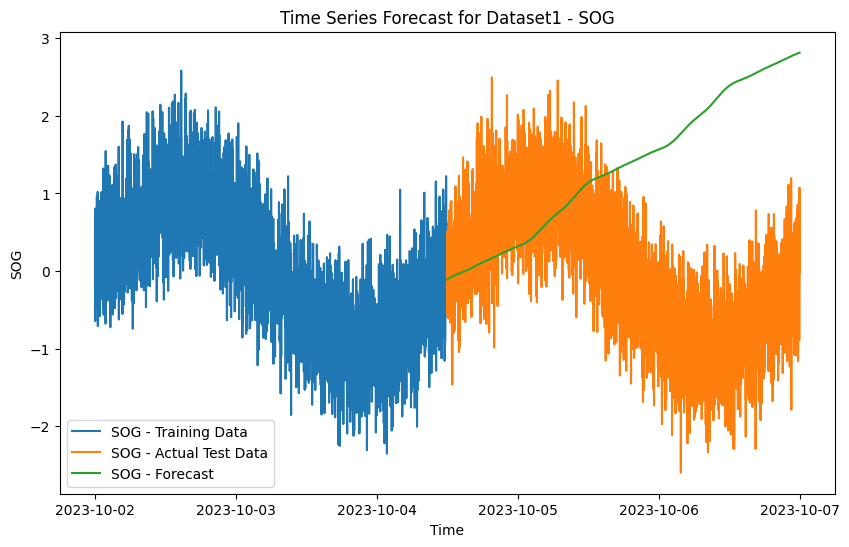

Mean Squared Error: 4.391195692540754
Standard Deviation :  1.609059734113442


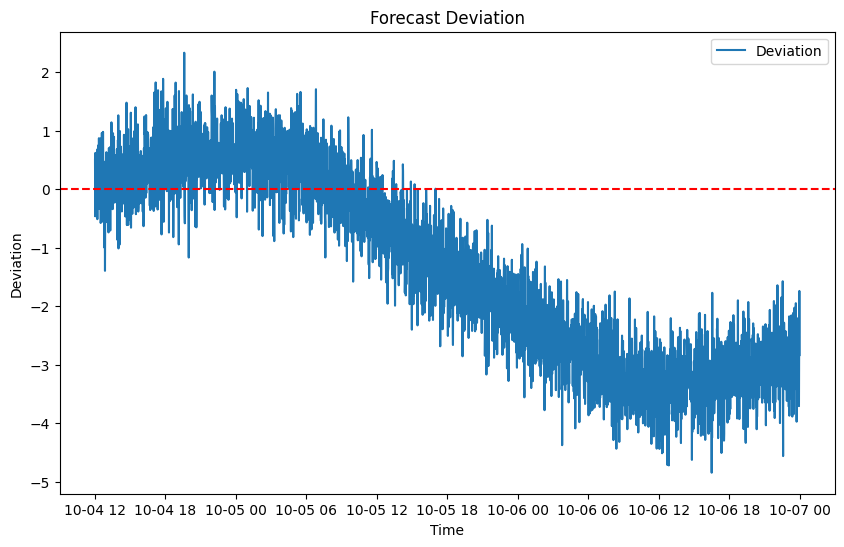


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 2


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/3072780804.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:46:46 - cmdstanpy - INFO - Chain [1] start processing
19:46:46 - cmdstanpy - INFO - Chain [1] done processing


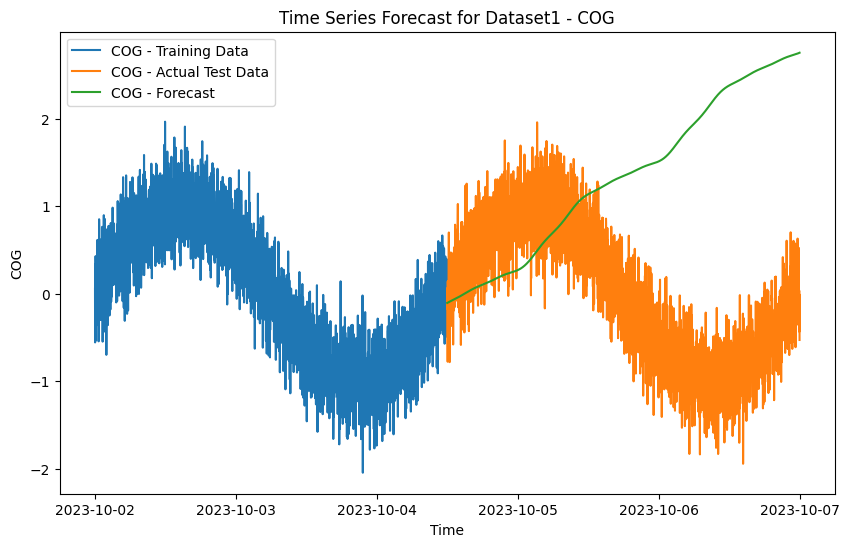

Mean Squared Error: 4.152998689733114
Standard Deviation :  1.5408520665727274


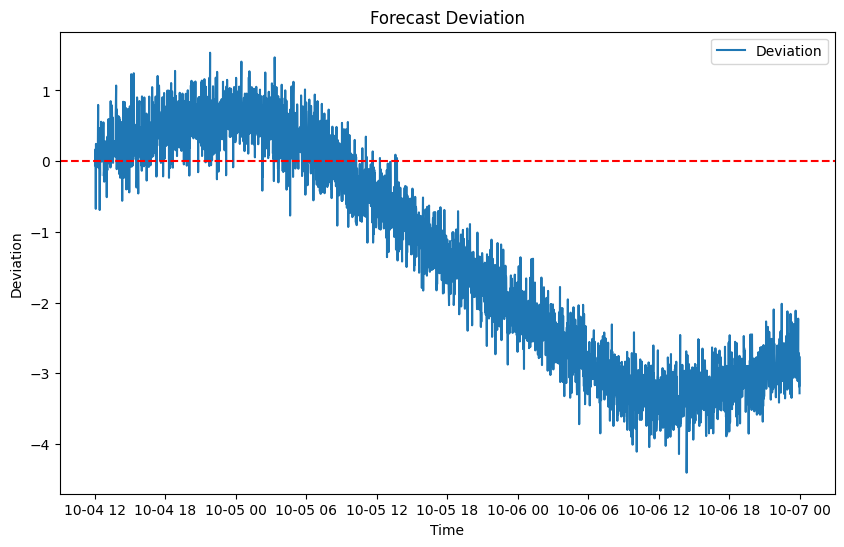


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 3


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/3072780804.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:46:48 - cmdstanpy - INFO - Chain [1] start processing
19:46:48 - cmdstanpy - INFO - Chain [1] done processing


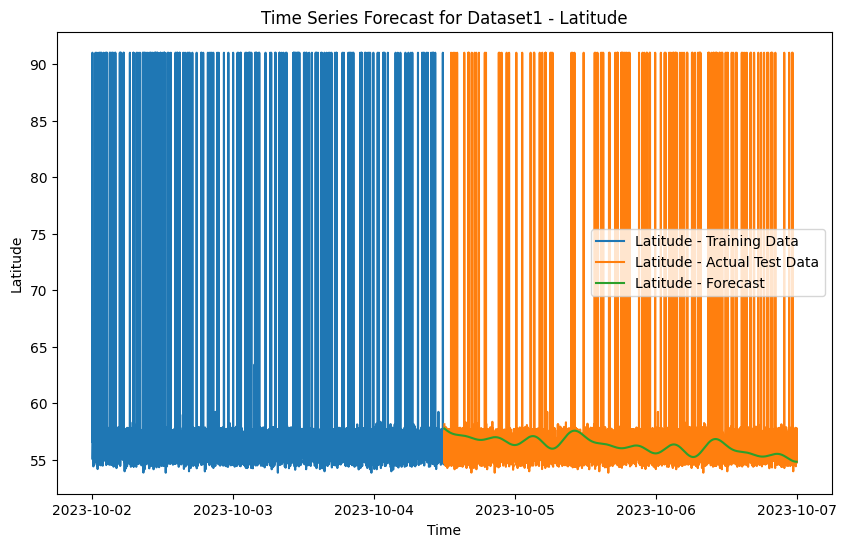

Mean Squared Error: 45.696693348475186
Standard Deviation :  6.674134173985575


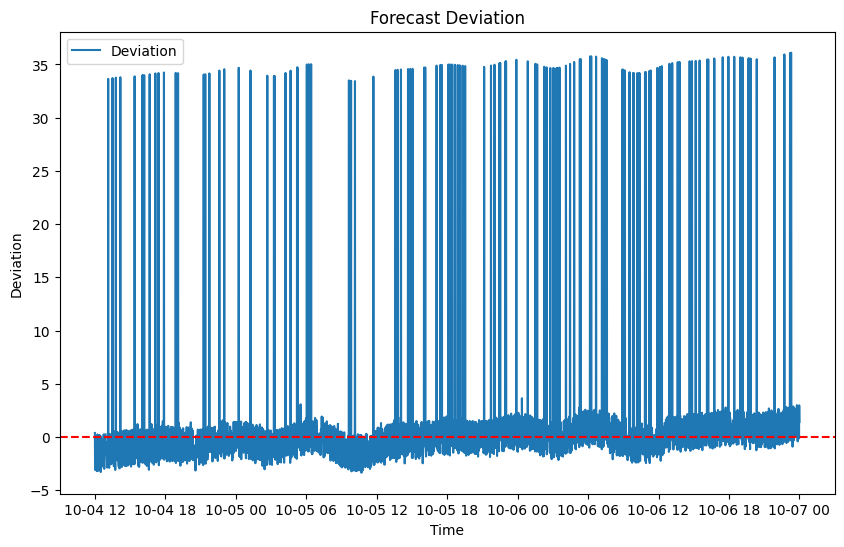


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 4


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/3072780804.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:46:53 - cmdstanpy - INFO - Chain [1] start processing
19:46:53 - cmdstanpy - INFO - Chain [1] done processing


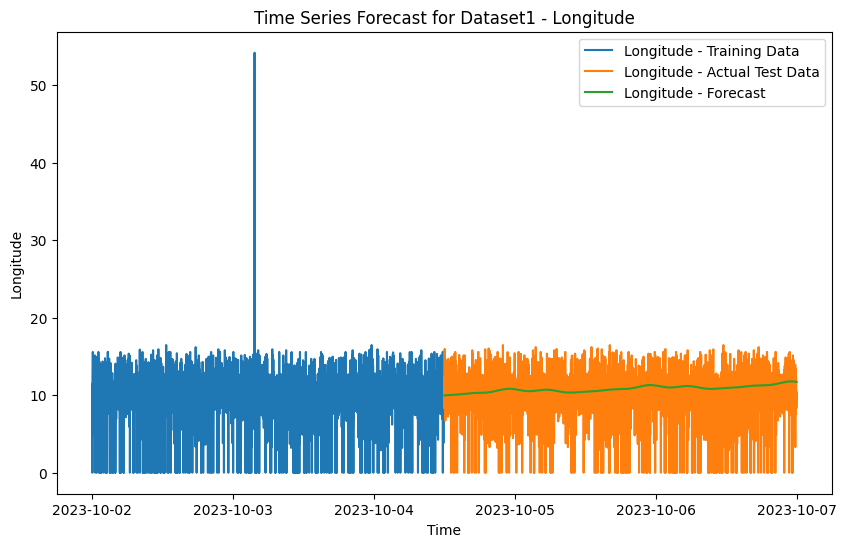

Mean Squared Error: 9.78913799044916
Standard Deviation :  3.053189448634831


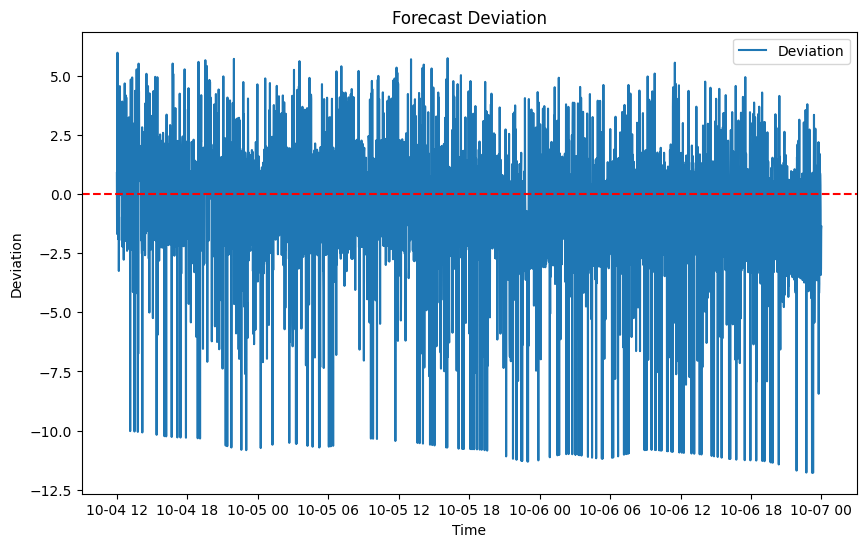


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 5
Exiting the program. Goodbye!


In [133]:
def create_time_series12345(start_date,end_date,df12345, interval_minutes, columns, noise_levels=None):
    # Generate datetime range with even intervals
    date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')

    # Create a DataFrame with datetime values
    new_df = pd.DataFrame(date_rng, columns=['ds'])

    # Generate time series values for each specified column
    for col, noise_level in zip(columns, noise_levels):
        #np.random.seed(42)
        if col.lower() == 'latitude':
            new_df[col] = df[col]
        elif col.lower() == 'longitude':
            new_df[col] = df[col]
        elif col.lower() == 'SOG':
            new_df[col] = df[col]
        elif col.lower() == 'COG':
            new_df[col] = df[col]
        else:
            new_df[col] = np.sin(np.linspace(0, 4 * np.pi, len(new_df))) + np.random.normal(0, noise_level, len(new_df))

    return new_df

def plot_prophet_forecast12345(train_data, test_data, forecast, columns):
    for col in columns:
        plt.figure(figsize=(10, 6))
        plt.plot(train_data['ds'], train_data['y'], label=f'{col} - Training Data')
        plt.plot(test_data['ds'], test_data['y'], label=f'{col} - Actual Test Data')
        plt.plot(test_data['ds'], forecast[-len(test_data):]['yhat'], label=f'{col} - Forecast')
        plt.title(f'Time Series Forecast for Dataset1 - {col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()
        
## PRACTCIE


while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-4): ")

    if choice == '5':
        print("Exiting the program. Goodbye!")
        break
    elif choice in ['1', '2', '3','4']:
        if choice == '1':
            columns = ['SOG']
            noise_levels = [0.5]
        elif choice =='2':
            columns=['COG']
            noise_levels=[0.3]
        elif choice == '3':
            columns = ['Latitude']
            noise_levels = [0.3]
        elif choice == '4':
            columns = ['Longitude']
            noise_levels = [0.3]
    else:
        print("Invalid choice. Please enter a number from 1 to 4.")
        continue
        
     # First, you need to create the training and testing datasets separately
    # Let's assume your first dataset is stored in df and the second dataset is stored in df1
    time_series_data12345 = create_time_series12345(start_date='2023-10-02', end_date='2023-10-07', df12345=df12345, interval_minutes=1, columns=columns, noise_levels=noise_levels)
        
    
    train_data, test_data = train_test_split(time_series_data12345, test_size=0.5, shuffle=False)

    
    # Rename columns to 'ds' and 'y' for Prophet

    train_data.rename(columns={columns[0]: 'y'}, inplace=True)
    test_data.rename(columns={columns[0]: 'y'}, inplace=True)
    
    # Convert 'ds' column to datetime format
    train_data['ds'] = pd.to_datetime(train_data['ds'])
    test_data['ds'] = pd.to_datetime(test_data['ds'])

    # Train Prophet model
    prophet_model = Prophet()
    prophet_model.fit(train_data)

    # Create a dataframe with future dates for prediction
    future = prophet_model.make_future_dataframe(periods=len(test_data), freq='1min')

    # Make predictions
    forecast = prophet_model.predict(future)

    # Plot the forecast and actual test data
    plot_prophet_forecast12(train_data, test_data, forecast, columns)

    # Evaluate performance using mean squared error
    mse = mean_squared_error(test_data['y'], forecast[-len(test_data):]['yhat'])
    print(f'Mean Squared Error: {mse}')

    # Calculate deviation
    test_data['deviation'] = test_data['y'] - forecast[-len(test_data):]['yhat']
    
    # Calculate deviation percentage using stdev function
    sd = np.std(test_data['deviation']) 
    print("Standard Deviation : ", sd)
    
    # Calculate standard deviation percentage
    
    # Visualize deviation
    plt.figure(figsize=(10, 6))
    plt.plot(test_data['ds'], test_data['deviation'], label='Deviation')
    plt.axhline(y=0, color='r', linestyle='--')
    plt.title('Forecast Deviation')
    plt.xlabel('Time')
    plt.ylabel('Deviation')
    plt.legend()
    plt.show()
   
    

## 6th Dataset

In [134]:
def create_time_series5(start_date,end_date,df5, interval_minutes, columns, noise_levels=None):
    # Set the 'Timestamp' column as the index
    #df.set_index('# Timestamp', inplace=True)
    df5_subset['# Timestamp'] = pd.to_datetime(df5_subset['# Timestamp'])
    df5_subset.set_index('# Timestamp', inplace=True)
    # Resample the DataFrame to get one data point per minute
    resampled_df5 = df5.resample(f'{interval_minutes}1min').first().reset_index()
    
    resampled_df5 = df5.groupby([pd.Grouper(freq=f'{interval_minutes}1min'), 'MMSI']).min().reset_index()
    
    
    # Generate datetime range with even intervals
    date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')

    # Create a DataFrame with datetime values
    new_df = pd.DataFrame(date_rng, columns=['ds'])
        
    # Merge resampled data with the new DataFrame on the 'ds' column
    new_df = pd.merge(new_df, resampled_df5, how='left', left_on='ds', right_on='# Timestamp')

    # Drop the redundant '# Timestamp' column
    new_df.drop('# Timestamp', axis=1, inplace=True)

    
    # Generate time series values for each specified column
    for col, noise_level in zip(columns, noise_levels):
        if col.lower() == 'Latitude':
            new_df[col] = df[col]
        elif col.lower() == 'Longitude':
            new_df[col] = df[col]
        elif col.lower() =='SOG':
            new_df[col] =df[col]
        elif col.lower() =='COG':
            new_df[col] =df[col]    
        else:
            new_df[col] = np.sin(np.linspace(0, 4 * np.pi, len(new_df))) + np.random.normal(0, noise_level, len(new_df))

    return new_df

In [135]:
def plot_time_series5(df5,columns):
    for col in columns:
        plt.figure(figsize=(10,6))
        plt.plot(df5['ds'],df5[col],label=col)
        plt.title(f'Time Series Plot for Dataset df 4 -{col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()

# Menu-driven code
while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG ")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-5): ")

    if choice in ['1', '2', '3', '4']:
        mmsi = input("Enter MMSI: ")  # Get the MMSI from the user
        df5_subset = df5[df5['MMSI'] == int(mmsi)]  # Subset the dataset based on the given MMSI
        columns = ['SOG'] if choice == '1' else ['COG'] if choice == '2' else ['Latitude'] if choice == '3' else ['Longitude']
        noise_levels = [0.5] if choice == '1' else [0.3]  # Adjust noise levels as needed

        #time_series_data = create_time_series(start_date='2022-10-03',end_date='2022-10-04',df1=df_subset, interval_minutes=5, columns=columns, noise_levels=noise_levels)
        time_series_data5 = create_time_series5(start_date='2022-10-07', end_date='2022-10-08', df5=df5_subset, interval_minutes=1, columns=columns, noise_levels=noise_levels)

        plot_time_series5(time_series_data5, columns)
    elif choice == '5':
        print("Exiting the program. Goodbye!")
        break
    else:
        print("Invalid choice. Please enter a number from 1 to 5.")


In [136]:
def plot_prophet_forecast5(train_data, test_data, forecast, columns):
    for col in columns:
        plt.figure(figsize=(10, 6))
        plt.plot(train_data['ds'], train_data['y'], label=f'{col} - Training Data')
        plt.plot(test_data['ds'], test_data['y'], label=f'{col} - Actual Test Data')
        plt.plot(test_data['ds'], forecast[-len(test_data):]['yhat'], label=f'{col} - Forecast')
        plt.title(f'Time Series Forecast for Dataset1 - {col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 1
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/1374068751.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df5_subset['# Timestamp'] = pd.to_datetime(df5_subset['# Timestamp'])
/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/1374068751.py:13: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:46:59 - cmdstanpy - INFO - Chain [1] start processing
19:46:59 - cmdstanpy - INFO - Chain [1] done processing
/Users/amitsingh/anaconda3/envs/test/lib/python3.11/site-packages/prophet/forecaster.py:1854: FutureWarning: 'T' is deprecated and will be removed in a future version, please u

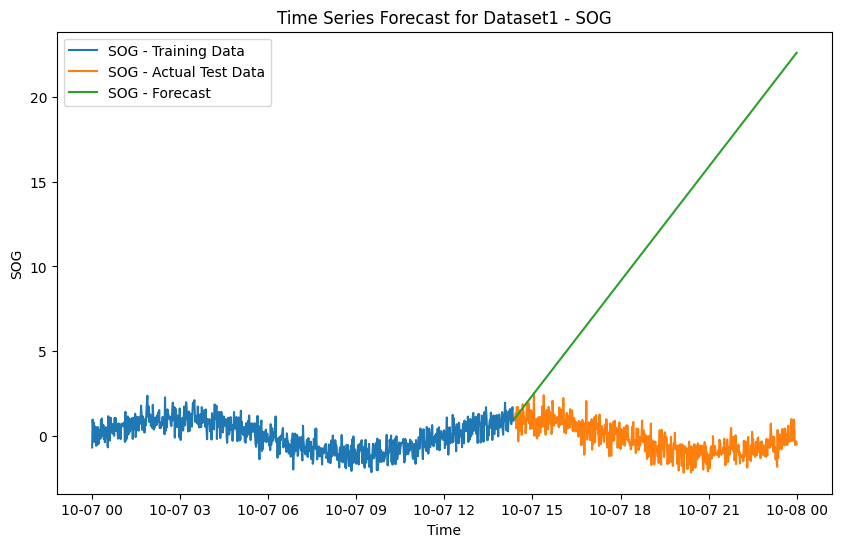

Mean Squared Error: 190.31555830274255


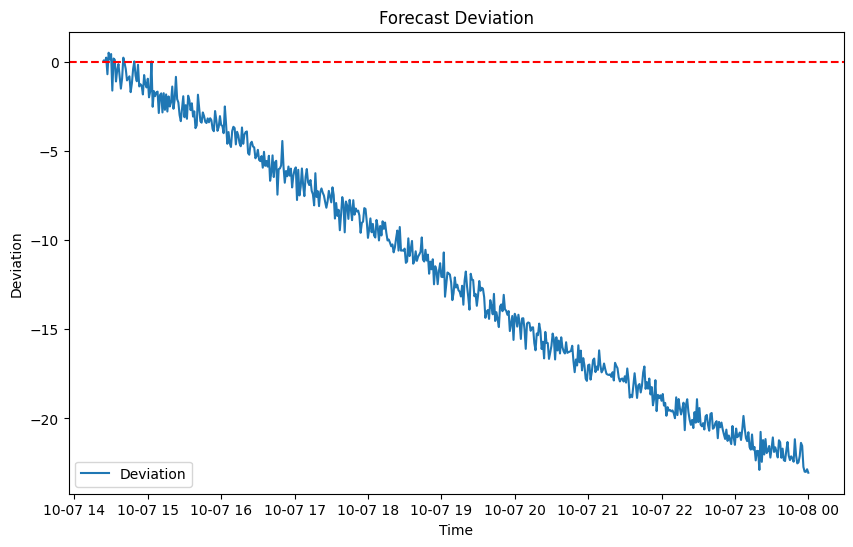


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 2
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/1374068751.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df5_subset['# Timestamp'] = pd.to_datetime(df5_subset['# Timestamp'])
/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/1374068751.py:13: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:47:01 - cmdstanpy - INFO - Chain [1] start processing
19:47:01 - cmdstanpy - INFO - Chain [1] done processing
/Users/amitsingh/anaconda3/envs/test/lib/python3.11/site-packages/prophet/forecaster.py:1854: FutureWarning: 'T' is deprecated and will be removed in a future version, please u

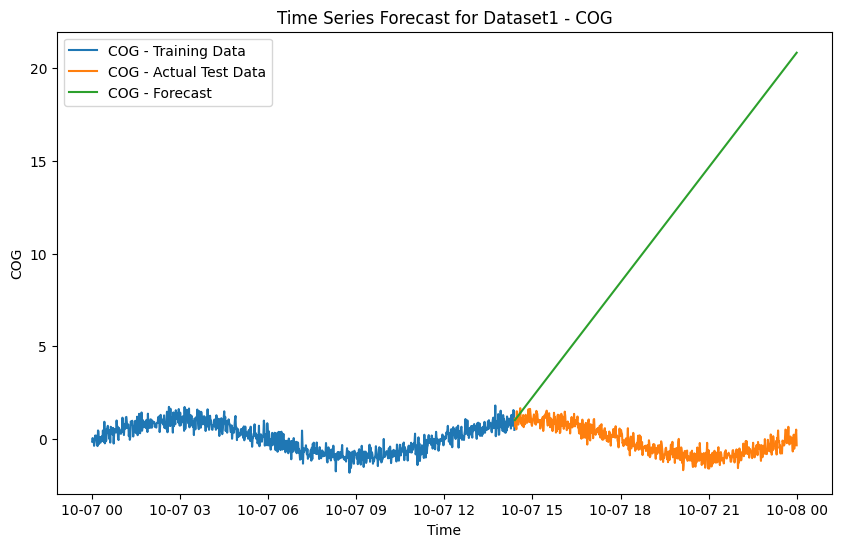

Mean Squared Error: 162.04765209328215


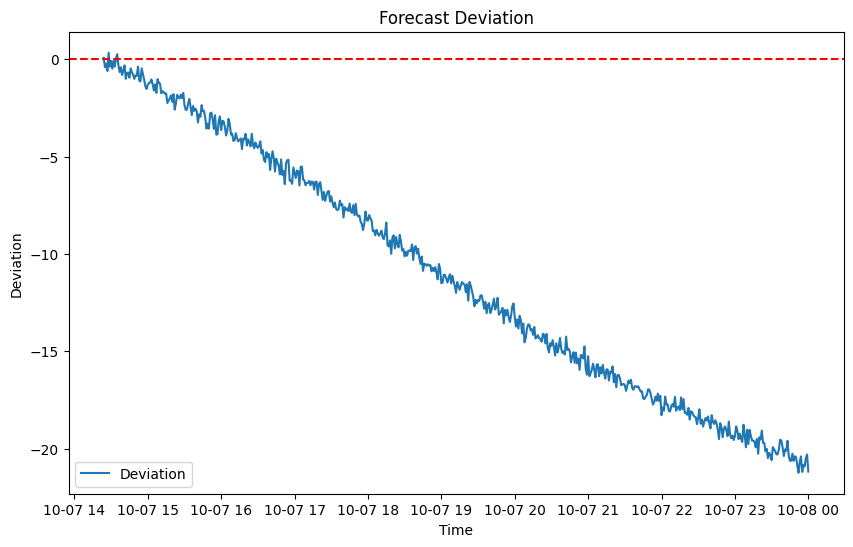


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 3
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/1374068751.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df5_subset['# Timestamp'] = pd.to_datetime(df5_subset['# Timestamp'])
/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/1374068751.py:13: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:47:03 - cmdstanpy - INFO - Chain [1] start processing
19:47:03 - cmdstanpy - INFO - Chain [1] done processing
/Users/amitsingh/anaconda3/envs/test/lib/python3.11/site-packages/prophet/forecaster.py:1854: FutureWarning: 'T' is deprecated and will be removed in a future version, please u

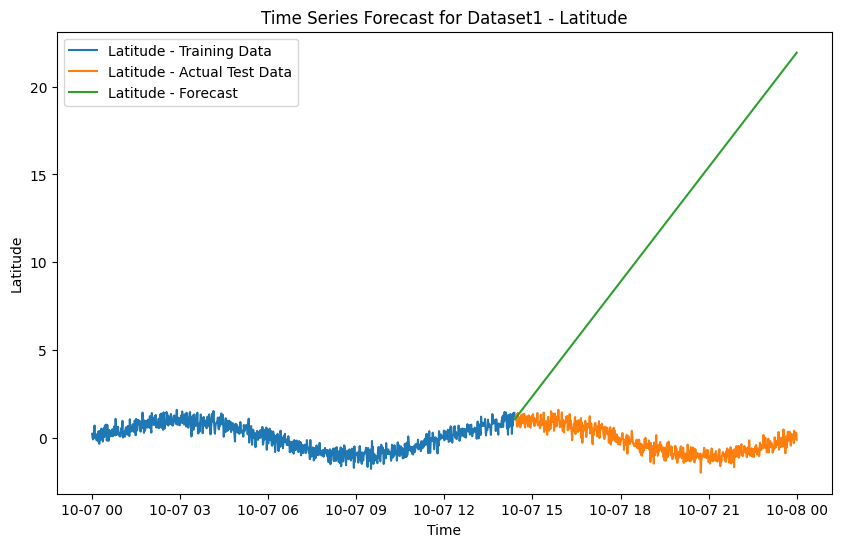

Mean Squared Error: 179.7552833366634


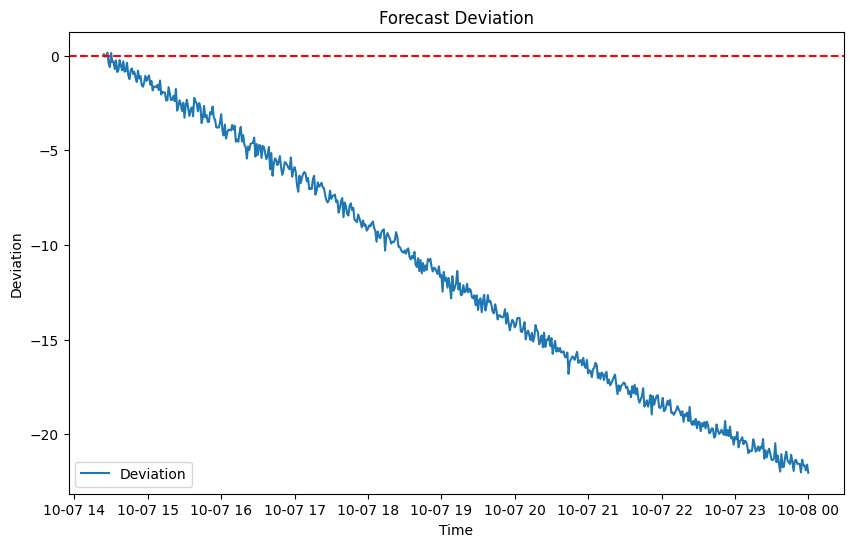


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 4
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/1374068751.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df5_subset['# Timestamp'] = pd.to_datetime(df5_subset['# Timestamp'])
/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/1374068751.py:13: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:47:04 - cmdstanpy - INFO - Chain [1] start processing
19:47:04 - cmdstanpy - INFO - Chain [1] done processing
/Users/amitsingh/anaconda3/envs/test/lib/python3.11/site-packages/prophet/forecaster.py:1854: FutureWarning: 'T' is deprecated and will be removed in a future version, please u

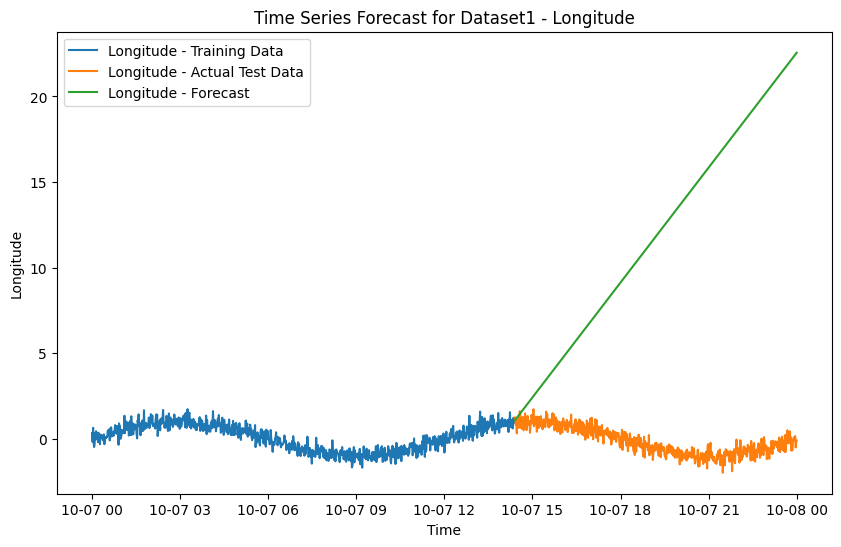

Mean Squared Error: 189.59586354995082


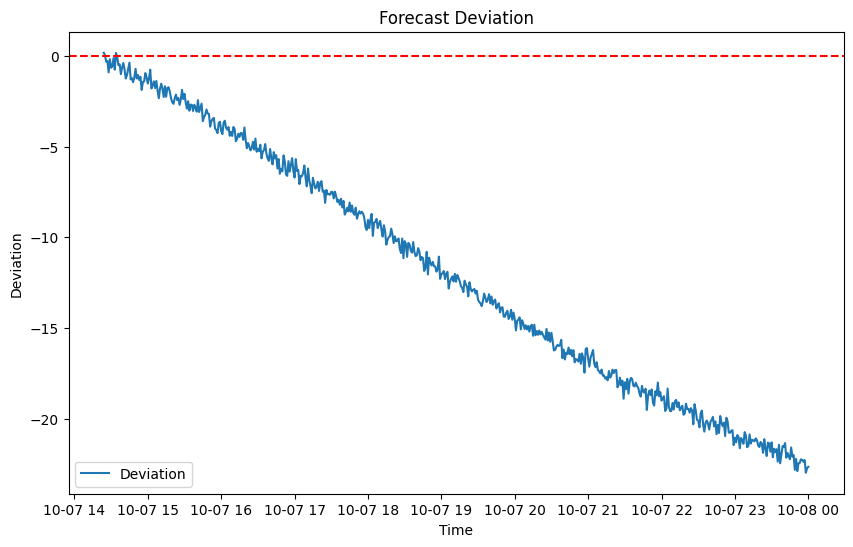


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 5
Exiting the program. Goodbye!


In [137]:
combined_data5 = pd.DataFrame()
while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-4): ")

    if choice == '5':
        print("Exiting the program. Goodbye!")
        break
    elif choice in ['1', '2', '3', '4']:
        try:
            mmsi = input("Enter MMSI: ")  # Get the MMSI from the user
            df5_subset = df5[df5['MMSI'] == int(mmsi)]  # Subset the dataset based on the given MMSI
            
        except ValueError:
            print("Invalid input. Please enter a valid integer for the interval.")
            continue

        if choice == '1':
            columns = ['SOG']
            noise_levels = [0.5]
        elif choice == '2':
            columns = ['COG']
            noise_levels = [0.3]
        elif choice == '3':
            columns = ['Latitude']
            noise_levels = [0.3]
        elif choice == '4':
            columns = ['Longitude']
            noise_levels = [0.3]
        else:
            print("Invalid choice. Please enter a number from 1 to 4.")
            continue
        
        # Generate time series data
        time_series_data5 = create_time_series5(start_date='2023-10-07', end_date='2023-10-08', df5=df5_subset, interval_minutes=1, columns=columns, noise_levels=noise_levels)
        
        # Append to the DataFrame
        combined_data5 = pd.concat([combined_data5, time_series_data5[columns]], axis=1)

        # Split data into training and testing sets (80% training, 20% testing)
        train_data, test_data = train_test_split(time_series_data5, test_size=0.4, shuffle=False)

        # Rename columns to 'ds' and 'y' for Prophet
        train_data.rename(columns={columns[0]: 'y'}, inplace=True)
        test_data.rename(columns={columns[0]: 'y'}, inplace=True)

        # Convert 'ds' column to datetime format
        train_data['ds'] = pd.to_datetime(train_data['ds'])
        test_data['ds'] = pd.to_datetime(test_data['ds'])

        # Train Prophet model
        prophet_model = Prophet()
        prophet_model.fit(train_data)

        # Create a dataframe with future dates for prediction
        future = prophet_model.make_future_dataframe(periods=len(test_data), freq='5T')

        # Make predictions
        forecast = prophet_model.predict(future)

        # Plot the forecast and actual test data
        plot_prophet_forecast5(train_data, test_data, forecast, columns)

        # Evaluate performance using mean squared error
        mse = mean_squared_error(test_data['y'], forecast[-len(test_data):]['yhat'])
        print(f'Mean Squared Error: {mse}')

        # Calculate deviation
        test_data['deviation'] = test_data['y'] - forecast[-len(test_data):]['yhat']

        # Visualize deviation
        plt.figure(figsize=(10, 6))
        plt.plot(test_data['ds'], test_data['deviation'], label='Deviation')
        plt.axhline(y=0, color='r', linestyle='--')
        plt.title('Forecast Deviation')
        plt.xlabel('Time')
        plt.ylabel('Deviation')
        plt.legend()
        plt.show()

# After the loop ends, you'll have all time series data stored in df_all_time_series_data1


In [138]:
combined_data5

,SOG,COG,Latitude,Longitude
0,-0.654709,-0.144957,0.237711,0.336004
1,0.987035,0.047414,-0.003987,-0.184219
2,0.488380,-0.090437,-0.081114,0.643869
3,0.819689,-0.035595,0.019462,-0.178698
4,-0.329240,-0.371616,0.448784,-0.478801
...,...,...,...,...
1436,-0.283851,-0.149858,0.139775,0.024612
1437,-0.512284,-0.183395,0.167939,0.160727
1438,-0.487456,0.275248,-0.046621,-0.505805
1439,-0.301846,0.502237,0.298137,-0.218091


In [139]:
df1_6=pd.concat([df12345,combined_data5],axis=0)

In [140]:
df1_6

,SOG,COG,Latitude,Longitude
0,0.323357,-0.155061,-0.016830,-0.179949
1,0.315885,-0.581238,-0.556230,-0.385583
2,0.914108,0.344985,-0.103316,0.119060
3,-0.434664,0.658695,0.116240,0.157335
4,-0.594001,-0.245701,0.234424,0.282610
...,...,...,...,...
1436,-0.283851,-0.149858,0.139775,0.024612
1437,-0.512284,-0.183395,0.167939,0.160727
1438,-0.487456,0.275248,-0.046621,-0.505805
1439,-0.301846,0.502237,0.298137,-0.218091


In [141]:
## Prediction from Dataset 1,2,3,4,5 and 6


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 1


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/724376378.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:47:06 - cmdstanpy - INFO - Chain [1] start processing
19:47:06 - cmdstanpy - INFO - Chain [1] done processing


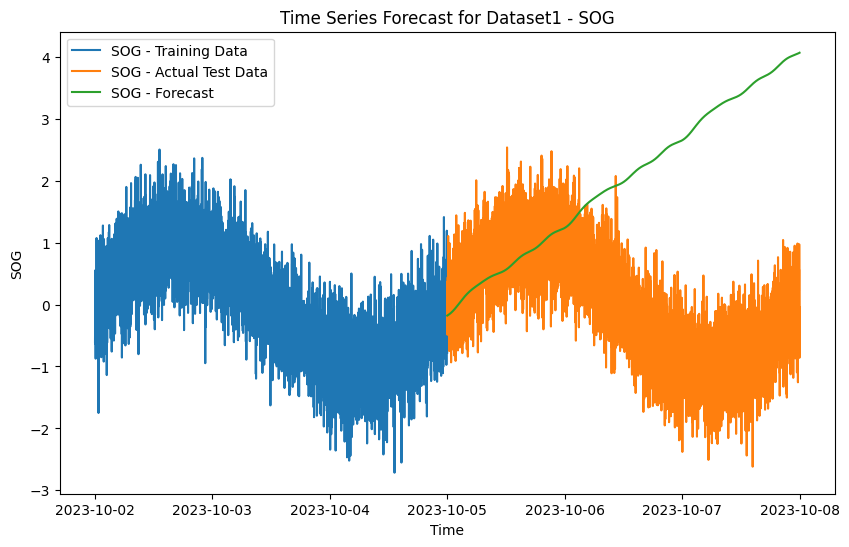

Mean Squared Error: 7.695006547500936
Standard Deviation :  1.9248615810846637


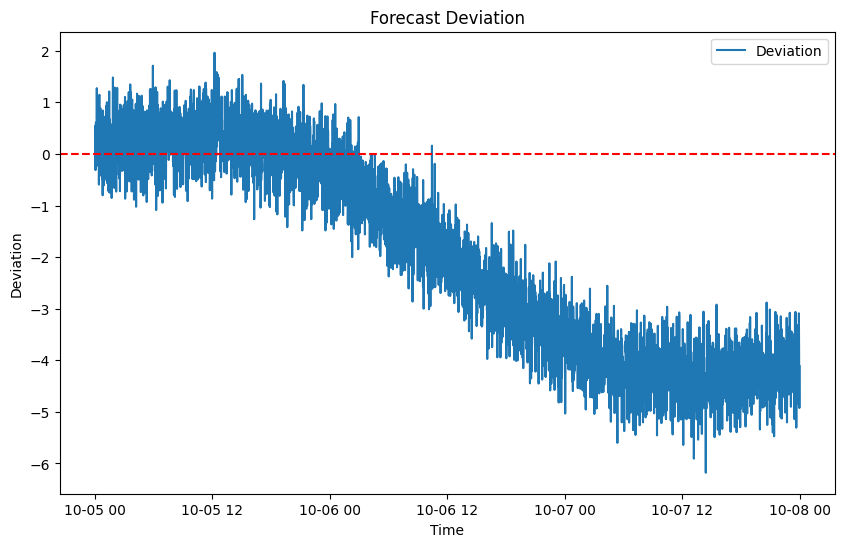


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 2


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/724376378.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:47:08 - cmdstanpy - INFO - Chain [1] start processing
19:47:08 - cmdstanpy - INFO - Chain [1] done processing


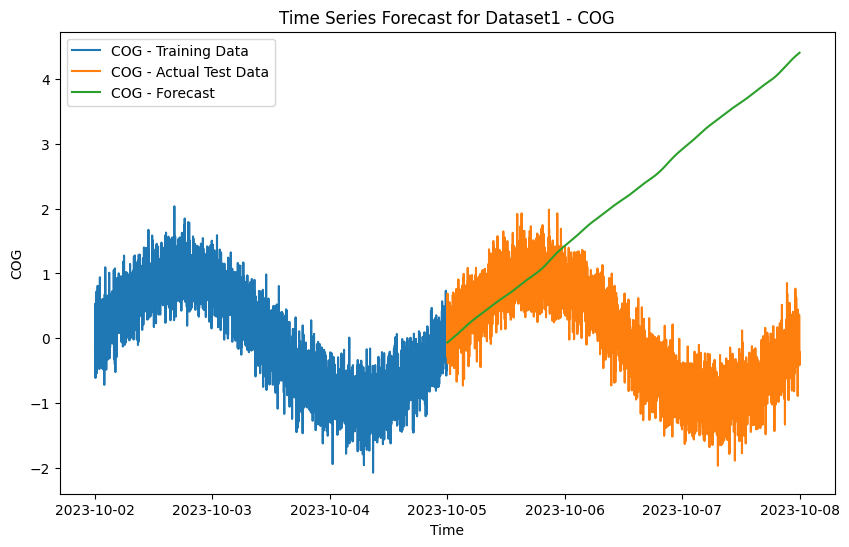

Mean Squared Error: 8.295519194660955
Standard Deviation :  1.919259148985392


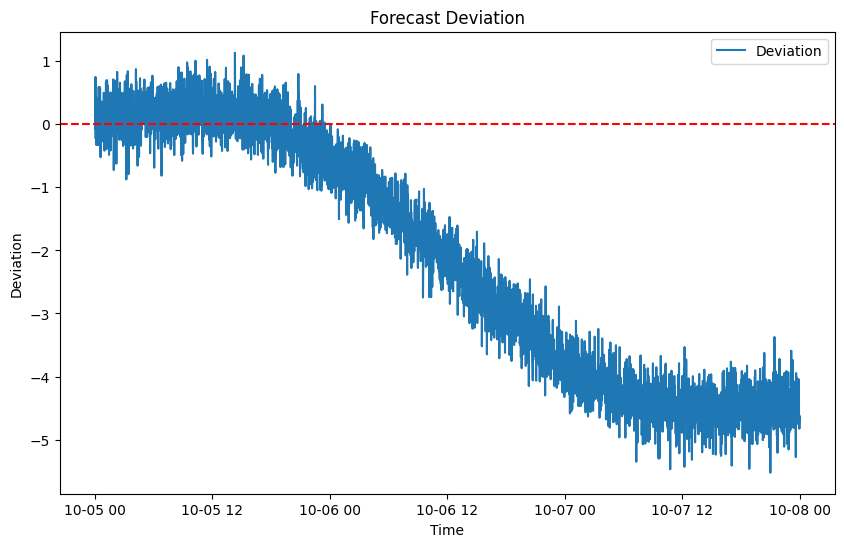


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 3


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/724376378.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:47:09 - cmdstanpy - INFO - Chain [1] start processing
19:47:10 - cmdstanpy - INFO - Chain [1] done processing


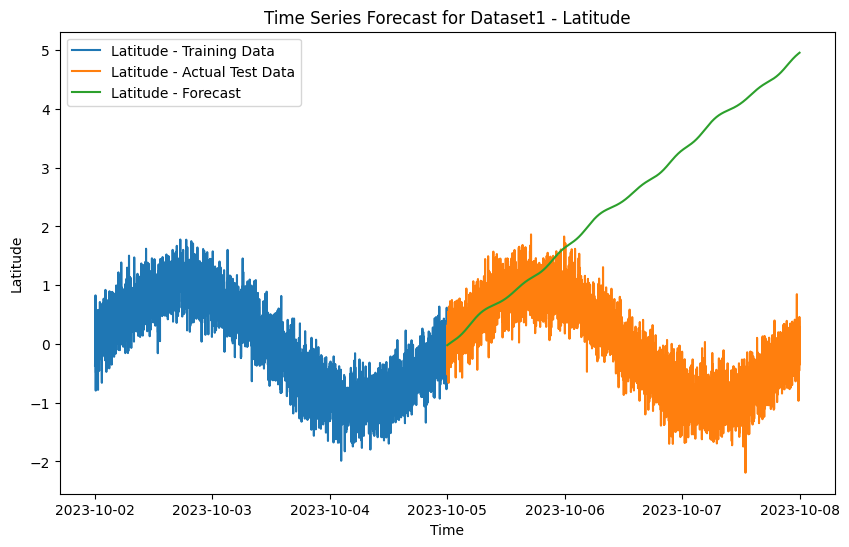

Mean Squared Error: 10.25565078251539
Standard Deviation :  2.048672519033004


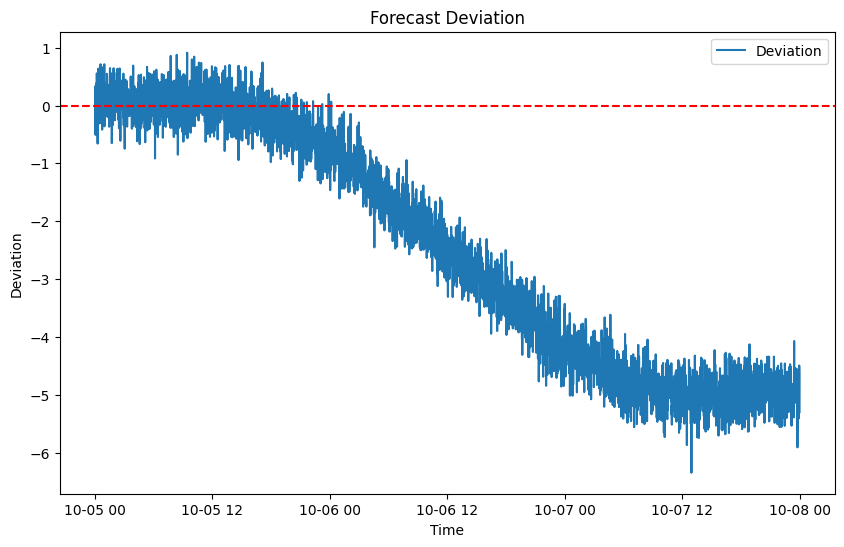


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 4


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/724376378.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:47:11 - cmdstanpy - INFO - Chain [1] start processing
19:47:11 - cmdstanpy - INFO - Chain [1] done processing


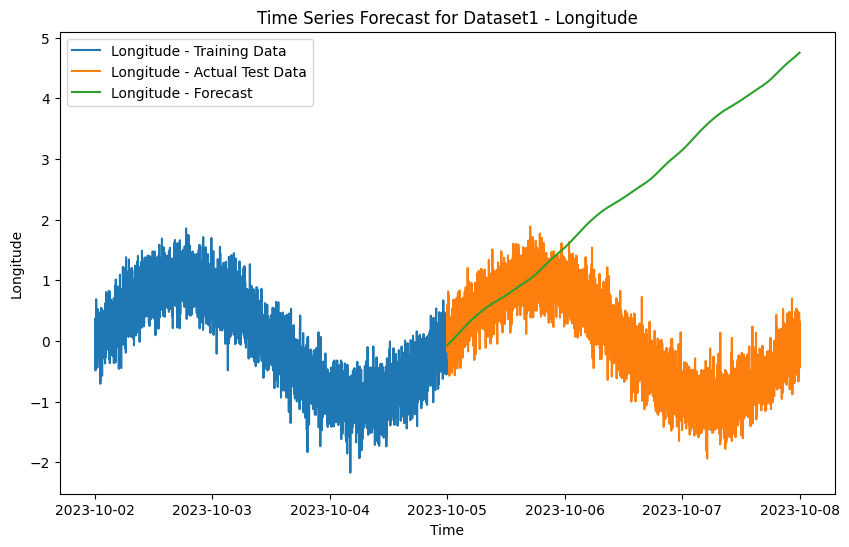

Mean Squared Error: 9.615272688545502
Standard Deviation :  2.012600813105796


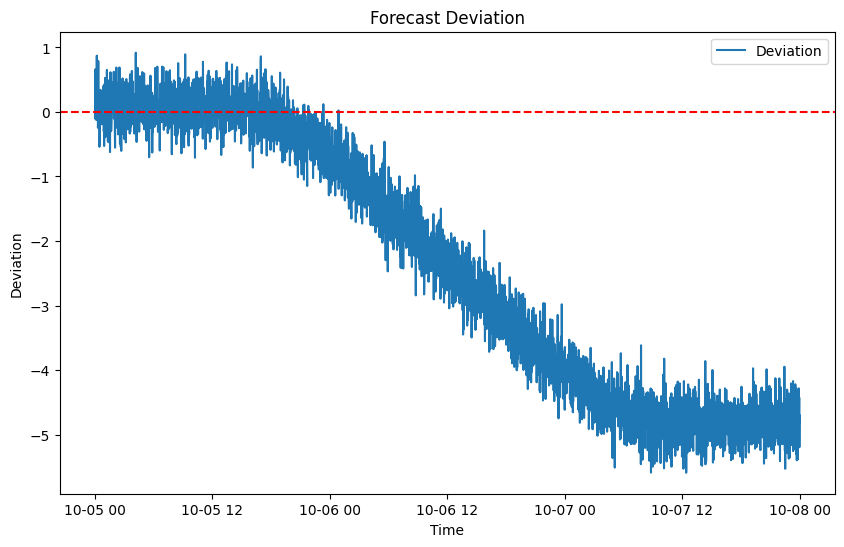


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 5
Exiting the program. Goodbye!


In [142]:
 def create_time_series1_6(start_date,end_date,df1_6, interval_minutes, columns, noise_levels=None):
    # Generate datetime range with even intervals
    date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')

    # Create a DataFrame with datetime values
    new_df = pd.DataFrame(date_rng, columns=['ds'])

    # Generate time series values for each specified column
    for col, noise_level in zip(columns, noise_levels):
        if col.lower() == 'Latitude':
            new_df[col] = df[col]
        elif col.lower() == 'Longitude':
            new_df[col] = df[col]
        elif col.lower() =='SOG':
            new_df[col] =df[col]
        elif col.lower() =='COG':
            new_df[col] =df[col]    
        else:
            new_df[col] = np.sin(np.linspace(0, 4 * np.pi, len(new_df))) + np.random.normal(0, noise_level, len(new_df))

    return new_df

def plot_prophet_forecast1_6(train_data, test_data, forecast, columns):
    for col in columns:
        plt.figure(figsize=(10, 6))
        plt.plot(train_data['ds'], train_data['y'], label=f'{col} - Training Data')
        plt.plot(test_data['ds'], test_data['y'], label=f'{col} - Actual Test Data')
        plt.plot(test_data['ds'], forecast[-len(test_data):]['yhat'], label=f'{col} - Forecast')
        plt.title(f'Time Series Forecast for Dataset1 - {col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()
        
## PRACTCIE


while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-4): ")

    if choice == '5':
        print("Exiting the program. Goodbye!")
        break
    elif choice in ['1', '2', '3','4']:
        if choice == '1':
            columns = ['SOG']
            noise_levels = [0.5]
        elif choice =='2':
            columns=['COG']
            noise_levels=[0.3]
        elif choice == '3':
            columns = ['Latitude']
            noise_levels = [0.3]
        elif choice == '4':
            columns = ['Longitude']
            noise_levels = [0.3]
    else:
        print("Invalid choice. Please enter a number from 1 to 4.")
        continue
        
     # First, you need to create the training and testing datasets separately
    # Let's assume your first dataset is stored in df and the second dataset is stored in df1
    time_series_data1_6 = create_time_series1_6(start_date='2023-10-02', end_date='2023-10-08', df1_6=df1_6, interval_minutes=1, columns=columns, noise_levels=noise_levels)
        
    
    train_data, test_data = train_test_split(time_series_data1_6, test_size=0.5, shuffle=False)

    
    # Rename columns to 'ds' and 'y' for Prophet

    train_data.rename(columns={columns[0]: 'y'}, inplace=True)
    test_data.rename(columns={columns[0]: 'y'}, inplace=True)
    
    # Convert 'ds' column to datetime format
    train_data['ds'] = pd.to_datetime(train_data['ds'])
    test_data['ds'] = pd.to_datetime(test_data['ds'])

    # Train Prophet model
    prophet_model = Prophet()
    prophet_model.fit(train_data)

    # Create a dataframe with future dates for prediction
    future = prophet_model.make_future_dataframe(periods=len(test_data), freq='1min')

    # Make predictions
    forecast = prophet_model.predict(future)

    # Plot the forecast and actual test data
    plot_prophet_forecast12(train_data, test_data, forecast, columns)

    # Evaluate performance using mean squared error
    mse = mean_squared_error(test_data['y'], forecast[-len(test_data):]['yhat'])
    print(f'Mean Squared Error: {mse}')

    # Calculate deviation
    test_data['deviation'] = test_data['y'] - forecast[-len(test_data):]['yhat']
    
    # Calculate deviation percentage using stdev function
    sd = np.std(test_data['deviation']) 
    print("Standard Deviation : ", sd)
    
    # Calculate standard deviation percentage
    
    # Visualize deviation
    plt.figure(figsize=(10, 6))
    plt.plot(test_data['ds'], test_data['deviation'], label='Deviation')
    plt.axhline(y=0, color='r', linestyle='--')
    plt.title('Forecast Deviation')
    plt.xlabel('Time')
    plt.ylabel('Deviation')
    plt.legend()
    plt.show()
   
    

## Dataset 7

In [143]:
def create_time_series6(start_date,end_date,df6, interval_minutes, columns, noise_levels=None):
    # Set the 'Timestamp' column as the index
    #df.set_index('# Timestamp', inplace=True)
    df6_subset['# Timestamp'] = pd.to_datetime(df6_subset['# Timestamp'])
    df6_subset.set_index('# Timestamp', inplace=True)
    # Resample the DataFrame to get one data point per minute
    resampled_df6 = df6.resample(f'{interval_minutes}1min').first().reset_index()
    
    resampled_df6 = df6.groupby([pd.Grouper(freq=f'{interval_minutes}1min'), 'MMSI']).min().reset_index()
    
    
    # Generate datetime range with even intervals
    date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')

    # Create a DataFrame with datetime values
    new_df = pd.DataFrame(date_rng, columns=['ds'])
        
    # Merge resampled data with the new DataFrame on the 'ds' column
    new_df = pd.merge(new_df, resampled_df6, how='left', left_on='ds', right_on='# Timestamp')

    # Drop the redundant '# Timestamp' column
    new_df.drop('# Timestamp', axis=1, inplace=True)

    
    # Generate time series values for each specified column
    for col, noise_level in zip(columns, noise_levels):
        if col.lower() == 'Latitude':
            new_df[col] = df[col]
        elif col.lower() == 'Longitude':
            new_df[col] = df[col]
        elif col.lower() =='SOG':
            new_df[col] =df[col]
        elif col.lower() =='COG':
            new_df[col] =df[col]    
        else:
            new_df[col] = np.sin(np.linspace(0, 4 * np.pi, len(new_df))) + np.random.normal(0, noise_level, len(new_df))

    return new_df

In [144]:
def plot_time_series6(df6,columns,window=7):
    for col in columns:
        df6['Moving Average'] = df6[col].rolling(window=window).mean()
        plt.figure(figsize=(10,6))
        plt.plot(df6['ds'],df6[col],label=col)
        plt.plot(df6['ds'], df6['Moving Average'], label=f'{col} - Moving Average', linestyle='--', color='red')
        plt.title(f'Time Series Plot for Dataset df:6 -{col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()

# Menu-driven code
while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG ")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-5): ")

    if choice in ['1', '2', '3', '4']:
        mmsi = input("Enter MMSI: ")  # Get the MMSI from the user
        df6_subset = df6[df6['MMSI'] == int(mmsi)]  # Subset the dataset based on the given MMSI
        columns = ['SOG'] if choice == '1' else ['COG'] if choice == '2' else ['Latitude'] if choice == '3' else ['Longitude']
        noise_levels = [0.5] if choice == '1' else [0.3]  # Adjust noise levels as needed

        #time_series_data = create_time_series(start_date='2022-10-03',end_date='2022-10-04',df1=df_subset, interval_minutes=5, columns=columns, noise_levels=noise_levels)
        time_series_data6 = create_time_series6(start_date='2022-10-08', end_date='2022-10-09', df6=df6_subset, interval_minutes=1, columns=columns, noise_levels=noise_levels)

        plot_time_series6(time_series_data6, columns)
    elif choice == '5':
        print("Exiting the program. Goodbye!")
        break
    else:
        print("Invalid choice. Please enter a number from 1 to 5.")


In [145]:
def plot_prophet_forecast6(train_data, test_data, forecast, columns, window=7):
    for col in columns:
        # Compute moving average
        test_data['Moving Average'] = test_data['y'].rolling(window=window).mean()
        
        plt.figure(figsize=(10, 6))
        plt.plot(train_data['ds'], train_data['y'], label=f'{col} - Training Data')
        plt.plot(test_data['ds'], test_data['y'], label=f'{col} - Actual Test Data')
        plt.plot(test_data['ds'], forecast[-len(test_data):]['yhat'], label=f'{col} - Forecast')
        plt.plot(test_data['ds'], test_data['Moving Average'], label=f'{col} - Moving Average', linestyle='--', color='red')
        plt.title(f'Time Series Forecast for DF - {col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()



Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 1
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/96105628.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df6_subset['# Timestamp'] = pd.to_datetime(df6_subset['# Timestamp'])
/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/96105628.py:13: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:47:17 - cmdstanpy - INFO - Chain [1] start processing
19:47:17 - cmdstanpy - INFO - Chain [1] done processing
/Users/amitsingh/anaconda3/envs/test/lib/python3.11/site-packages/prophet/forecaster.py:1854: FutureWarning: 'T' is deprecated and will be removed in a future version, please use '

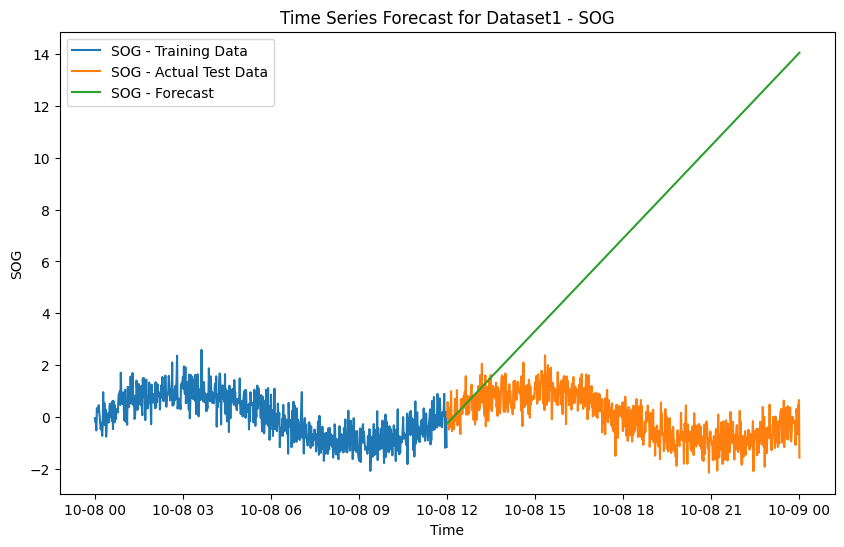

Mean Squared Error: 70.0823132821843
Standard Deviation :  4.762583825618191


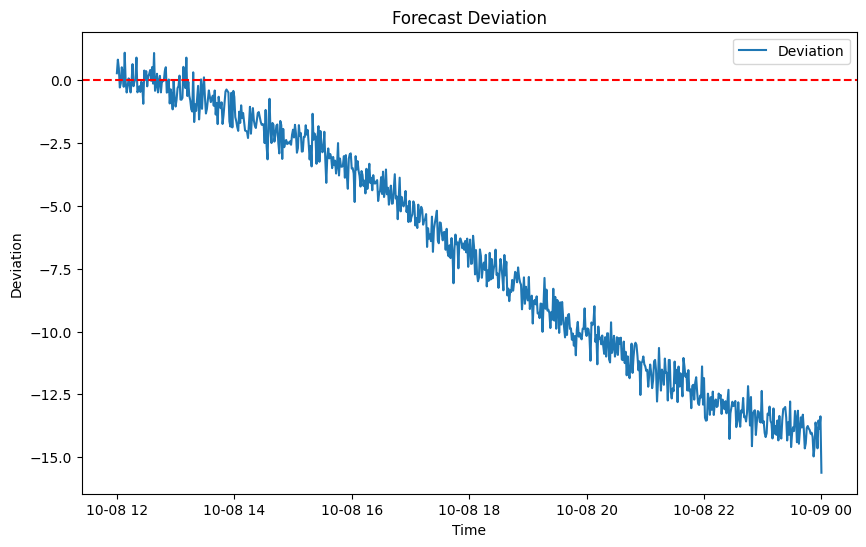


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 2
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/96105628.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df6_subset['# Timestamp'] = pd.to_datetime(df6_subset['# Timestamp'])
/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/96105628.py:13: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:47:19 - cmdstanpy - INFO - Chain [1] start processing
19:47:19 - cmdstanpy - INFO - Chain [1] done processing
/Users/amitsingh/anaconda3/envs/test/lib/python3.11/site-packages/prophet/forecaster.py:1854: FutureWarning: 'T' is deprecated and will be removed in a future version, please use '

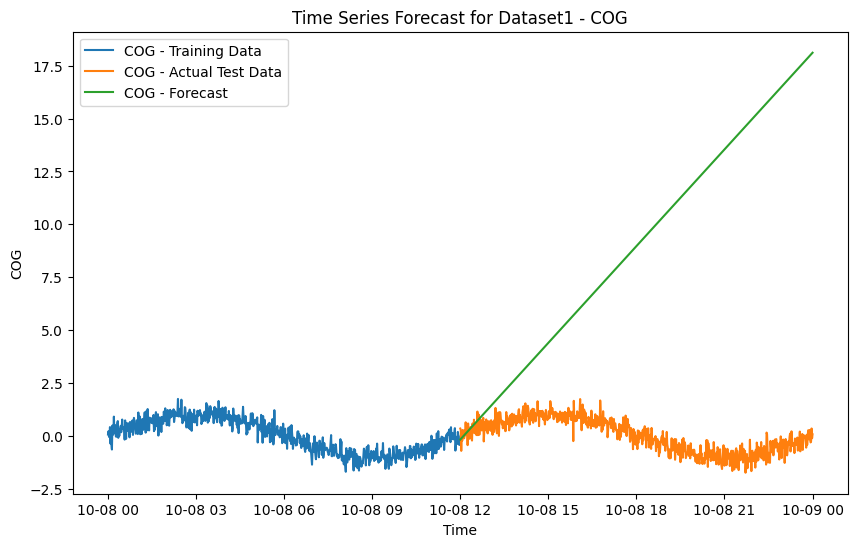

Mean Squared Error: 114.52758600724235
Standard Deviation :  5.872675726945604


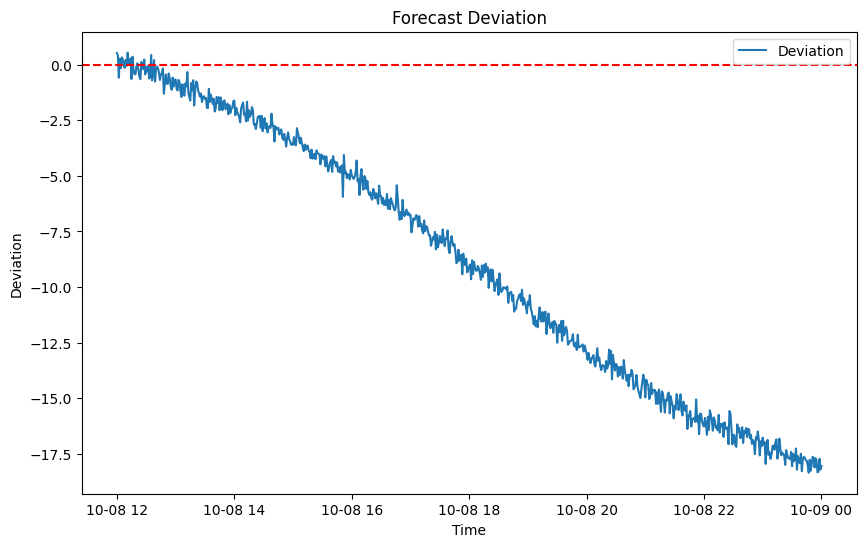


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 3
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/96105628.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df6_subset['# Timestamp'] = pd.to_datetime(df6_subset['# Timestamp'])
/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/96105628.py:13: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:47:21 - cmdstanpy - INFO - Chain [1] start processing
19:47:21 - cmdstanpy - INFO - Chain [1] done processing
/Users/amitsingh/anaconda3/envs/test/lib/python3.11/site-packages/prophet/forecaster.py:1854: FutureWarning: 'T' is deprecated and will be removed in a future version, please use '

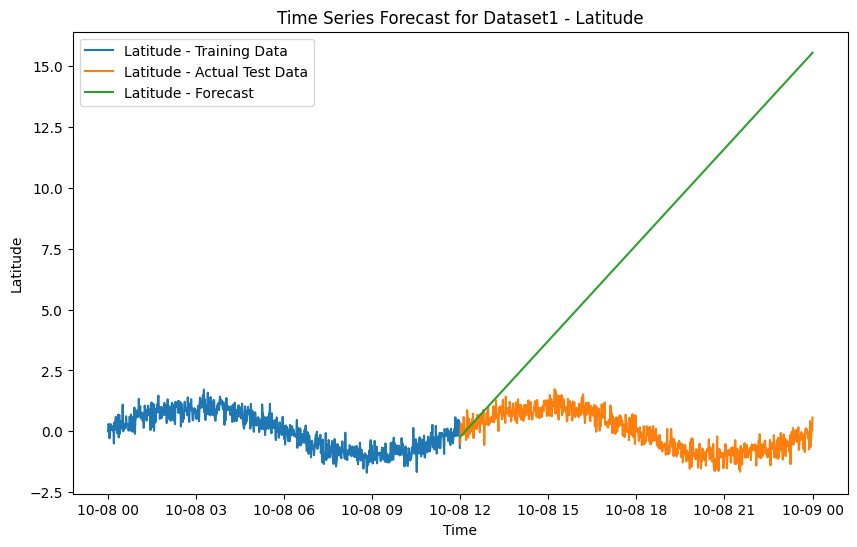

Mean Squared Error: 85.22344284021266
Standard Deviation :  5.149650717662431


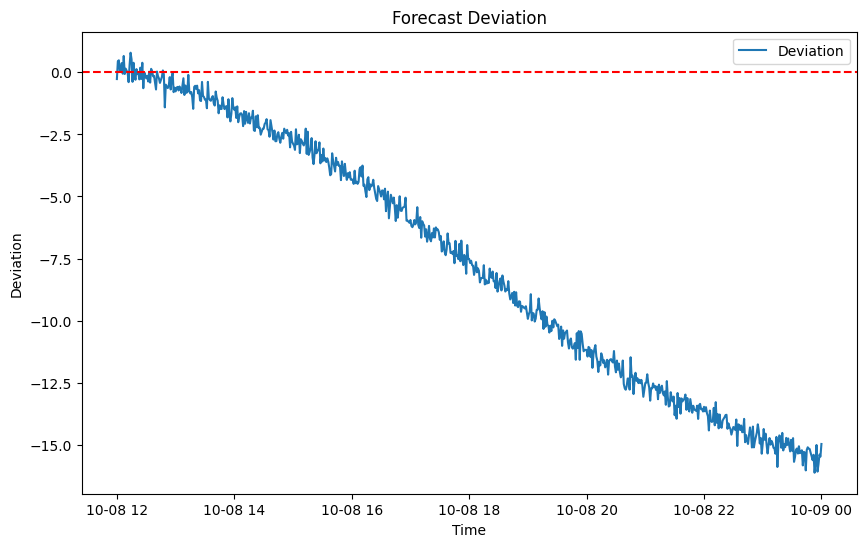


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 4
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/96105628.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df6_subset['# Timestamp'] = pd.to_datetime(df6_subset['# Timestamp'])
/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/96105628.py:13: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:47:22 - cmdstanpy - INFO - Chain [1] start processing
19:47:22 - cmdstanpy - INFO - Chain [1] done processing
/Users/amitsingh/anaconda3/envs/test/lib/python3.11/site-packages/prophet/forecaster.py:1854: FutureWarning: 'T' is deprecated and will be removed in a future version, please use '

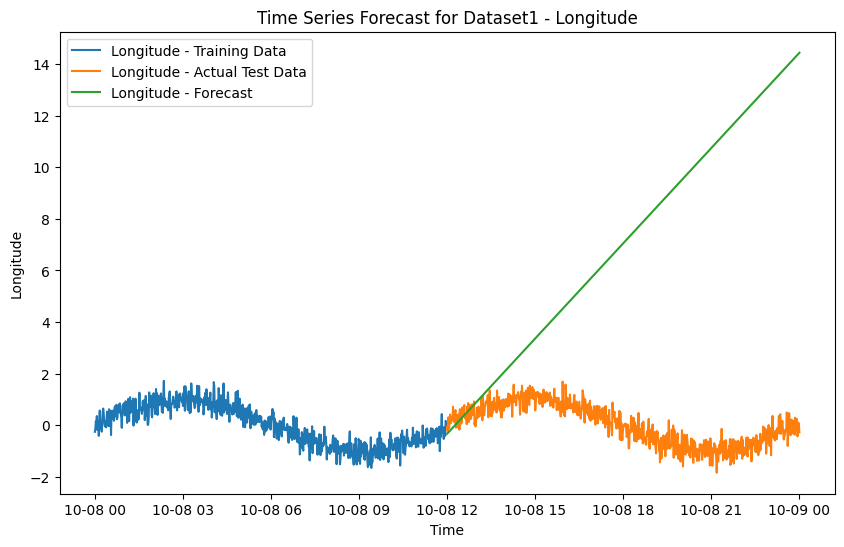

Mean Squared Error: 73.26355263311866
Standard Deviation :  4.866483364668643


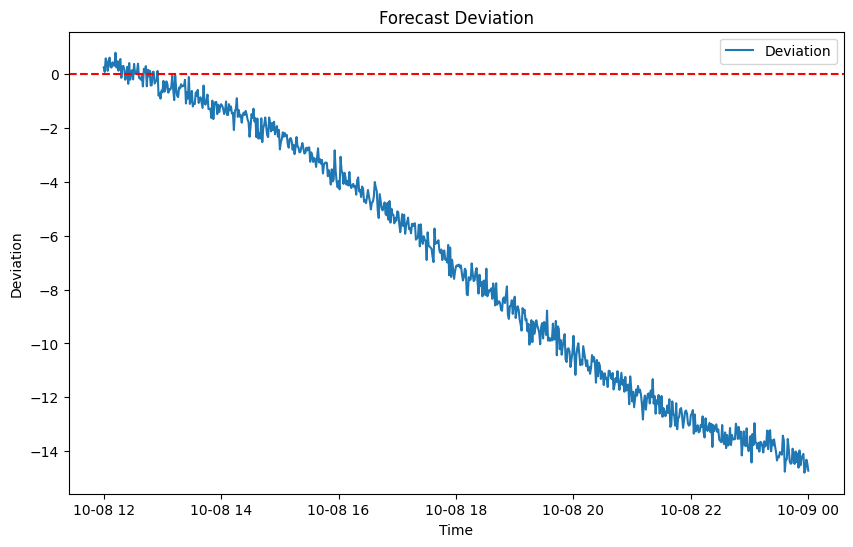


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 5
Exiting the program. Goodbye!


In [146]:
combined_data6 = pd.DataFrame()
while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-4): ")

    if choice == '5':
        print("Exiting the program. Goodbye!")
        break
    elif choice in ['1', '2', '3', '4']:
        try:
            mmsi = input("Enter MMSI: ")  # Get the MMSI from the user
            df6_subset = df6[df6['MMSI'] == int(mmsi)]  # Subset the dataset based on the given MMSI
            
        except ValueError:
            print("Invalid input. Please enter a valid integer for the interval.")
            continue

        if choice == '1':
            columns = ['SOG']
            noise_levels = [0.5]
        elif choice == '2':
            columns = ['COG']
            noise_levels = [0.3]
        elif choice == '3':
            columns = ['Latitude']
            noise_levels = [0.3]
        elif choice == '4':
            columns = ['Longitude']
            noise_levels = [0.3]
        else:
            print("Invalid choice. Please enter a number from 1 to 4.")
            continue
        
        # Generate time series data
        time_series_data6 = create_time_series6(start_date='2023-10-08', end_date='2023-10-09', df6=df6_subset, interval_minutes=1, columns=columns, noise_levels=noise_levels)
        
        # Append to the DataFrame
        combined_data6 = pd.concat([combined_data6, time_series_data6[columns]], axis=1)

        # Split data into training and testing sets (80% training, 20% testing)
        train_data, test_data = train_test_split(time_series_data6, test_size=0.5, shuffle=False)

        # Rename columns to 'ds' and 'y' for Prophet
        train_data.rename(columns={columns[0]: 'y'}, inplace=True)
        test_data.rename(columns={columns[0]: 'y'}, inplace=True)

        # Convert 'ds' column to datetime format
        train_data['ds'] = pd.to_datetime(train_data['ds'])
        test_data['ds'] = pd.to_datetime(test_data['ds'])

        # Train Prophet model
        prophet_model = Prophet()
        prophet_model.fit(train_data)

        # Create a dataframe with future dates for prediction
        future = prophet_model.make_future_dataframe(periods=len(test_data), freq='5T')

        # Make predictions
        forecast = prophet_model.predict(future)

        # Plot the forecast and actual test data
        plot_prophet_forecast5(train_data, test_data, forecast, columns)

        # Evaluate performance using mean squared error
        mse = mean_squared_error(test_data['y'], forecast[-len(test_data):]['yhat'])
        print(f'Mean Squared Error: {mse}')

        # Calculate deviation
        test_data['deviation'] = test_data['y'] - forecast[-len(test_data):]['yhat']
        
        sd = st.stdev(test_data['deviation']) 
        print("Standard Deviation : ", sd)
    
        # Calculate moving average
        window_size = 12  # You can adjust the window size as needed
        test_data['moving_average'] = test_data['deviation'].rolling(window=window_size).mean()
    
        
        
        # Visualize deviation
        plt.figure(figsize=(10, 6))
        plt.plot(test_data['ds'], test_data['deviation'], label='Deviation')
        plt.axhline(y=0, color='r', linestyle='--')
        plt.title('Forecast Deviation')
        plt.xlabel('Time')
        plt.ylabel('Deviation')
        plt.legend()
        plt.show()

# After the loop ends, you'll have all time series data stored in df_all_time_series_data1


In [147]:
combined_data6

,SOG,COG,Latitude,Longitude
0,-0.044998,0.062683,0.002180,-0.262249
1,-0.194777,0.212993,0.302824,-0.128852
2,-0.191939,-0.039999,0.221041,0.140584
3,-0.512920,-0.069100,-0.286089,0.007899
4,0.324791,0.410187,0.061534,0.348428
...,...,...,...,...
1436,-0.672378,-0.316032,-0.633038,-0.438567
1437,0.454653,-0.259771,-0.313417,-0.296962
1438,0.146235,0.344098,0.098503,0.088541
1439,0.658832,-0.116984,0.035874,-0.032932


In [148]:
df1_7 =pd.concat([df1_6,combined_data6],axis =0)

In [149]:
df1_7

,SOG,COG,Latitude,Longitude
0,0.323357,-0.155061,-0.016830,-0.179949
1,0.315885,-0.581238,-0.556230,-0.385583
2,0.914108,0.344985,-0.103316,0.119060
3,-0.434664,0.658695,0.116240,0.157335
4,-0.594001,-0.245701,0.234424,0.282610
...,...,...,...,...
1436,-0.672378,-0.316032,-0.633038,-0.438567
1437,0.454653,-0.259771,-0.313417,-0.296962
1438,0.146235,0.344098,0.098503,0.088541
1439,0.658832,-0.116984,0.035874,-0.032932


In [150]:
## Prediction of Dataset 1 to 7


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 1


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/4043369297.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:47:24 - cmdstanpy - INFO - Chain [1] start processing
19:47:24 - cmdstanpy - INFO - Chain [1] done processing


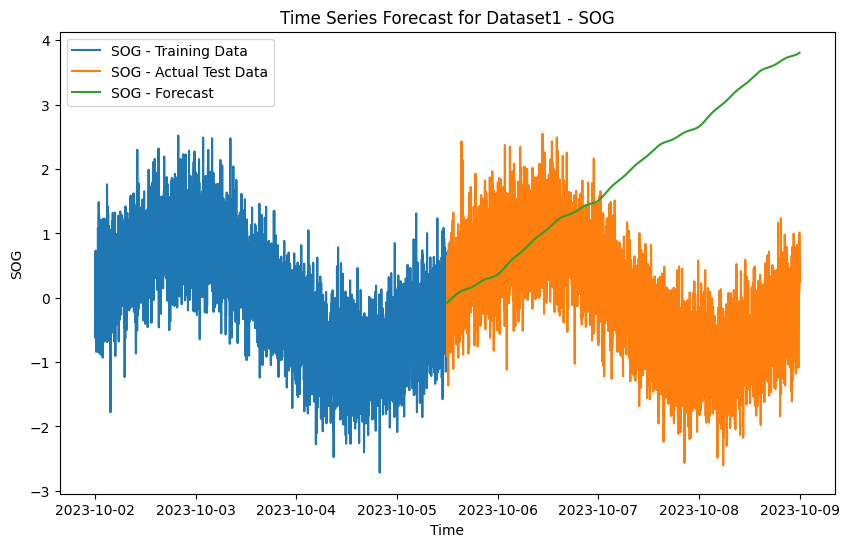

Mean Squared Error: 6.96120976852271
Standard Deviation :  1.8402257513365212


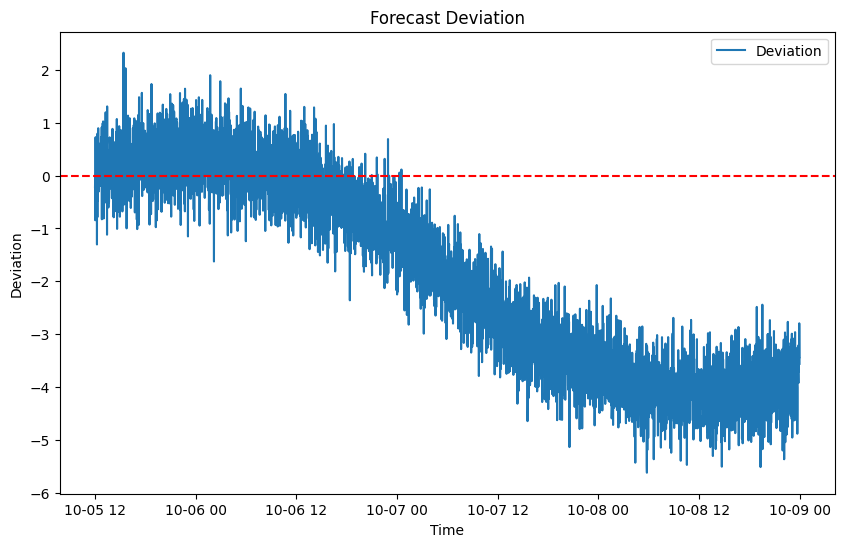


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 2


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/4043369297.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:47:27 - cmdstanpy - INFO - Chain [1] start processing
19:47:27 - cmdstanpy - INFO - Chain [1] done processing


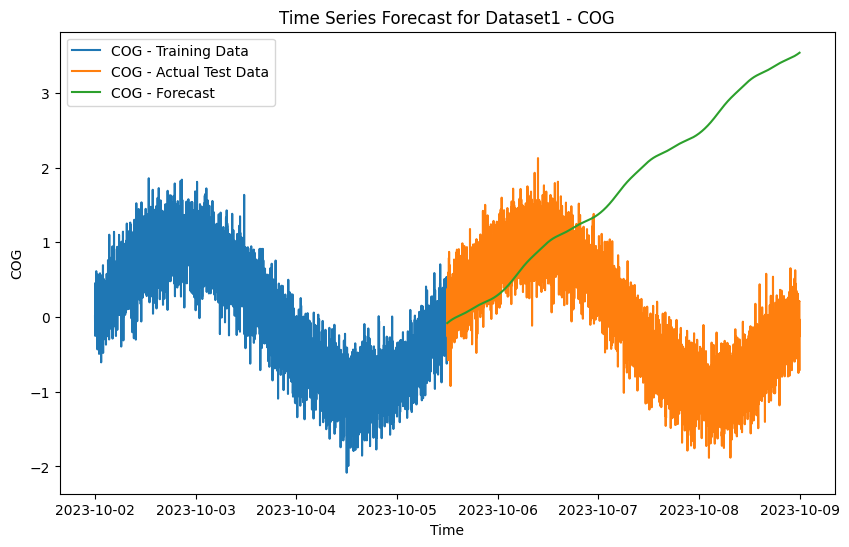

Mean Squared Error: 6.00888831849237
Standard Deviation :  1.7399817912170363


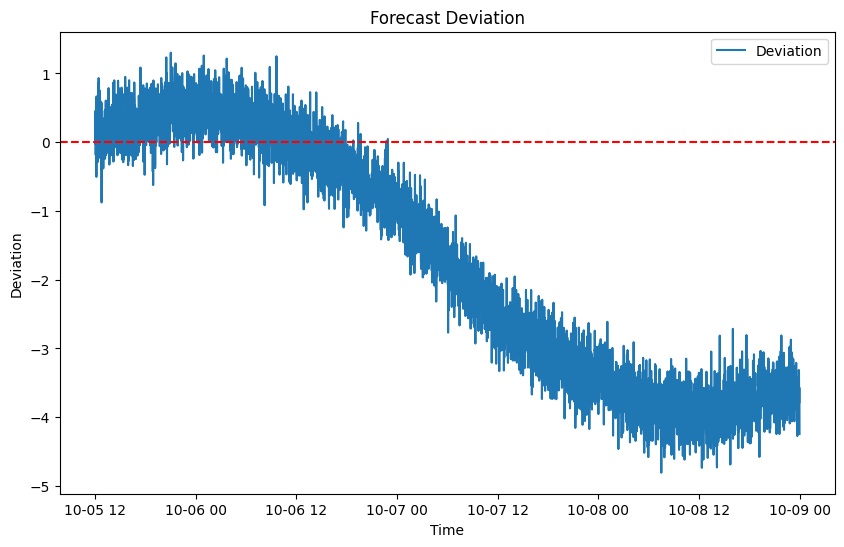


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 3


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/4043369297.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:47:29 - cmdstanpy - INFO - Chain [1] start processing
19:47:29 - cmdstanpy - INFO - Chain [1] done processing


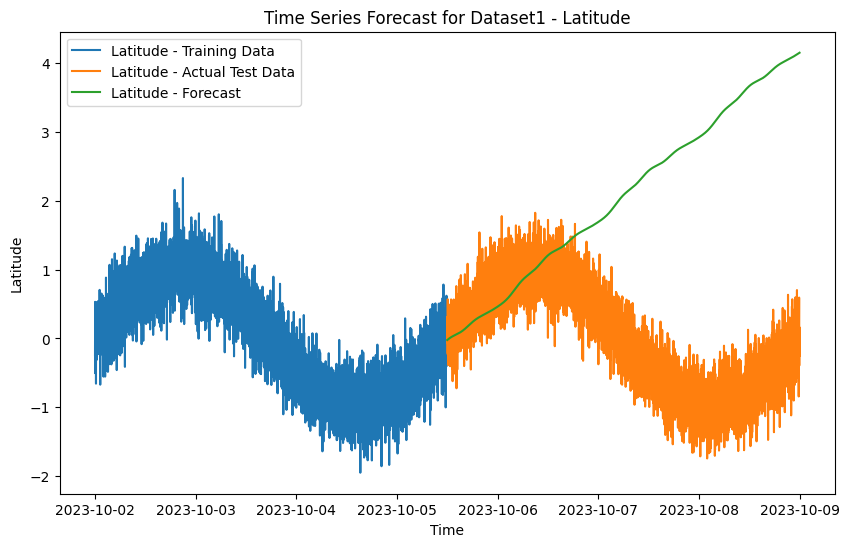

Mean Squared Error: 7.745188876928545
Standard Deviation :  1.8723180919879696


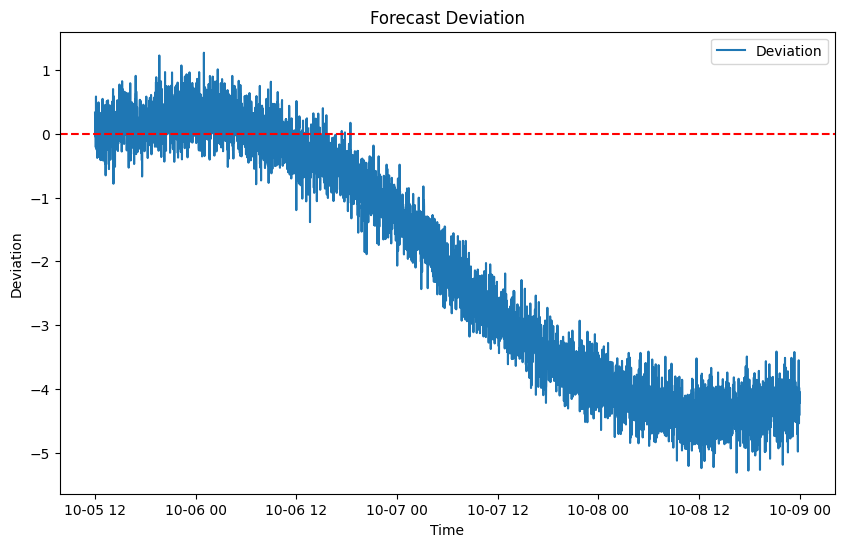


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 4


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/4043369297.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:47:31 - cmdstanpy - INFO - Chain [1] start processing
19:47:31 - cmdstanpy - INFO - Chain [1] done processing


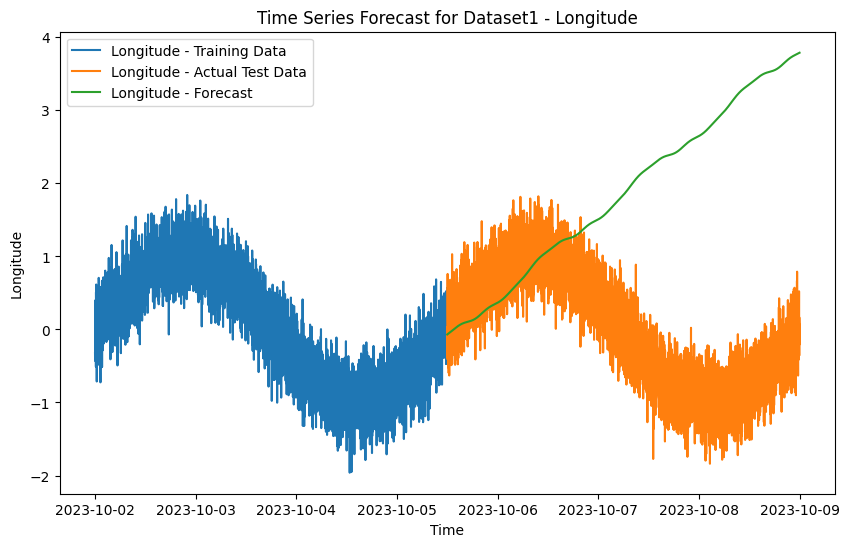

Mean Squared Error: 6.6395424916383
Standard Deviation :  1.7862223961601154


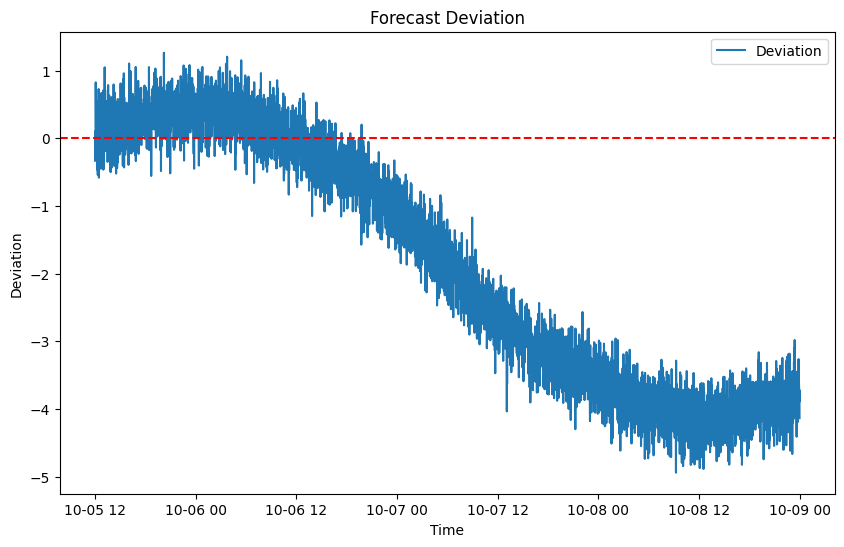


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 5
Exiting the program. Goodbye!


In [151]:
 def create_time_series1_7(start_date,end_date,df1_7, interval_minutes, columns, noise_levels=None):
    # Generate datetime range with even intervals
    date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')

    # Create a DataFrame with datetime values
    new_df = pd.DataFrame(date_rng, columns=['ds'])

    # Generate time series values for each specified column
    for col, noise_level in zip(columns, noise_levels):
        if col.lower() == 'Latitude':
            new_df[col] = df[col]
        elif col.lower() == 'Longitude':
            new_df[col] = df[col]
        elif col.lower() =='SOG':
            new_df[col] =df[col]
        elif col.lower() =='COG':
            new_df[col] =df[col]    
        else:
            new_df[col] = np.sin(np.linspace(0, 4 * np.pi, len(new_df))) + np.random.normal(0, noise_level, len(new_df))

    return new_df

def plot_prophet_forecast1_7(train_data, test_data, forecast, columns):
    for col in columns:
        plt.figure(figsize=(10, 6))
        plt.plot(train_data['ds'], train_data['y'], label=f'{col} - Training Data')
        plt.plot(test_data['ds'], test_data['y'], label=f'{col} - Actual Test Data')
        plt.plot(test_data['ds'], forecast[-len(test_data):]['yhat'], label=f'{col} - Forecast')
        plt.title(f'Time Series Forecast for Dataset1 - {col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()
        
## PRACTCIE


while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-4): ")

    if choice == '5':
        print("Exiting the program. Goodbye!")
        break
    elif choice in ['1', '2', '3','4']:
        if choice == '1':
            columns = ['SOG']
            noise_levels = [0.5]
        elif choice =='2':
            columns=['COG']
            noise_levels=[0.3]
        elif choice == '3':
            columns = ['Latitude']
            noise_levels = [0.3]
        elif choice == '4':
            columns = ['Longitude']
            noise_levels = [0.3]
    else:
        print("Invalid choice. Please enter a number from 1 to 4.")
        continue
        
     # First, you need to create the training and testing datasets separately
    # Let's assume your first dataset is stored in df and the second dataset is stored in df1
    time_series_data1_7 = create_time_series1_7(start_date='2023-10-02', end_date='2023-10-09', df1_7=df1_7, interval_minutes=1, columns=columns, noise_levels=noise_levels)
        
    
    train_data, test_data = train_test_split(time_series_data1_7, test_size=0.5, shuffle=False)

    
    # Rename columns to 'ds' and 'y' for Prophet

    train_data.rename(columns={columns[0]: 'y'}, inplace=True)
    test_data.rename(columns={columns[0]: 'y'}, inplace=True)
    
    # Convert 'ds' column to datetime format
    train_data['ds'] = pd.to_datetime(train_data['ds'])
    test_data['ds'] = pd.to_datetime(test_data['ds'])

    # Train Prophet model
    prophet_model = Prophet()
    prophet_model.fit(train_data)

    # Create a dataframe with future dates for prediction
    future = prophet_model.make_future_dataframe(periods=len(test_data), freq='1min')

    # Make predictions
    forecast = prophet_model.predict(future)

    # Plot the forecast and actual test data
    plot_prophet_forecast12(train_data, test_data, forecast, columns)

    # Evaluate performance using mean squared error
    mse = mean_squared_error(test_data['y'], forecast[-len(test_data):]['yhat'])
    print(f'Mean Squared Error: {mse}')

    # Calculate deviation
    test_data['deviation'] = test_data['y'] - forecast[-len(test_data):]['yhat']
    
    # Calculate deviation percentage using stdev function
    sd = np.std(test_data['deviation']) 
    print("Standard Deviation : ", sd)
    
    # Calculate standard deviation percentage
    
    # Visualize deviation
    plt.figure(figsize=(10, 6))
    plt.plot(test_data['ds'], test_data['deviation'], label='Deviation')
    plt.axhline(y=0, color='r', linestyle='--')
    plt.title('Forecast Deviation')
    plt.xlabel('Time')
    plt.ylabel('Deviation')
    plt.legend()
    plt.show()
   
    

## Dataset 8

In [152]:
def create_time_series7(start_date,end_date,df7, interval_minutes, columns, noise_levels=None):
    # Set the 'Timestamp' column as the index
    #df.set_index('# Timestamp', inplace=True)
    df7_subset['# Timestamp'] = pd.to_datetime(df7_subset['# Timestamp'])
    df7_subset.set_index('# Timestamp', inplace=True)
    # Resample the DataFrame to get one data point per minute
    resampled_df7 = df7.resample(f'{interval_minutes}1min').first().reset_index()
    
    resampled_df7 = df7.groupby([pd.Grouper(freq=f'{interval_minutes}1min'), 'MMSI']).min().reset_index()
    
    
    # Generate datetime range with even intervals
    date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')

    # Create a DataFrame with datetime values
    new_df = pd.DataFrame(date_rng, columns=['ds'])
        
    # Merge resampled data with the new DataFrame on the 'ds' column
    new_df = pd.merge(new_df, resampled_df7, how='left', left_on='ds', right_on='# Timestamp')

    # Drop the redundant '# Timestamp' column
    new_df.drop('# Timestamp', axis=1, inplace=True)

    
    # Generate time series values for each specified column
    for col, noise_level in zip(columns, noise_levels):
        if col.lower() == 'Latitude':
            new_df[col] = df[col]
        elif col.lower() == 'Longitude':
            new_df[col] = df[col]
        elif col.lower() =='SOG':
            new_df[col] =df[col]
        elif col.lower() =='COG':
            new_df[col] =df[col]    
        else:
            new_df[col] = np.sin(np.linspace(0, 4 * np.pi, len(new_df))) + np.random.normal(0, noise_level, len(new_df))

    return new_df

In [153]:
def plot_time_series7(df7,columns,window=7):
    for col in columns:
        df7['Moving Average'] = df7[col].rolling(window=window).mean()
        plt.figure(figsize=(10,6))
        plt.plot(df7['ds'],df7[col],label=col)
        plt.plot(df7['ds'], df7['Moving Average'], label=f'{col} - Moving Average', linestyle='--', color='red')
        plt.title(f'Time Series Plot for Dataset df:6 -{col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()

 #Menu-driven code
while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG ")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-5): ")

    if choice in ['1', '2', '3', '4']:
        mmsi = input("Enter MMSI: ")  # Get the MMSI from the user
        df7_subset = df7[df7['MMSI'] == int(mmsi)]  # Subset the dataset based on the given MMSI
        columns = ['SOG'] if choice == '1' else ['COG'] if choice == '2' else ['Latitude'] if choice == '3' else ['Longitude']
        noise_levels = [0.5] if choice == '1' else [0.3]  # Adjust noise levels as needed

        #time_series_data = create_time_series(start_date='2022-10-03',end_date='2022-10-04',df1=df_subset, interval_minutes=5, columns=columns, noise_levels=noise_levels)
        time_series_data7 = create_time_series7(start_date='2022-10-09', end_date='2022-10-10', df7=df7_subset, interval_minutes=5, columns=columns, noise_levels=noise_levels)

        plot_time_series6(time_series_data7, columns)
    elif choice == '5':
        print("Exiting the program. Goodbye!")
        break
    else:
        print("Invalid choice. Please enter a number from 1 to 5.")


In [154]:
def plot_prophet_forecast7(train_data, test_data, forecast, columns, window=7):
    for col in columns:
        # Compute moving average
        test_data['Moving Average'] = test_data['y'].rolling(window=window).mean()
        
        plt.figure(figsize=(10, 6))
        plt.plot(train_data['ds'], train_data['y'], label=f'{col} - Training Data')
        plt.plot(test_data['ds'], test_data['y'], label=f'{col} - Actual Test Data')
        plt.plot(test_data['ds'], forecast[-len(test_data):]['yhat'], label=f'{col} - Forecast')
        plt.plot(test_data['ds'], test_data['Moving Average'], label=f'{col} - Moving Average', linestyle='--', color='red')
        plt.title(f'Time Series Forecast for DF - {col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()



Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 1
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2867527201.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df7_subset['# Timestamp'] = pd.to_datetime(df7_subset['# Timestamp'])
/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2867527201.py:13: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:47:37 - cmdstanpy - INFO - Chain [1] start processing
19:47:37 - cmdstanpy - INFO - Chain [1] done processing
/Users/amitsingh/anaconda3/envs/test/lib/python3.11/site-packages/prophet/forecaster.py:1854: FutureWarning: 'T' is deprecated and will be removed in a future version, please u

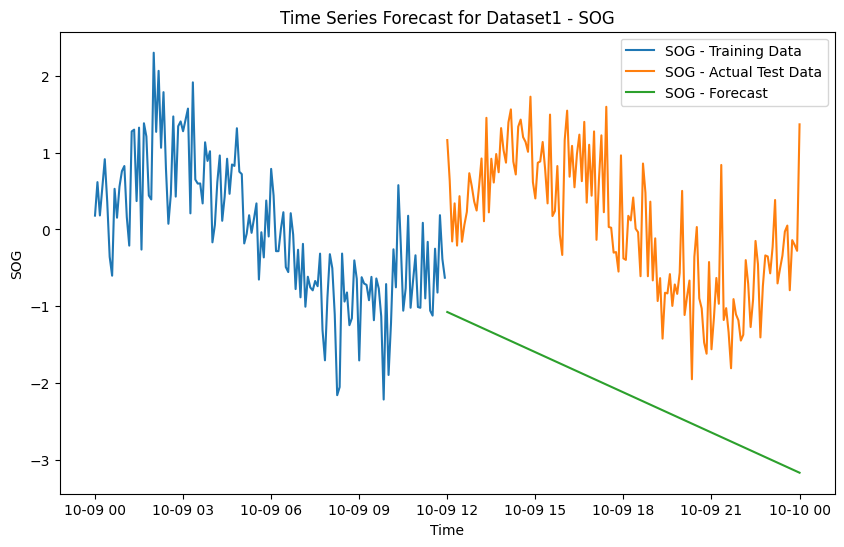

Mean Squared Error: 5.161388167434853
Standard Deviation :  0.67225836448173


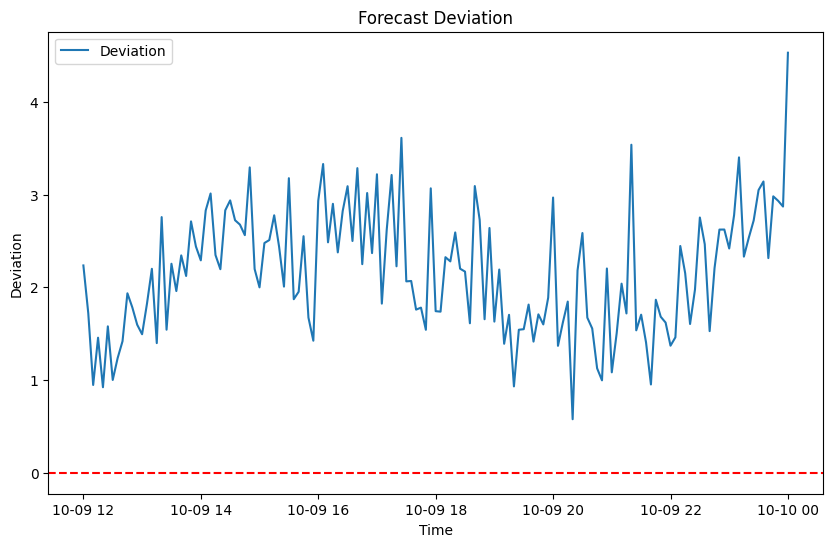


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 2
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2867527201.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df7_subset['# Timestamp'] = pd.to_datetime(df7_subset['# Timestamp'])
/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2867527201.py:13: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:47:38 - cmdstanpy - INFO - Chain [1] start processing
19:47:39 - cmdstanpy - INFO - Chain [1] done processing
/Users/amitsingh/anaconda3/envs/test/lib/python3.11/site-packages/prophet/forecaster.py:1854: FutureWarning: 'T' is deprecated and will be removed in a future version, please u

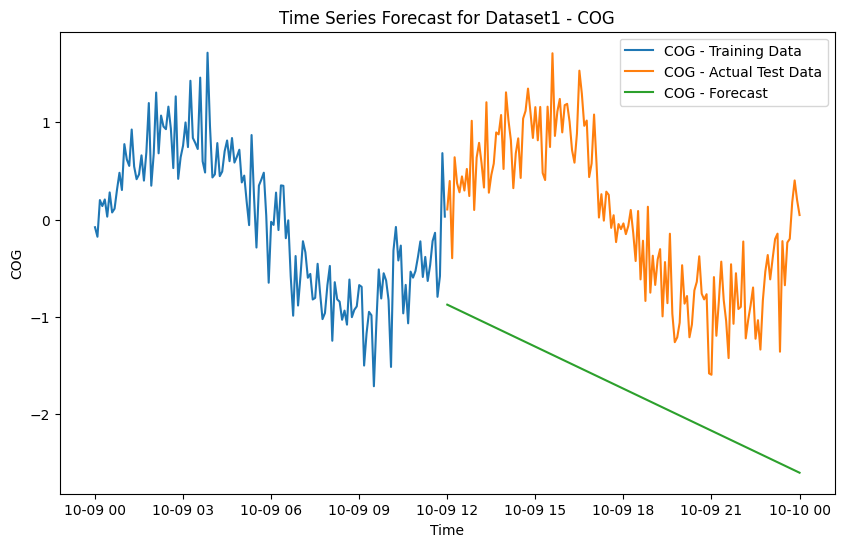

Mean Squared Error: 3.376597272970849
Standard Deviation :  0.5583231647634437


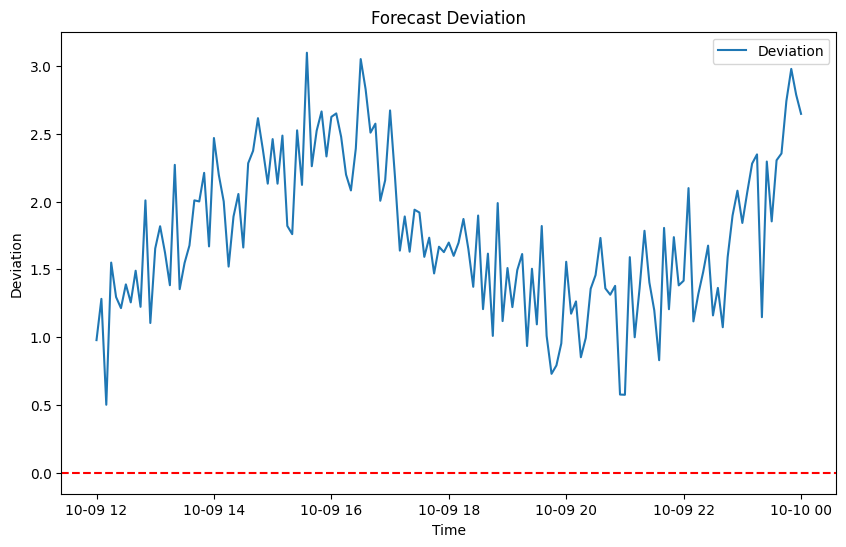


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 3
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2867527201.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df7_subset['# Timestamp'] = pd.to_datetime(df7_subset['# Timestamp'])
/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2867527201.py:13: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:47:40 - cmdstanpy - INFO - Chain [1] start processing
19:47:40 - cmdstanpy - INFO - Chain [1] done processing
/Users/amitsingh/anaconda3/envs/test/lib/python3.11/site-packages/prophet/forecaster.py:1854: FutureWarning: 'T' is deprecated and will be removed in a future version, please u

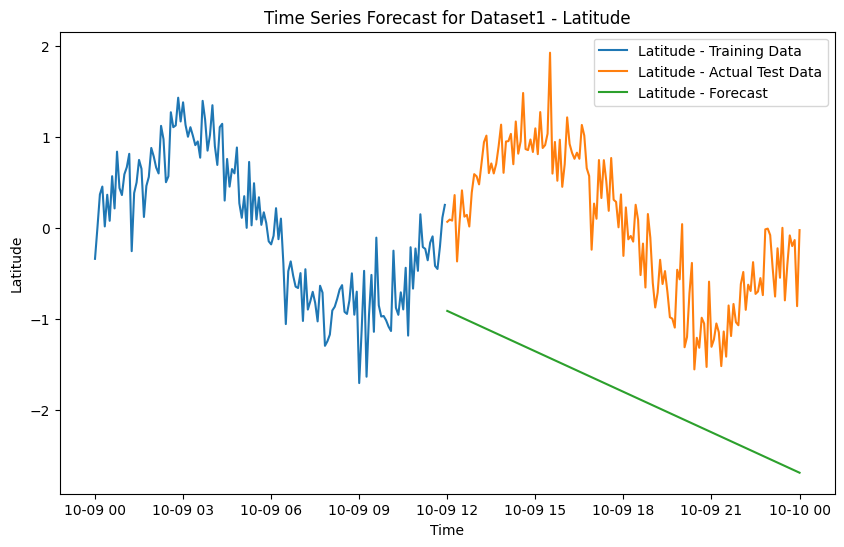

Mean Squared Error: 3.5821071162114464
Standard Deviation :  0.5498946202496006


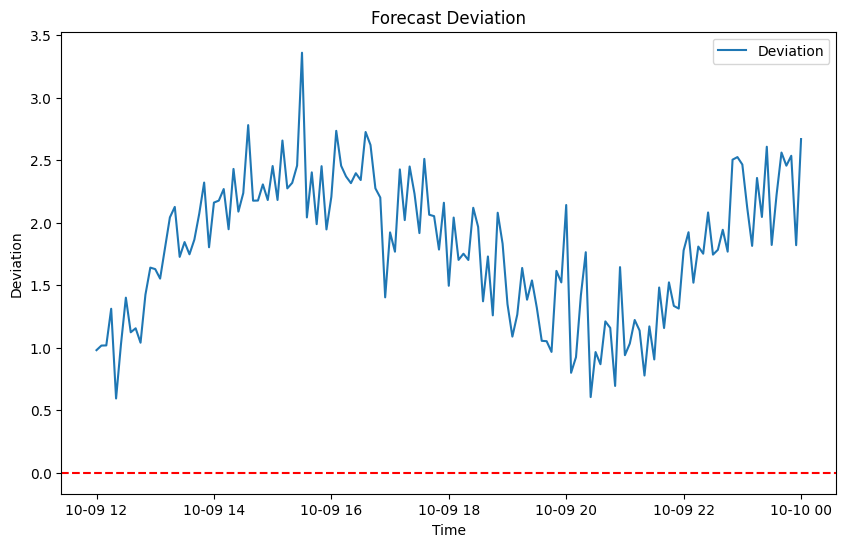


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 4
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2867527201.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df7_subset['# Timestamp'] = pd.to_datetime(df7_subset['# Timestamp'])
/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2867527201.py:13: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:47:41 - cmdstanpy - INFO - Chain [1] start processing
19:47:41 - cmdstanpy - INFO - Chain [1] done processing
/Users/amitsingh/anaconda3/envs/test/lib/python3.11/site-packages/prophet/forecaster.py:1854: FutureWarning: 'T' is deprecated and will be removed in a future version, please u

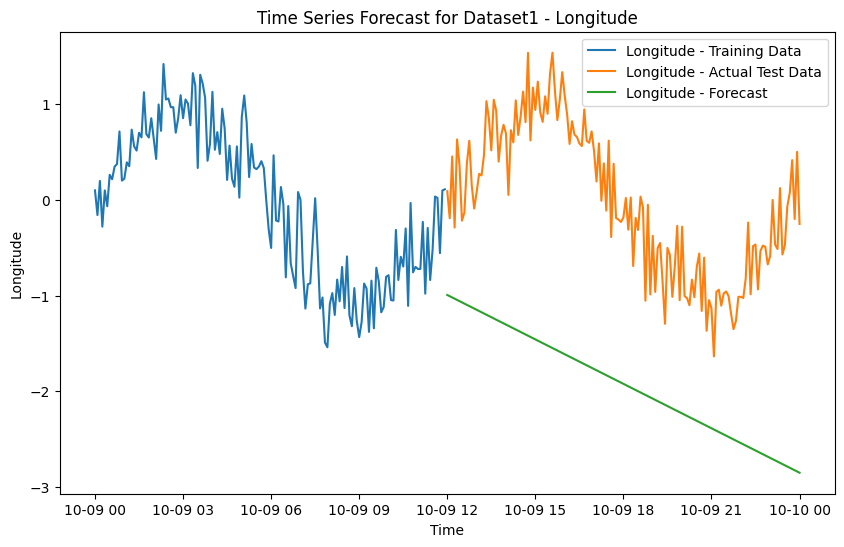

Mean Squared Error: 3.8995641497794904
Standard Deviation :  0.5672610243889664


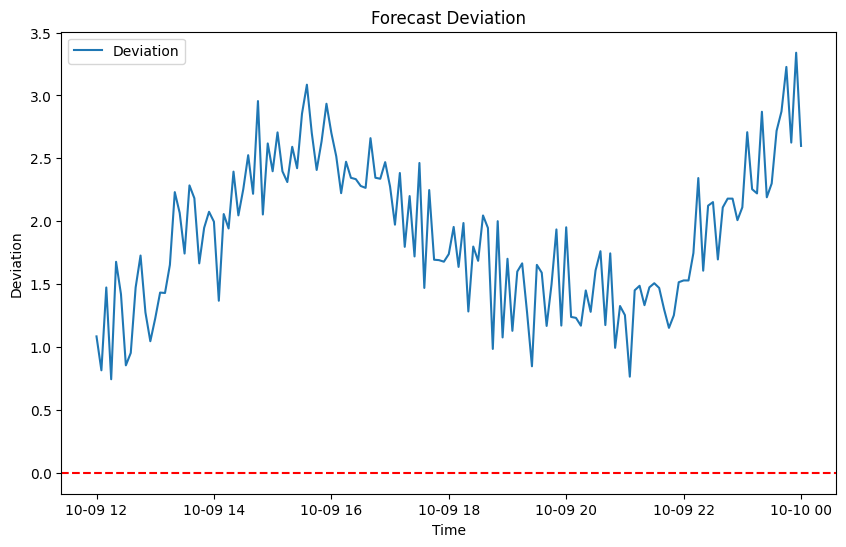


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 5
Exiting the program. Goodbye!


In [155]:
combined_data7 = pd.DataFrame()
while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-4): ")

    if choice == '5':
        print("Exiting the program. Goodbye!")
        break
    elif choice in ['1', '2', '3', '4']:
        try:
            mmsi = input("Enter MMSI: ")  # Get the MMSI from the user
            df7_subset = df7[df7['MMSI'] == int(mmsi)]  # Subset the dataset based on the given MMSI
            
        except ValueError:
            print("Invalid input. Please enter a valid integer for the interval.")
            continue

        if choice == '1':
            columns = ['SOG']
            noise_levels = [0.5]
        elif choice == '2':
            columns = ['COG']
            noise_levels = [0.3]
        elif choice == '3':
            columns = ['Latitude']
            noise_levels = [0.3]
        elif choice == '4':
            columns = ['Longitude']
            noise_levels = [0.3]
        else:
            print("Invalid choice. Please enter a number from 1 to 4.")
            continue
        
        # Generate time series data
        time_series_data7 = create_time_series7(start_date='2023-10-09', end_date='2023-10-10', df7=df7_subset, interval_minutes=5, columns=columns, noise_levels=noise_levels)
        
        # Append to the DataFrame
        combined_data7 = pd.concat([combined_data7, time_series_data7[columns]], axis=1)

        # Split data into training and testing sets (80% training, 20% testing)
        train_data, test_data = train_test_split(time_series_data7, test_size=0.5, shuffle=False)

        # Rename columns to 'ds' and 'y' for Prophet
        train_data.rename(columns={columns[0]: 'y'}, inplace=True)
        test_data.rename(columns={columns[0]: 'y'}, inplace=True)

        # Convert 'ds' column to datetime format
        train_data['ds'] = pd.to_datetime(train_data['ds'])
        test_data['ds'] = pd.to_datetime(test_data['ds'])

        # Train Prophet model
        prophet_model = Prophet()
        prophet_model.fit(train_data)

        # Create a dataframe with future dates for prediction
        future = prophet_model.make_future_dataframe(periods=len(test_data), freq='5T')

        # Make predictions
        forecast = prophet_model.predict(future)

        # Plot the forecast and actual test data
        plot_prophet_forecast5(train_data, test_data, forecast, columns)

        # Evaluate performance using mean squared error
        mse = mean_squared_error(test_data['y'], forecast[-len(test_data):]['yhat'])
        print(f'Mean Squared Error: {mse}')

        # Calculate deviation
        test_data['deviation'] = test_data['y'] - forecast[-len(test_data):]['yhat']
        
        sd = st.stdev(test_data['deviation']) 
        print("Standard Deviation : ", sd)
    
        # Calculate moving average
        window_size = 12  # You can adjust the window size as needed
        test_data['moving_average'] = test_data['deviation'].rolling(window=window_size).mean()
    
        
        
        # Visualize deviation
        plt.figure(figsize=(10, 6))
        plt.plot(test_data['ds'], test_data['deviation'], label='Deviation')
        plt.axhline(y=0, color='r', linestyle='--')
        plt.title('Forecast Deviation')
        plt.xlabel('Time')
        plt.ylabel('Deviation')
        plt.legend()
        plt.show()

# After the loop ends, you'll have all time series data stored in df_all_time_series_data1


In [156]:
df1_8 =pd.concat([df1_7,combined_data7],axis=0)

In [157]:
df1_8

,SOG,COG,Latitude,Longitude
0,0.323357,-0.155061,-0.016830,-0.179949
1,0.315885,-0.581238,-0.556230,-0.385583
2,0.914108,0.344985,-0.103316,0.119060
3,-0.434664,0.658695,0.116240,0.157335
4,-0.594001,-0.245701,0.234424,0.282610
...,...,...,...,...
284,-0.790436,-0.198194,-0.080132,0.073946
285,-0.138554,0.176523,-0.197470,0.415007
286,-0.201387,0.401373,-0.130703,-0.199675
287,-0.277918,0.199027,-0.858141,0.502051


In [158]:
## Prediction


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 1


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/437186608.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:47:43 - cmdstanpy - INFO - Chain [1] start processing
19:47:43 - cmdstanpy - INFO - Chain [1] done processing


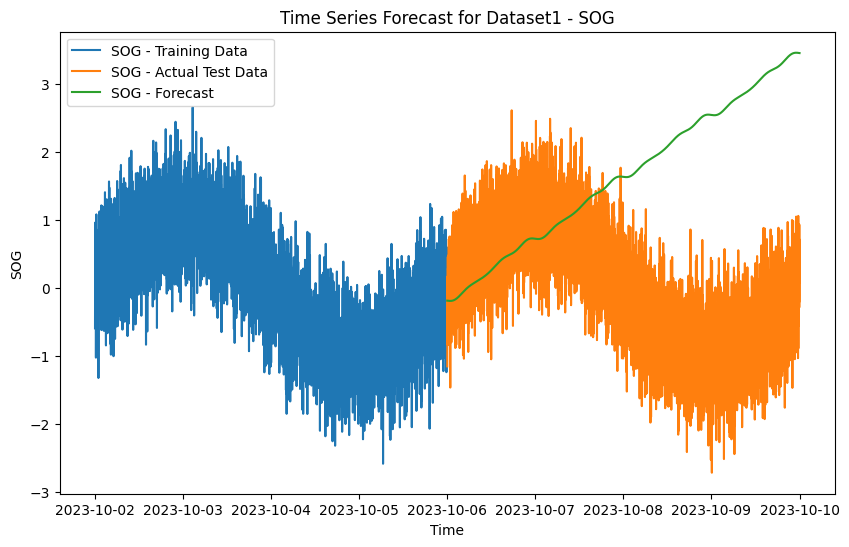

Mean Squared Error: 5.716707610187174
Standard Deviation :  1.7381697568517143


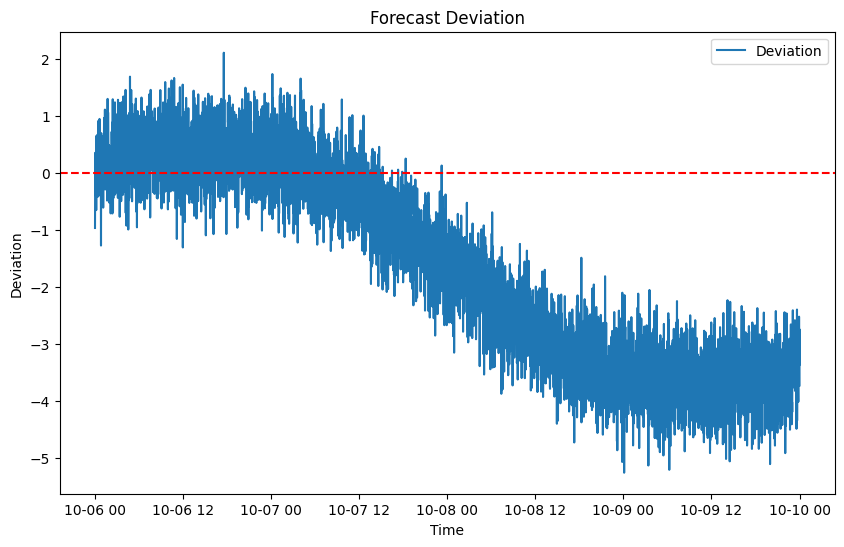


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 2


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/437186608.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:47:45 - cmdstanpy - INFO - Chain [1] start processing
19:47:45 - cmdstanpy - INFO - Chain [1] done processing


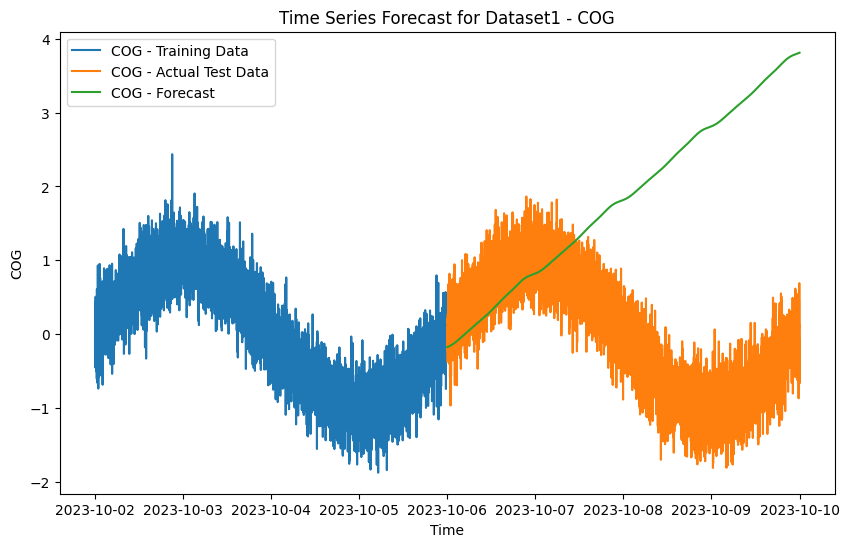

Mean Squared Error: 6.544974758317224
Standard Deviation :  1.7885669874893926


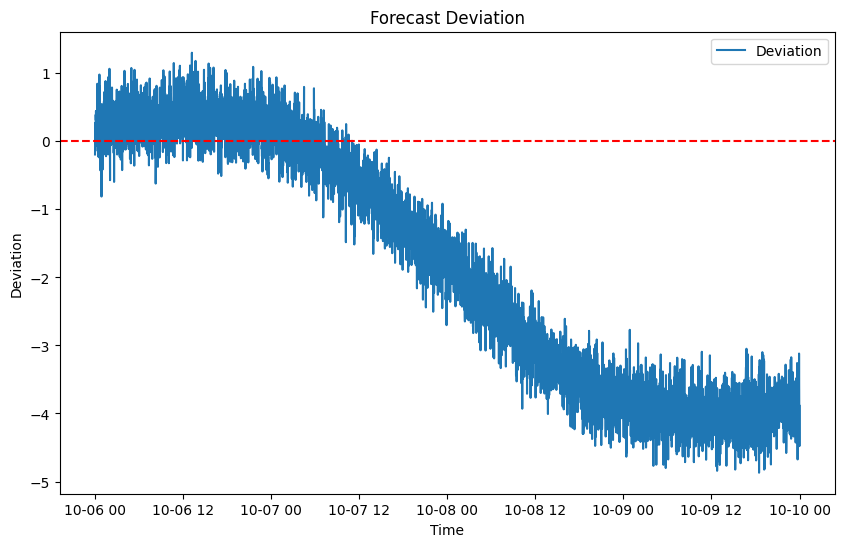


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 3


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/437186608.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:47:47 - cmdstanpy - INFO - Chain [1] start processing
19:47:47 - cmdstanpy - INFO - Chain [1] done processing


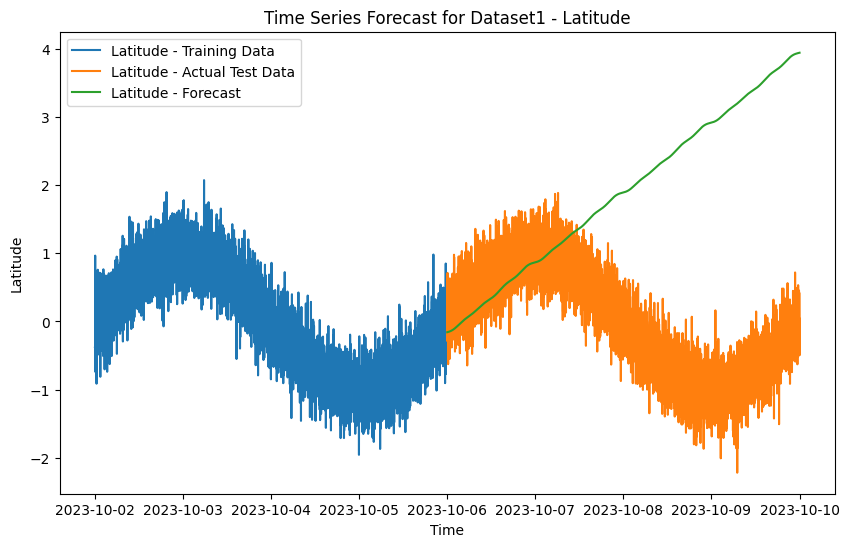

Mean Squared Error: 6.9011196251653795
Standard Deviation :  1.8222380282911792


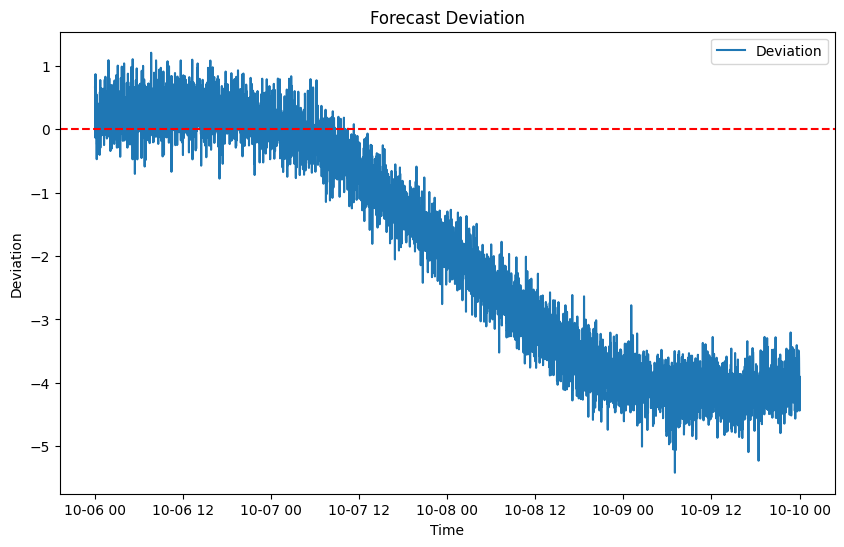


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 4


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/437186608.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:47:49 - cmdstanpy - INFO - Chain [1] start processing
19:47:50 - cmdstanpy - INFO - Chain [1] done processing


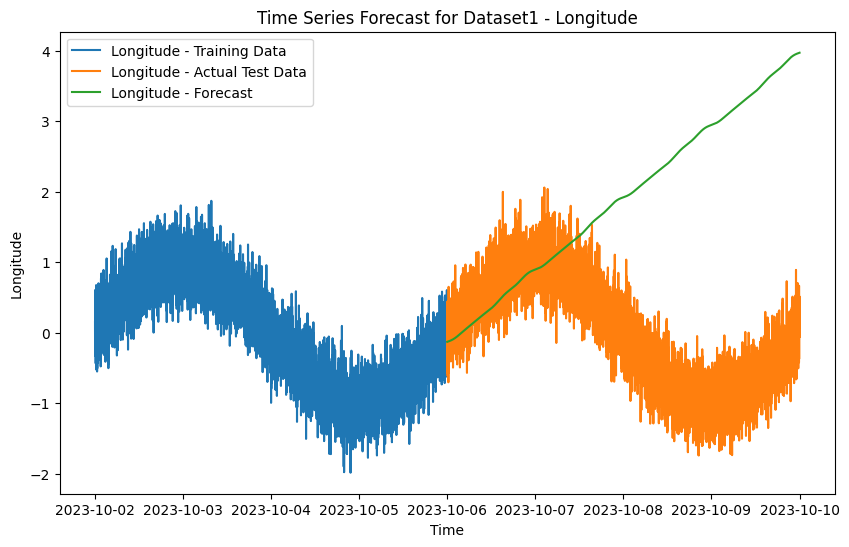

Mean Squared Error: 6.9524454950552474
Standard Deviation :  1.8112590137903541


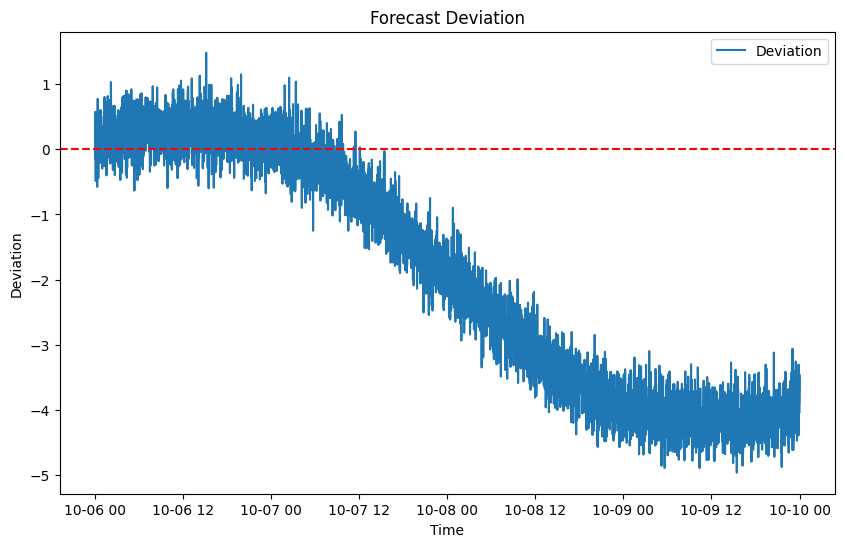


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 5
Exiting the program. Goodbye!


In [159]:
 def create_time_series1_8(start_date,end_date,df, interval_minutes, columns, noise_levels=None):
    # Generate datetime range with even intervals
    date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')

    # Create a DataFrame with datetime values
    new_df = pd.DataFrame(date_rng, columns=['ds'])

    # Generate time series values for each specified column
    for col, noise_level in zip(columns, noise_levels):
        if col.lower() == 'Latitude':
            new_df[col] = df[col]
        elif col.lower() == 'Longitude':
            new_df[col] = df[col]
        elif col.lower() =='SOG':
            new_df[col] =df[col]
        elif col.lower() =='COG':
            new_df[col] =df[col]    
        else:
            new_df[col] = np.sin(np.linspace(0, 4 * np.pi, len(new_df))) + np.random.normal(0, noise_level, len(new_df))

    return new_df

def plot_prophet_forecast1_8(train_data, test_data, forecast, columns):
    for col in columns:
        plt.figure(figsize=(10, 6))
        plt.plot(train_data['ds'], train_data['y'], label=f'{col} - Training Data')
        plt.plot(test_data['ds'], test_data['y'], label=f'{col} - Actual Test Data')
        plt.plot(test_data['ds'], forecast[-len(test_data):]['yhat'], label=f'{col} - Forecast')
        plt.title(f'Time Series Forecast for Dataset1 - {col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()
        
## PRACTCIE


while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-4): ")

    if choice == '5':
        print("Exiting the program. Goodbye!")
        break
    elif choice in ['1', '2', '3','4']:
        if choice == '1':
            columns = ['SOG']
            noise_levels = [0.5]
        elif choice =='2':
            columns=['COG']
            noise_levels=[0.3]
        elif choice == '3':
            columns = ['Latitude']
            noise_levels = [0.3]
        elif choice == '4':
            columns = ['Longitude']
            noise_levels = [0.3]
    else:
        print("Invalid choice. Please enter a number from 1 to 4.")
        continue
        
     # First, you need to create the training and testing datasets separately
    # Let's assume your first dataset is stored in df and the second dataset is stored in df1
    time_series_data1_8 = create_time_series1_8(start_date='2023-10-02', end_date='2023-10-10', df=df1_8, interval_minutes=1, columns=columns, noise_levels=noise_levels)
        
    
    train_data, test_data = train_test_split(time_series_data1_8, test_size=0.5, shuffle=False)

    
    # Rename columns to 'ds' and 'y' for Prophet

    train_data.rename(columns={columns[0]: 'y'}, inplace=True)
    test_data.rename(columns={columns[0]: 'y'}, inplace=True)
    
    # Convert 'ds' column to datetime format
    train_data['ds'] = pd.to_datetime(train_data['ds'])
    test_data['ds'] = pd.to_datetime(test_data['ds'])

    # Train Prophet model
    prophet_model = Prophet()
    prophet_model.fit(train_data)

    # Create a dataframe with future dates for prediction
    future = prophet_model.make_future_dataframe(periods=len(test_data), freq='1min')

    # Make predictions
    forecast = prophet_model.predict(future)

    # Plot the forecast and actual test data
    plot_prophet_forecast12(train_data, test_data, forecast, columns)

    # Evaluate performance using mean squared error
    mse = mean_squared_error(test_data['y'], forecast[-len(test_data):]['yhat'])
    print(f'Mean Squared Error: {mse}')

    # Calculate deviation
    test_data['deviation'] = test_data['y'] - forecast[-len(test_data):]['yhat']
    
    # Calculate deviation percentage using stdev function
    sd = np.std(test_data['deviation']) 
    print("Standard Deviation : ", sd)
    
    # Calculate standard deviation percentage
    
    # Visualize deviation
    plt.figure(figsize=(10, 6))
    plt.plot(test_data['ds'], test_data['deviation'], label='Deviation')
    plt.axhline(y=0, color='r', linestyle='--')
    plt.title('Forecast Deviation')
    plt.xlabel('Time')
    plt.ylabel('Deviation')
    plt.legend()
    plt.show()
   
    

## Dataset 9

In [160]:
def create_time_series8(start_date,end_date,df8, interval_minutes, columns, noise_levels=None):
    # Set the 'Timestamp' column as the index
    #df.set_index('# Timestamp', inplace=True)
    df8_subset['# Timestamp'] = pd.to_datetime(df8_subset['# Timestamp'])
    df8_subset.set_index('# Timestamp', inplace=True)
    # Resample the DataFrame to get one data point per minute
    resampled_df8 = df8.resample(f'{interval_minutes}1min').first().reset_index()
    
    resampled_df8 = df8.groupby([pd.Grouper(freq=f'{interval_minutes}1min'), 'MMSI']).min().reset_index()
    
    
    # Generate datetime range with even intervals
    date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')

    # Create a DataFrame with datetime values
    new_df = pd.DataFrame(date_rng, columns=['ds'])
        
    # Merge resampled data with the new DataFrame on the 'ds' column
    new_df = pd.merge(new_df, resampled_df8, how='left', left_on='ds', right_on='# Timestamp')

    # Drop the redundant '# Timestamp' column
    new_df.drop('# Timestamp', axis=1, inplace=True)

    
    # Generate time series values for each specified column
    for col, noise_level in zip(columns, noise_levels):
        if col.lower() == 'Latitude':
            new_df[col] = df[col]
        elif col.lower() == 'Longitude':
            new_df[col] = df[col]
        elif col.lower() =='SOG':
            new_df[col] =df[col]
        elif col.lower() =='COG':
            new_df[col] =df[col]    
        else:
            new_df[col] = np.sin(np.linspace(0, 4 * np.pi, len(new_df))) + np.random.normal(0, noise_level, len(new_df))

    return new_df

In [161]:
def plot_time_series8(df8,columns,window=7):
    for col in columns:
        df8['Moving Average'] = df8[col].rolling(window=window).mean()
        plt.figure(figsize=(10,6))
        plt.plot(df8['ds'],df8[col],label=col)
        plt.plot(df8['ds'], df8['Moving Average'], label=f'{col} - Moving Average', linestyle='--', color='red')
        plt.title(f'Time Series Plot for Dataset df:6 -{col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()

In [162]:
def plot_prophet_forecast8(train_data, test_data, forecast, columns, window=7):
    for col in columns:
        # Compute moving average
        test_data['Moving Average'] = test_data['y'].rolling(window=window).mean()
        
        plt.figure(figsize=(10, 6))
        plt.plot(train_data['ds'], train_data['y'], label=f'{col} - Training Data')
        plt.plot(test_data['ds'], test_data['y'], label=f'{col} - Actual Test Data')
        plt.plot(test_data['ds'], forecast[-len(test_data):]['yhat'], label=f'{col} - Forecast')
        plt.plot(test_data['ds'], test_data['Moving Average'], label=f'{col} - Moving Average', linestyle='--', color='red')
        plt.title(f'Time Series Forecast for DF - {col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()



Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 1
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/3693426058.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df8_subset['# Timestamp'] = pd.to_datetime(df8_subset['# Timestamp'])
/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/3693426058.py:13: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:47:56 - cmdstanpy - INFO - Chain [1] start processing
19:47:56 - cmdstanpy - INFO - Chain [1] done processing


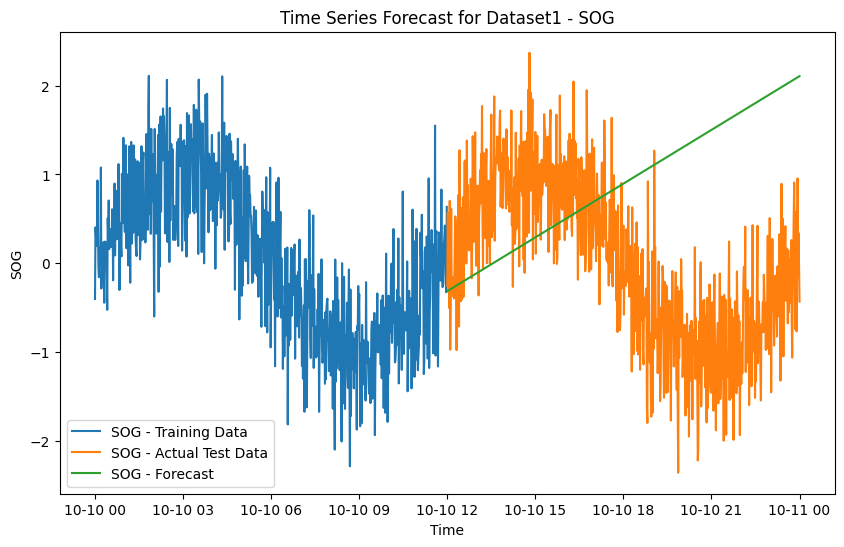

Mean Squared Error: 2.8820130682159877
Standard Deviation :  1.4432566531276787


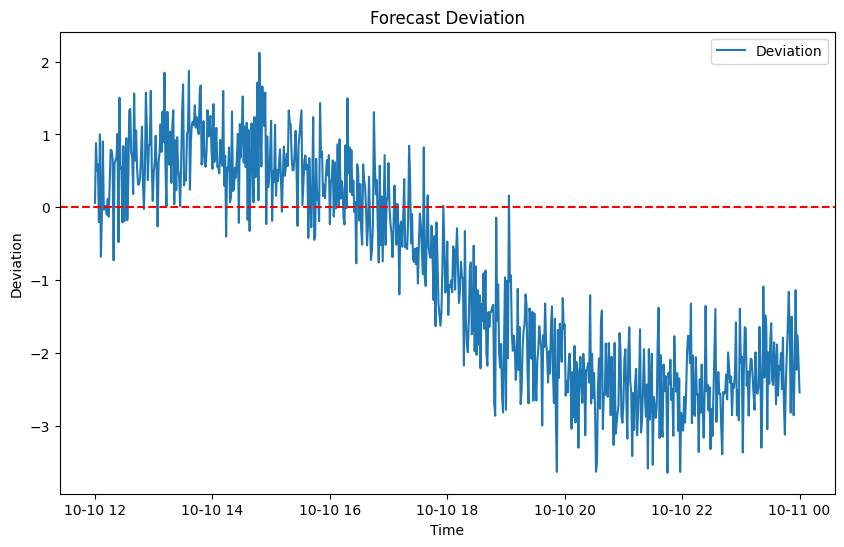


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 2
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/3693426058.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df8_subset['# Timestamp'] = pd.to_datetime(df8_subset['# Timestamp'])
/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/3693426058.py:13: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:47:58 - cmdstanpy - INFO - Chain [1] start processing
19:47:58 - cmdstanpy - INFO - Chain [1] done processing


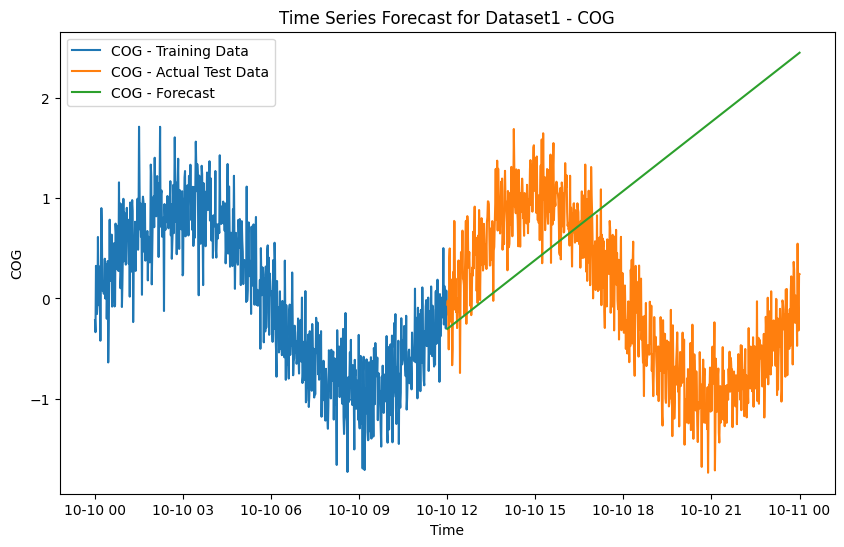

Mean Squared Error: 3.235944305587526
Standard Deviation :  1.4443875914017605


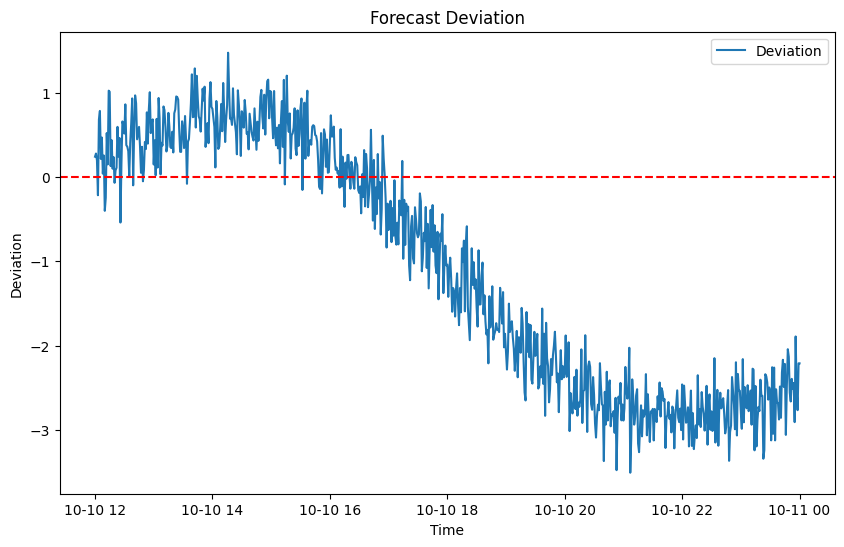


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 3
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/3693426058.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df8_subset['# Timestamp'] = pd.to_datetime(df8_subset['# Timestamp'])
/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/3693426058.py:13: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:47:59 - cmdstanpy - INFO - Chain [1] start processing
19:47:59 - cmdstanpy - INFO - Chain [1] done processing


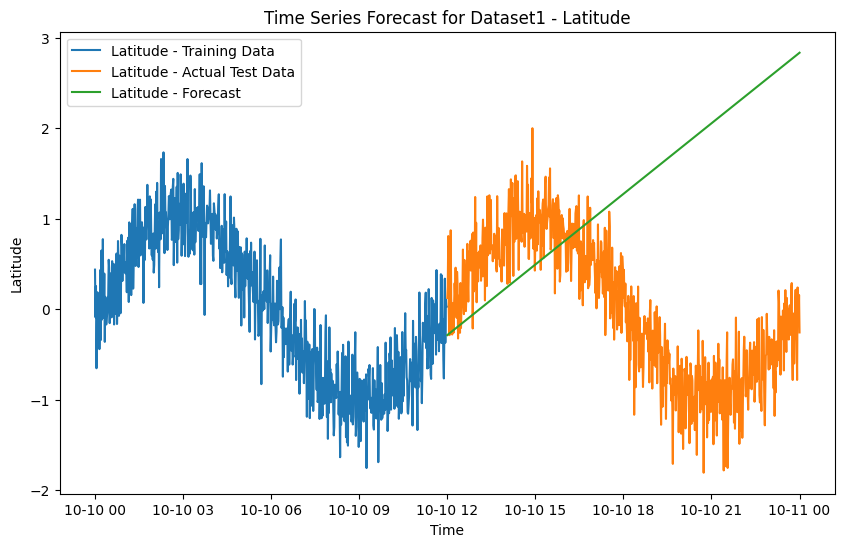

Mean Squared Error: 4.0012197157017555
Standard Deviation :  1.5448082113454042


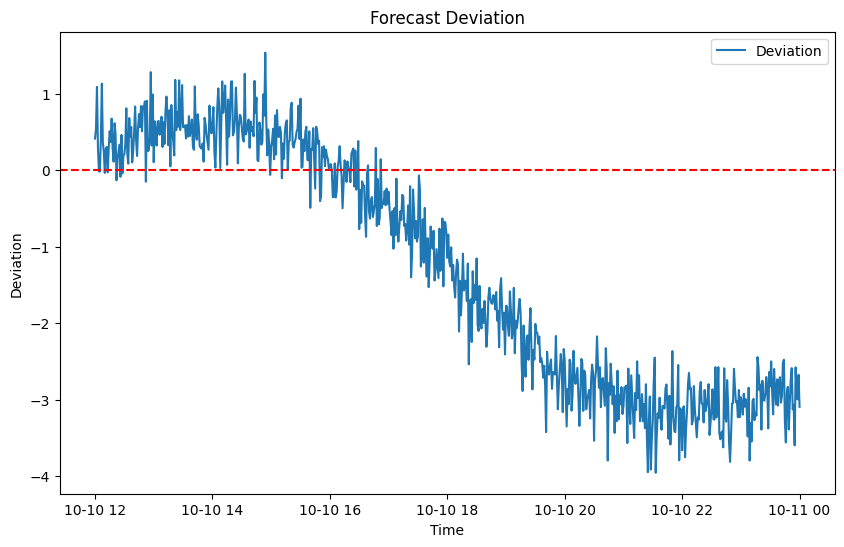


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 4
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/3693426058.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df8_subset['# Timestamp'] = pd.to_datetime(df8_subset['# Timestamp'])
/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/3693426058.py:13: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:48:01 - cmdstanpy - INFO - Chain [1] start processing
19:48:01 - cmdstanpy - INFO - Chain [1] done processing


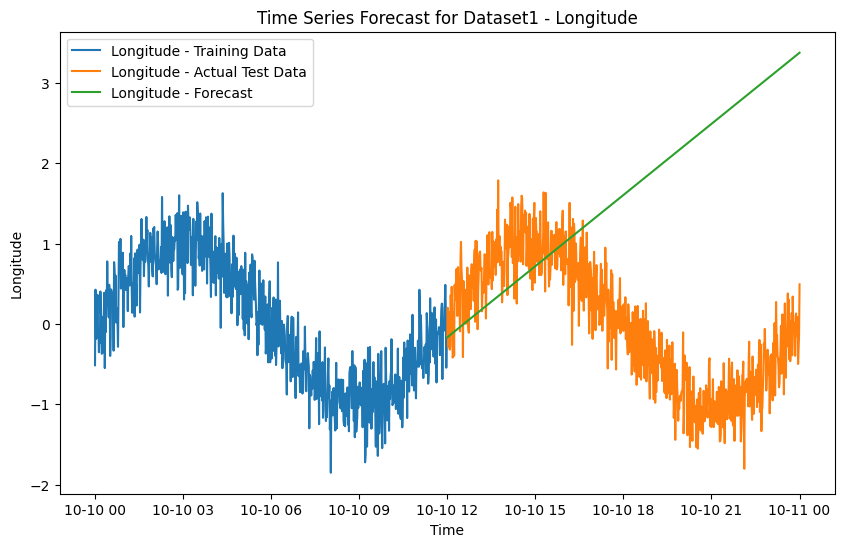

Mean Squared Error: 5.3985747460577915
Standard Deviation :  1.685574006445506


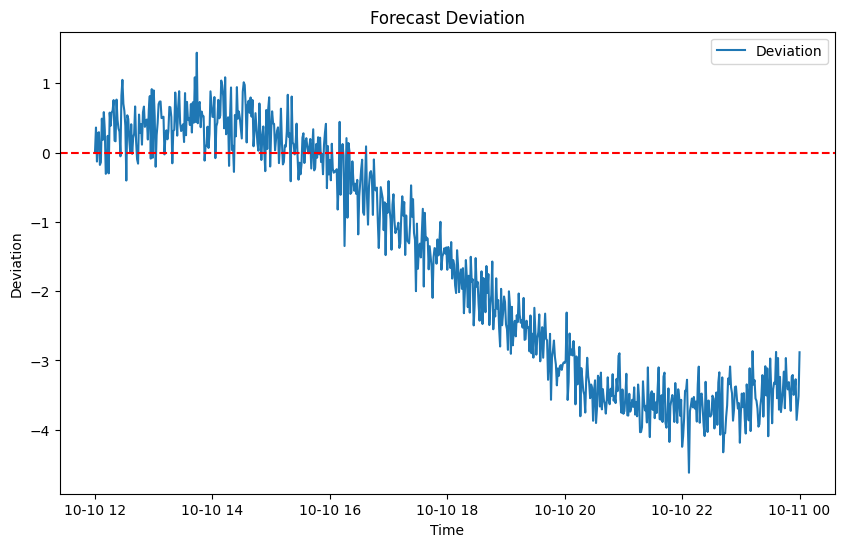


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 5
Exiting the program. Goodbye!


In [163]:
 combined_data8 = pd.DataFrame()
while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-4): ")

    if choice == '5':
        print("Exiting the program. Goodbye!")
        break
    elif choice in ['1', '2', '3', '4']:
        try:
            mmsi = input("Enter MMSI: ")  # Get the MMSI from the user
            df8_subset = df8[df8['MMSI'] == int(mmsi)]  # Subset the dataset based on the given MMSI
            
        except ValueError:
            print("Invalid input. Please enter a valid integer for the interval.")
            continue

        if choice == '1':
            columns = ['SOG']
            noise_levels = [0.5]
        elif choice == '2':
            columns = ['COG']
            noise_levels = [0.3]
        elif choice == '3':
            columns = ['Latitude']
            noise_levels = [0.3]
        elif choice == '4':
            columns = ['Longitude']
            noise_levels = [0.3]
        else:
            print("Invalid choice. Please enter a number from 1 to 4.")
            continue
        
        # Generate time series data
        time_series_data8 = create_time_series8(start_date='2023-10-10', end_date='2023-10-11', df8=df8_subset, interval_minutes=1, columns=columns, noise_levels=noise_levels)
        
        # Append to the DataFrame
        combined_data8 = pd.concat([combined_data8, time_series_data8[columns]], axis=1)

        # Split data into training and testing sets (80% training, 20% testing)
        train_data, test_data = train_test_split(time_series_data8, test_size=0.5, shuffle=False)

        # Rename columns to 'ds' and 'y' for Prophet
        train_data.rename(columns={columns[0]: 'y'}, inplace=True)
        test_data.rename(columns={columns[0]: 'y'}, inplace=True)

        # Convert 'ds' column to datetime format
        train_data['ds'] = pd.to_datetime(train_data['ds'])
        test_data['ds'] = pd.to_datetime(test_data['ds'])

        # Train Prophet model
        prophet_model = Prophet()
        prophet_model.fit(train_data)

        # Create a dataframe with future dates for prediction
        future = prophet_model.make_future_dataframe(periods=len(test_data), freq='1min')

        # Make predictions
        forecast = prophet_model.predict(future)

        # Plot the forecast and actual test data
        plot_prophet_forecast5(train_data, test_data, forecast, columns)

        # Evaluate performance using mean squared error
        mse = mean_squared_error(test_data['y'], forecast[-len(test_data):]['yhat'])
        print(f'Mean Squared Error: {mse}')

        # Calculate deviation
        test_data['deviation'] = test_data['y'] - forecast[-len(test_data):]['yhat']
        
        sd = st.stdev(test_data['deviation']) 
        print("Standard Deviation : ", sd)
    
        # Calculate moving average
        window_size = 12  # You can adjust the window size as needed
        test_data['moving_average'] = test_data['deviation'].rolling(window=window_size).mean()
    
        
        
        # Visualize deviation
        plt.figure(figsize=(10, 6))
        plt.plot(test_data['ds'], test_data['deviation'], label='Deviation')
        plt.axhline(y=0, color='r', linestyle='--')
        plt.title('Forecast Deviation')
        plt.xlabel('Time')
        plt.ylabel('Deviation')
        plt.legend()
        plt.show()

# After the loop ends, you'll have all time series data stored in df_all_time_series_data1


In [164]:
combined_data8

,SOG,COG,Latitude,Longitude
0,-0.403519,-0.216601,0.435598,-0.513648
1,0.403689,-0.336642,-0.091228,0.426865
2,0.296853,0.325077,0.253762,-0.186806
3,0.195019,0.199568,-0.654488,0.054475
4,0.395222,-0.155854,-0.167211,-0.116254
...,...,...,...,...
1436,0.955324,0.546761,0.238447,0.083613
1437,-0.132952,-0.060890,-0.145703,-0.497893
1438,0.340912,-0.319766,-0.170457,-0.318670
1439,-0.045452,0.239887,0.155472,-0.143622


In [165]:
df1_9 =pd.concat([df1_8,combined_data8],axis=0)

In [166]:
df1_9

,SOG,COG,Latitude,Longitude
0,0.323357,-0.155061,-0.016830,-0.179949
1,0.315885,-0.581238,-0.556230,-0.385583
2,0.914108,0.344985,-0.103316,0.119060
3,-0.434664,0.658695,0.116240,0.157335
4,-0.594001,-0.245701,0.234424,0.282610
...,...,...,...,...
1436,0.955324,0.546761,0.238447,0.083613
1437,-0.132952,-0.060890,-0.145703,-0.497893
1438,0.340912,-0.319766,-0.170457,-0.318670
1439,-0.045452,0.239887,0.155472,-0.143622



Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 1


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2557811301.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:48:03 - cmdstanpy - INFO - Chain [1] start processing
19:48:03 - cmdstanpy - INFO - Chain [1] done processing


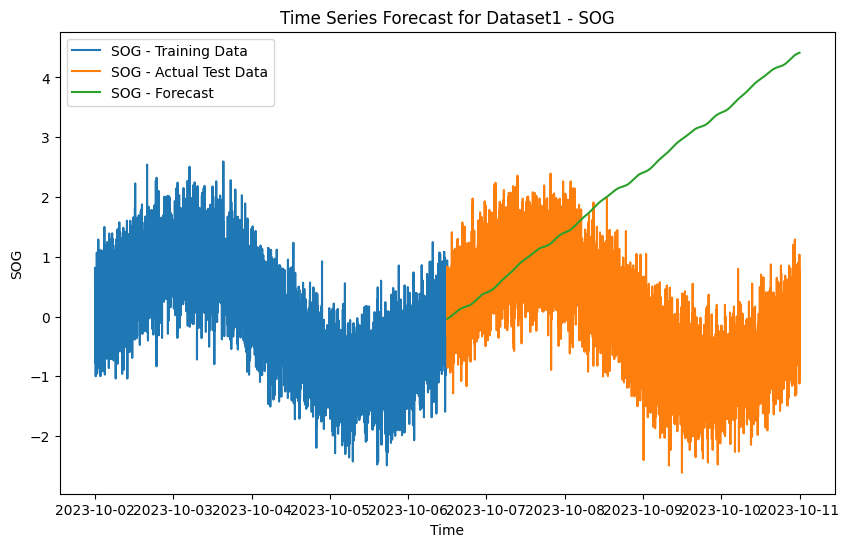

Mean Squared Error: 8.691783085152341
Standard Deviation :  1.978263089391278


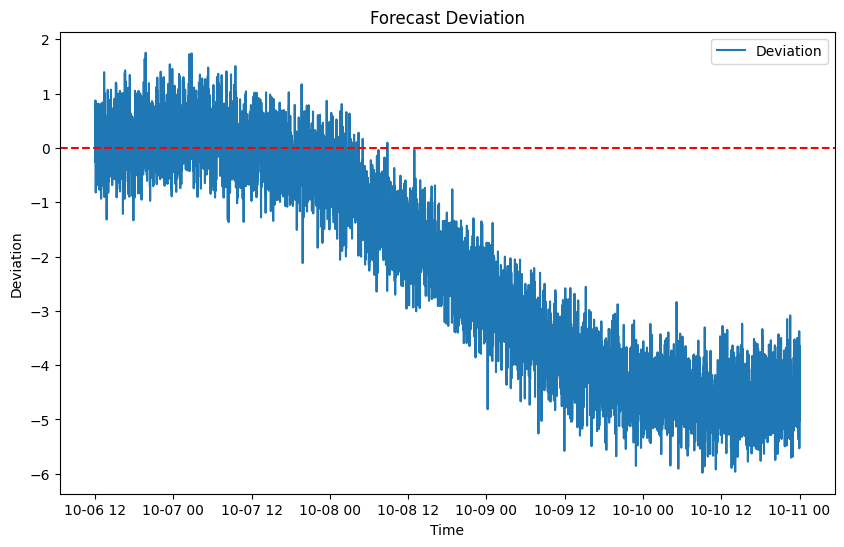


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 2


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2557811301.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:48:05 - cmdstanpy - INFO - Chain [1] start processing
19:48:06 - cmdstanpy - INFO - Chain [1] done processing


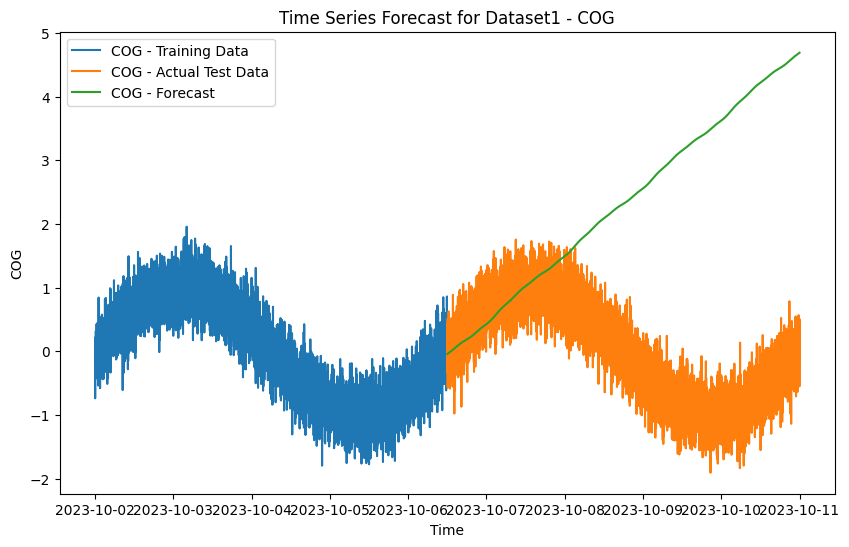

Mean Squared Error: 9.494612081259477
Standard Deviation :  2.0179502737135446


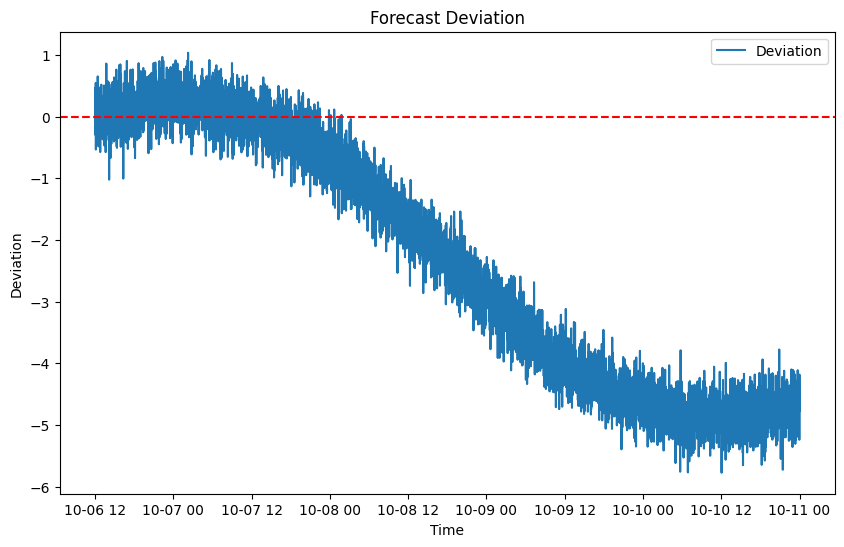


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 3


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2557811301.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:48:08 - cmdstanpy - INFO - Chain [1] start processing
19:48:08 - cmdstanpy - INFO - Chain [1] done processing


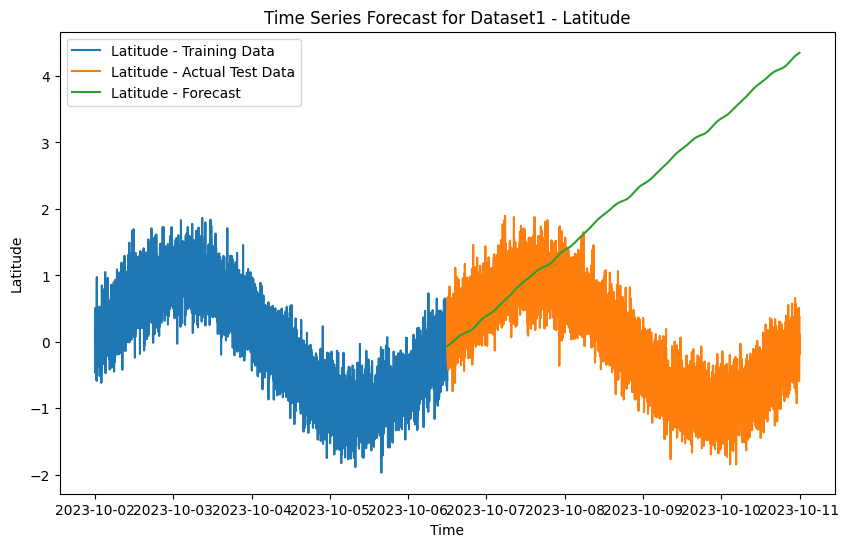

Mean Squared Error: 8.182551552411791
Standard Deviation :  1.908062227165411


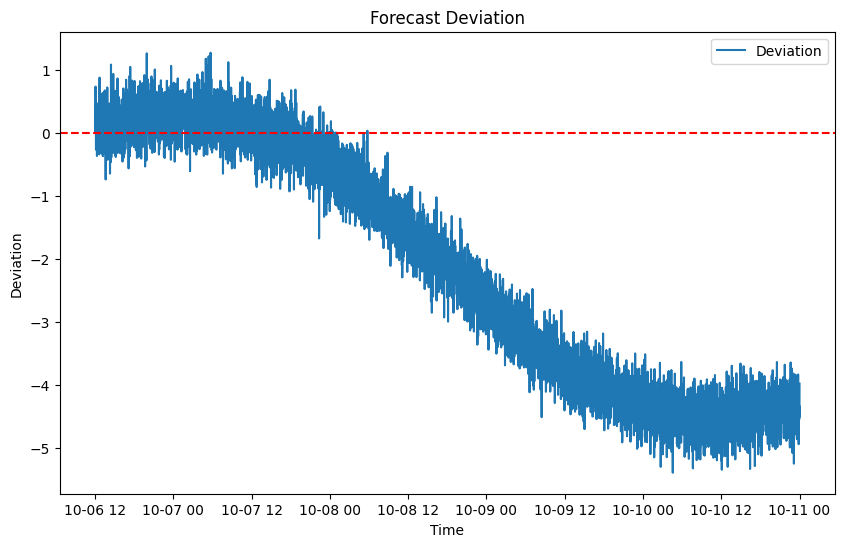


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 4


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2557811301.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:48:10 - cmdstanpy - INFO - Chain [1] start processing
19:48:10 - cmdstanpy - INFO - Chain [1] done processing


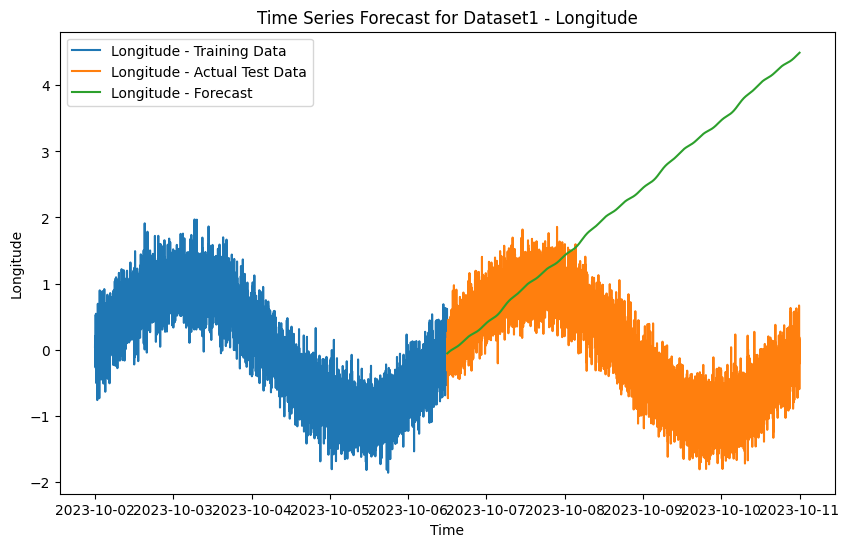

Mean Squared Error: 8.686809571325094
Standard Deviation :  1.9509082265753328


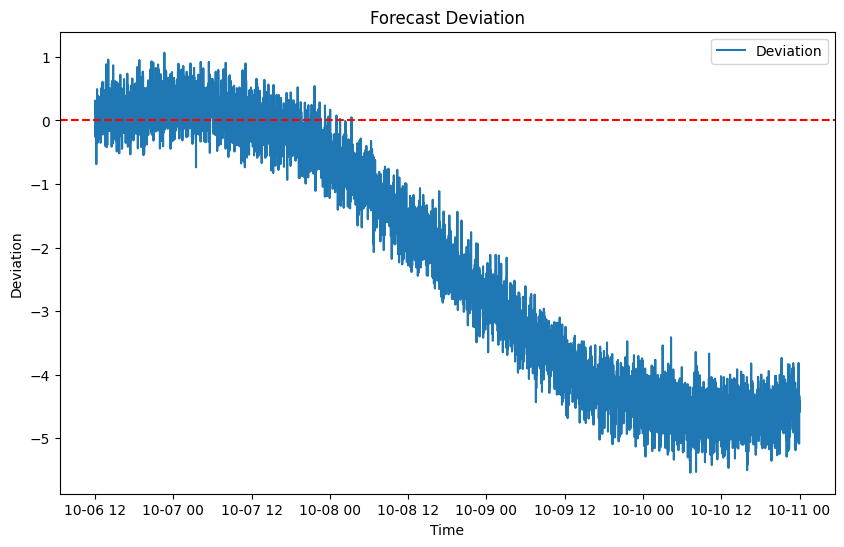


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 5
Exiting the program. Goodbye!


In [167]:
 def create_time_series1_9(start_date,end_date,df, interval_minutes, columns, noise_levels=None):
    # Generate datetime range with even intervals
    date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')

    # Create a DataFrame with datetime values
    new_df = pd.DataFrame(date_rng, columns=['ds'])

    # Generate time series values for each specified column
    for col, noise_level in zip(columns, noise_levels):
        if col.lower() == 'Latitude':
            new_df[col] = df[col]
        elif col.lower() == 'Longitude':
            new_df[col] = df[col]
        elif col.lower() =='SOG':
            new_df[col] =df[col]
        elif col.lower() =='COG':
            new_df[col] =df[col]    
        else:
            new_df[col] = np.sin(np.linspace(0, 4 * np.pi, len(new_df))) + np.random.normal(0, noise_level, len(new_df))

    return new_df

def plot_prophet_forecast1_9(train_data, test_data, forecast, columns):
    for col in columns:
        plt.figure(figsize=(10, 6))
        plt.plot(train_data['ds'], train_data['y'], label=f'{col} - Training Data')
        plt.plot(test_data['ds'], test_data['y'], label=f'{col} - Actual Test Data')
        plt.plot(test_data['ds'], forecast[-len(test_data):]['yhat'], label=f'{col} - Forecast')
        plt.title(f'Time Series Forecast for Dataset1 - {col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()
        
## PRACTCIE


while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-4): ")

    if choice == '5':
        print("Exiting the program. Goodbye!")
        break
    elif choice in ['1', '2', '3','4']:
        if choice == '1':
            columns = ['SOG']
            noise_levels = [0.5]
        elif choice =='2':
            columns=['COG']
            noise_levels=[0.3]
        elif choice == '3':
            columns = ['Latitude']
            noise_levels = [0.3]
        elif choice == '4':
            columns = ['Longitude']
            noise_levels = [0.3]
    else:
        print("Invalid choice. Please enter a number from 1 to 4.")
        continue
        
     # First, you need to create the training and testing datasets separately
    # Let's assume your first dataset is stored in df and the second dataset is stored in df1
    time_series_data1_9 = create_time_series1_9(start_date='2023-10-02', end_date='2023-10-11', df=df1_9, interval_minutes=1, columns=columns, noise_levels=noise_levels)
        
    
    train_data, test_data = train_test_split(time_series_data1_9, test_size=0.5, shuffle=False)

    
    # Rename columns to 'ds' and 'y' for Prophet

    train_data.rename(columns={columns[0]: 'y'}, inplace=True)
    test_data.rename(columns={columns[0]: 'y'}, inplace=True)
    
    # Convert 'ds' column to datetime format
    train_data['ds'] = pd.to_datetime(train_data['ds'])
    test_data['ds'] = pd.to_datetime(test_data['ds'])

    # Train Prophet model
    prophet_model = Prophet()
    prophet_model.fit(train_data)

    # Create a dataframe with future dates for prediction
    future = prophet_model.make_future_dataframe(periods=len(test_data), freq='1min')

    # Make predictions
    forecast = prophet_model.predict(future)

    # Plot the forecast and actual test data
    plot_prophet_forecast12(train_data, test_data, forecast, columns)

    # Evaluate performance using mean squared error
    mse = mean_squared_error(test_data['y'], forecast[-len(test_data):]['yhat'])
    print(f'Mean Squared Error: {mse}')

    # Calculate deviation
    test_data['deviation'] = test_data['y'] - forecast[-len(test_data):]['yhat']
    
    # Calculate deviation percentage using stdev function
    sd = np.std(test_data['deviation']) 
    print("Standard Deviation : ", sd)
    
    # Calculate standard deviation percentage
    
    # Visualize deviation
    plt.figure(figsize=(10, 6))
    plt.plot(test_data['ds'], test_data['deviation'], label='Deviation')
    plt.axhline(y=0, color='r', linestyle='--')
    plt.title('Forecast Deviation')
    plt.xlabel('Time')
    plt.ylabel('Deviation')
    plt.legend()
    plt.show()
   
    

## Dataset 10

In [168]:
def create_time_series9(start_date,end_date,df9, interval_minutes, columns, noise_levels=None):
    # Set the 'Timestamp' column as the index
    #df.set_index('# Timestamp', inplace=True)
    df9_subset['# Timestamp'] = pd.to_datetime(df9_subset['# Timestamp'])
    df9_subset.set_index('# Timestamp', inplace=True)
    # Resample the DataFrame to get one data point per minute
    resampled_df9 = df9.resample(f'{interval_minutes}5min').first().reset_index()
    
    resampled_df9 = df9.groupby([pd.Grouper(freq=f'{interval_minutes}5min'), 'MMSI']).min().reset_index()
    
    
    # Generate datetime range with even intervals
    date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')

    # Create a DataFrame with datetime values
    new_df = pd.DataFrame(date_rng, columns=['ds'])
        
    # Merge resampled data with the new DataFrame on the 'ds' column
    new_df = pd.merge(new_df, resampled_df9, how='left', left_on='ds', right_on='# Timestamp')

    # Drop the redundant '# Timestamp' column
    new_df.drop('# Timestamp', axis=1, inplace=True)

    
    # Generate time series values for each specified column
    for col, noise_level in zip(columns, noise_levels):
        if col.lower() == 'Latitude':
            new_df[col] = df[col]
        elif col.lower() == 'Longitude':
            new_df[col] = df[col]
        elif col.lower() =='SOG':
            new_df[col] =df[col]
        elif col.lower() =='COG':
            new_df[col] =df[col]    
        else:
            new_df[col] = np.sin(np.linspace(0, 4 * np.pi, len(new_df))) + np.random.normal(0, noise_level, len(new_df))

    return new_df

In [169]:
def plot_time_series9(df9,columns,window=7):
    for col in columns:
        df9['Moving Average'] = df9[col].rolling(window=window).mean()
        plt.figure(figsize=(10,6))
        plt.plot(df9['ds'],df9[col],label=col)
        plt.plot(df9['ds'], df9['Moving Average'], label=f'{col} - Moving Average', linestyle='--', color='red')
        plt.title(f'Time Series Plot for Dataset df:6 -{col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()

# Menu-driven code
while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG ")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-5): ")

    if choice in ['1', '2', '3', '4']:
        mmsi = input("Enter MMSI: ")  # Get the MMSI from the user
        df9_subset = df9[df9['MMSI'] == int(mmsi)]  # Subset the dataset based on the given MMSI
        columns = ['SOG'] if choice == '1' else ['COG'] if choice == '2' else ['Latitude'] if choice == '3' else ['Longitude']
        noise_levels = [0.5] if choice == '1' else [0.3]  # Adjust noise levels as needed

        #time_series_data = create_time_series(start_date='2022-10-03',end_date='2022-10-04',df1=df_subset, interval_minutes=5, columns=columns, noise_levels=noise_levels)
        time_series_data9 = create_time_series9(start_date='2022-10-11', end_date='2022-10-12', df9=df9_subset, interval_minutes=5, columns=columns, noise_levels=noise_levels)

        plot_time_series9(time_series_data9, columns)
    elif choice == '5':
        print("Exiting the program. Goodbye!")
        break
    else:
        print("Invalid choice. Please enter a number from 1 to 5.")


In [170]:
def plot_prophet_forecast9(train_data, test_data, forecast, columns, window=7):
    for col in columns:
        # Compute moving average
        test_data['Moving Average'] = test_data['y'].rolling(window=window).mean()
        
        plt.figure(figsize=(10, 6))
        plt.plot(train_data['ds'], train_data['y'], label=f'{col} - Training Data')
        plt.plot(test_data['ds'], test_data['y'], label=f'{col} - Actual Test Data')
        plt.plot(test_data['ds'], forecast[-len(test_data):]['yhat'], label=f'{col} - Forecast')
        plt.plot(test_data['ds'], test_data['Moving Average'], label=f'{col} - Moving Average', linestyle='--', color='red')
        plt.title(f'Time Series Forecast for DF - {col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()



Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 1
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2193345765.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df9_subset['# Timestamp'] = pd.to_datetime(df9_subset['# Timestamp'])
/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2193345765.py:13: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:48:17 - cmdstanpy - INFO - Chain [1] start processing
19:48:17 - cmdstanpy - INFO - Chain [1] done processing
/Users/amitsingh/anaconda3/envs/test/lib/python3.11/site-packages/prophet/forecaster.py:1854: FutureWarning: 'T' is deprecated and will be removed in a future version, please u

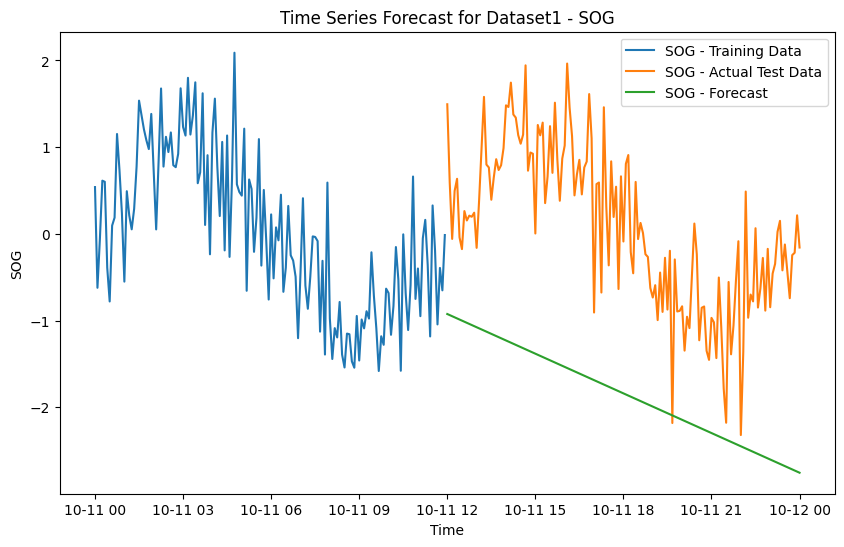

Mean Squared Error: 4.096082072482936
Standard Deviation :  0.6883899586558452


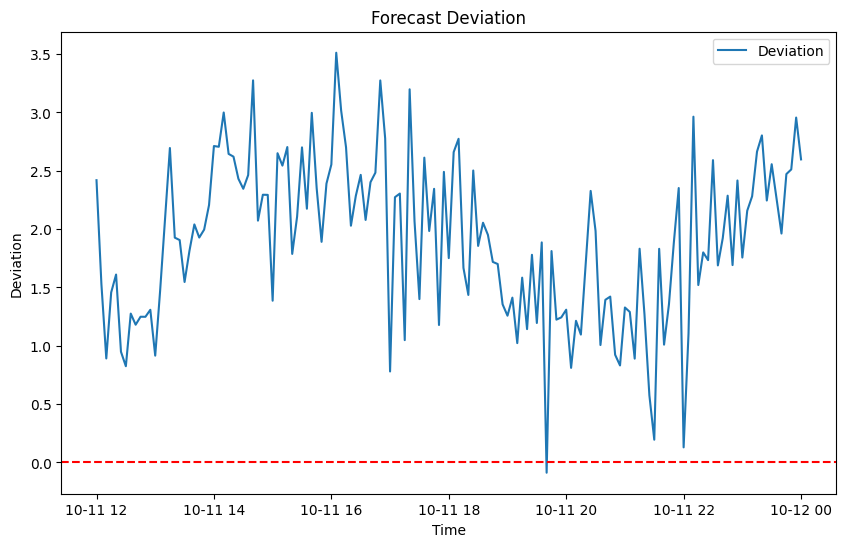


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 2
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2193345765.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df9_subset['# Timestamp'] = pd.to_datetime(df9_subset['# Timestamp'])
/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2193345765.py:13: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:48:18 - cmdstanpy - INFO - Chain [1] start processing
19:48:18 - cmdstanpy - INFO - Chain [1] done processing
/Users/amitsingh/anaconda3/envs/test/lib/python3.11/site-packages/prophet/forecaster.py:1854: FutureWarning: 'T' is deprecated and will be removed in a future version, please u

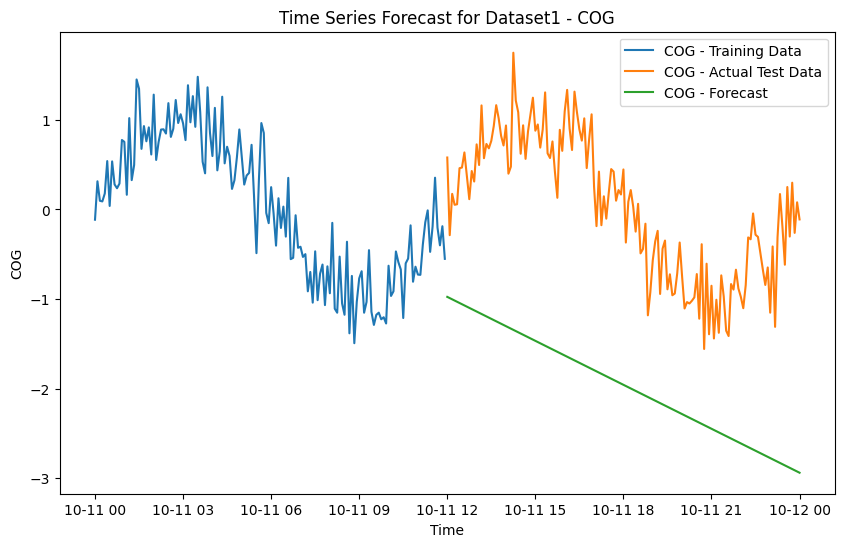

Mean Squared Error: 4.147893711040686
Standard Deviation :  0.5407275915909888


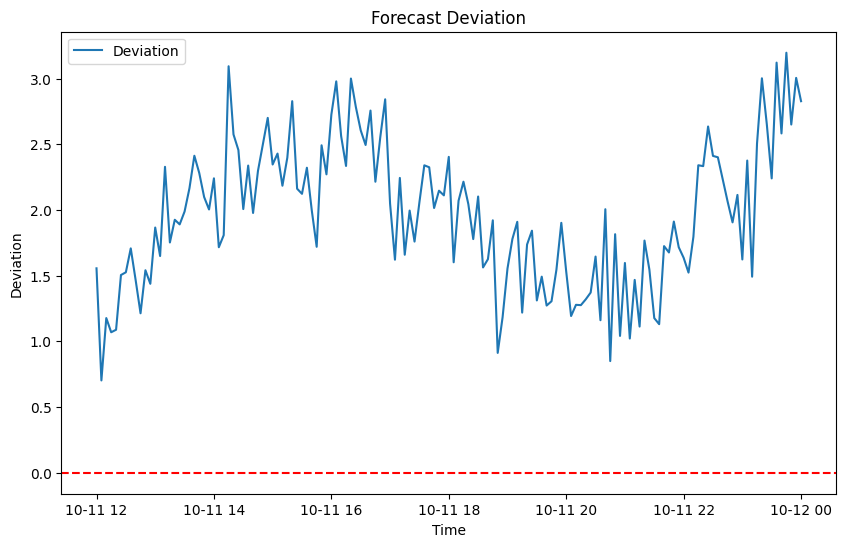


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 3
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2193345765.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df9_subset['# Timestamp'] = pd.to_datetime(df9_subset['# Timestamp'])
/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2193345765.py:13: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:48:19 - cmdstanpy - INFO - Chain [1] start processing
19:48:19 - cmdstanpy - INFO - Chain [1] done processing
/Users/amitsingh/anaconda3/envs/test/lib/python3.11/site-packages/prophet/forecaster.py:1854: FutureWarning: 'T' is deprecated and will be removed in a future version, please u

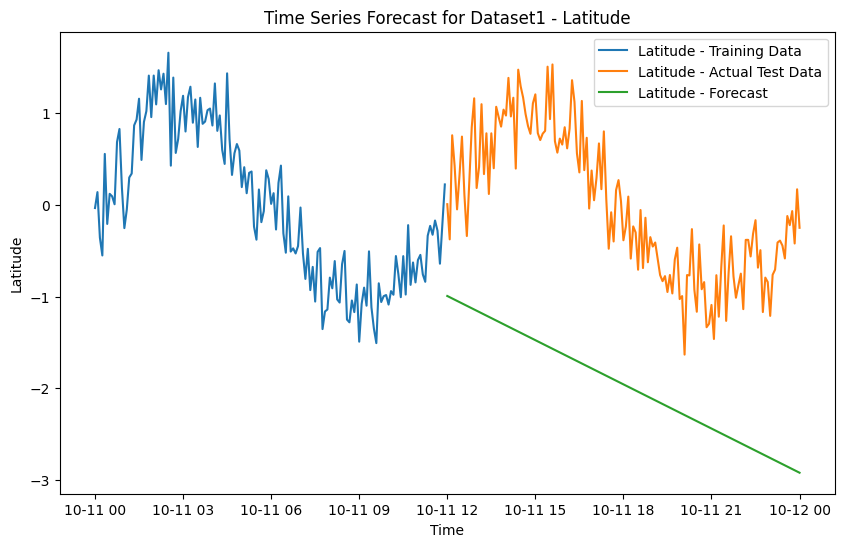

Mean Squared Error: 4.029709460983735
Standard Deviation :  0.5270915579063352


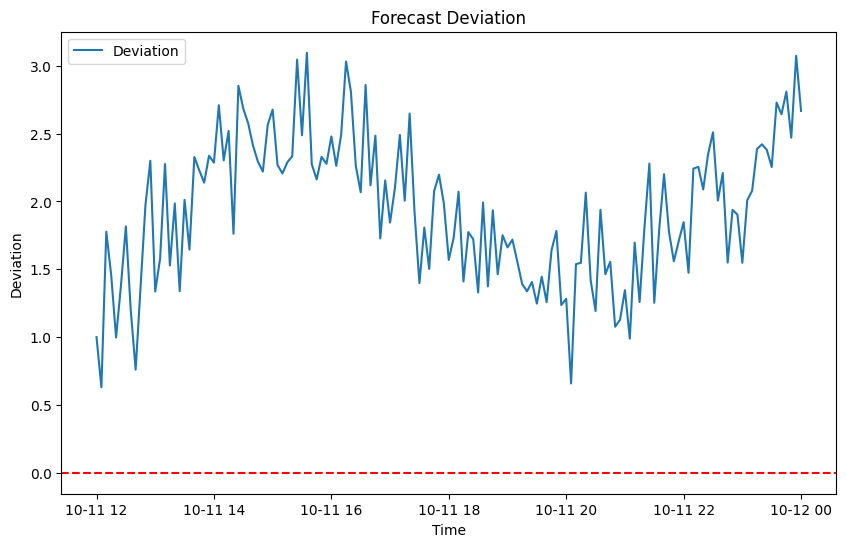


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 4
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2193345765.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df9_subset['# Timestamp'] = pd.to_datetime(df9_subset['# Timestamp'])
/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2193345765.py:13: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:48:21 - cmdstanpy - INFO - Chain [1] start processing
19:48:21 - cmdstanpy - INFO - Chain [1] done processing
/Users/amitsingh/anaconda3/envs/test/lib/python3.11/site-packages/prophet/forecaster.py:1854: FutureWarning: 'T' is deprecated and will be removed in a future version, please u

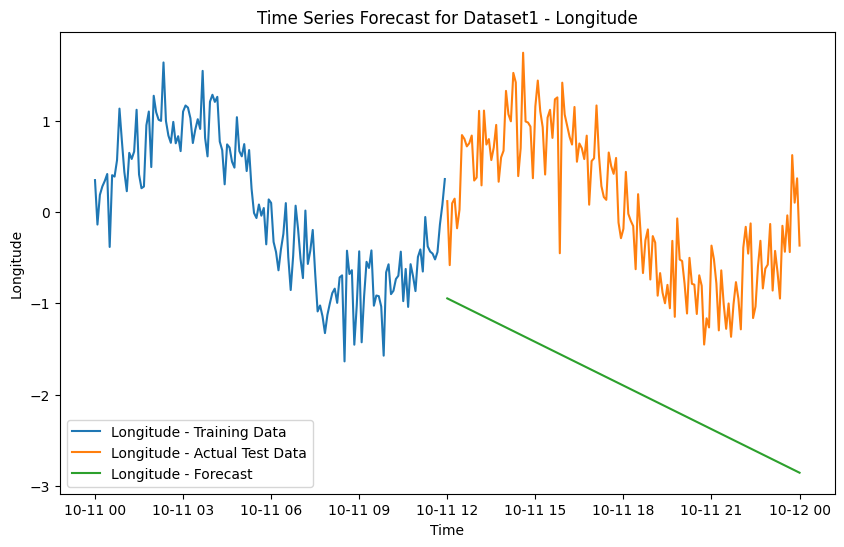

Mean Squared Error: 4.093560490817067
Standard Deviation :  0.5614649565091075


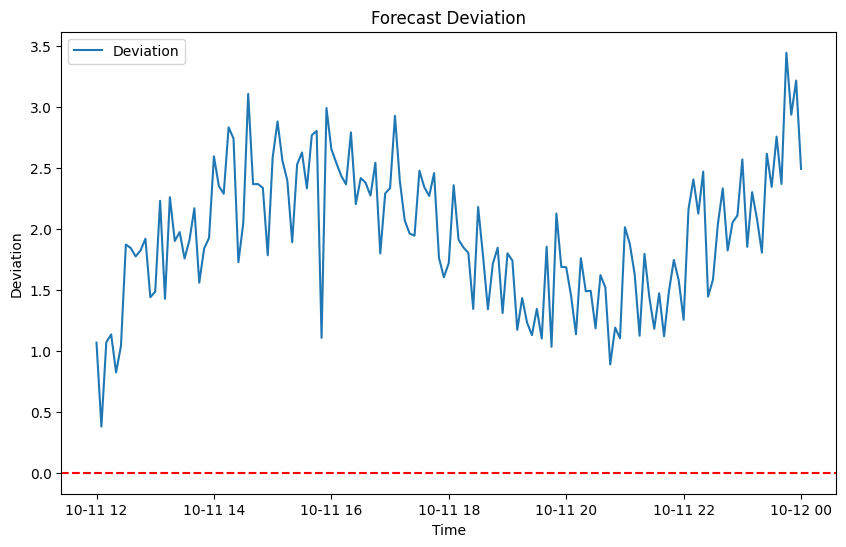


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 5
Exiting the program. Goodbye!


In [171]:
combined_data9 = pd.DataFrame()
while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-4): ")

    if choice == '5':
        print("Exiting the program. Goodbye!")
        break
    elif choice in ['1', '2', '3', '4']:
        try:
            mmsi = input("Enter MMSI: ")  # Get the MMSI from the user
            df9_subset = df9[df9['MMSI'] == int(mmsi)]  # Subset the dataset based on the given MMSI
            
        except ValueError:
            print("Invalid input. Please enter a valid integer for the interval.")
            continue

        if choice == '1':
            columns = ['SOG']
            noise_levels = [0.5]
        elif choice == '2':
            columns = ['COG']
            noise_levels = [0.3]
        elif choice == '3':
            columns = ['Latitude']
            noise_levels = [0.3]
        elif choice == '4':
            columns = ['Longitude']
            noise_levels = [0.3]
        else:
            print("Invalid choice. Please enter a number from 1 to 4.")
            continue
        
        # Generate time series data
        time_series_data9 = create_time_series9(start_date='2023-10-11', end_date='2023-10-12', df9=df9_subset, interval_minutes=5, columns=columns, noise_levels=noise_levels)
        
        # Append to the DataFrame
        combined_data9 = pd.concat([combined_data9, time_series_data9[columns]], axis=1)

        # Split data into training and testing sets (80% training, 20% testing)
        train_data, test_data = train_test_split(time_series_data9, test_size=0.5, shuffle=False)

        # Rename columns to 'ds' and 'y' for Prophet
        train_data.rename(columns={columns[0]: 'y'}, inplace=True)
        test_data.rename(columns={columns[0]: 'y'}, inplace=True)

        # Convert 'ds' column to datetime format
        train_data['ds'] = pd.to_datetime(train_data['ds'])
        test_data['ds'] = pd.to_datetime(test_data['ds'])

        # Train Prophet model
        prophet_model = Prophet()
        prophet_model.fit(train_data)

        # Create a dataframe with future dates for prediction
        future = prophet_model.make_future_dataframe(periods=len(test_data), freq='5T')

        # Make predictions
        forecast = prophet_model.predict(future)

        # Plot the forecast and actual test data
        plot_prophet_forecast5(train_data, test_data, forecast, columns)

        # Evaluate performance using mean squared error
        mse = mean_squared_error(test_data['y'], forecast[-len(test_data):]['yhat'])
        print(f'Mean Squared Error: {mse}')

        # Calculate deviation
        test_data['deviation'] = test_data['y'] - forecast[-len(test_data):]['yhat']
        
        sd = st.stdev(test_data['deviation']) 
        print("Standard Deviation : ", sd)
    
        # Calculate moving average
        window_size = 12  # You can adjust the window size as needed
        test_data['moving_average'] = test_data['deviation'].rolling(window=window_size).mean()
    
        
        
        # Visualize deviation
        plt.figure(figsize=(10, 6))
        plt.plot(test_data['ds'], test_data['deviation'], label='Deviation')
        plt.axhline(y=0, color='r', linestyle='--')
        plt.title('Forecast Deviation')
        plt.xlabel('Time')
        plt.ylabel('Deviation')
        plt.legend()
        plt.show()

# After the loop ends, you'll have all time series data stored in df_all_time_series_data1


In [172]:
combined_data9

,SOG,COG,Latitude,Longitude
0,0.539781,-0.114965,-0.035637,0.350439
1,-0.621844,0.313900,0.137811,-0.136592
2,-0.056740,0.095978,-0.359040,0.189131
3,0.613554,0.089224,-0.552278,0.281031
4,0.600684,0.177646,0.553786,0.341659
...,...,...,...,...
284,-0.741972,-0.302715,-0.222088,-0.438359
285,-0.245051,0.297979,-0.068917,0.624578
286,-0.217768,-0.262116,-0.421852,0.103339
287,0.213901,0.079127,0.168486,0.369966


In [173]:
df1_10 =pd.concat([df1_9,combined_data9],axis=0)

In [174]:
df1_10

,SOG,COG,Latitude,Longitude
0,0.323357,-0.155061,-0.016830,-0.179949
1,0.315885,-0.581238,-0.556230,-0.385583
2,0.914108,0.344985,-0.103316,0.119060
3,-0.434664,0.658695,0.116240,0.157335
4,-0.594001,-0.245701,0.234424,0.282610
...,...,...,...,...
284,-0.741972,-0.302715,-0.222088,-0.438359
285,-0.245051,0.297979,-0.068917,0.624578
286,-0.217768,-0.262116,-0.421852,0.103339
287,0.213901,0.079127,0.168486,0.369966



Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 1


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/130175756.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:48:22 - cmdstanpy - INFO - Chain [1] start processing
19:48:23 - cmdstanpy - INFO - Chain [1] done processing


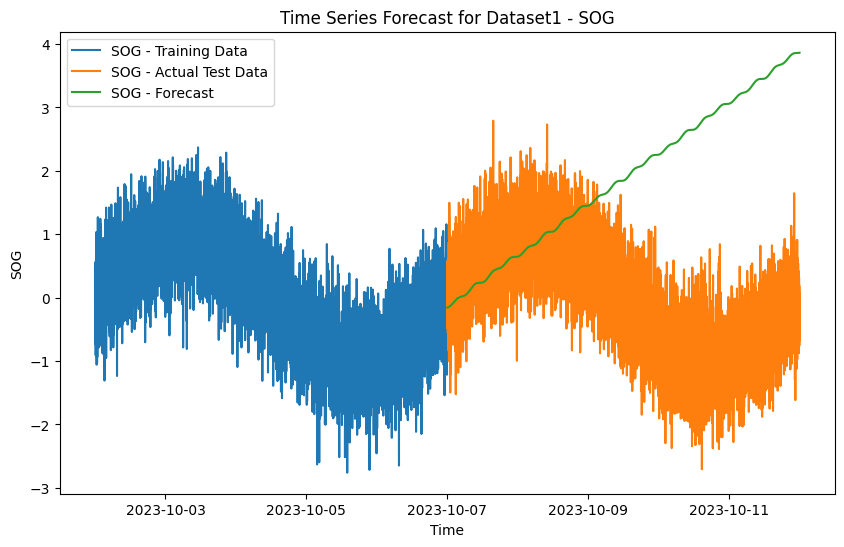

Mean Squared Error: 6.9434354460871575
Standard Deviation :  1.8391494089205667


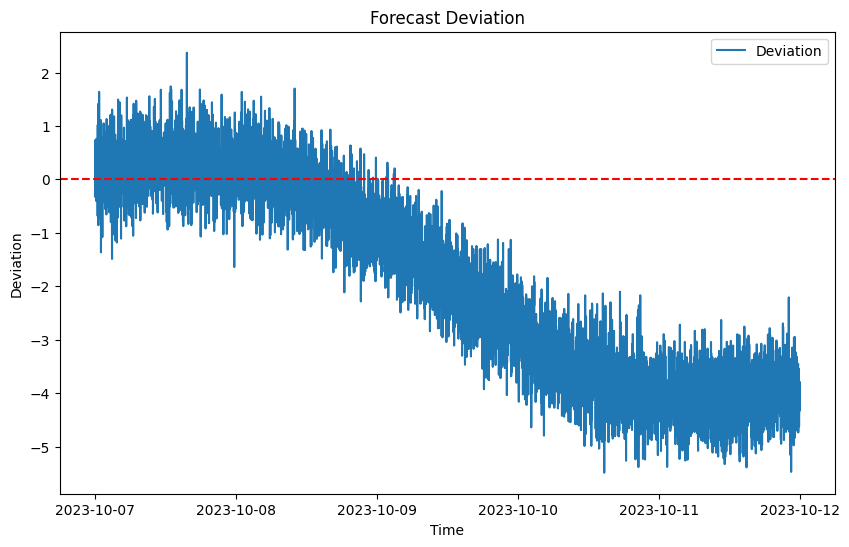


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 2


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/130175756.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:48:25 - cmdstanpy - INFO - Chain [1] start processing
19:48:25 - cmdstanpy - INFO - Chain [1] done processing


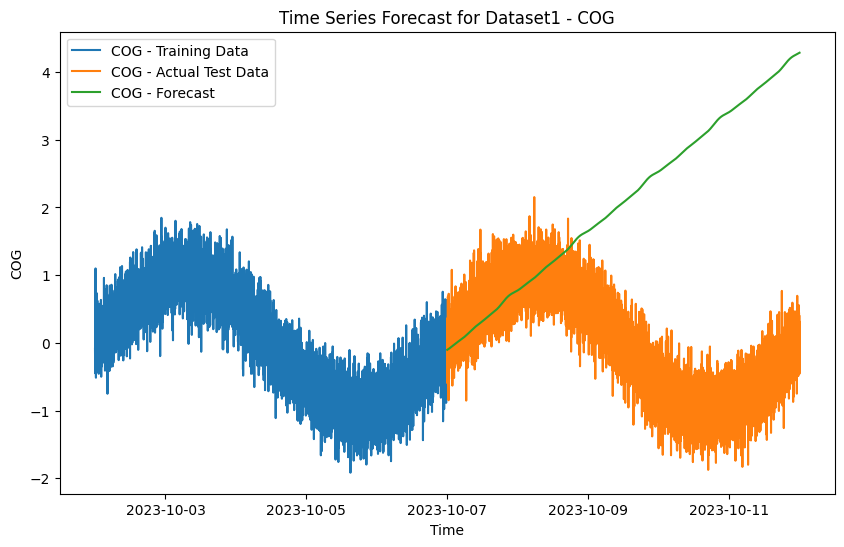

Mean Squared Error: 7.934472468795219
Standard Deviation :  1.8943321847761385


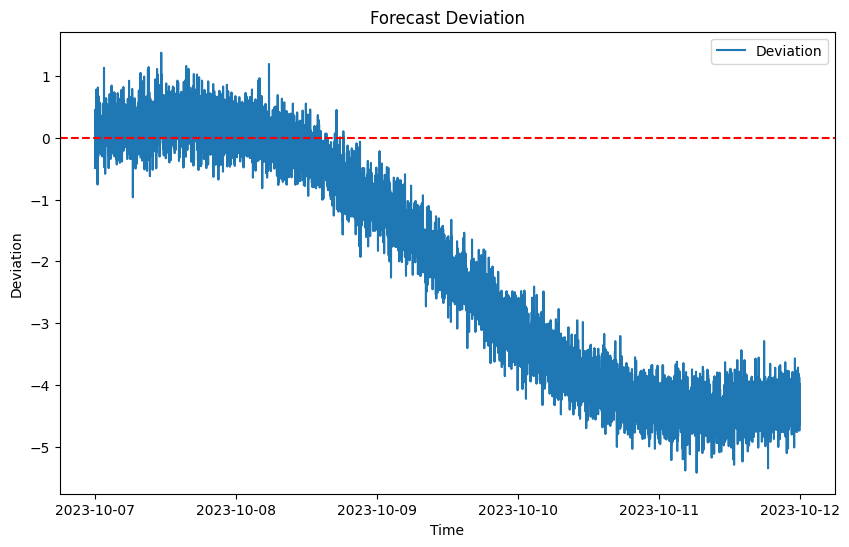


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 3


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/130175756.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:48:28 - cmdstanpy - INFO - Chain [1] start processing
19:48:29 - cmdstanpy - INFO - Chain [1] done processing


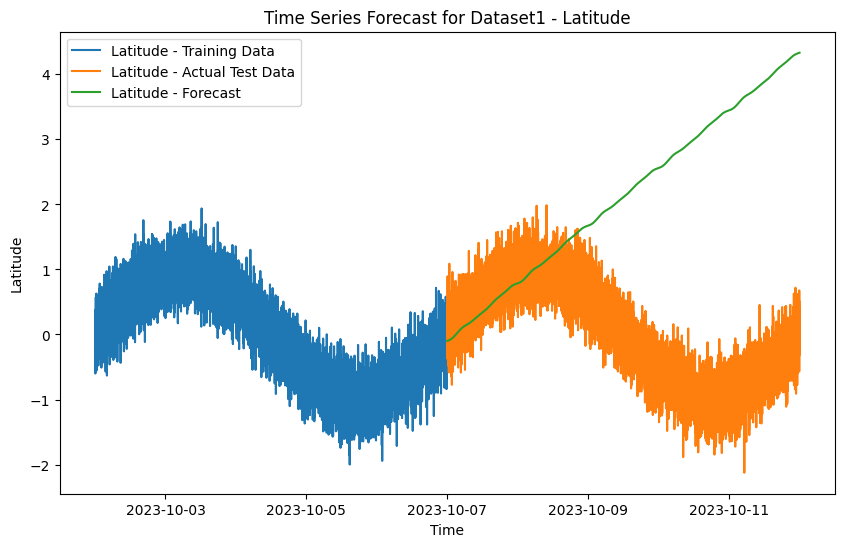

Mean Squared Error: 8.163942300630229
Standard Deviation :  1.9109275820724587


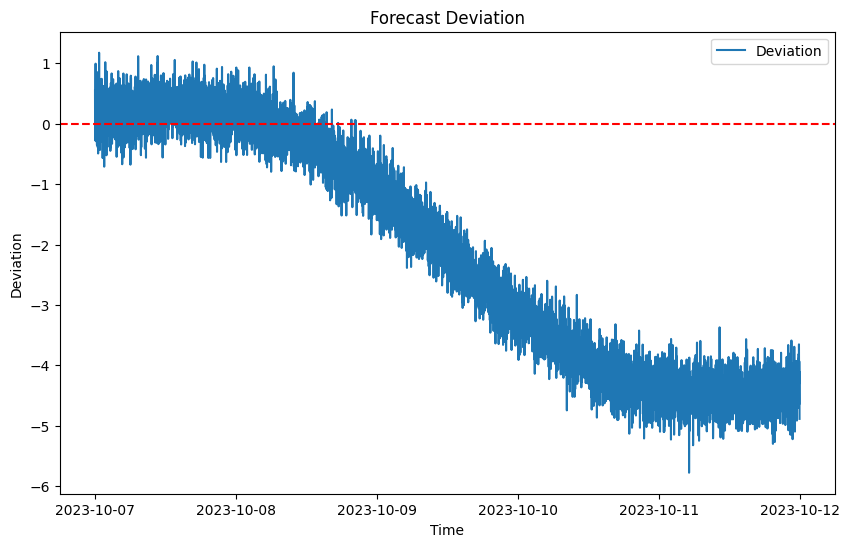


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 4


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/130175756.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:48:31 - cmdstanpy - INFO - Chain [1] start processing
19:48:32 - cmdstanpy - INFO - Chain [1] done processing


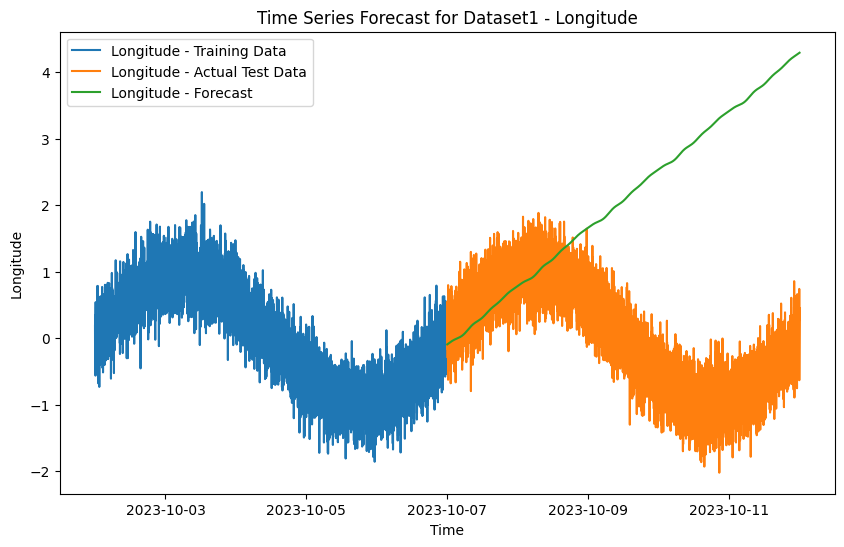

Mean Squared Error: 7.927568007910413
Standard Deviation :  1.9001865951990713


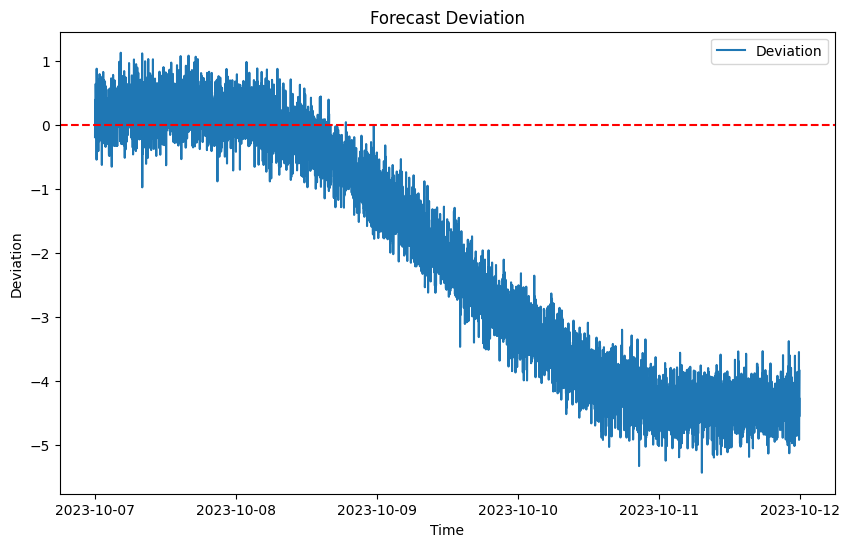


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 5
Exiting the program. Goodbye!


In [175]:
 def create_time_series1_10(start_date,end_date,df, interval_minutes, columns, noise_levels=None):
    # Generate datetime range with even intervals
    date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')

    # Create a DataFrame with datetime values
    new_df = pd.DataFrame(date_rng, columns=['ds'])

    # Generate time series values for each specified column
    for col, noise_level in zip(columns, noise_levels):
        if col.lower() == 'Latitude':
            new_df[col] = df[col]
        elif col.lower() == 'Longitude':
            new_df[col] = df[col]
        elif col.lower() =='SOG':
            new_df[col] =df[col]
        elif col.lower() =='COG':
            new_df[col] =df[col]    
        else:
            new_df[col] = np.sin(np.linspace(0, 4 * np.pi, len(new_df))) + np.random.normal(0, noise_level, len(new_df))

    return new_df

def plot_prophet_forecast1_10(train_data, test_data, forecast, columns):
    for col in columns:
        plt.figure(figsize=(10, 6))
        plt.plot(train_data['ds'], train_data['y'], label=f'{col} - Training Data')
        plt.plot(test_data['ds'], test_data['y'], label=f'{col} - Actual Test Data')
        plt.plot(test_data['ds'], forecast[-len(test_data):]['yhat'], label=f'{col} - Forecast')
        plt.title(f'Time Series Forecast for Dataset1 - {col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()
        
## PRACTCIE


while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-4): ")

    if choice == '5':
        print("Exiting the program. Goodbye!")
        break
    elif choice in ['1', '2', '3','4']:
        if choice == '1':
            columns = ['SOG']
            noise_levels = [0.5]
        elif choice =='2':
            columns=['COG']
            noise_levels=[0.3]
        elif choice == '3':
            columns = ['Latitude']
            noise_levels = [0.3]
        elif choice == '4':
            columns = ['Longitude']
            noise_levels = [0.3]
    else:
        print("Invalid choice. Please enter a number from 1 to 4.")
        continue
        
     # First, you need to create the training and testing datasets separately
    # Let's assume your first dataset is stored in df and the second dataset is stored in df1
    time_series_data1_10 = create_time_series1_10(start_date='2023-10-02', end_date='2023-10-12', df=df1_10, interval_minutes=1, columns=columns, noise_levels=noise_levels)
        
    
    train_data, test_data = train_test_split(time_series_data1_10, test_size=0.5, shuffle=False)

    
    # Rename columns to 'ds' and 'y' for Prophet

    train_data.rename(columns={columns[0]: 'y'}, inplace=True)
    test_data.rename(columns={columns[0]: 'y'}, inplace=True)
    
    # Convert 'ds' column to datetime format
    train_data['ds'] = pd.to_datetime(train_data['ds'])
    test_data['ds'] = pd.to_datetime(test_data['ds'])

    # Train Prophet model
    prophet_model = Prophet()
    prophet_model.fit(train_data)

    # Create a dataframe with future dates for prediction
    future = prophet_model.make_future_dataframe(periods=len(test_data), freq='1min')

    # Make predictions
    forecast = prophet_model.predict(future)

    # Plot the forecast and actual test data
    plot_prophet_forecast12(train_data, test_data, forecast, columns)

    # Evaluate performance using mean squared error
    mse = mean_squared_error(test_data['y'], forecast[-len(test_data):]['yhat'])
    print(f'Mean Squared Error: {mse}')

    # Calculate deviation
    test_data['deviation'] = test_data['y'] - forecast[-len(test_data):]['yhat']
    
    # Calculate deviation percentage using stdev function
    sd = np.std(test_data['deviation']) 
    print("Standard Deviation : ", sd)
    
    # Calculate standard deviation percentage
    
    # Visualize deviation
    plt.figure(figsize=(10, 6))
    plt.plot(test_data['ds'], test_data['deviation'], label='Deviation')
    plt.axhline(y=0, color='r', linestyle='--')
    plt.title('Forecast Deviation')
    plt.xlabel('Time')
    plt.ylabel('Deviation')
    plt.legend()
    plt.show()
   
    

## Dataset 11

In [176]:
def create_time_series10(start_date, end_date, df10, interval_minutes, columns, noise_levels=None):

    # Set the 'Timestamp' column as the index
    df10.set_index('# Timestamp', inplace=True)

    # Resample the DataFrame to get one data point per minute
    resampled_df10 = df10.resample(f'{interval_minutes}1min').first().reset_index()
    
    resampled_df10 = df10.groupby([pd.Grouper(freq=f'{interval_minutes}1min'), 'MMSI']).min().reset_index()
    
    # Generate datetime range with even intervals
    date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')

    # Create a DataFrame with datetime values
    new_df = pd.DataFrame(date_rng, columns=['ds'])

    # Merge resampled data with the new DataFrame on the 'ds' column
    new_df = pd.merge(new_df, resampled_df10, how='left', left_on='ds', right_on='# Timestamp')

    # Drop the redundant '# Timestamp' column
    new_df.drop('# Timestamp', axis=1, inplace=True)

    # Generate time series values for each specified column
    for col, noise_level in zip(columns, noise_levels):
        if col.lower() == 'Latitude':
            new_df[col] = df[col]
        elif col.lower() == 'Longitude':
            new_df[col] = df[col]
        elif col.lower() =='SOG':
            new_df[col] =df[col]
        elif col.lower() =='COG':
            new_df[col] =df[col]    
        else:
            new_df[col] = np.sin(np.linspace(0, 4 * np.pi, len(new_df))) + np.random.normal(0, noise_level, len(new_df))

    return new_df



In [177]:
 def plot_time_series10(df10, columns, window=7):
    for col in columns:
        # Calculate moving average
        df10['Moving Average'] = df10[col].rolling(window=window).mean()
        
        plt.figure(figsize=(10, 6))
        plt.plot(df10['ds'], df10[col], label=col)
        plt.plot(df10['ds'], df10['Moving Average'], label=f'{col} - Moving Average', linestyle='--', color='red')
        plt.title(f'Time Series Plot for Dataset df - {col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()

## Menu-driven code
mmsi = input("Enter MMSI: ")  # Get the MMSI from the user
while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG ")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-5): ")
    
    if choice in ['1', '2', '3', '4']:
        #mmsi = input("Enter MMSI: ")  # Get the MMSI from the user
        df10_subset = df10[df10['MMSI'] == int(mmsi)]  # Subset the dataset based on the given MMSI
        columns = ['SOG'] if choice == '1' else ['COG'] if choice == '2' else ['Latitude'] if choice == '3' else ['Longitude']
        noise_levels = [0.5] if choice == '1' else [0.3]  # Adjust noise levels as needed

        time_series_data10 = create_time_series10(start_date='2022-10-12',end_date='2022-10-13',df10=df10_subset, interval_minutes=1, columns=columns, noise_levels=noise_levels)
        plot_time_series10(time_series_data10, columns)
    elif choice == '5':
        print("Exiting the program. Goodbye!")
        break
    else:
        print("Invalid choice. Please enter a number from 1 to 5.")


In [178]:
def plot_prophet_forecast10(train_data, test_data, forecast, columns, window=7):
    for col in columns:
        # Compute moving average
        test_data['Moving Average'] = test_data['y'].rolling(window=window).mean()
        
        plt.figure(figsize=(10, 6))
        plt.plot(train_data['ds'], train_data['y'], label=f'{col} - Training Data')
        plt.plot(test_data['ds'], test_data['y'], label=f'{col} - Actual Test Data')
        plt.plot(test_data['ds'], forecast[-len(test_data):]['yhat'], label=f'{col} - Forecast')
        plt.plot(test_data['ds'], test_data['Moving Average'], label=f'{col} - Moving Average', linestyle='--', color='red')
        plt.title(f'Time Series Forecast for DF - {col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()



Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 1
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/309008157.py:12: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:48:38 - cmdstanpy - INFO - Chain [1] start processing
19:48:38 - cmdstanpy - INFO - Chain [1] done processing


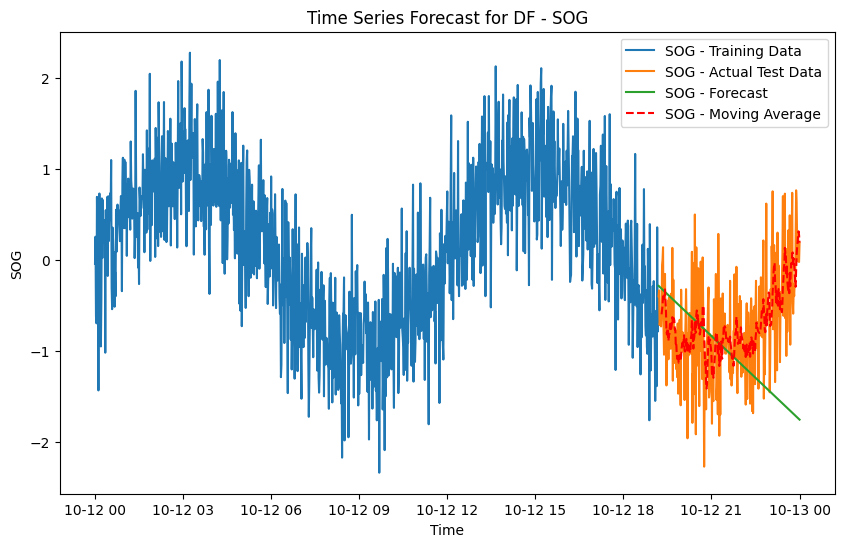

Mean Squared Error: 0.7560948131150866
Standard Deviation :  0.8115780615926135


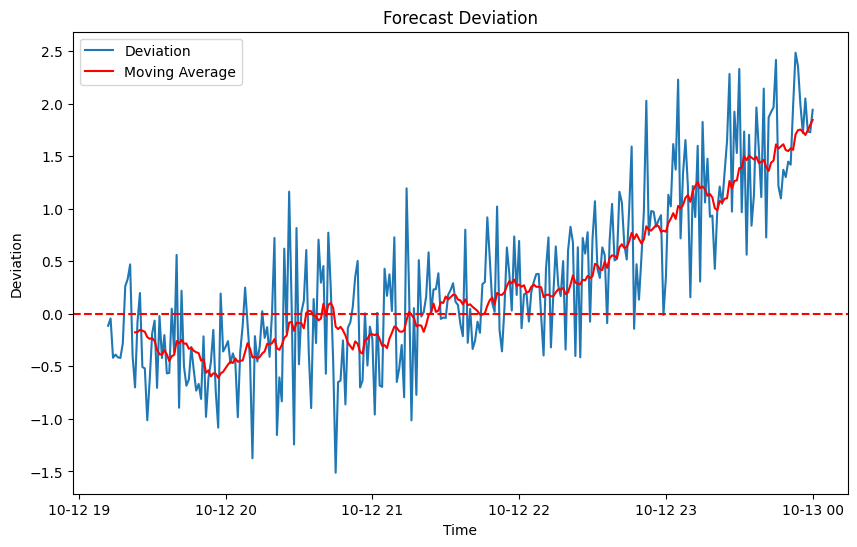


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 2
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/309008157.py:12: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:48:39 - cmdstanpy - INFO - Chain [1] start processing
19:48:39 - cmdstanpy - INFO - Chain [1] done processing


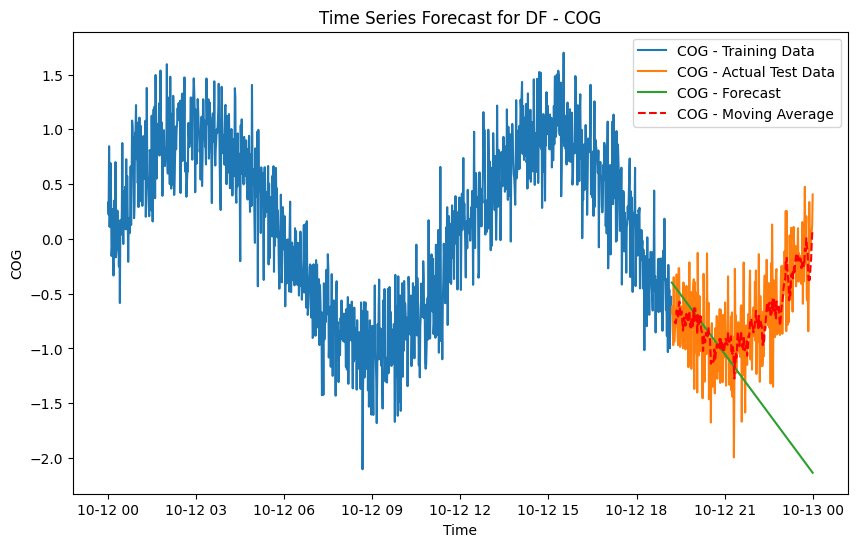

Mean Squared Error: 0.9380656722562962
Standard Deviation :  0.785377664533048


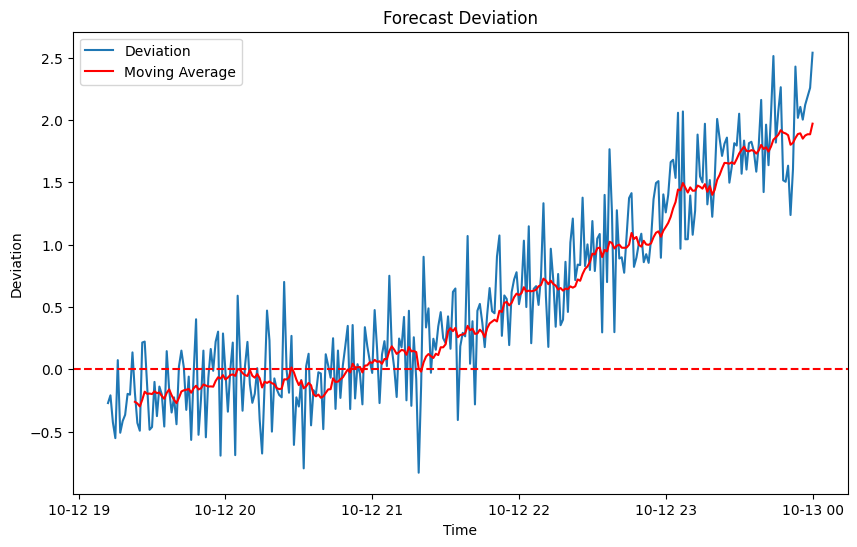


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 3
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/309008157.py:12: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:48:41 - cmdstanpy - INFO - Chain [1] start processing
19:48:41 - cmdstanpy - INFO - Chain [1] done processing


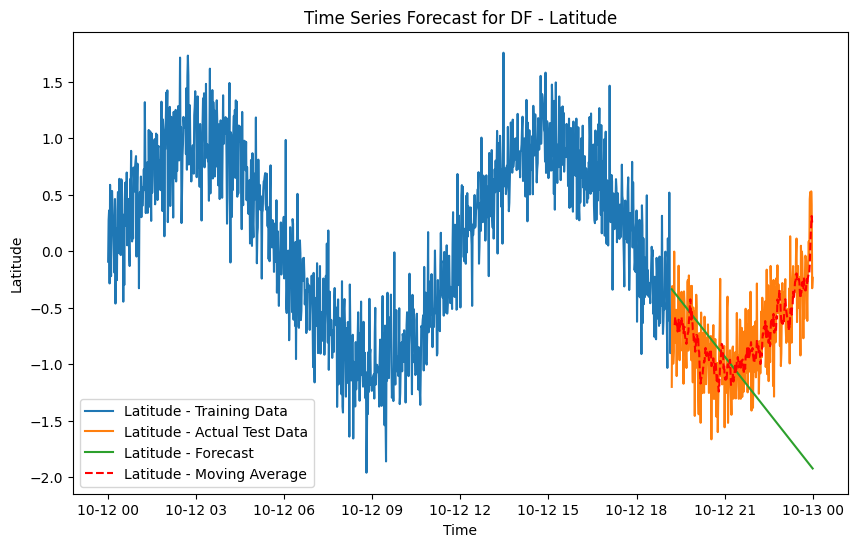

Mean Squared Error: 0.697195051609894
Standard Deviation :  0.7351461218402544


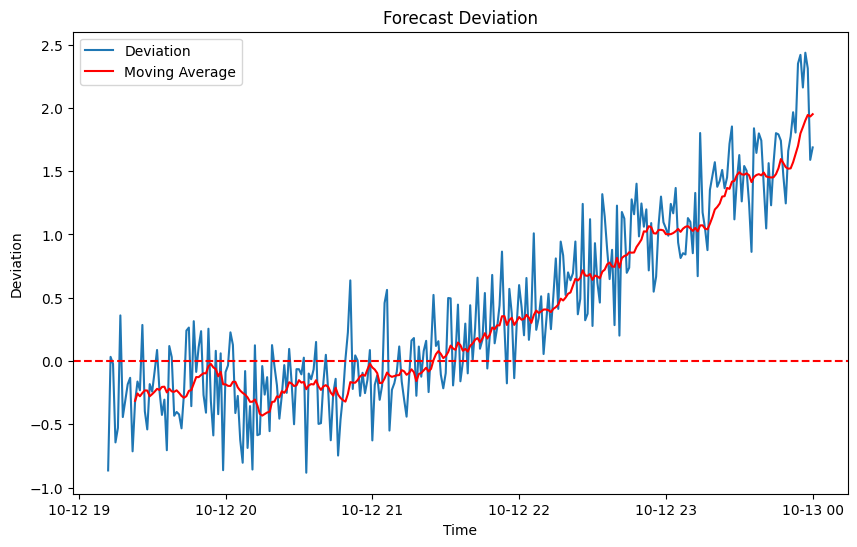


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 4
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/309008157.py:12: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:48:42 - cmdstanpy - INFO - Chain [1] start processing
19:48:42 - cmdstanpy - INFO - Chain [1] done processing


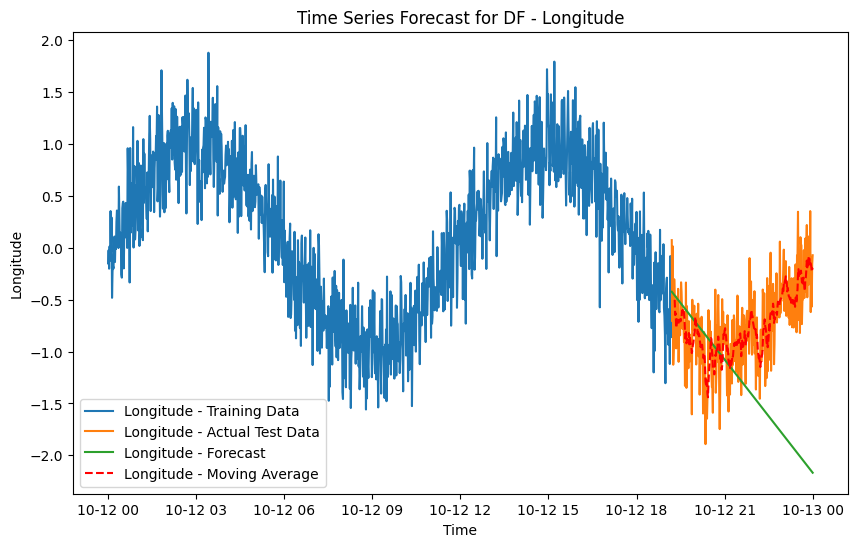

Mean Squared Error: 0.9022783279542168
Standard Deviation :  0.7745588813866776


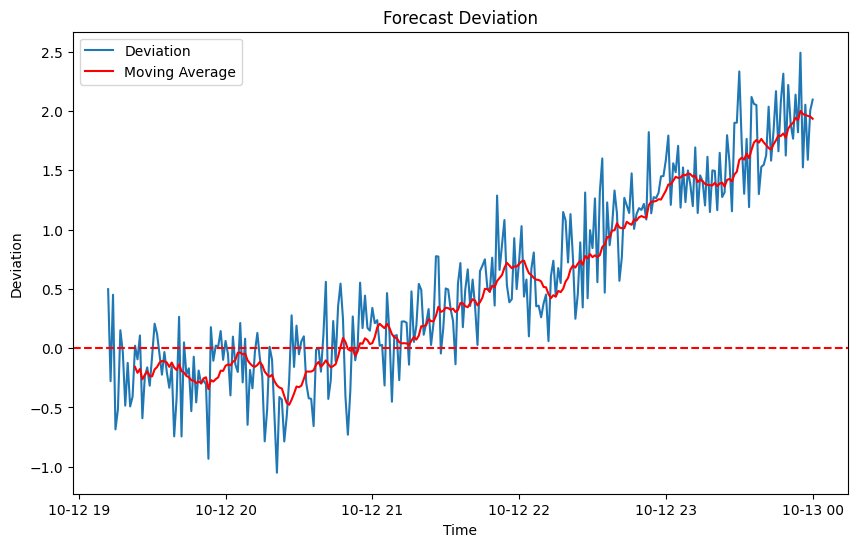


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 5
Exiting the program. Goodbye!


In [179]:
df_all_time_series_data = pd.DataFrame()
combined_data10 = pd.DataFrame()

while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-4): ")

    if choice == '5':
        print("Exiting the program. Goodbye!")
        break
    elif choice in ['1', '2', '3','4']:
        try:
            mmsi = input("Enter MMSI: ")  # Get the MMSI from the user
            df10_subset = df10[df10['MMSI'] == int(mmsi)]  # Subset the dataset based on the given MMSI
        except ValueError:
            print("Invalid input. Please enter a valid integer for the interval.")
            continue

        if choice == '1':
            columns = ['SOG']
            noise_levels = [0.5]
        elif choice =='2':
            columns=['COG']
            noise_levels=[0.3]
        elif choice == '3':
            columns = ['Latitude']
            noise_levels = [0.3]
        elif choice == '4':
            columns = ['Longitude']
            noise_levels = [0.3]
    else:
        print("Invalid choice. Please enter a number from 1 to 4.")
        continue
    
    time_series_data10 = create_time_series10(start_date='2023-10-12', end_date='2023-10-13',df10=df10_subset, interval_minutes=1, columns=columns, noise_levels=noise_levels)
    
    # Append to the DataFrame
    #df_all_time_series_data = pd.concat([df_all_time_series_data,time_series_data])
    combined_data10 = pd.concat([combined_data10, time_series_data10[columns]], axis=1)

    
    # Split data into training and testing sets (80% training, 20% testing)
    train_data, test_data = train_test_split(time_series_data10, test_size=0.2, shuffle=False)

    # Rename columns to 'ds' and 'y' for Prophet
    train_data.rename(columns={columns[0]: 'y'}, inplace=True)
    test_data.rename(columns={columns[0]: 'y'}, inplace=True)

    # Convert 'ds' column to datetime format
    train_data['ds'] = pd.to_datetime(train_data['ds'])
    test_data['ds'] = pd.to_datetime(test_data['ds'])

    # Train Prophet model
    prophet_model = Prophet()
    prophet_model.fit(train_data)
    
    #plot_prophet_loss(prophet_model)

    # Create a dataframe with future dates for prediction
    future = prophet_model.make_future_dataframe(periods=len(test_data), freq='1min')

    # Make predictions
    forecast = prophet_model.predict(future)

    # Plot the forecast and actual test data
    plot_prophet_forecast(train_data, test_data, forecast, columns)

    # Evaluate performance using mean squared error
    mse = mean_squared_error(test_data['y'], forecast[-len(test_data):]['yhat'])
    print(f'Mean Squared Error: {mse}')
    
    # Calculate deviation
    test_data['deviation'] = (test_data['y'] - forecast[-len(test_data):]['yhat'])
    
    # Calculate deviation percentage using stdev function
    sd = st.stdev(test_data['deviation']) 
    print("Standard Deviation : ", sd)
    
    # Calculate moving average
    window_size = 12  # You can adjust the window size as needed
    test_data['moving_average'] = test_data['deviation'].rolling(window=window_size).mean()
    
    # Visualize deviation
    plt.figure(figsize=(10, 6))
    plt.plot(test_data['ds'], test_data['deviation'], label='Deviation')
    plt.plot(test_data['ds'], test_data['moving_average'], color='red', label='Moving Average')
    plt.axhline(y=0, color='r', linestyle='--')
    plt.title('Forecast Deviation')
    plt.xlabel('Time')
    plt.ylabel('Deviation')
    plt.legend()
    plt.show()
    
    
    
    
    #220068000
    

In [180]:
combined_data10

,SOG,COG,Latitude,Longitude
0,-0.044359,0.331675,-0.092927,-0.149824
1,0.253411,0.222628,0.275658,-0.023223
2,-0.621314,0.846478,0.360703,-0.200875
3,-0.698719,0.110080,-0.285615,0.013864
4,0.691015,0.304485,0.587208,-0.122956
...,...,...,...,...
1436,-0.017077,-0.107388,0.260341,-0.619117
1437,0.307251,0.006151,0.529542,-0.096519
1438,-0.011604,0.069564,0.399881,-0.567339
1439,-0.024520,0.129848,-0.327911,-0.158179


In [181]:
df1_11 =pd.concat([df1_10,combined_data10],axis=0)

In [182]:
df1_11

,SOG,COG,Latitude,Longitude
0,0.323357,-0.155061,-0.016830,-0.179949
1,0.315885,-0.581238,-0.556230,-0.385583
2,0.914108,0.344985,-0.103316,0.119060
3,-0.434664,0.658695,0.116240,0.157335
4,-0.594001,-0.245701,0.234424,0.282610
...,...,...,...,...
1436,-0.017077,-0.107388,0.260341,-0.619117
1437,0.307251,0.006151,0.529542,-0.096519
1438,-0.011604,0.069564,0.399881,-0.567339
1439,-0.024520,0.129848,-0.327911,-0.158179


## Training and Testing


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 1


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2256158763.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:48:44 - cmdstanpy - INFO - Chain [1] start processing
19:48:44 - cmdstanpy - INFO - Chain [1] done processing


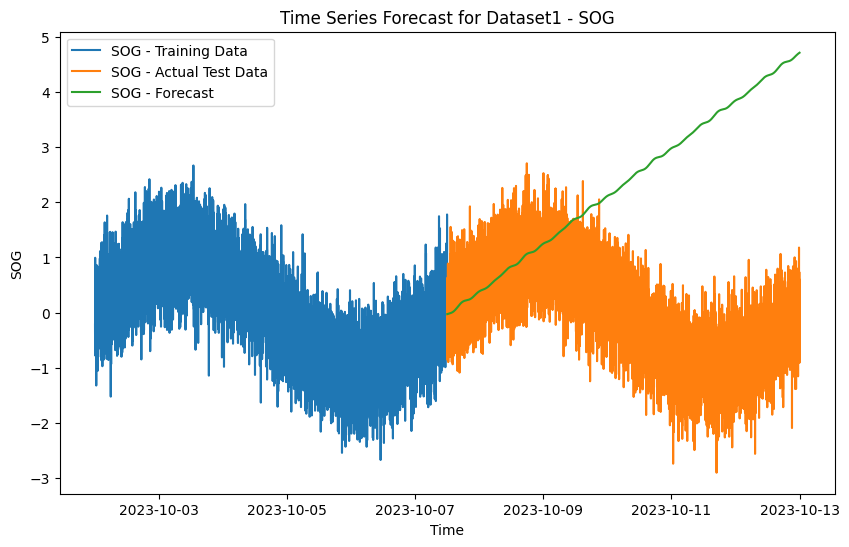

Mean Squared Error: 9.588289297047378
Standard Deviation :  2.037033775401429


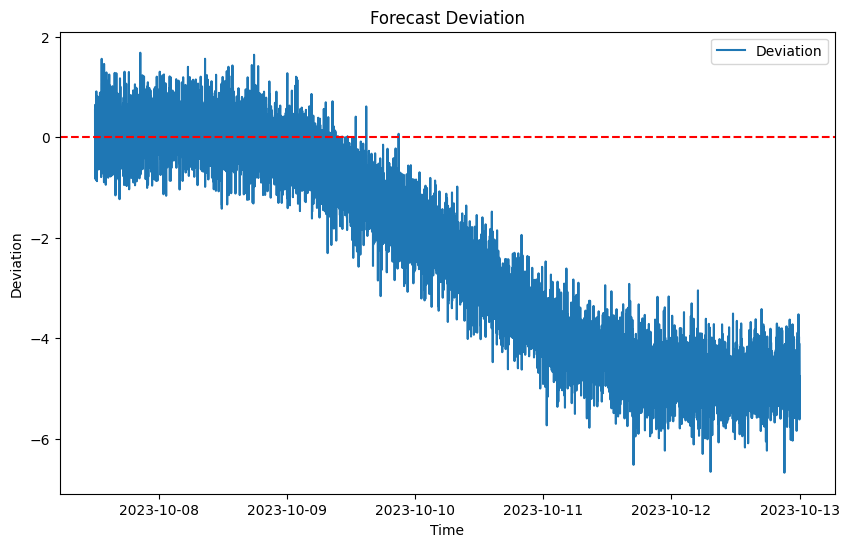


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 2


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2256158763.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:48:47 - cmdstanpy - INFO - Chain [1] start processing
19:48:47 - cmdstanpy - INFO - Chain [1] done processing


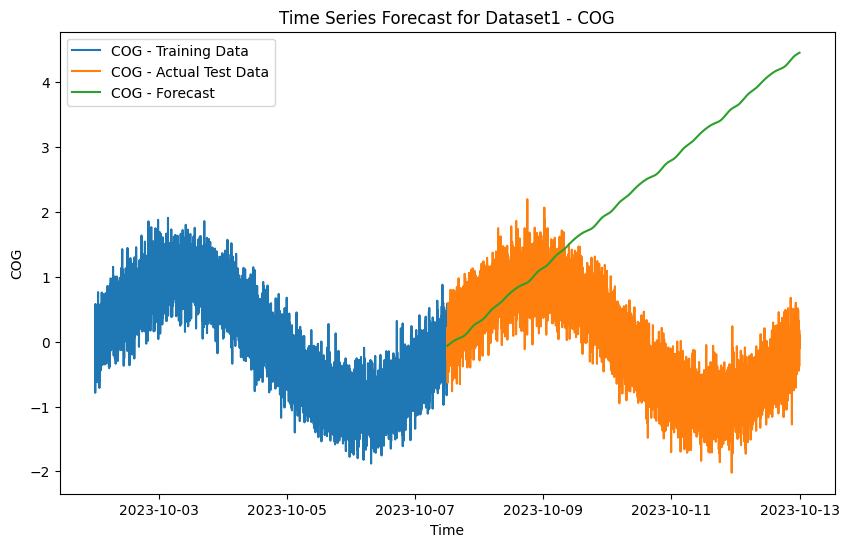

Mean Squared Error: 8.541138432795155
Standard Deviation :  1.9352695468902825


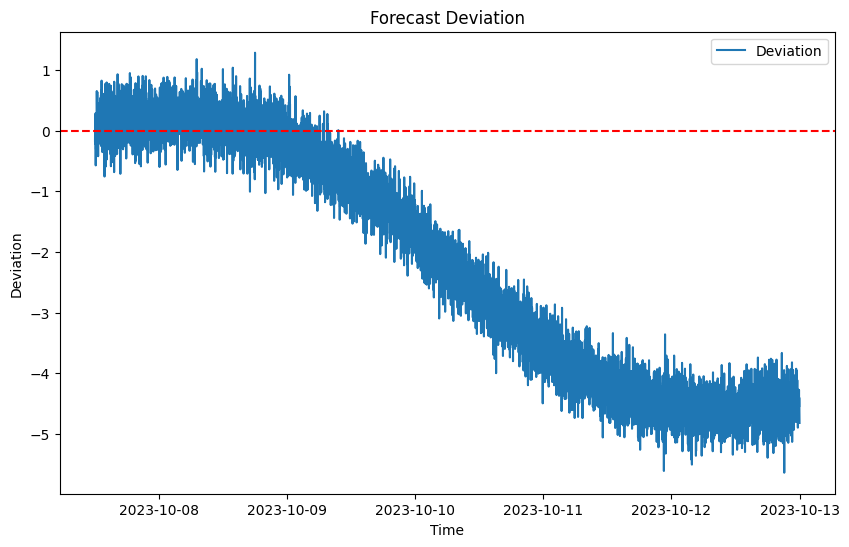


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 3


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2256158763.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:48:49 - cmdstanpy - INFO - Chain [1] start processing
19:48:50 - cmdstanpy - INFO - Chain [1] done processing


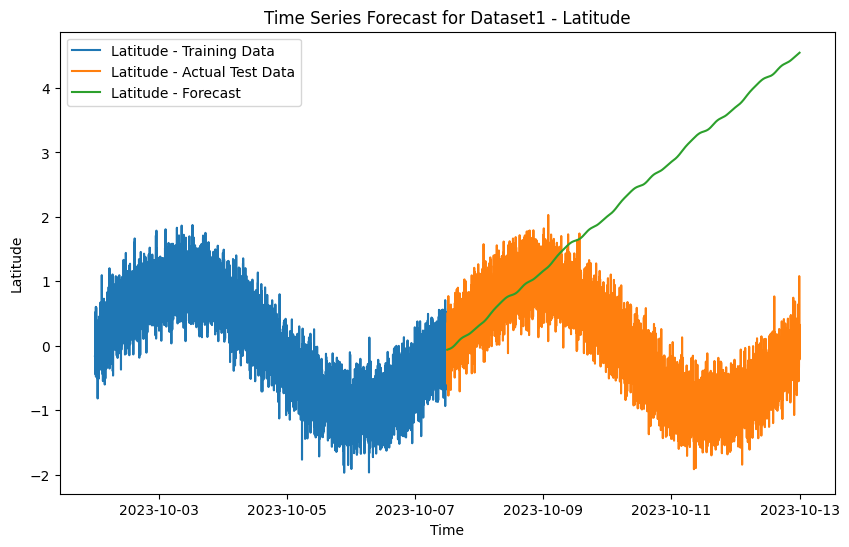

Mean Squared Error: 8.921368077520114
Standard Deviation :  1.9728863077522494


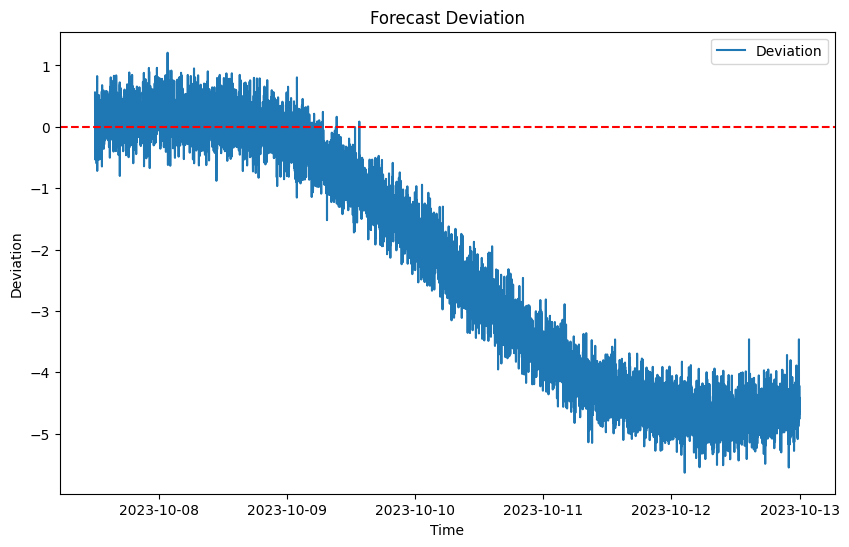


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 4


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2256158763.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:48:52 - cmdstanpy - INFO - Chain [1] start processing
19:48:53 - cmdstanpy - INFO - Chain [1] done processing


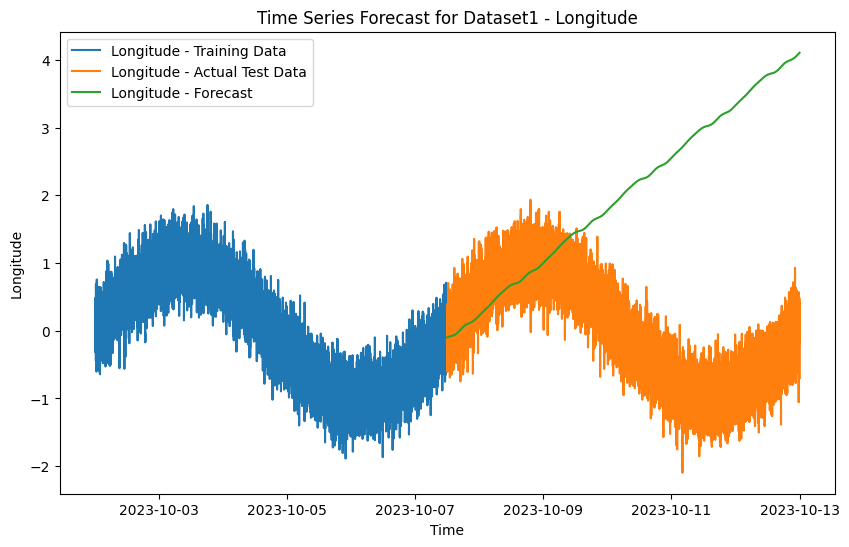

Mean Squared Error: 7.437303613751113
Standard Deviation :  1.8570054519604646


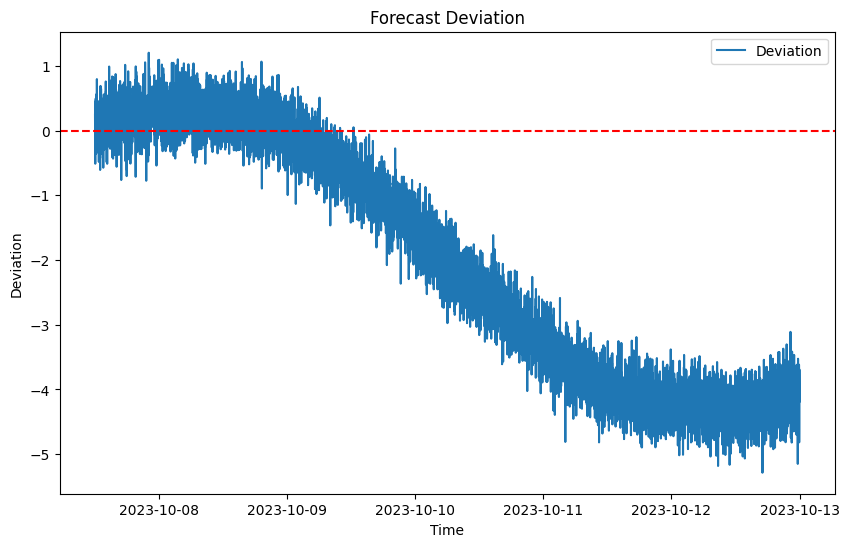


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 5
Exiting the program. Goodbye!


In [183]:
 def create_time_series1_11(start_date,end_date,df, interval_minutes, columns, noise_levels=None):
    # Generate datetime range with even intervals
    date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')

    # Create a DataFrame with datetime values
    new_df = pd.DataFrame(date_rng, columns=['ds'])

    # Generate time series values for each specified column
    for col, noise_level in zip(columns, noise_levels):
        if col.lower() == 'Latitude':
            new_df[col] = df[col]
        elif col.lower() == 'Longitude':
            new_df[col] = df[col]
        elif col.lower() =='SOG':
            new_df[col] =df[col]
        elif col.lower() =='COG':
            new_df[col] =df[col]    
        else:
            new_df[col] = np.sin(np.linspace(0, 4 * np.pi, len(new_df))) + np.random.normal(0, noise_level, len(new_df))

    return new_df

def plot_prophet_forecast1_11(train_data, test_data, forecast, columns):
    for col in columns:
        plt.figure(figsize=(10, 6))
        plt.plot(train_data['ds'], train_data['y'], label=f'{col} - Training Data')
        plt.plot(test_data['ds'], test_data['y'], label=f'{col} - Actual Test Data')
        plt.plot(test_data['ds'], forecast[-len(test_data):]['yhat'], label=f'{col} - Forecast')
        plt.title(f'Time Series Forecast for Dataset1 - {col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()
        
## PRACTCIE


while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-4): ")

    if choice == '5':
        print("Exiting the program. Goodbye!")
        break
    elif choice in ['1', '2', '3','4']:
        if choice == '1':
            columns = ['SOG']
            noise_levels = [0.5]
        elif choice =='2':
            columns=['COG']
            noise_levels=[0.3]
        elif choice == '3':
            columns = ['Latitude']
            noise_levels = [0.3]
        elif choice == '4':
            columns = ['Longitude']
            noise_levels = [0.3]
    else:
        print("Invalid choice. Please enter a number from 1 to 4.")
        continue
        
     # First, you need to create the training and testing datasets separately
    # Let's assume your first dataset is stored in df and the second dataset is stored in df1
    time_series_data1_11 = create_time_series1_11(start_date='2023-10-02', end_date='2023-10-13', df=df1_11, interval_minutes=1, columns=columns, noise_levels=noise_levels)
        
    
    train_data, test_data = train_test_split(time_series_data1_11, test_size=0.5, shuffle=False)

    
    # Rename columns to 'ds' and 'y' for Prophet

    train_data.rename(columns={columns[0]: 'y'}, inplace=True)
    test_data.rename(columns={columns[0]: 'y'}, inplace=True)
    
    # Convert 'ds' column to datetime format
    train_data['ds'] = pd.to_datetime(train_data['ds'])
    test_data['ds'] = pd.to_datetime(test_data['ds'])

    # Train Prophet model
    prophet_model = Prophet()
    prophet_model.fit(train_data)

    # Create a dataframe with future dates for prediction
    future = prophet_model.make_future_dataframe(periods=len(test_data), freq='1min')

    # Make predictions
    forecast = prophet_model.predict(future)

    # Plot the forecast and actual test data
    plot_prophet_forecast12(train_data, test_data, forecast, columns)

    # Evaluate performance using mean squared error
    mse = mean_squared_error(test_data['y'], forecast[-len(test_data):]['yhat'])
    print(f'Mean Squared Error: {mse}')

    # Calculate deviation
    test_data['deviation'] = test_data['y'] - forecast[-len(test_data):]['yhat']
    
    # Calculate deviation percentage using stdev function
    sd = np.std(test_data['deviation']) 
    print("Standard Deviation : ", sd)
    
    # Calculate standard deviation percentage
    
    # Visualize deviation
    plt.figure(figsize=(10, 6))
    plt.plot(test_data['ds'], test_data['deviation'], label='Deviation')
    plt.axhline(y=0, color='r', linestyle='--')
    plt.title('Forecast Deviation')
    plt.xlabel('Time')
    plt.ylabel('Deviation')
    plt.legend()
    plt.show()
   
    

## Dataset 12

In [184]:
def create_time_series11(start_date, end_date, df11, interval_minutes, columns, noise_levels=None):

    # Set the 'Timestamp' column as the index
    df11.set_index('# Timestamp', inplace=True)

    # Resample the DataFrame to get one data point per minute
    resampled_df11 = df11.resample(f'{interval_minutes}1min').first().reset_index()
    
    resampled_df11 = df11.groupby([pd.Grouper(freq=f'{interval_minutes}1min'), 'MMSI']).min().reset_index()
    
    # Generate datetime range with even intervals
    date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')

    # Create a DataFrame with datetime values
    new_df = pd.DataFrame(date_rng, columns=['ds'])

    # Merge resampled data with the new DataFrame on the 'ds' column
    new_df = pd.merge(new_df, resampled_df11, how='left', left_on='ds', right_on='# Timestamp')

    # Drop the redundant '# Timestamp' column
    new_df.drop('# Timestamp', axis=1, inplace=True)

    # Generate time series values for each specified column
    for col, noise_level in zip(columns, noise_levels):
        if col.lower() == 'Latitude':
            new_df[col] = df[col]
        elif col.lower() == 'Longitude':
            new_df[col] = df[col]
        elif col.lower() =='SOG':
            new_df[col] =df[col]
        elif col.lower() =='COG':
            new_df[col] =df[col]    
        else:
            new_df[col] = np.sin(np.linspace(0, 4 * np.pi, len(new_df))) + np.random.normal(0, noise_level, len(new_df))

    return new_df



In [185]:
def plot_time_series11(df11, columns, window=7):
    for col in columns:
        # Calculate moving average
        df11['Moving Average'] = df11[col].rolling(window=window).mean()
        
        plt.figure(figsize=(10, 6))
        plt.plot(df11['ds'], df11[col], label=col)
        plt.plot(df11['ds'], df11['Moving Average'], label=f'{col} - Moving Average', linestyle='--', color='red')
        plt.title(f'Time Series Plot for Dataset df - {col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()

## Menu-driven code
mmsi = input("Enter MMSI: ")  # Get the MMSI from the user
while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG ")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-5): ")
    
    if choice in ['1', '2', '3', '4']:
        #mmsi = input("Enter MMSI: ")  # Get the MMSI from the user
        df11_subset = df11[df11['MMSI'] == int(mmsi)]  # Subset the dataset based on the given MMSI
        columns = ['SOG'] if choice == '1' else ['COG'] if choice == '2' else ['Latitude'] if choice == '3' else ['Longitude']
        noise_levels = [0.5] if choice == '1' else [0.3]  # Adjust noise levels as needed

        time_series_data11 = create_time_series11(start_date='2022-10-13',end_date='2022-10-14',df11=df11_subset, interval_minutes=1, columns=columns, noise_levels=noise_levels)
        plot_time_series11(time_series_data11, columns)
    elif choice == '5':
        print("Exiting the program. Goodbye!")
        break
    else:
        print("Invalid choice. Please enter a number from 1 to 5.")


In [186]:
def plot_prophet_forecast11(train_data, test_data, forecast, columns, window=7):
    for col in columns:
        # Compute moving average
        test_data['Moving Average'] = test_data['y'].rolling(window=window).mean()
        
        plt.figure(figsize=(10, 6))
        plt.plot(train_data['ds'], train_data['y'], label=f'{col} - Training Data')
        plt.plot(test_data['ds'], test_data['y'], label=f'{col} - Actual Test Data')
        plt.plot(test_data['ds'], forecast[-len(test_data):]['yhat'], label=f'{col} - Forecast')
        plt.plot(test_data['ds'], test_data['Moving Average'], label=f'{col} - Moving Average', linestyle='--', color='red')
        plt.title(f'Time Series Forecast for DF - {col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()



Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 1
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2656415255.py:12: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:48:59 - cmdstanpy - INFO - Chain [1] start processing
19:48:59 - cmdstanpy - INFO - Chain [1] done processing


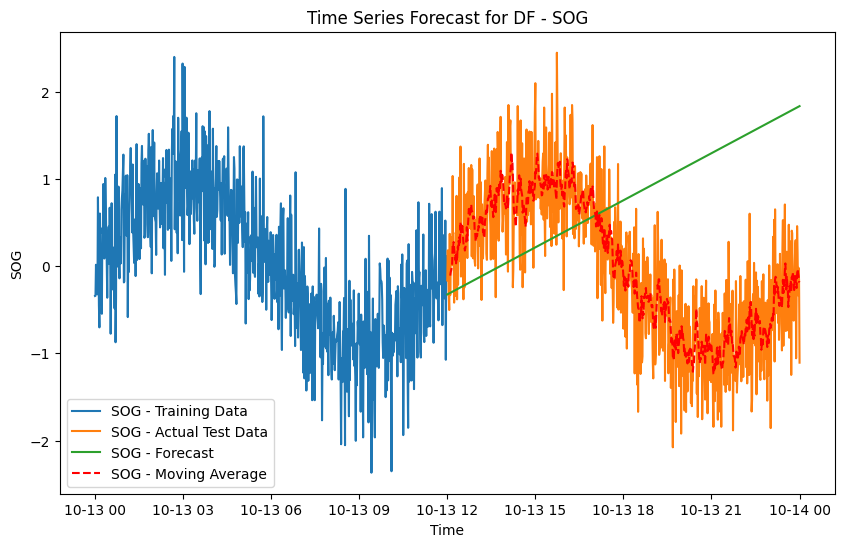

Mean Squared Error: 2.370004929281056
Standard Deviation :  1.3447283112754844


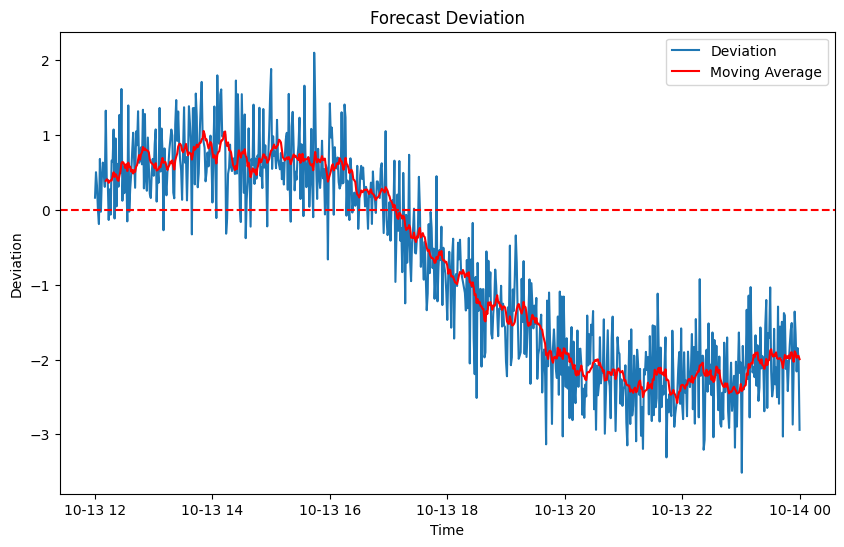


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 2
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2656415255.py:12: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:49:00 - cmdstanpy - INFO - Chain [1] start processing
19:49:00 - cmdstanpy - INFO - Chain [1] done processing


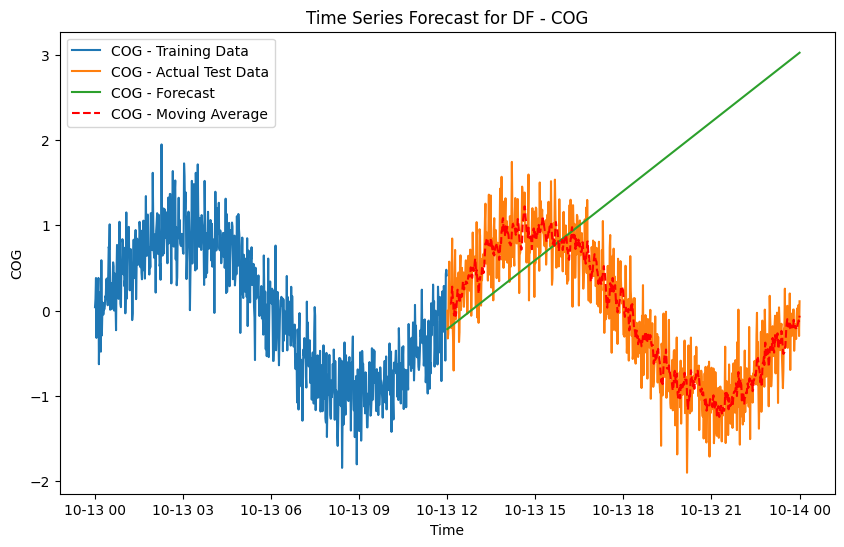

Mean Squared Error: 4.544909297692084
Standard Deviation :  1.5893777157648918


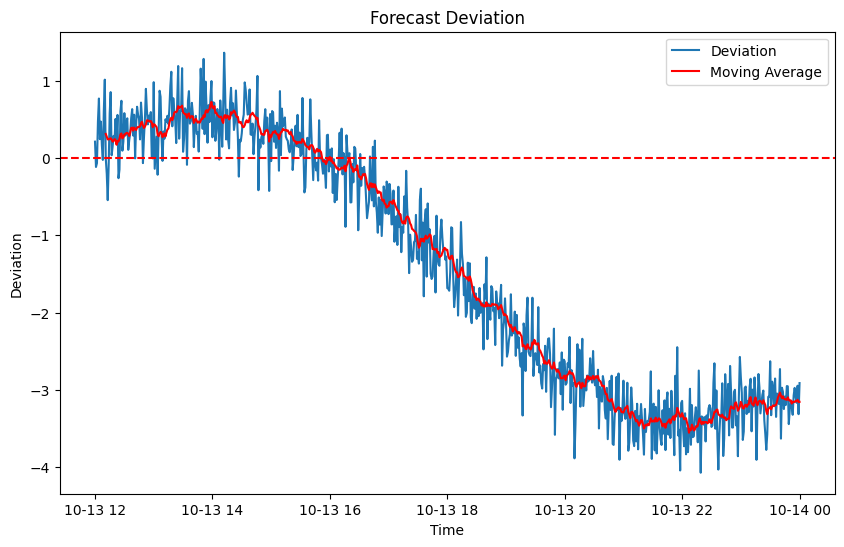


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 3
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2656415255.py:12: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:49:02 - cmdstanpy - INFO - Chain [1] start processing
19:49:02 - cmdstanpy - INFO - Chain [1] done processing


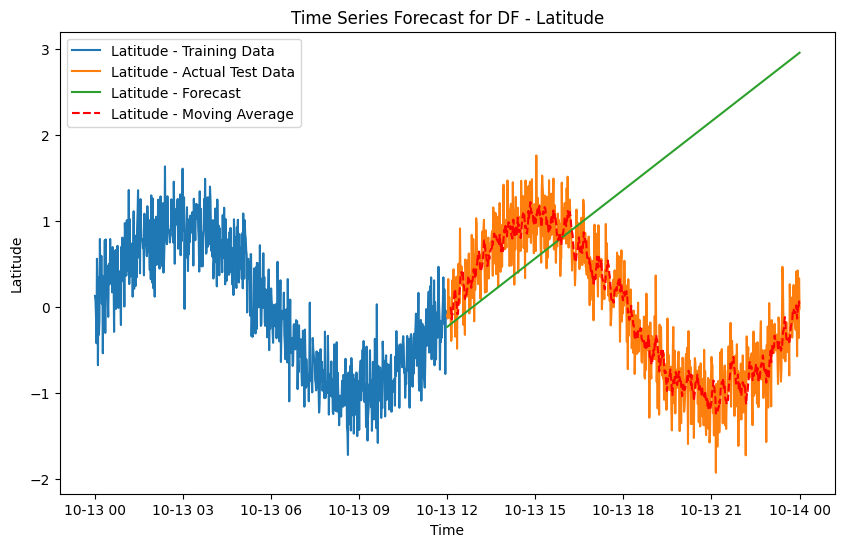

Mean Squared Error: 4.36777678110363
Standard Deviation :  1.5765567793459418


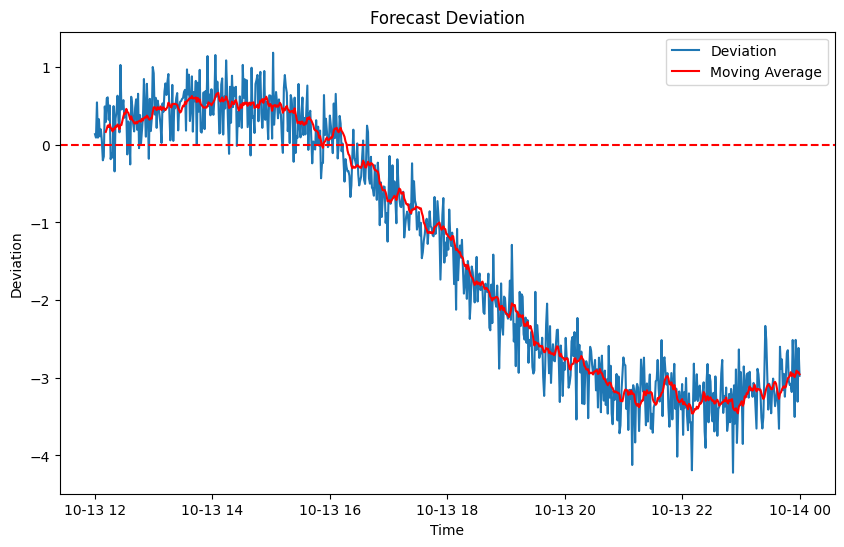


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 4
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2656415255.py:12: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:49:03 - cmdstanpy - INFO - Chain [1] start processing
19:49:03 - cmdstanpy - INFO - Chain [1] done processing


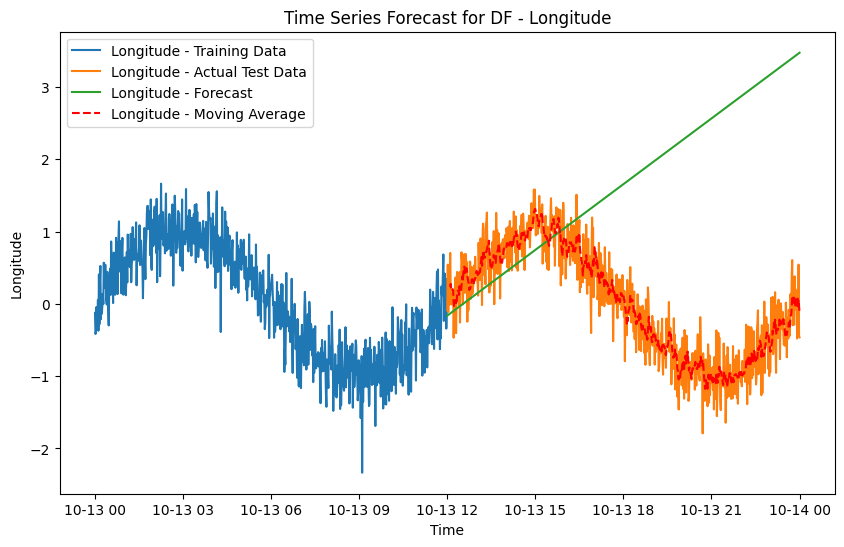

Mean Squared Error: 5.5606451258418685
Standard Deviation :  1.68423915623651


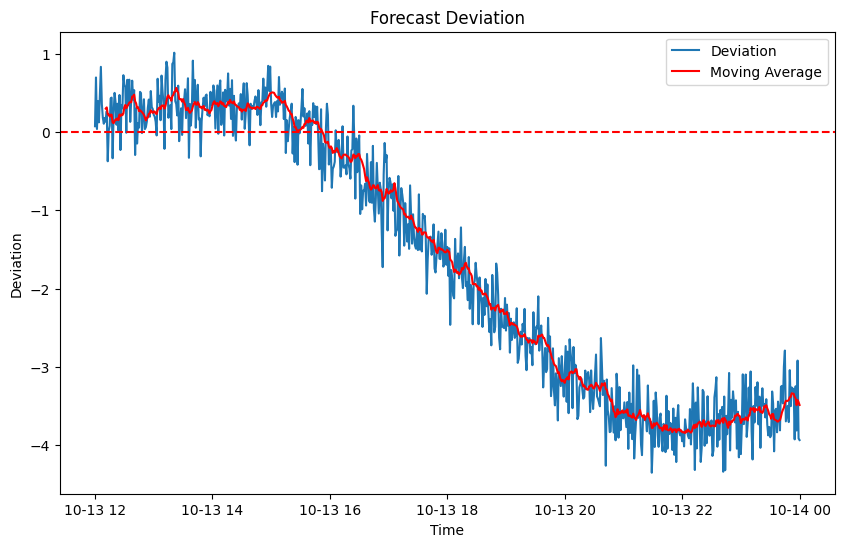


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 5
Exiting the program. Goodbye!


In [187]:
#df_all_time_series_data = pd.DataFrame()
combined_data11 = pd.DataFrame()

while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-4): ")

    if choice == '5':
        print("Exiting the program. Goodbye!")
        break
    elif choice in ['1', '2', '3','4']:
        try:
            mmsi = input("Enter MMSI: ")  # Get the MMSI from the user
            df11_subset = df11[df11['MMSI'] == int(mmsi)]  # Subset the dataset based on the given MMSI
        except ValueError:
            print("Invalid input. Please enter a valid integer for the interval.")
            continue

        if choice == '1':
            columns = ['SOG']
            noise_levels = [0.5]
        elif choice =='2':
            columns=['COG']
            noise_levels=[0.3]
        elif choice == '3':
            columns = ['Latitude']
            noise_levels = [0.3]
        elif choice == '4':
            columns = ['Longitude']
            noise_levels = [0.3]
    else:
        print("Invalid choice. Please enter a number from 1 to 4.")
        continue
    
    time_series_data11 = create_time_series11(start_date='2023-10-13', end_date='2023-10-14',df11=df11_subset, interval_minutes=1, columns=columns, noise_levels=noise_levels)
    
    # Append to the DataFrame
    #df_all_time_series_data = pd.concat([df_all_time_series_data,time_series_data])
    combined_data11 = pd.concat([combined_data11, time_series_data11[columns]], axis=1)

    
    # Split data into training and testing sets (80% training, 20% testing)
    train_data, test_data = train_test_split(time_series_data11, test_size=0.5, shuffle=False)

    # Rename columns to 'ds' and 'y' for Prophet
    train_data.rename(columns={columns[0]: 'y'}, inplace=True)
    test_data.rename(columns={columns[0]: 'y'}, inplace=True)

    # Convert 'ds' column to datetime format
    train_data['ds'] = pd.to_datetime(train_data['ds'])
    test_data['ds'] = pd.to_datetime(test_data['ds'])

    # Train Prophet model
    prophet_model = Prophet()
    prophet_model.fit(train_data)
    
    #plot_prophet_loss(prophet_model)

    # Create a dataframe with future dates for prediction
    future = prophet_model.make_future_dataframe(periods=len(test_data), freq='1min')

    # Make predictions
    forecast = prophet_model.predict(future)

    # Plot the forecast and actual test data
    plot_prophet_forecast(train_data, test_data, forecast, columns)

    # Evaluate performance using mean squared error
    mse = mean_squared_error(test_data['y'], forecast[-len(test_data):]['yhat'])
    print(f'Mean Squared Error: {mse}')
    
    # Calculate deviation
    test_data['deviation'] = (test_data['y'] - forecast[-len(test_data):]['yhat'])
    
    # Calculate deviation percentage using stdev function
    sd = st.stdev(test_data['deviation']) 
    print("Standard Deviation : ", sd)
    
    # Calculate moving average
    window_size = 12  # You can adjust the window size as needed
    test_data['moving_average'] = test_data['deviation'].rolling(window=window_size).mean()
    
    # Visualize deviation
    plt.figure(figsize=(10, 6))
    plt.plot(test_data['ds'], test_data['deviation'], label='Deviation')
    plt.plot(test_data['ds'], test_data['moving_average'], color='red', label='Moving Average')
    plt.axhline(y=0, color='r', linestyle='--')
    plt.title('Forecast Deviation')
    plt.xlabel('Time')
    plt.ylabel('Deviation')
    plt.legend()
    plt.show()
    
    
    
    
    #220068000
    

In [188]:
combined_data11

,SOG,COG,Latitude,Longitude
0,-0.342615,0.039083,0.131233,-0.124215
1,-0.340106,0.135027,0.078673,-0.415734
2,0.015336,0.381443,-0.098855,-0.383913
3,-0.189139,-0.320549,-0.418383,-0.042429
4,-0.017792,0.326914,0.562822,-0.179562
...,...,...,...,...
1436,0.153905,-0.088515,0.426889,0.205277
1437,-0.335702,-0.160452,0.256893,-0.355847
1438,-0.020055,0.065589,-0.359763,0.543933
1439,-0.165332,-0.298649,0.335545,-0.447273


In [189]:
df1_12 =pd.concat([df1_11,combined_data11],axis=0)

In [190]:
df1_12

,SOG,COG,Latitude,Longitude
0,0.323357,-0.155061,-0.016830,-0.179949
1,0.315885,-0.581238,-0.556230,-0.385583
2,0.914108,0.344985,-0.103316,0.119060
3,-0.434664,0.658695,0.116240,0.157335
4,-0.594001,-0.245701,0.234424,0.282610
...,...,...,...,...
1436,0.153905,-0.088515,0.426889,0.205277
1437,-0.335702,-0.160452,0.256893,-0.355847
1438,-0.020055,0.065589,-0.359763,0.543933
1439,-0.165332,-0.298649,0.335545,-0.447273


## TRAINING AND TESTING


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 1


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2673157041.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:49:05 - cmdstanpy - INFO - Chain [1] start processing
19:49:05 - cmdstanpy - INFO - Chain [1] done processing


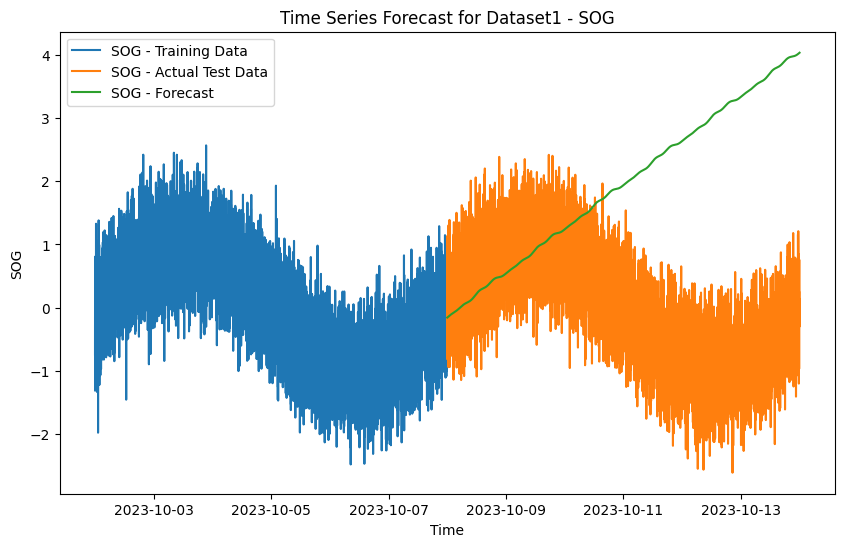

Mean Squared Error: 7.345611580387362
Standard Deviation :  1.8851062051291045


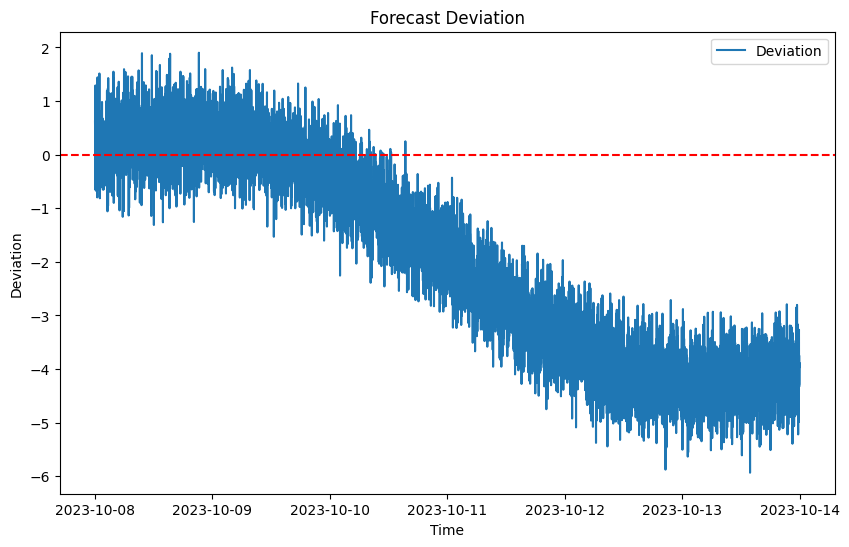


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 2


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2673157041.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:49:08 - cmdstanpy - INFO - Chain [1] start processing
19:49:09 - cmdstanpy - INFO - Chain [1] done processing


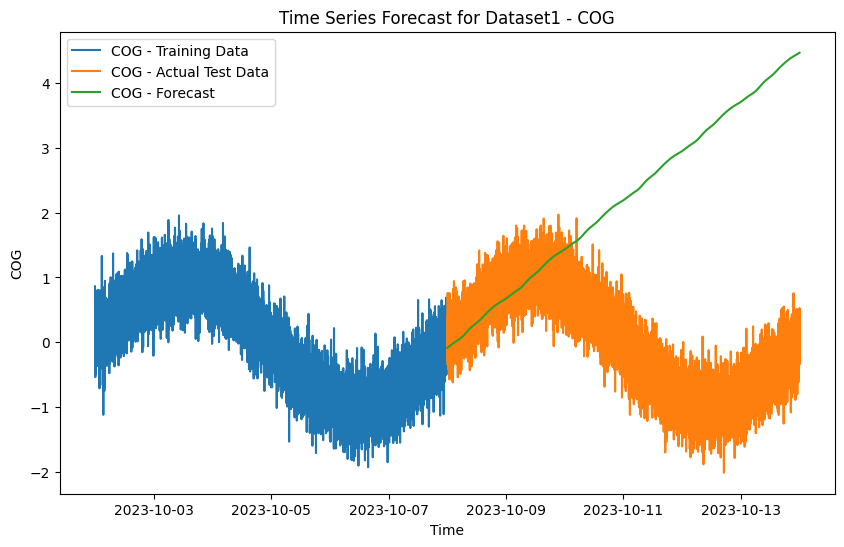

Mean Squared Error: 8.606434136635416
Standard Deviation :  1.9410537114601019


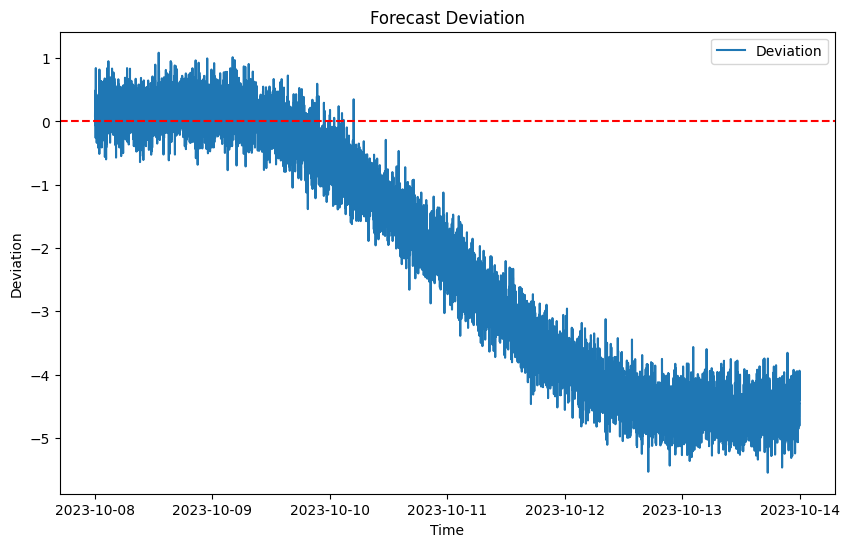


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 3


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2673157041.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:49:11 - cmdstanpy - INFO - Chain [1] start processing
19:49:12 - cmdstanpy - INFO - Chain [1] done processing


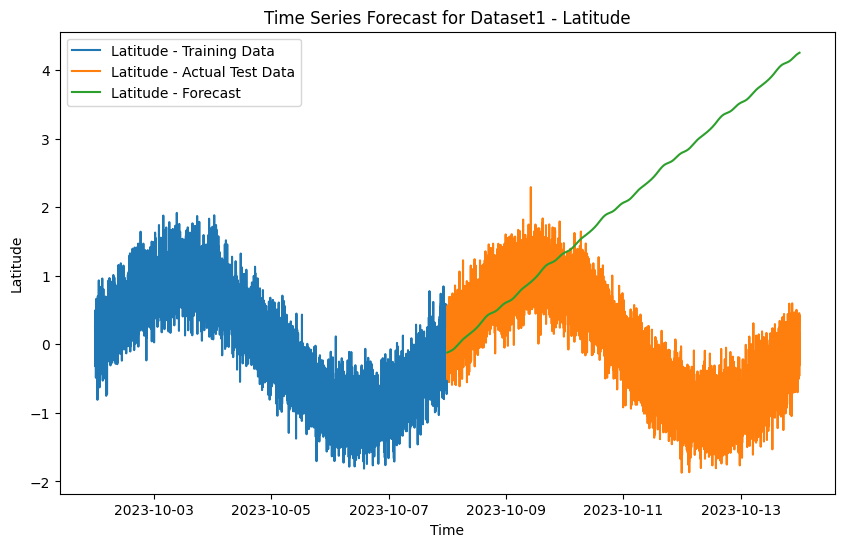

Mean Squared Error: 7.879064644323932
Standard Deviation :  1.8921938701722498


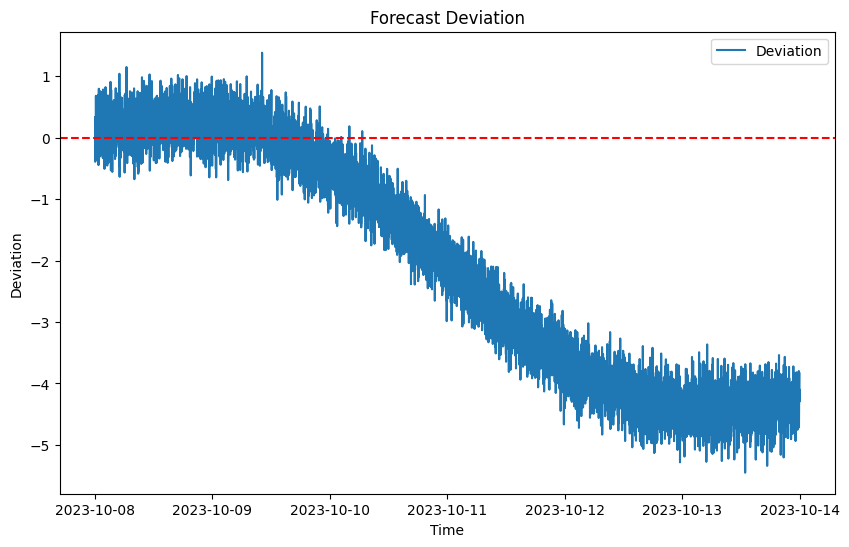


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 4


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2673157041.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:49:14 - cmdstanpy - INFO - Chain [1] start processing
19:49:15 - cmdstanpy - INFO - Chain [1] done processing


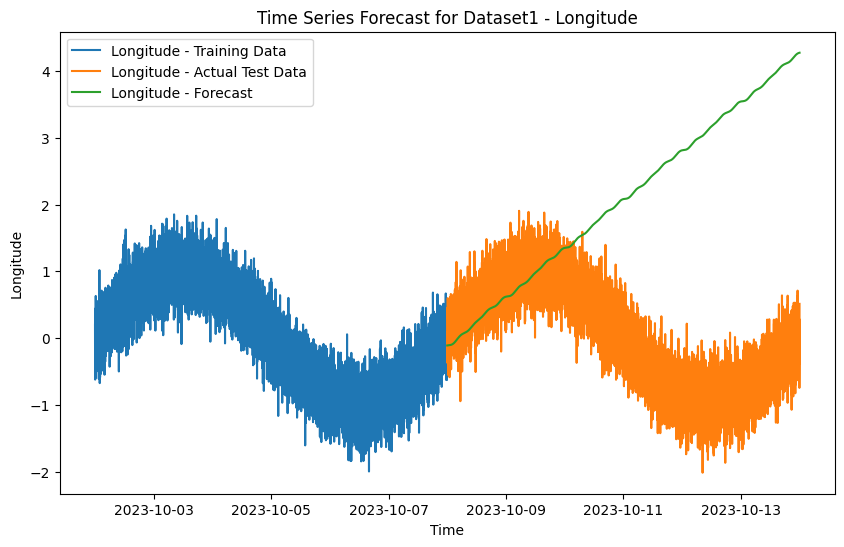

Mean Squared Error: 7.889631763240327
Standard Deviation :  1.896098854711751


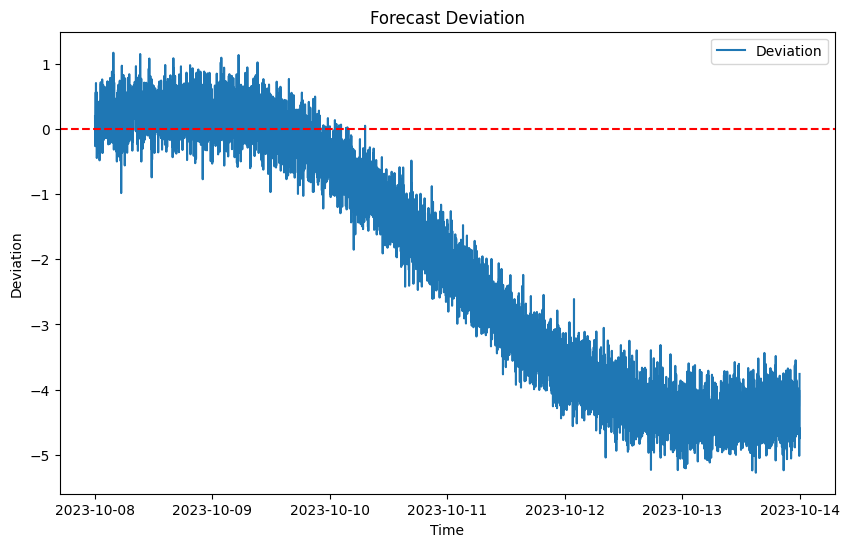


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 5
Exiting the program. Goodbye!


In [191]:
 def create_time_series1_12(start_date,end_date,df, interval_minutes, columns, noise_levels=None):
    # Generate datetime range with even intervals
    date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')

    # Create a DataFrame with datetime values
    new_df = pd.DataFrame(date_rng, columns=['ds'])

    # Generate time series values for each specified column
    for col, noise_level in zip(columns, noise_levels):
        if col.lower() == 'Latitude':
            new_df[col] = df[col]
        elif col.lower() == 'Longitude':
            new_df[col] = df[col]
        elif col.lower() =='SOG':
            new_df[col] =df[col]
        elif col.lower() =='COG':
            new_df[col] =df[col]    
        else:
            new_df[col] = np.sin(np.linspace(0, 4 * np.pi, len(new_df))) + np.random.normal(0, noise_level, len(new_df))

    return new_df

def plot_prophet_forecast1_12(train_data, test_data, forecast, columns):
    for col in columns:
        plt.figure(figsize=(10, 6))
        plt.plot(train_data['ds'], train_data['y'], label=f'{col} - Training Data')
        plt.plot(test_data['ds'], test_data['y'], label=f'{col} - Actual Test Data')
        plt.plot(test_data['ds'], forecast[-len(test_data):]['yhat'], label=f'{col} - Forecast')
        plt.title(f'Time Series Forecast for Dataset1 - {col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()
        
## PRACTCIE


while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-4): ")

    if choice == '5':
        print("Exiting the program. Goodbye!")
        break
    elif choice in ['1', '2', '3','4']:
        if choice == '1':
            columns = ['SOG']
            noise_levels = [0.5]
        elif choice =='2':
            columns=['COG']
            noise_levels=[0.3]
        elif choice == '3':
            columns = ['Latitude']
            noise_levels = [0.3]
        elif choice == '4':
            columns = ['Longitude']
            noise_levels = [0.3]
    else:
        print("Invalid choice. Please enter a number from 1 to 4.")
        continue
        
     # First, you need to create the training and testing datasets separately
    # Let's assume your first dataset is stored in df and the second dataset is stored in df1
    time_series_data1_12 = create_time_series1_12(start_date='2023-10-02', end_date='2023-10-14', df=df1_12, interval_minutes=1, columns=columns, noise_levels=noise_levels)
        
    
    train_data, test_data = train_test_split(time_series_data1_12, test_size=0.5, shuffle=False)

    
    # Rename columns to 'ds' and 'y' for Prophet

    train_data.rename(columns={columns[0]: 'y'}, inplace=True)
    test_data.rename(columns={columns[0]: 'y'}, inplace=True)
    
    # Convert 'ds' column to datetime format
    train_data['ds'] = pd.to_datetime(train_data['ds'])
    test_data['ds'] = pd.to_datetime(test_data['ds'])

    # Train Prophet model
    prophet_model = Prophet()
    prophet_model.fit(train_data)

    # Create a dataframe with future dates for prediction
    future = prophet_model.make_future_dataframe(periods=len(test_data), freq='1min')

    # Make predictions
    forecast = prophet_model.predict(future)

    # Plot the forecast and actual test data
    plot_prophet_forecast12(train_data, test_data, forecast, columns)

    # Evaluate performance using mean squared error
    mse = mean_squared_error(test_data['y'], forecast[-len(test_data):]['yhat'])
    print(f'Mean Squared Error: {mse}')

    # Calculate deviation
    test_data['deviation'] = test_data['y'] - forecast[-len(test_data):]['yhat']
    
    # Calculate deviation percentage using stdev function
    sd = np.std(test_data['deviation']) 
    print("Standard Deviation : ", sd)
    
    # Calculate standard deviation percentage
    
    # Visualize deviation
    plt.figure(figsize=(10, 6))
    plt.plot(test_data['ds'], test_data['deviation'], label='Deviation')
    plt.axhline(y=0, color='r', linestyle='--')
    plt.title('Forecast Deviation')
    plt.xlabel('Time')
    plt.ylabel('Deviation')
    plt.legend()
    plt.show()
   
    

## DATASET 13

In [192]:
def create_time_series12(start_date, end_date, df12, interval_minutes, columns, noise_levels=None):

    # Set the 'Timestamp' column as the index
    df12.set_index('# Timestamp', inplace=True)

    # Resample the DataFrame to get one data point per minute
    resampled_df12 = df12.resample(f'{interval_minutes}1min').first().reset_index()
    
    resampled_df12 = df12.groupby([pd.Grouper(freq=f'{interval_minutes}1min'), 'MMSI']).min().reset_index()
    
    # Generate datetime range with even intervals
    date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')

    # Create a DataFrame with datetime values
    new_df = pd.DataFrame(date_rng, columns=['ds'])

    # Merge resampled data with the new DataFrame on the 'ds' column
    new_df = pd.merge(new_df, resampled_df12, how='left', left_on='ds', right_on='# Timestamp')

    # Drop the redundant '# Timestamp' column
    new_df.drop('# Timestamp', axis=1, inplace=True)

    # Generate time series values for each specified column
    for col, noise_level in zip(columns, noise_levels):
        if col.lower() == 'Latitude':
            new_df[col] = df[col]
        elif col.lower() == 'Longitude':
            new_df[col] = df[col]
        elif col.lower() =='SOG':
            new_df[col] =df[col]
        elif col.lower() =='COG':
            new_df[col] =df[col]    
        else:
            new_df[col] = np.sin(np.linspace(0, 4 * np.pi, len(new_df))) + np.random.normal(0, noise_level, len(new_df))

    return new_df



In [193]:
def plot_time_series12(df12, columns, window=7):
    for col in columns:
        # Calculate moving average
        df12['Moving Average'] = df12[col].rolling(window=window).mean()
        
        plt.figure(figsize=(10, 6))
        plt.plot(df12['ds'], df12[col], label=col)
        plt.plot(df12['ds'], df12['Moving Average'], label=f'{col} - Moving Average', linestyle='--', color='red')
        plt.title(f'Time Series Plot for Dataset df - {col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()

## Menu-driven code
mmsi = input("Enter MMSI: ")  # Get the MMSI from the user
while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG ")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-5): ")
    
    if choice in ['1', '2', '3', '4']:
        #mmsi = input("Enter MMSI: ")  # Get the MMSI from the user
        df12_subset = df12[df12['MMSI'] == int(mmsi)]  # Subset the dataset based on the given MMSI
        columns = ['SOG'] if choice == '1' else ['COG'] if choice == '2' else ['Latitude'] if choice == '3' else ['Longitude']
        noise_levels = [0.5] if choice == '1' else [0.3]  # Adjust noise levels as needed

        time_series_data12 = create_time_series12(start_date='2022-10-14',end_date='2022-10-15',df12=df12_subset, interval_minutes=1, columns=columns, noise_levels=noise_levels)
        plot_time_series12(time_series_data12, columns)
    elif choice == '5':
        print("Exiting the program. Goodbye!")
        break
    else:
        print("Invalid choice. Please enter a number from 1 to 5.")


In [194]:
def plot_prophet_forecast12(train_data, test_data, forecast, columns, window=7):
    for col in columns:
        # Compute moving average
        test_data['Moving Average'] = test_data['y'].rolling(window=window).mean()
        
        plt.figure(figsize=(10, 6))
        plt.plot(train_data['ds'], train_data['y'], label=f'{col} - Training Data')
        plt.plot(test_data['ds'], test_data['y'], label=f'{col} - Actual Test Data')
        plt.plot(test_data['ds'], forecast[-len(test_data):]['yhat'], label=f'{col} - Forecast')
        plt.plot(test_data['ds'], test_data['Moving Average'], label=f'{col} - Moving Average', linestyle='--', color='red')
        plt.title(f'Time Series Forecast for DF - {col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()



Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 1
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2132413070.py:12: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:49:21 - cmdstanpy - INFO - Chain [1] start processing
19:49:21 - cmdstanpy - INFO - Chain [1] done processing


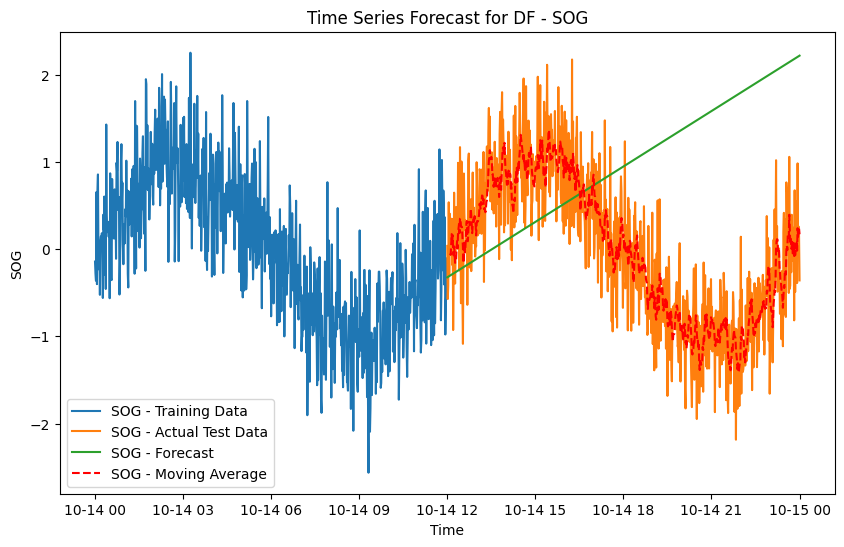

Mean Squared Error: 3.0316197925953117
Standard Deviation :  1.4510995704042817


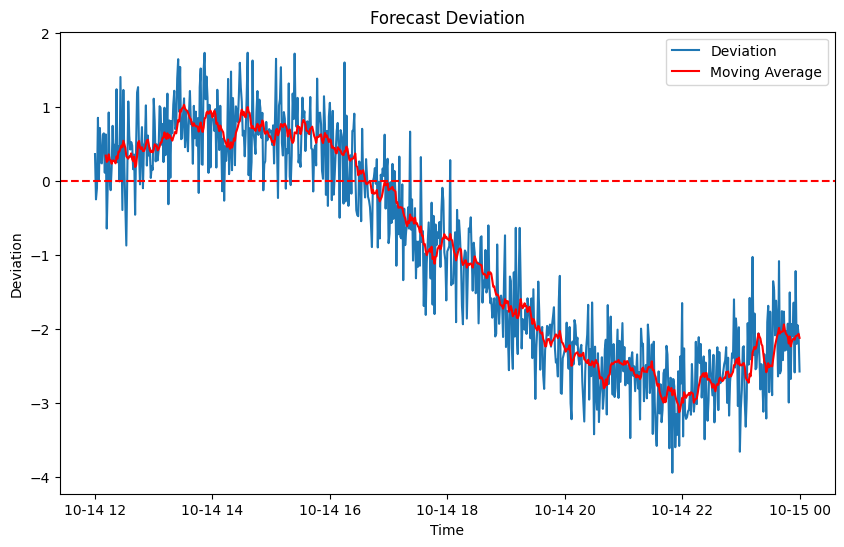


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 2
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2132413070.py:12: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:49:23 - cmdstanpy - INFO - Chain [1] start processing
19:49:23 - cmdstanpy - INFO - Chain [1] done processing


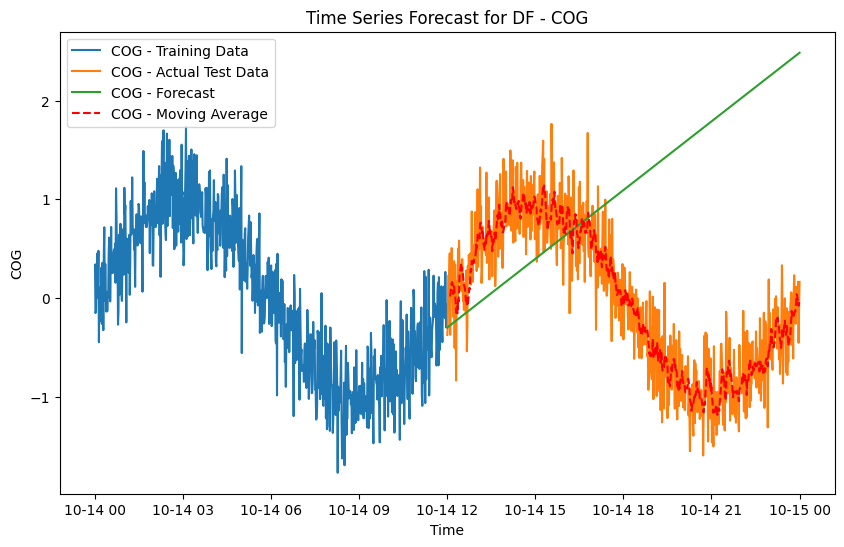

Mean Squared Error: 3.2904538705139537
Standard Deviation :  1.4362553683452617


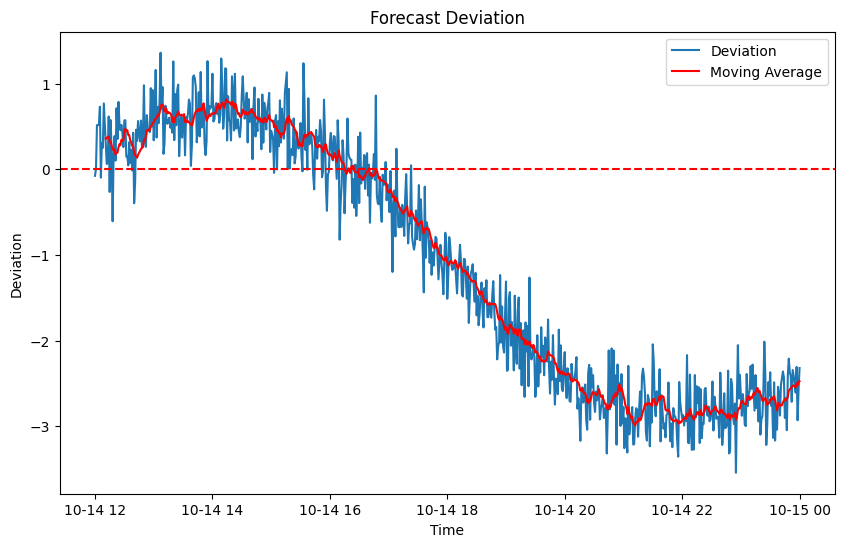


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 3
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2132413070.py:12: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:49:24 - cmdstanpy - INFO - Chain [1] start processing
19:49:24 - cmdstanpy - INFO - Chain [1] done processing


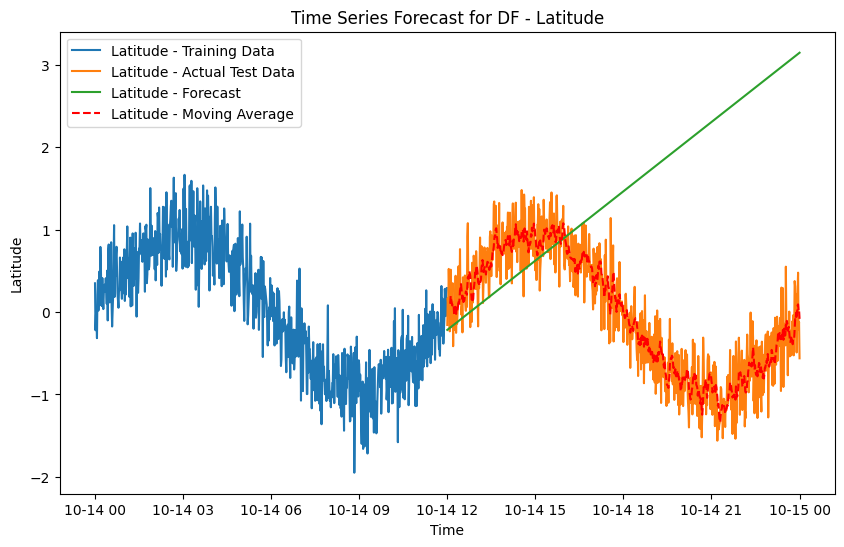

Mean Squared Error: 4.756420894058291
Standard Deviation :  1.5959419632513383


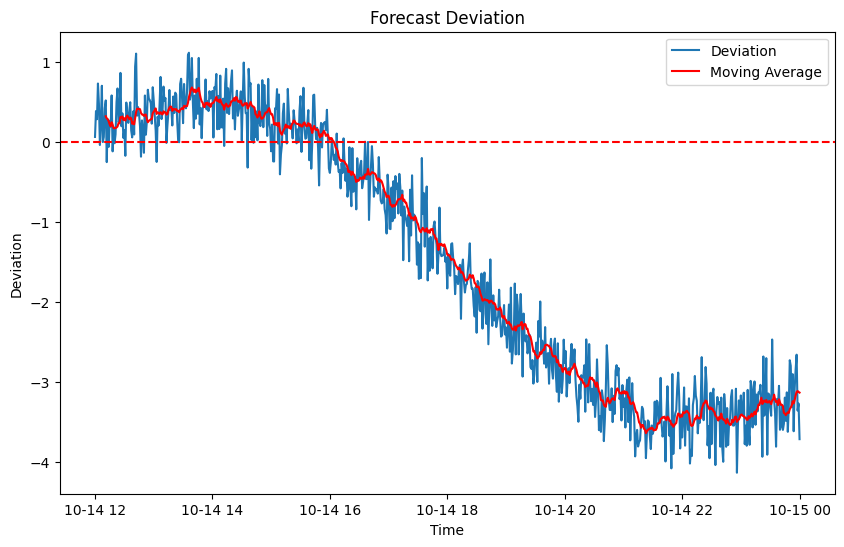


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 4
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2132413070.py:12: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:49:26 - cmdstanpy - INFO - Chain [1] start processing
19:49:26 - cmdstanpy - INFO - Chain [1] done processing


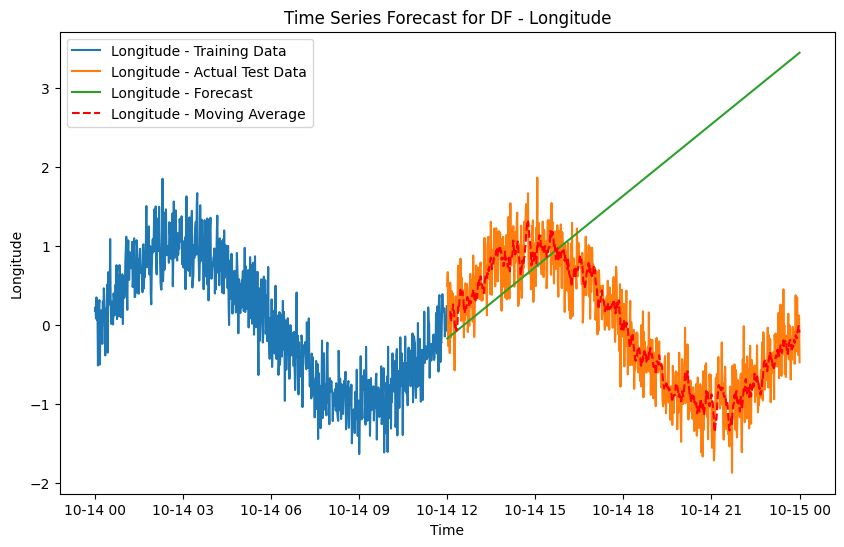

Mean Squared Error: 5.575764815031933
Standard Deviation :  1.689378127803328


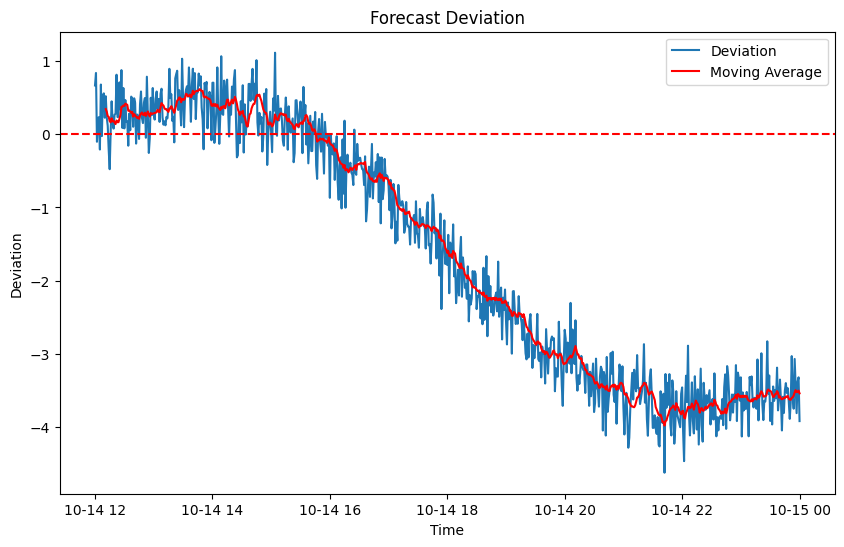


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 5
Exiting the program. Goodbye!


In [195]:
#df_all_time_series_data = pd.DataFrame()
combined_data12 = pd.DataFrame()

while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-4): ")

    if choice == '5':
        print("Exiting the program. Goodbye!")
        break
    elif choice in ['1', '2', '3','4']:
        try:
            mmsi = input("Enter MMSI: ")  # Get the MMSI from the user
            df12_subset = df12[df12['MMSI'] == int(mmsi)]  # Subset the dataset based on the given MMSI
        except ValueError:
            print("Invalid input. Please enter a valid integer for the interval.")
            continue

        if choice == '1':
            columns = ['SOG']
            noise_levels = [0.5]
        elif choice =='2':
            columns=['COG']
            noise_levels=[0.3]
        elif choice == '3':
            columns = ['Latitude']
            noise_levels = [0.3]
        elif choice == '4':
            columns = ['Longitude']
            noise_levels = [0.3]
    else:
        print("Invalid choice. Please enter a number from 1 to 4.")
        continue
    
    time_series_data12 = create_time_series12(start_date='2023-10-14', end_date='2023-10-15',df12=df12_subset, interval_minutes=1, columns=columns, noise_levels=noise_levels)
    
    # Append to the DataFrame
    #df_all_time_series_data = pd.concat([df_all_time_series_data,time_series_data])
    combined_data12 = pd.concat([combined_data12, time_series_data12[columns]], axis=1)

    
    # Split data into training and testing sets (80% training, 20% testing)
    train_data, test_data = train_test_split(time_series_data12, test_size=0.5, shuffle=False)

    # Rename columns to 'ds' and 'y' for Prophet
    train_data.rename(columns={columns[0]: 'y'}, inplace=True)
    test_data.rename(columns={columns[0]: 'y'}, inplace=True)

    # Convert 'ds' column to datetime format
    train_data['ds'] = pd.to_datetime(train_data['ds'])
    test_data['ds'] = pd.to_datetime(test_data['ds'])

    # Train Prophet model
    prophet_model = Prophet()
    prophet_model.fit(train_data)
    
    #plot_prophet_loss(prophet_model)

    # Create a dataframe with future dates for prediction
    future = prophet_model.make_future_dataframe(periods=len(test_data), freq='1min')

    # Make predictions
    forecast = prophet_model.predict(future)

    # Plot the forecast and actual test data
    plot_prophet_forecast(train_data, test_data, forecast, columns)

    # Evaluate performance using mean squared error
    mse = mean_squared_error(test_data['y'], forecast[-len(test_data):]['yhat'])
    print(f'Mean Squared Error: {mse}')
    
    # Calculate deviation
    test_data['deviation'] = (test_data['y'] - forecast[-len(test_data):]['yhat'])
    
    # Calculate deviation percentage using stdev function
    sd = st.stdev(test_data['deviation']) 
    print("Standard Deviation : ", sd)
    
    # Calculate moving average
    window_size = 12  # You can adjust the window size as needed
    test_data['moving_average'] = test_data['deviation'].rolling(window=window_size).mean()
    
    # Visualize deviation
    plt.figure(figsize=(10, 6))
    plt.plot(test_data['ds'], test_data['deviation'], label='Deviation')
    plt.plot(test_data['ds'], test_data['moving_average'], color='red', label='Moving Average')
    plt.axhline(y=0, color='r', linestyle='--')
    plt.title('Forecast Deviation')
    plt.xlabel('Time')
    plt.ylabel('Deviation')
    plt.legend()
    plt.show()
    
    
    
    
    #220068000
    

In [196]:
combined_data12

,SOG,COG,Latitude,Longitude
0,-0.143112,0.336168,0.349214,0.176678
1,-0.280002,-0.151374,-0.220943,0.223414
2,-0.363689,-0.129445,-0.031584,0.080049
3,0.654376,0.345250,-0.093732,0.346121
4,-0.401998,0.001129,-0.316832,0.064121
...,...,...,...,...
1436,0.982497,-0.138662,0.288387,-0.021124
1437,0.002431,0.164670,0.478278,-0.380959
1438,0.258472,-0.453750,-0.214014,0.055493
1439,0.144261,-0.086123,-0.121924,0.117806


In [197]:
df1_13 =pd.concat([df1_12,combined_data12],axis=0)

In [198]:
df1_13

,SOG,COG,Latitude,Longitude
0,0.323357,-0.155061,-0.016830,-0.179949
1,0.315885,-0.581238,-0.556230,-0.385583
2,0.914108,0.344985,-0.103316,0.119060
3,-0.434664,0.658695,0.116240,0.157335
4,-0.594001,-0.245701,0.234424,0.282610
...,...,...,...,...
1436,0.982497,-0.138662,0.288387,-0.021124
1437,0.002431,0.164670,0.478278,-0.380959
1438,0.258472,-0.453750,-0.214014,0.055493
1439,0.144261,-0.086123,-0.121924,0.117806



Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 1


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/1270785909.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:49:27 - cmdstanpy - INFO - Chain [1] start processing
19:49:27 - cmdstanpy - INFO - Chain [1] done processing


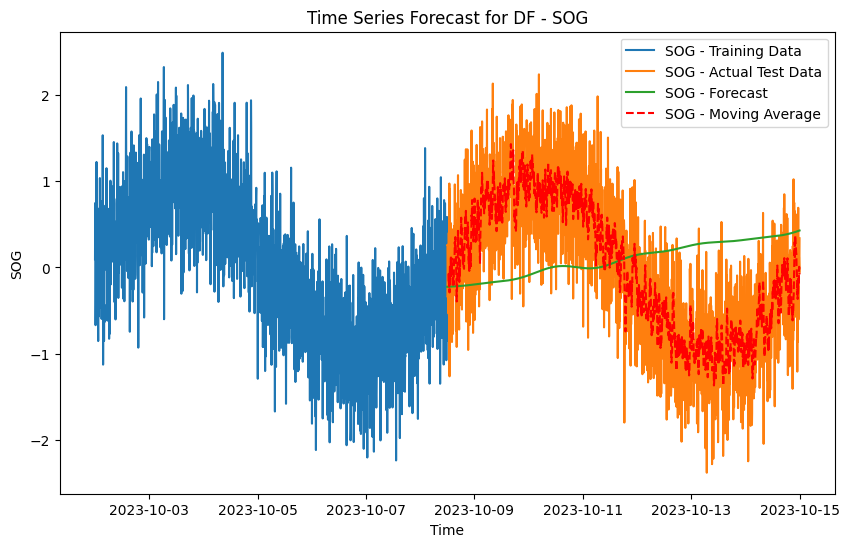

Mean Squared Error: 1.0325550269726116
Standard Deviation :  1.0110729969543701


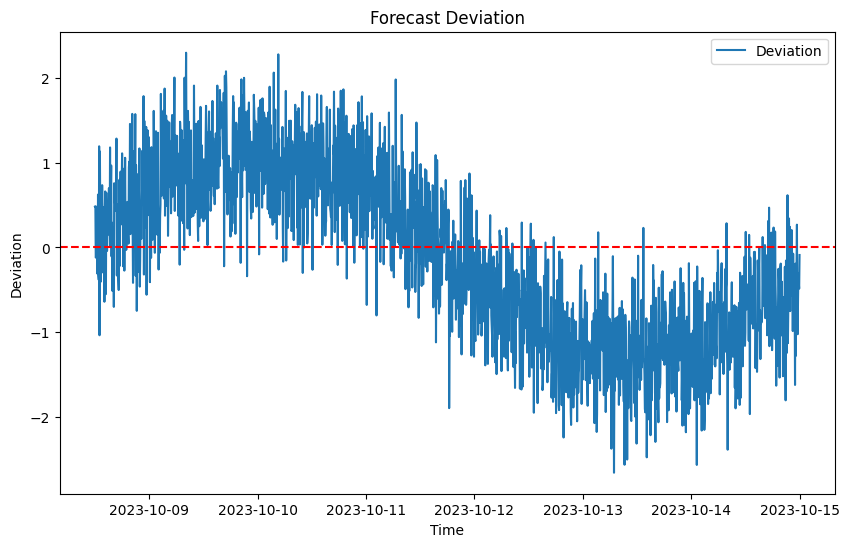


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 2


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/1270785909.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:49:28 - cmdstanpy - INFO - Chain [1] start processing
19:49:28 - cmdstanpy - INFO - Chain [1] done processing


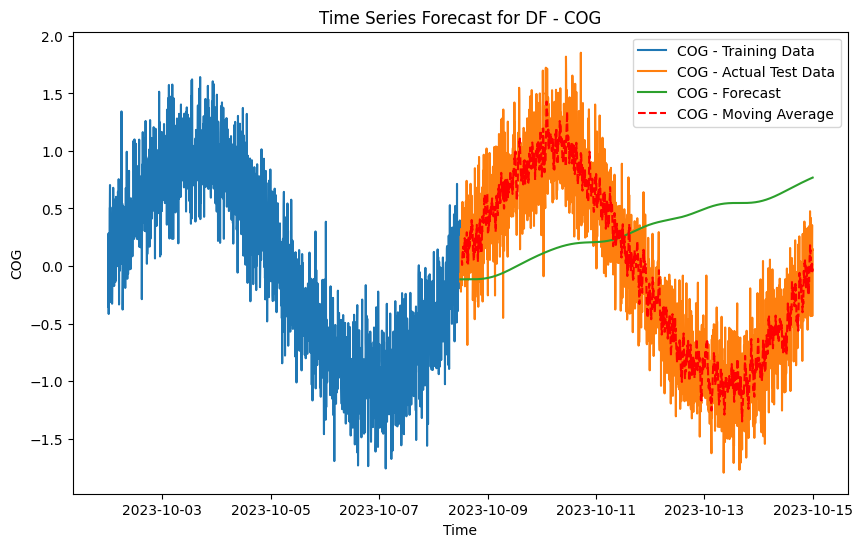

Mean Squared Error: 1.0302526597229837
Standard Deviation :  0.9642915884460975


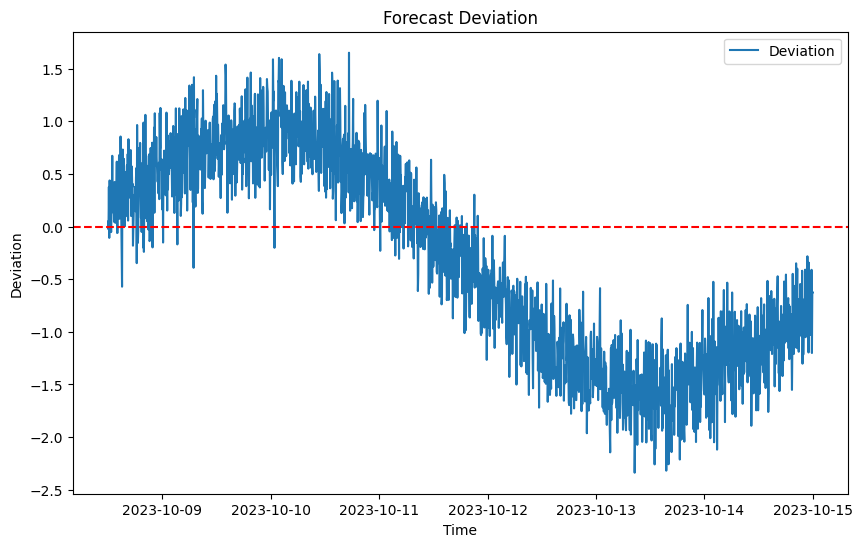


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 3


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/1270785909.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:49:29 - cmdstanpy - INFO - Chain [1] start processing
19:49:30 - cmdstanpy - INFO - Chain [1] done processing


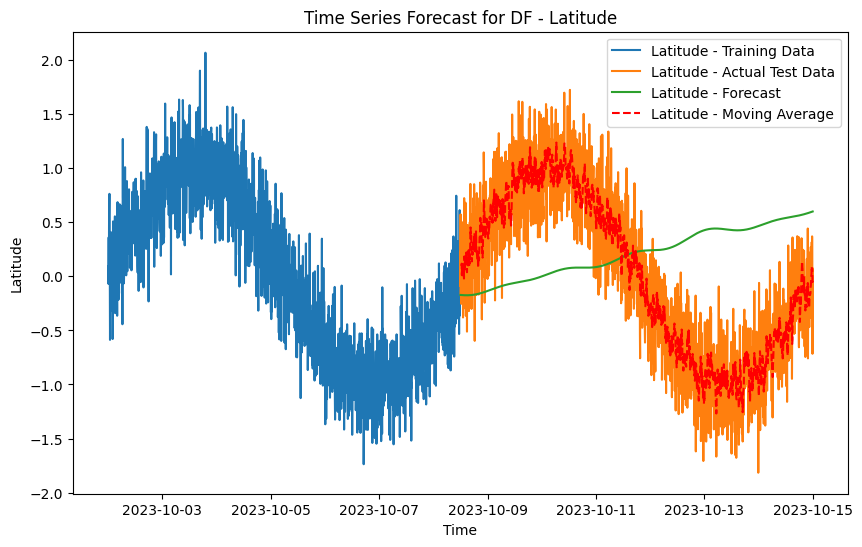

Mean Squared Error: 0.9504935676423634
Standard Deviation :  0.9537928904531635


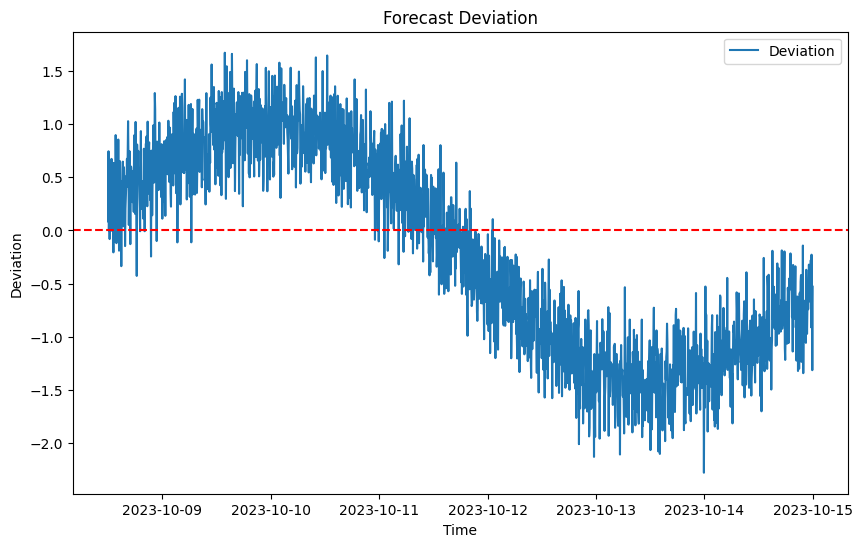


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 4


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/1270785909.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:49:31 - cmdstanpy - INFO - Chain [1] start processing
19:49:31 - cmdstanpy - INFO - Chain [1] done processing


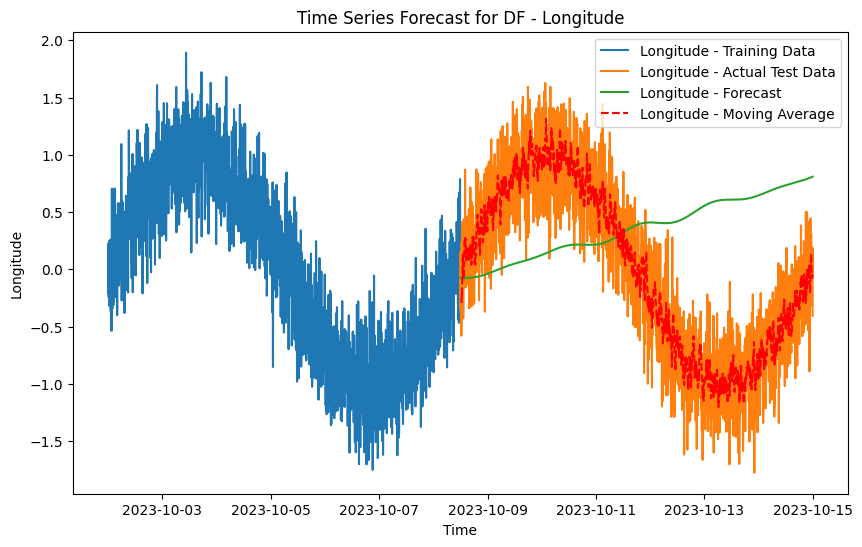

Mean Squared Error: 1.064117172779655
Standard Deviation :  0.966512035141379


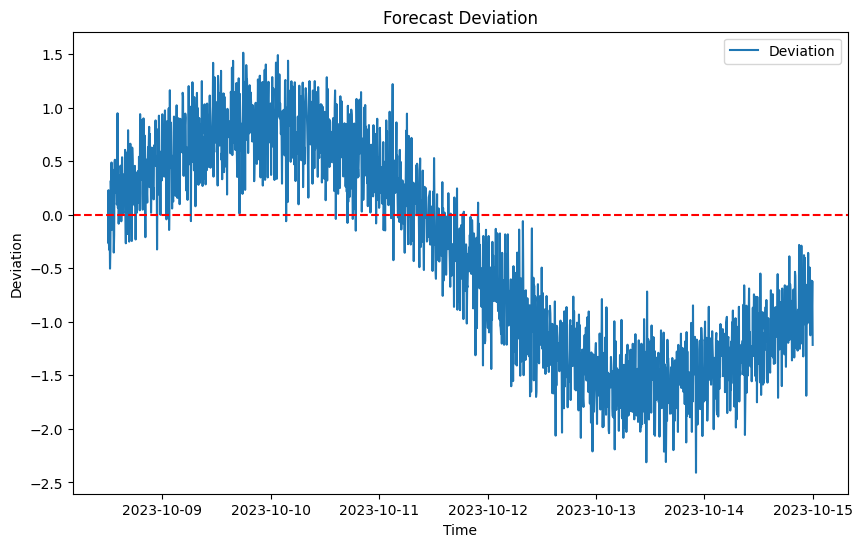


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 5
Exiting the program. Goodbye!


In [199]:
 def create_time_series1_13(start_date,end_date,df, interval_minutes, columns, noise_levels=None):
    # Generate datetime range with even intervals
    date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')

    # Create a DataFrame with datetime values
    new_df = pd.DataFrame(date_rng, columns=['ds'])

    # Generate time series values for each specified column
    for col, noise_level in zip(columns, noise_levels):
        if col.lower() == 'Latitude':
            new_df[col] = df[col]
        elif col.lower() == 'Longitude':
            new_df[col] = df[col]
        elif col.lower() =='SOG':
            new_df[col] =df[col]
        elif col.lower() =='COG':
            new_df[col] =df[col]    
        else:
            new_df[col] = np.sin(np.linspace(0, 4 * np.pi, len(new_df))) + np.random.normal(0, noise_level, len(new_df))

    return new_df

def plot_prophet_forecast1_13(train_data, test_data, forecast, columns):
    for col in columns:
        plt.figure(figsize=(10, 6))
        plt.plot(train_data['ds'], train_data['y'], label=f'{col} - Training Data')
        plt.plot(test_data['ds'], test_data['y'], label=f'{col} - Actual Test Data')
        plt.plot(test_data['ds'], forecast[-len(test_data):]['yhat'], label=f'{col} - Forecast')
        plt.title(f'Time Series Forecast for Dataset1 - {col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()
        
## PRACTCIE


while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-4): ")

    if choice == '5':
        print("Exiting the program. Goodbye!")
        break
    elif choice in ['1', '2', '3','4']:
        if choice == '1':
            columns = ['SOG']
            noise_levels = [0.5]
        elif choice =='2':
            columns=['COG']
            noise_levels=[0.3]
        elif choice == '3':
            columns = ['Latitude']
            noise_levels = [0.3]
        elif choice == '4':
            columns = ['Longitude']
            noise_levels = [0.3]
    else:
        print("Invalid choice. Please enter a number from 1 to 4.")
        continue
        
     # First, you need to create the training and testing datasets separately
    # Let's assume your first dataset is stored in df and the second dataset is stored in df1
    time_series_data1_13 = create_time_series1_13(start_date='2023-10-02', end_date='2023-10-15', df=df1_13, interval_minutes=5, columns=columns, noise_levels=noise_levels)
        
    
    train_data, test_data = train_test_split(time_series_data1_13, test_size=0.5, shuffle=False)

    
    # Rename columns to 'ds' and 'y' for Prophet

    train_data.rename(columns={columns[0]: 'y'}, inplace=True)
    test_data.rename(columns={columns[0]: 'y'}, inplace=True)
    
    # Convert 'ds' column to datetime format
    train_data['ds'] = pd.to_datetime(train_data['ds'])
    test_data['ds'] = pd.to_datetime(test_data['ds'])

    # Train Prophet model
    prophet_model = Prophet()
    prophet_model.fit(train_data)

    # Create a dataframe with future dates for prediction
    future = prophet_model.make_future_dataframe(periods=len(test_data), freq='1min')

    # Make predictions
    forecast = prophet_model.predict(future)

    # Plot the forecast and actual test data
    plot_prophet_forecast12(train_data, test_data, forecast, columns)

    # Evaluate performance using mean squared error
    mse = mean_squared_error(test_data['y'], forecast[-len(test_data):]['yhat'])
    print(f'Mean Squared Error: {mse}')

    # Calculate deviation
    test_data['deviation'] = test_data['y'] - forecast[-len(test_data):]['yhat']
    
    # Calculate deviation percentage using stdev function
    sd = np.std(test_data['deviation']) 
    print("Standard Deviation : ", sd)
    
    # Calculate standard deviation percentage
    
    # Visualize deviation
    plt.figure(figsize=(10, 6))
    plt.plot(test_data['ds'], test_data['deviation'], label='Deviation')
    plt.axhline(y=0, color='r', linestyle='--')
    plt.title('Forecast Deviation')
    plt.xlabel('Time')
    plt.ylabel('Deviation')
    plt.legend()
    plt.show()
   
    

## DATASET 14

In [200]:
def create_time_series13(start_date, end_date, df13, interval_minutes, columns, noise_levels=None):

    # Set the 'Timestamp' column as the index
    df13.set_index('# Timestamp', inplace=True)

    # Resample the DataFrame to get one data point per minute
    resampled_df13 = df13.resample(f'{interval_minutes}1min').first().reset_index()
    
    resampled_df13 = df13.groupby([pd.Grouper(freq=f'{interval_minutes}1min'), 'MMSI']).min().reset_index()
    
    # Generate datetime range with even intervals
    date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')

    # Create a DataFrame with datetime values
    new_df = pd.DataFrame(date_rng, columns=['ds'])

    # Merge resampled data with the new DataFrame on the 'ds' column
    new_df = pd.merge(new_df, resampled_df13, how='left', left_on='ds', right_on='# Timestamp')

    # Drop the redundant '# Timestamp' column
    new_df.drop('# Timestamp', axis=1, inplace=True)

    # Generate time series values for each specified column
    for col, noise_level in zip(columns, noise_levels):
        if col.lower() == 'Latitude':
            new_df[col] = df[col]
        elif col.lower() == 'Longitude':
            new_df[col] = df[col]
        elif col.lower() =='SOG':
            new_df[col] =df[col]
        elif col.lower() =='COG':
            new_df[col] =df[col]    
        else:
            new_df[col] = np.sin(np.linspace(0, 4 * np.pi, len(new_df))) + np.random.normal(0, noise_level, len(new_df))

    return new_df



In [201]:
def plot_time_series13(df13, columns, window=7):
    for col in columns:
        # Calculate moving average
        df13['Moving Average'] = df13[col].rolling(window=window).mean()
        
        plt.figure(figsize=(10, 6))
        plt.plot(df13['ds'], df13[col], label=col)
        plt.plot(df13['ds'], df13['Moving Average'], label=f'{col} - Moving Average', linestyle='--', color='red')
        plt.title(f'Time Series Plot for Dataset df - {col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()

## Menu-driven code
mmsi = input("Enter MMSI: ")  # Get the MMSI from the user
while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG ")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-5): ")
    
    if choice in ['1', '2', '3', '4']:
        #mmsi = input("Enter MMSI: ")  # Get the MMSI from the user
        df13_subset = df13[df13['MMSI'] == int(mmsi)]  # Subset the dataset based on the given MMSI
        columns = ['SOG'] if choice == '1' else ['COG'] if choice == '2' else ['Latitude'] if choice == '3' else ['Longitude']
        noise_levels = [0.5] if choice == '1' else [0.3]  # Adjust noise levels as needed

        time_series_data13 = create_time_series13(start_date='2022-10-15',end_date='2022-10-16',df13=df13_subset, interval_minutes=1, columns=columns, noise_levels=noise_levels)
        plot_time_series13(time_series_data13, columns)
    elif choice == '5':
        print("Exiting the program. Goodbye!")
        break
    else:
        print("Invalid choice. Please enter a number from 1 to 5.")


In [202]:
def plot_prophet_forecast13(train_data, test_data, forecast, columns, window=7):
    for col in columns:
        # Compute moving average
        test_data['Moving Average'] = test_data['y'].rolling(window=window).mean()
        
        plt.figure(figsize=(10, 6))
        plt.plot(train_data['ds'], train_data['y'], label=f'{col} - Training Data')
        plt.plot(test_data['ds'], test_data['y'], label=f'{col} - Actual Test Data')
        plt.plot(test_data['ds'], forecast[-len(test_data):]['yhat'], label=f'{col} - Forecast')
        plt.plot(test_data['ds'], test_data['Moving Average'], label=f'{col} - Moving Average', linestyle='--', color='red')
        plt.title(f'Time Series Forecast for DF - {col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()



Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 1
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2542213264.py:12: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:49:36 - cmdstanpy - INFO - Chain [1] start processing
19:49:37 - cmdstanpy - INFO - Chain [1] done processing


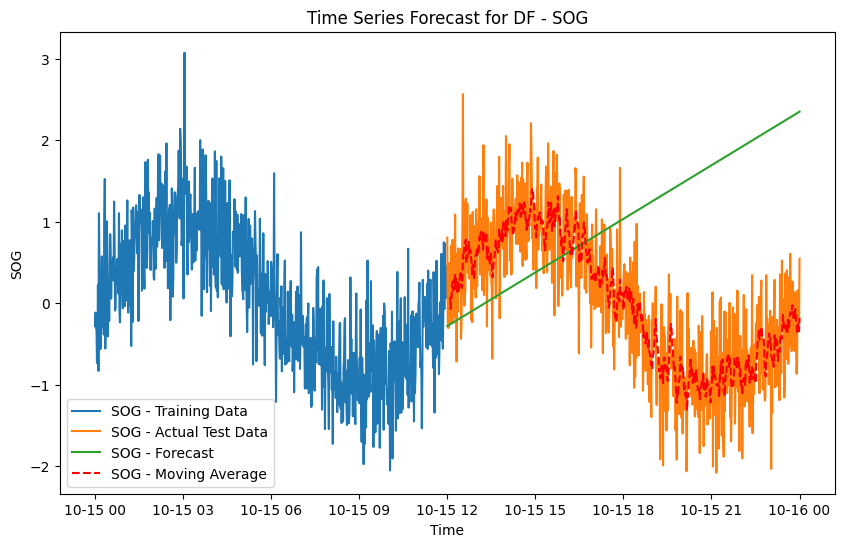

Mean Squared Error: 3.2788950592179456
Standard Deviation :  1.499231581927744


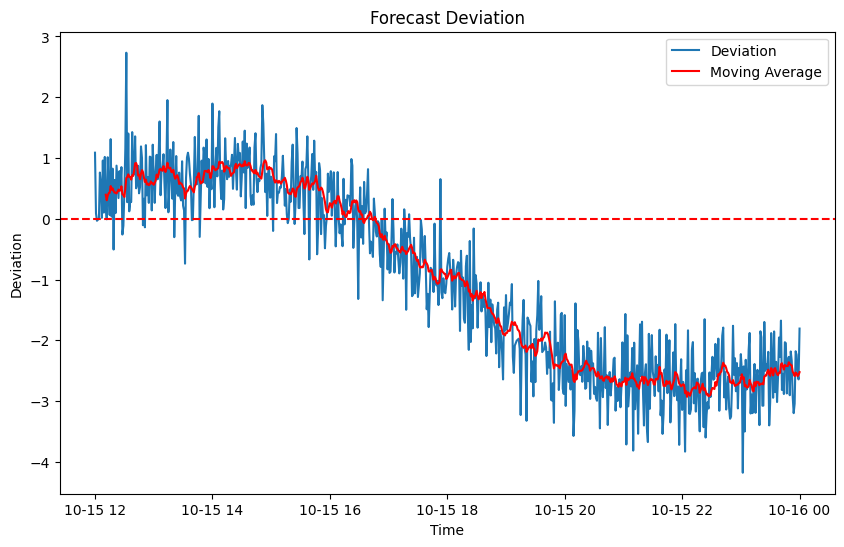


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 2
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2542213264.py:12: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:49:38 - cmdstanpy - INFO - Chain [1] start processing
19:49:38 - cmdstanpy - INFO - Chain [1] done processing


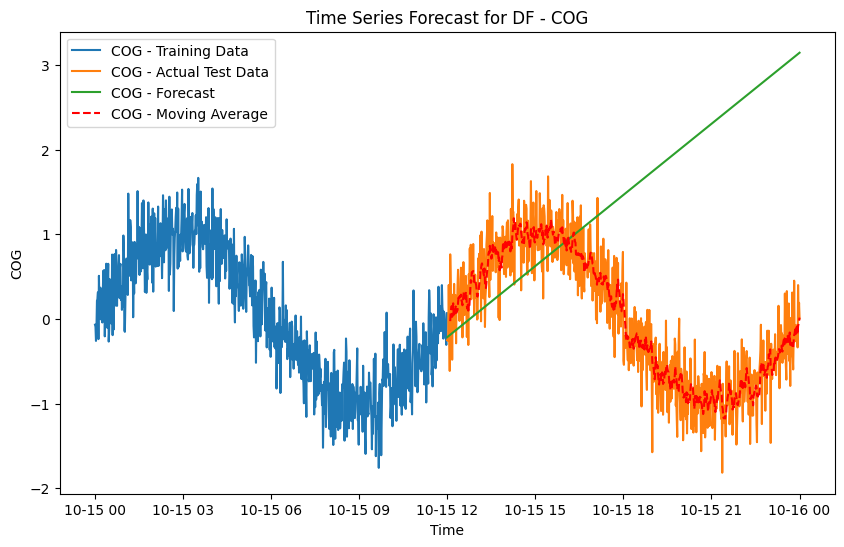

Mean Squared Error: 4.759273135316613
Standard Deviation :  1.6251471818647885


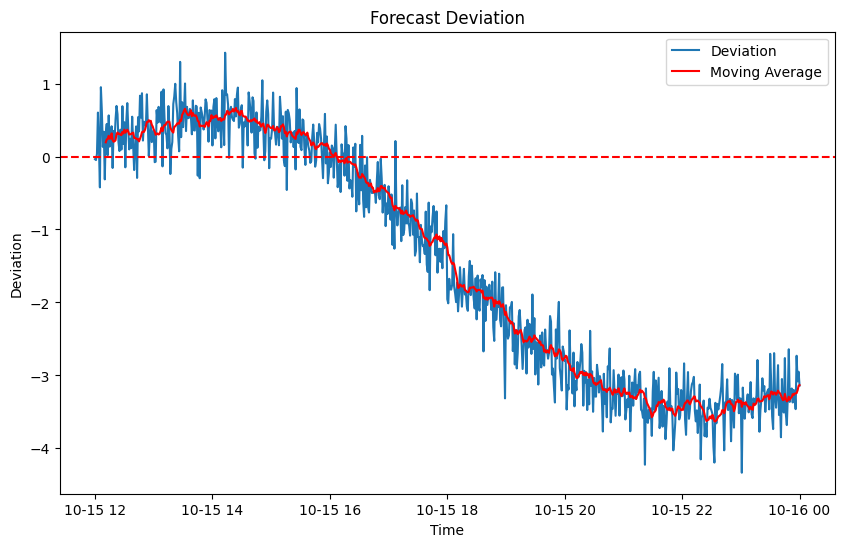


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 3
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2542213264.py:12: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:49:40 - cmdstanpy - INFO - Chain [1] start processing
19:49:40 - cmdstanpy - INFO - Chain [1] done processing


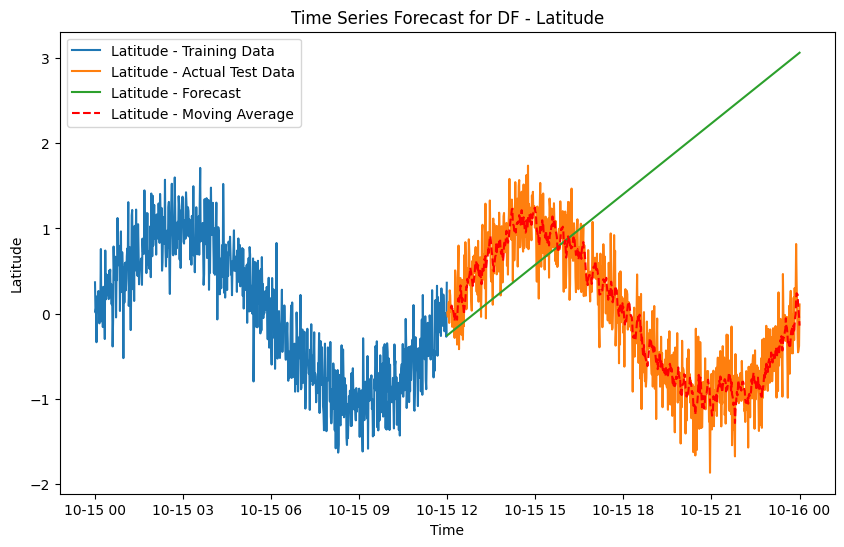

Mean Squared Error: 4.573493018217791
Standard Deviation :  1.6129834438098274


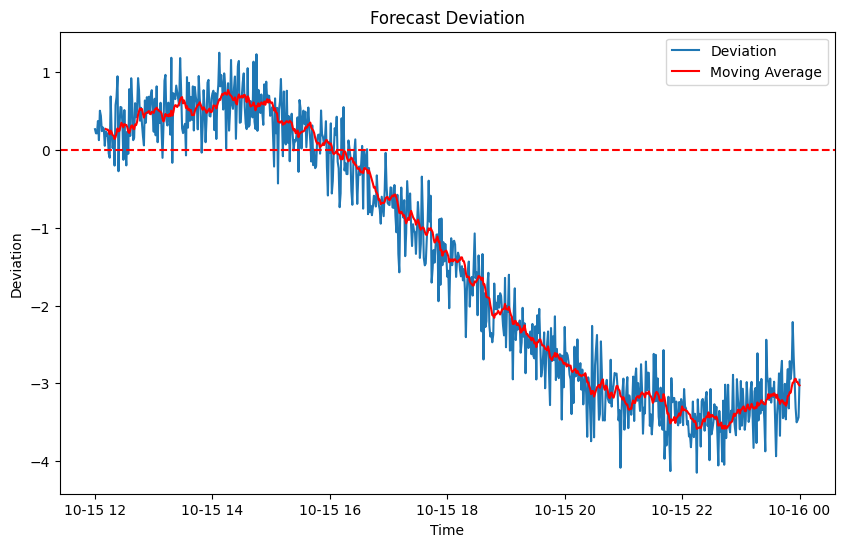


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 4
Enter MMSI: 220068000


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/2542213264.py:12: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:49:41 - cmdstanpy - INFO - Chain [1] start processing
19:49:41 - cmdstanpy - INFO - Chain [1] done processing


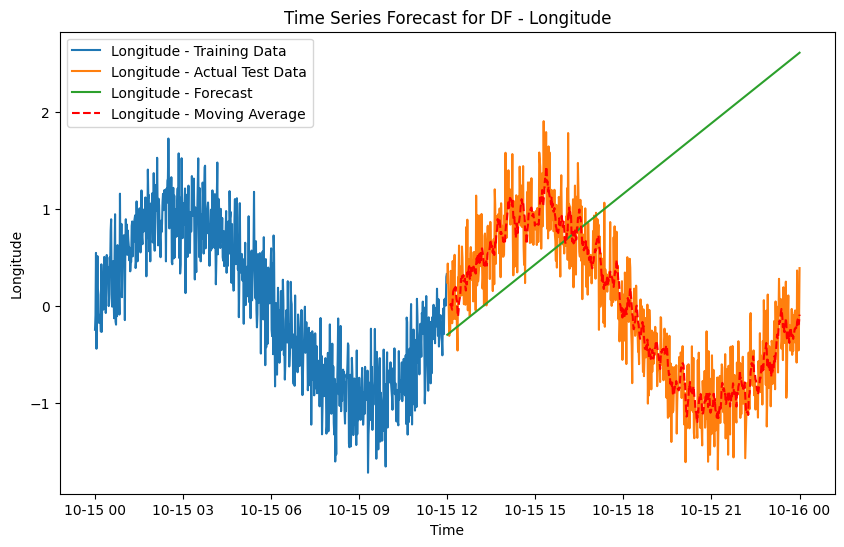

Mean Squared Error: 3.539980056415184
Standard Deviation :  1.4836783215010478


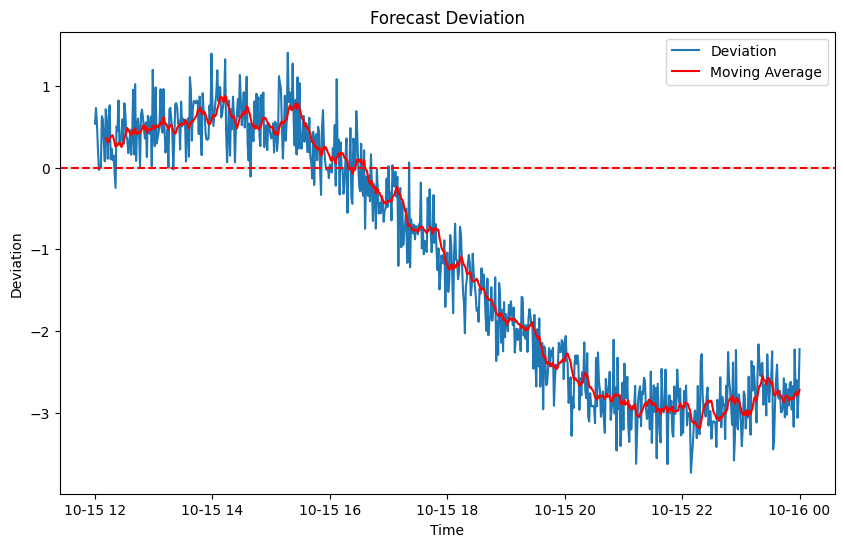


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 5
Exiting the program. Goodbye!


In [203]:
#df_all_time_series_data = pd.DataFrame()
combined_data13 = pd.DataFrame()

while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-4): ")

    if choice == '5':
        print("Exiting the program. Goodbye!")
        break
    elif choice in ['1', '2', '3','4']:
        try:
            mmsi = input("Enter MMSI: ")  # Get the MMSI from the user
            df13_subset = df13[df13['MMSI'] == int(mmsi)]  # Subset the dataset based on the given MMSI
        except ValueError:
            print("Invalid input. Please enter a valid integer for the interval.")
            continue

        if choice == '1':
            columns = ['SOG']
            noise_levels = [0.5]
        elif choice =='2':
            columns=['COG']
            noise_levels=[0.3]
        elif choice == '3':
            columns = ['Latitude']
            noise_levels = [0.3]
        elif choice == '4':
            columns = ['Longitude']
            noise_levels = [0.3]
    else:
        print("Invalid choice. Please enter a number from 1 to 4.")
        continue
    
    time_series_data13 = create_time_series13(start_date='2023-10-15', end_date='2023-10-16',df13=df13_subset, interval_minutes=1, columns=columns, noise_levels=noise_levels)
    
    # Append to the DataFrame
    #df_all_time_series_data = pd.concat([df_all_time_series_data,time_series_data])
    combined_data13 = pd.concat([combined_data13, time_series_data13[columns]], axis=1)

    
    # Split data into training and testing sets (80% training, 20% testing)
    train_data, test_data = train_test_split(time_series_data13, test_size=0.5, shuffle=False)

    # Rename columns to 'ds' and 'y' for Prophet
    train_data.rename(columns={columns[0]: 'y'}, inplace=True)
    test_data.rename(columns={columns[0]: 'y'}, inplace=True)

    # Convert 'ds' column to datetime format
    train_data['ds'] = pd.to_datetime(train_data['ds'])
    test_data['ds'] = pd.to_datetime(test_data['ds'])

    # Train Prophet model
    prophet_model = Prophet()
    prophet_model.fit(train_data)
    
    #plot_prophet_loss(prophet_model)

    # Create a dataframe with future dates for prediction
    future = prophet_model.make_future_dataframe(periods=len(test_data), freq='1min')

    # Make predictions
    forecast = prophet_model.predict(future)

    # Plot the forecast and actual test data
    plot_prophet_forecast(train_data, test_data, forecast, columns)

    # Evaluate performance using mean squared error
    mse = mean_squared_error(test_data['y'], forecast[-len(test_data):]['yhat'])
    print(f'Mean Squared Error: {mse}')
    
    # Calculate deviation
    test_data['deviation'] = (test_data['y'] - forecast[-len(test_data):]['yhat'])
    
    # Calculate deviation percentage using stdev function
    sd = st.stdev(test_data['deviation']) 
    print("Standard Deviation : ", sd)
    
    # Calculate moving average
    window_size = 12  # You can adjust the window size as needed
    test_data['moving_average'] = test_data['deviation'].rolling(window=window_size).mean()
    
    # Visualize deviation
    plt.figure(figsize=(10, 6))
    plt.plot(test_data['ds'], test_data['deviation'], label='Deviation')
    plt.plot(test_data['ds'], test_data['moving_average'], color='red', label='Moving Average')
    plt.axhline(y=0, color='r', linestyle='--')
    plt.title('Forecast Deviation')
    plt.xlabel('Time')
    plt.ylabel('Deviation')
    plt.legend()
    plt.show()
    
    
    
    
    #220068000
    

In [204]:
211879870

211879870

In [205]:
combined_data13

,SOG,COG,Latitude,Longitude
0,-0.283530,-0.068665,0.367665,-0.245846
1,-0.115795,-0.092252,0.013373,-0.096549
2,-0.303614,-0.260017,0.059488,0.546887
3,-0.262039,-0.106505,-0.335410,-0.441490
4,-0.735563,0.214671,0.165253,0.196100
...,...,...,...,...
1436,0.158170,-0.336578,-0.277624,-0.181551
1437,0.103535,0.399488,-0.453757,-0.002923
1438,-0.206987,0.053072,-0.423677,-0.458888
1439,-0.293864,0.190070,-0.379051,-0.157477


In [206]:
df1_14 =pd.concat([df1_13,combined_data13],axis=0)

In [207]:
df1_14

,SOG,COG,Latitude,Longitude
0,0.323357,-0.155061,-0.016830,-0.179949
1,0.315885,-0.581238,-0.556230,-0.385583
2,0.914108,0.344985,-0.103316,0.119060
3,-0.434664,0.658695,0.116240,0.157335
4,-0.594001,-0.245701,0.234424,0.282610
...,...,...,...,...
1436,0.158170,-0.336578,-0.277624,-0.181551
1437,0.103535,0.399488,-0.453757,-0.002923
1438,-0.206987,0.053072,-0.423677,-0.458888
1439,-0.293864,0.190070,-0.379051,-0.157477


In [208]:
## TESTING


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 1


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/945079431.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:49:43 - cmdstanpy - INFO - Chain [1] start processing
19:49:43 - cmdstanpy - INFO - Chain [1] done processing


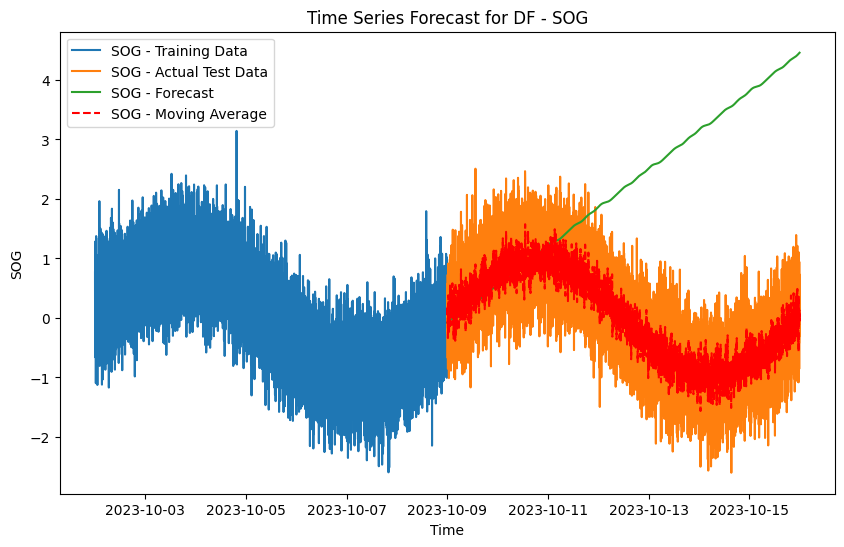

Mean Squared Error: 8.57800772123444
Standard Deviation :  1.9672714165948886


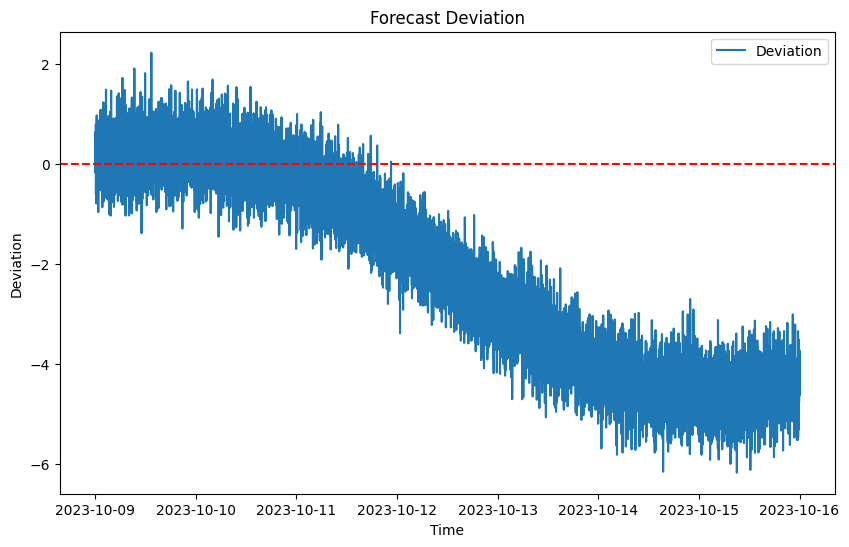


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 2


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/945079431.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:49:47 - cmdstanpy - INFO - Chain [1] start processing
19:49:47 - cmdstanpy - INFO - Chain [1] done processing


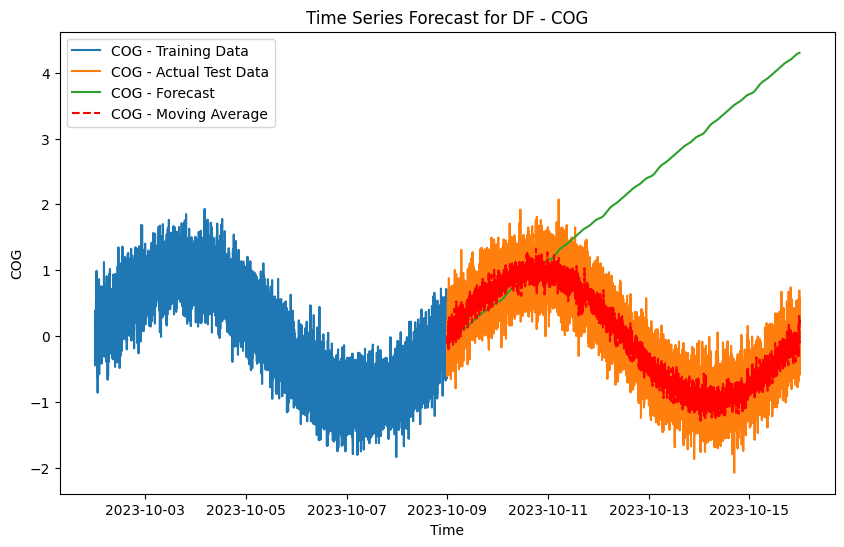

Mean Squared Error: 8.020103070667314
Standard Deviation :  1.8962711663378942


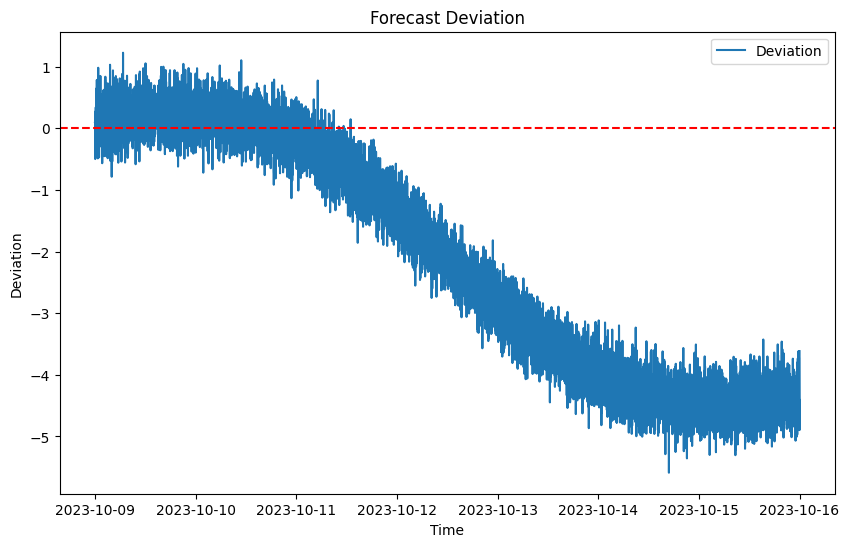


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 3


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/945079431.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:49:50 - cmdstanpy - INFO - Chain [1] start processing
19:49:51 - cmdstanpy - INFO - Chain [1] done processing


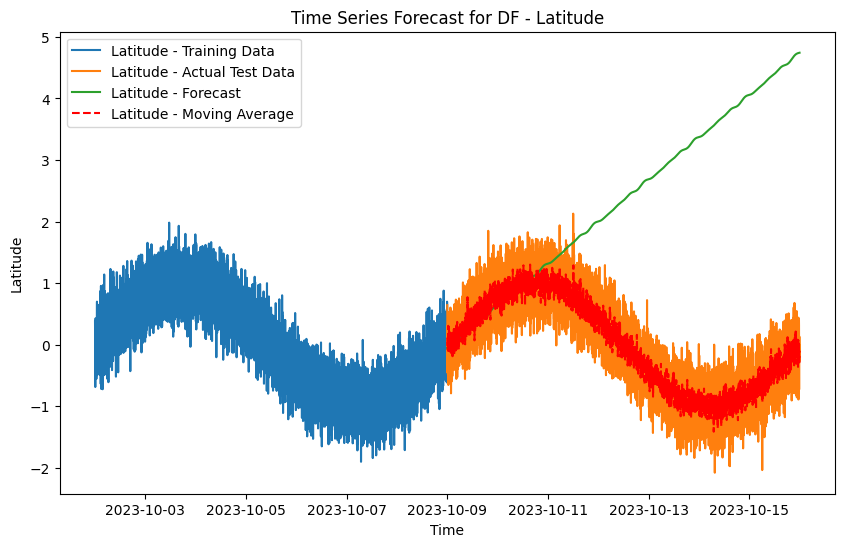

Mean Squared Error: 9.531441463328822
Standard Deviation :  2.0100375878964


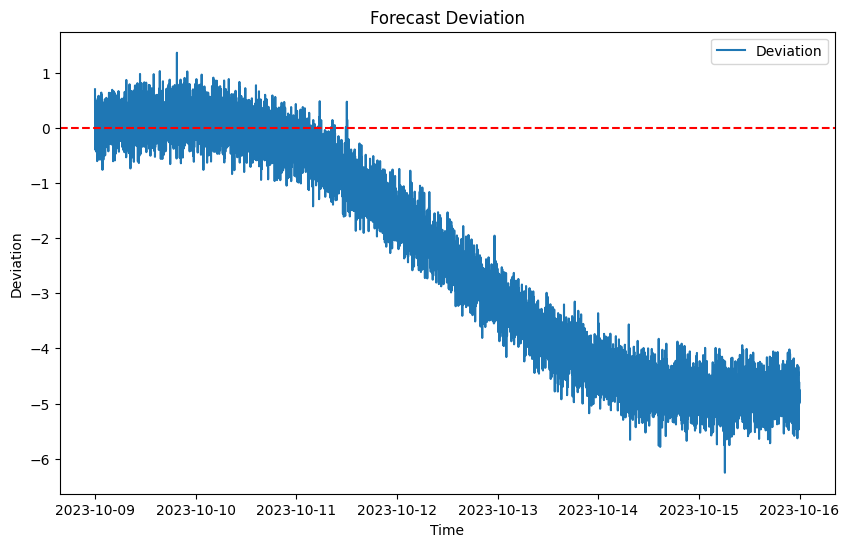


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 4


/var/folders/m4/5dprynq977v8cfvxny6k7qz00000gn/T/ipykernel_1201/945079431.py:3: FutureWarning: 'T' is deprecated and will be removed in a future version, please use 'min' instead.
  date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')
19:49:53 - cmdstanpy - INFO - Chain [1] start processing
19:49:54 - cmdstanpy - INFO - Chain [1] done processing


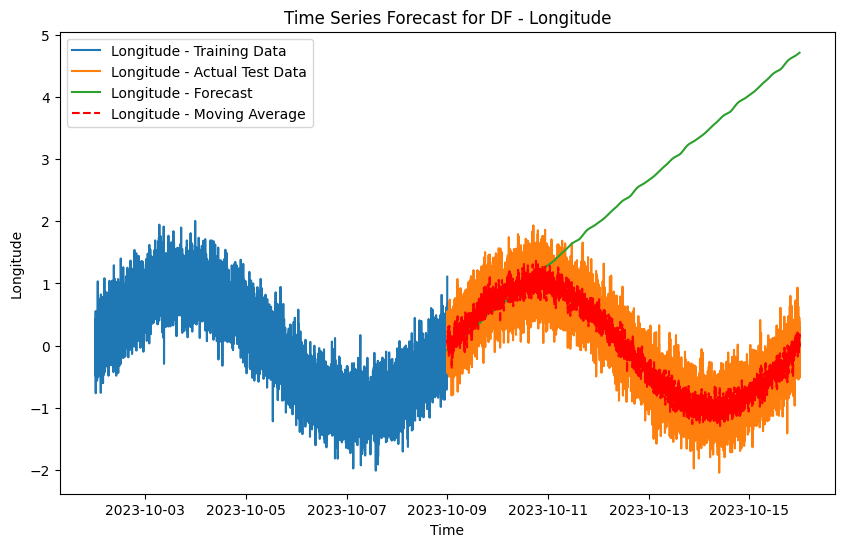

Mean Squared Error: 9.451866292956726
Standard Deviation :  2.009291463997564


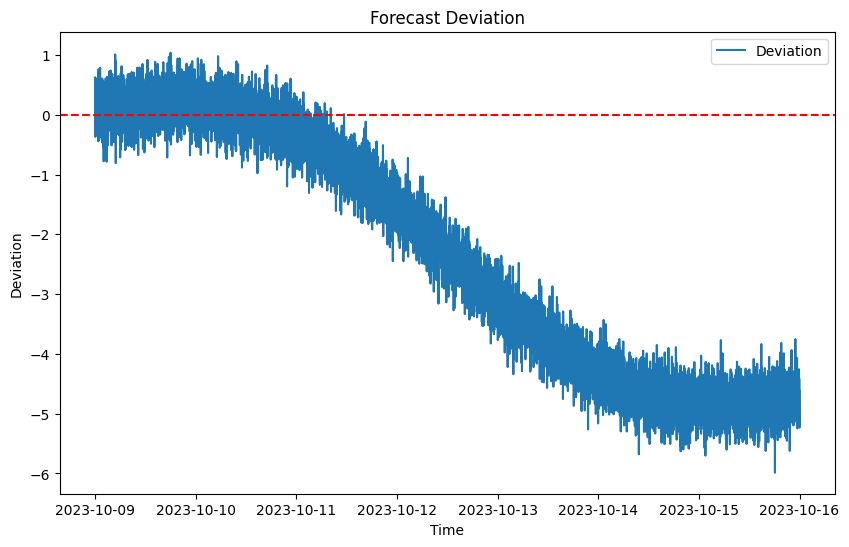


Menu:
1. Generate Time Series - SOG
2. Generate Time Series - COG
3. Generate Time Series - Latitude
4. Generate Time Series - Longitude
5. Exit
Enter your choice (1-4): 5
Exiting the program. Goodbye!


In [209]:
 def create_time_series1_14(start_date,end_date,df, interval_minutes, columns, noise_levels=None):
    # Generate datetime range with even intervals
    date_rng = pd.date_range(start=start_date, end=end_date, freq=f'{interval_minutes}T')

    # Create a DataFrame with datetime values
    new_df = pd.DataFrame(date_rng, columns=['ds'])

    # Generate time series values for each specified column
    for col, noise_level in zip(columns, noise_levels):
        if col.lower() == 'Latitude':
            new_df[col] = df[col]
        elif col.lower() == 'Longitude':
            new_df[col] = df[col]
        elif col.lower() =='SOG':
            new_df[col] =df[col]
        elif col.lower() =='COG':
            new_df[col] =df[col]    
        else:
            new_df[col] = np.sin(np.linspace(0, 4 * np.pi, len(new_df))) + np.random.normal(0, noise_level, len(new_df))

    return new_df

def plot_prophet_forecast1_14(train_data, test_data, forecast, columns):
    for col in columns:
        plt.figure(figsize=(10, 6))
        plt.plot(train_data['ds'], train_data['y'], label=f'{col} - Training Data')
        plt.plot(test_data['ds'], test_data['y'], label=f'{col} - Actual Test Data')
        plt.plot(test_data['ds'], forecast[-len(test_data):]['yhat'], label=f'{col} - Forecast')
        plt.title(f'Time Series Forecast for Dataset1 - {col}')
        plt.xlabel('Time')
        plt.ylabel(col)
        plt.legend()
        plt.show()
        
## PRACTCIE


while True:
    print("\nMenu:")
    print("1. Generate Time Series - SOG")
    print("2. Generate Time Series - COG")
    print("3. Generate Time Series - Latitude")
    print("4. Generate Time Series - Longitude")
    print("5. Exit")

    choice = input("Enter your choice (1-4): ")

    if choice == '5':
        print("Exiting the program. Goodbye!")
        break
    elif choice in ['1', '2', '3','4']:
        if choice == '1':
            columns = ['SOG']
            noise_levels = [0.5]
        elif choice =='2':
            columns=['COG']
            noise_levels=[0.3]
        elif choice == '3':
            columns = ['Latitude']
            noise_levels = [0.3]
        elif choice == '4':
            columns = ['Longitude']
            noise_levels = [0.3]
    else:
        print("Invalid choice. Please enter a number from 1 to 4.")
        continue
        
     # First, you need to create the training and testing datasets separately
    # Let's assume your first dataset is stored in df and the second dataset is stored in df1
    time_series_data1_14 = create_time_series1_14(start_date='2023-10-02', end_date='2023-10-16', df=df1_14, interval_minutes=1, columns=columns, noise_levels=noise_levels)
        
    
    train_data, test_data = train_test_split(time_series_data1_14, test_size=0.5, shuffle=False)

    
    # Rename columns to 'ds' and 'y' for Prophet

    train_data.rename(columns={columns[0]: 'y'}, inplace=True)
    test_data.rename(columns={columns[0]: 'y'}, inplace=True)
    
    # Convert 'ds' column to datetime format
    train_data['ds'] = pd.to_datetime(train_data['ds'])
    test_data['ds'] = pd.to_datetime(test_data['ds'])

    # Train Prophet model
    prophet_model = Prophet()
    prophet_model.fit(train_data)

    # Create a dataframe with future dates for prediction
    future = prophet_model.make_future_dataframe(periods=len(test_data), freq='1min')

    # Make predictions
    forecast = prophet_model.predict(future)

    # Plot the forecast and actual test data
    plot_prophet_forecast12(train_data, test_data, forecast, columns)

    # Evaluate performance using mean squared error
    mse = mean_squared_error(test_data['y'], forecast[-len(test_data):]['yhat'])
    print(f'Mean Squared Error: {mse}')

    # Calculate deviation
    test_data['deviation'] = test_data['y'] - forecast[-len(test_data):]['yhat']
    
    # Calculate deviation percentage using stdev function
    sd = np.std(test_data['deviation']) 
    print("Standard Deviation : ", sd)
    
    # Calculate standard deviation percentage
    
    # Visualize deviation
    plt.figure(figsize=(10, 6))
    plt.plot(test_data['ds'], test_data['deviation'], label='Deviation')
    plt.axhline(y=0, color='r', linestyle='--')
    plt.title('Forecast Deviation')
    plt.xlabel('Time')
    plt.ylabel('Deviation')
    plt.legend()
    plt.show()
   
    